# TRABAJO FINAL DE MASTER - PREDICCIÓN CONSUMO ENERGÍA ELÉCTRICA EN ESTADOS UNIDOS PARA 2023

## LIBRERÍAS Y CONEXIÓN CON API

In [1]:
# Importamos librerías
import pandas as pd
pd.set_option('display.float_format', '{:.2f}'.format) # Hacemos que el entorno no utilice notación científica
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import requests
import statistics
import openpyxl
from datetime import datetime

# Ocultamos las warnings
import warnings
warnings.filterwarnings("ignore")

# URL DATA:
# https://www.eia.gov/opendata/browser/electricity/electric-power-operational-data?frequency=monthly&data=ash-content;consumption-for-eg;consumption-for-eg-btu;consumption-uto;consumption-uto-btu;cost;cost-per-btu;generation;heat-content;receipts;receipts-btu;stocks;sulfur-content;total-consumption;total-consumption-btu;&facets=fueltypeid;location;sectorid;&fueltypeid=AOR;COW;NG;NUC;&location=CA;IL;PA;TX;&sectorid=1;&start=2001-01&end=2023-12&sortColumn=period;&sortDirection=desc;

In [2]:
# Generamos el dataset
dates_list = [
    'start=2005-01&end=2005-12', 'start=2006-01&end=2006-12',
    'start=2007-01&end=2007-12', 'start=2008-01&end=2008-12', 'start=2009-01&end=2009-12',
    'start=2010-01&end=2010-12', 'start=2011-01&end=2011-12', 'start=2012-01&end=2012-12',
    'start=2013-01&end=2013-12', 'start=2014-01&end=2014-12', 'start=2015-01&end=2015-12',
    'start=2016-01&end=2016-12', 'start=2017-01&end=2017-12', 'start=2018-01&end=2018-12',
    'start=2019-01&end=2019-12', 'start=2020-01&end=2020-12', 'start=2021-01&end=2021-12',
    'start=2022-01&end=2022-12', 'start=2023-01&end=2023-12'
]
api_endpoint = 'https://api.eia.gov/v2/electricity/electric-power-operational-data/data/?frequency=monthly&data[0]=ash-content&data[1]=consumption-for-eg&data[2]=consumption-for-eg-btu&data[3]=consumption-uto&data[4]=consumption-uto-btu&data[5]=cost&data[6]=cost-per-btu&data[7]=generation&data[8]=heat-content&data[9]=receipts&data[10]=receipts-btu&data[11]=stocks&data[12]=sulfur-content&data[13]=total-consumption&data[14]=total-consumption-btu&facets[fueltypeid][]=AOR&facets[fueltypeid][]=COW&facets[fueltypeid][]=NG&facets[fueltypeid][]=NUC&facets[location][]=CA&facets[location][]=IL&facets[location][]=PA&facets[location][]=TX&facets[sectorid][]=99&{date_var}&sort[0][column]=period&sort[0][direction]=desc&offset=0&length=5000'
api_key = 'VE9E8amaUf0BZ7js5BdCO9evsTx543bdXNnSyeen'

all_dataframes = []  # List to store all DataFrames

for date_var in dates_list:
    # Construct the API endpoint with the current date variable
    api_call = api_endpoint.format(date_var=date_var)
    
    # Make the API call
    response = requests.get(api_call, params={'api_key': api_key})

    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        # The API response is usually in JSON format
        data = response.json()
        # Access the nested data and create a DataFrame
        json_data = data['response']['data']
        df = pd.DataFrame(json_data)
        # Append the DataFrame to the list
        all_dataframes.append(df)
    else:
        # Print an error message if the request was unsuccessful
        print(f"Error: {response.status_code}")
        print(response.text)

# Concatenate all DataFrames vertically
raw_df = pd.concat(all_dataframes, ignore_index=True)

## FILTRANDO DATASET INICIAL

In [3]:
raw_df.columns

Index(['period', 'location', 'stateDescription', 'sectorid',
       'sectorDescription', 'fueltypeid', 'fuelTypeDescription', 'ash-content',
       'ash-content-units', 'consumption-for-eg', 'consumption-for-eg-units',
       'consumption-for-eg-btu', 'consumption-for-eg-btu-units',
       'consumption-uto', 'consumption-uto-units', 'consumption-uto-btu',
       'consumption-uto-btu-units', 'cost', 'cost-units', 'cost-per-btu',
       'cost-per-btu-units', 'generation', 'generation-units', 'heat-content',
       'heat-content-units', 'receipts', 'receipts-units', 'receipts-btu',
       'receipts-btu-units', 'stocks', 'stocks-units', 'sulfur-content',
       'sulfur-content-units', 'total-consumption', 'total-consumption-units',
       'total-consumption-btu', 'total-consumption-btu-units'],
      dtype='object')

### Creamos el dataset

In [4]:
# Seleccionamos las columnas y creamos una copia del dataset
df_filter = raw_df[['period', 'stateDescription', 'sectorDescription', 'fuelTypeDescription', 'consumption-for-eg-btu',
                   'consumption-for-eg-btu-units', 'generation', 'generation-units']].copy()

### Observamos los tipos de las variables

In [5]:
# Usando dtypes miramos 
df_filter.dtypes

period                          object
stateDescription                object
sectorDescription               object
fuelTypeDescription             object
consumption-for-eg-btu          object
consumption-for-eg-btu-units    object
generation                      object
generation-units                object
dtype: object

In [6]:
# Cambiamos las columnas a los tipos correctos
df_filter["period"] = pd.to_datetime(df_filter['period'])
df_filter["stateDescription"] = df_filter['stateDescription'].astype("string")
df_filter["sectorDescription"] = df_filter['sectorDescription'].astype("string")
df_filter["fuelTypeDescription"] = df_filter['fuelTypeDescription'].astype("string")
df_filter["consumption-for-eg-btu"] = df_filter['consumption-for-eg-btu'].astype(float)
df_filter["consumption-for-eg-btu-units"] = df_filter['consumption-for-eg-btu-units'].astype("string")
df_filter["generation"] = df_filter['generation'].astype(float)
df_filter["generation-units"] = df_filter['generation-units'].astype("string")
df_filter.dtypes

period                          datetime64[ns]
stateDescription                string[python]
sectorDescription               string[python]
fuelTypeDescription             string[python]
consumption-for-eg-btu                 float64
consumption-for-eg-btu-units    string[python]
generation                             float64
generation-units                string[python]
dtype: object

In [7]:
# Aprovechamos para crear una columna de year
df_filter['year'] = df_filter['period'].dt.year

### Missing values

In [8]:
# Observamos missing values y los eliminamos
df_filter.isna().sum()

period                          0
stateDescription                0
sectorDescription               0
fuelTypeDescription             0
consumption-for-eg-btu          0
consumption-for-eg-btu-units    0
generation                      0
generation-units                0
year                            0
dtype: int64

In [9]:
# Creamos un dataframe para ver las filas con valores faltantes
df_filas_faltantes = df_filter[df_filter.isna().any(axis=1)]
len(df_filas_faltantes)

0

### Revisando Valores - Valores = 0

In [10]:
df_filter.describe()

,period,consumption-for-eg-btu,generation,year
count,3648,3648.00,3648.00,3648.00
mean,2014-06-16 13:41:03.157894656,48.87,5333.45,2014.00
min,2005-01-01 00:00:00,0.00,0.00,2005.00
25%,2009-09-23 12:00:00,11.71,1356.90,2009.00
50%,2014-06-16 00:00:00,37.87,3801.94,2014.00
75%,2019-03-08 18:00:00,76.31,7953.04,2019.00
max,2023-12-01 00:00:00,260.91,33905.16,2023.00
std,NaN,42.62,5015.13,5.48


In [11]:
# Debemos revisar si nuestro dataset contiene valores de consumo y/o generación = 0
df_filas_0 = df_filter[(df_filter['generation'] == 0) | (df_filter['consumption-for-eg-btu'] == 0)]
len(df_filas_0)

2

In [12]:
# Observamos las filas
df_filas_0.head()

,period,stateDescription,sectorDescription,fuelTypeDescription,consumption-for-eg-btu,consumption-for-eg-btu-units,generation,generation-units,year
2757,2019-08-01,California,All Sectors,all coal products,0.00,million MMBtu,0.00,thousand megawatthours,2019
3575,2023-05-01,California,All Sectors,all coal products,0.10,million MMBtu,0.00,thousand megawatthours,2023


In [13]:
# Dado que las fechas permiten reemplazar con el valor del día anterior, vamos a reemplazar los valores
df_filter['generation'].replace(0, pd.NA, inplace=True)
df_filter['generation'].ffill(inplace=True)

df_filter['consumption-for-eg-btu'].replace(0, pd.NA, inplace=True)
df_filter['consumption-for-eg-btu'].ffill(inplace=True)

### Revisando Valores - Valores Atípicos

<Axes: ylabel='generation'>

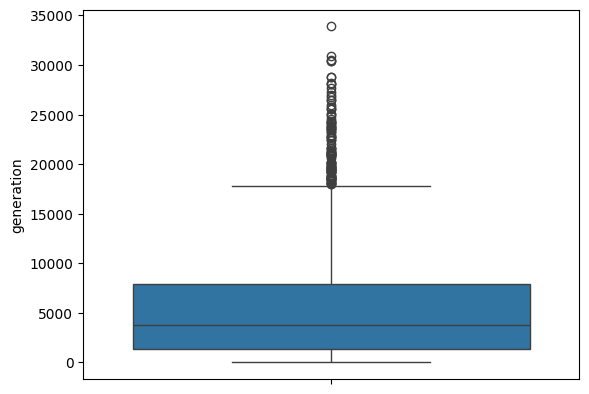

In [14]:
# Con la ayuda de un boxplot identificamos los valores atípicos
sns.boxplot(y='generation', data=df_filter)

<Axes: ylabel='consumption-for-eg-btu'>

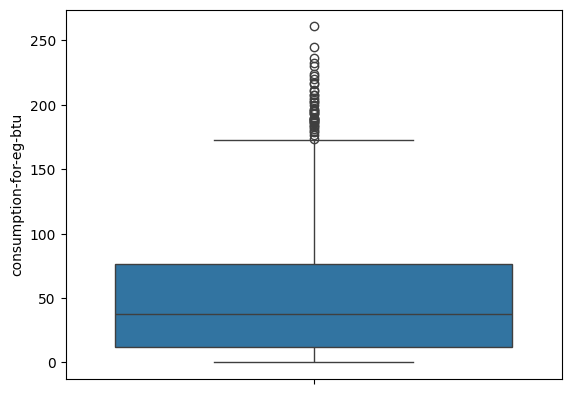

In [15]:
# Con la ayuda de un boxplot identificamos los valores atípicos
sns.boxplot(y='consumption-for-eg-btu', data=df_filter)

In [16]:
# Dado que existen valores atípicos, pero estos pueden tener sentido, vamos a poner un techo en el percentil 95
percentil_95_consumption = df_filter['consumption-for-eg-btu'].quantile(0.95)
percentil_95_generation = df_filter['generation'].quantile(0.95)

In [17]:
# Antes de aplicar el techo, analizamos que valores afectaría
df_test = df_filter[df_filter['generation'] > percentil_95_generation]
len(df_test)

183

In [18]:
print(df_test['fuelTypeDescription'].value_counts())
print('\n')
print(df_test['stateDescription'].value_counts())

fuelTypeDescription
natural gas          173
all coal products      9
all renewables         1
Name: count, dtype: Int64


stateDescription
Texas    183
Name: count, dtype: Int64


In [19]:
# Al ver que prácticamente todos los valores que afecta son en texas y de gas natural, vamos a aplicarlo solamente
# a excluir esta combinación del techo para que no quede una línea recta en el histórico.
df_clip = df_filter[(df_filter['fuelTypeDescription'] != 'natural gas') & (df_filter['stateDescription'] == 'Texas')]
df_clip['generation'] = df_clip['generation'].clip(upper=percentil_95_generation)
df_filter.update(df_clip)

<Axes: ylabel='generation'>

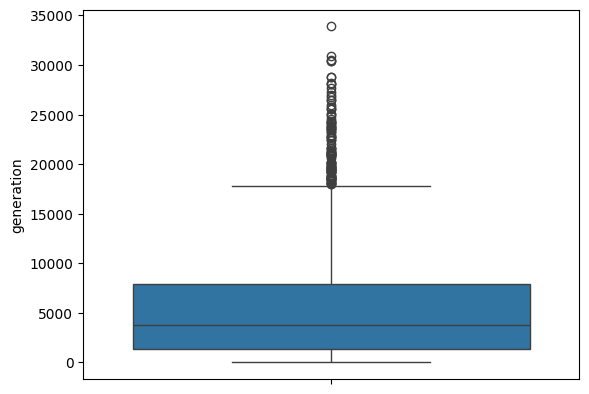

In [20]:
# Observamos los cambios
sns.boxplot(y='generation', data=df_filter)

<Axes: ylabel='consumption-for-eg-btu'>

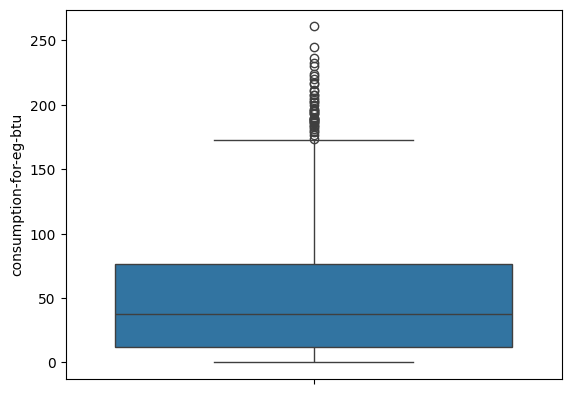

In [21]:
# Observamos los cambios
sns.boxplot(y='consumption-for-eg-btu', data=df_filter)

### Renombramos columnas

In [22]:
df_filter.columns

Index(['period', 'stateDescription', 'sectorDescription',
       'fuelTypeDescription', 'consumption-for-eg-btu',
       'consumption-for-eg-btu-units', 'generation', 'generation-units',
       'year'],
      dtype='object')

In [23]:
# Renombramos las columnas para que tengan mas sentido
df_filter.rename(columns={'period':'date', 'stateDescription':'state', 'sectorDescription':'sector',
                            'fuelTypeDescription':'source'}, inplace=True)

### Convirtiendo consumo en MWh

In [24]:
# Primero creamos la tasa de conversión
factor_conversion = 0.29307107

# En 2022 la EIA realizó un cambio a la hora de cuantificar en BTU el consumo de las energías renovables, lo cual afecta mucho
# nuestros datos. Lo que haremos será calcular un factor de conversión aproximado para llevar los valores previos a 2022
# al equivalente post cambio de metodología.

# https://www.eia.gov/state/seds/seds-change/index.php/

factor_conversion_ren = factor_conversion * 2.5

# Ahora vamos a modificar las columnas existentes de generación y consumo para que esten en MWH y MMBTU
df_filter['generation_mwh'] = df_filter['generation'] * 1000
df_filter['consumption_btu'] = df_filter['consumption-for-eg-btu'] * 1000000

# Finalmente, creamos las columnas de consumption_mwh y eficiencia teniendo en cuenta que las energías renovables utilizan otro
# factor de conversión a partir de 2022
def btu_convert(row):
    if row['date'] >= datetime(2022, 1, 1) and row['source'] == 'all renewables':
        return row['consumption_btu'] * factor_conversion_ren
    else:
        return row['consumption_btu'] * factor_conversion

df_filter['consumption_mwh'] = df_filter.apply(btu_convert, axis=1)
df_filter['efficiency'] = df_filter['generation_mwh'] / df_filter['consumption_mwh']

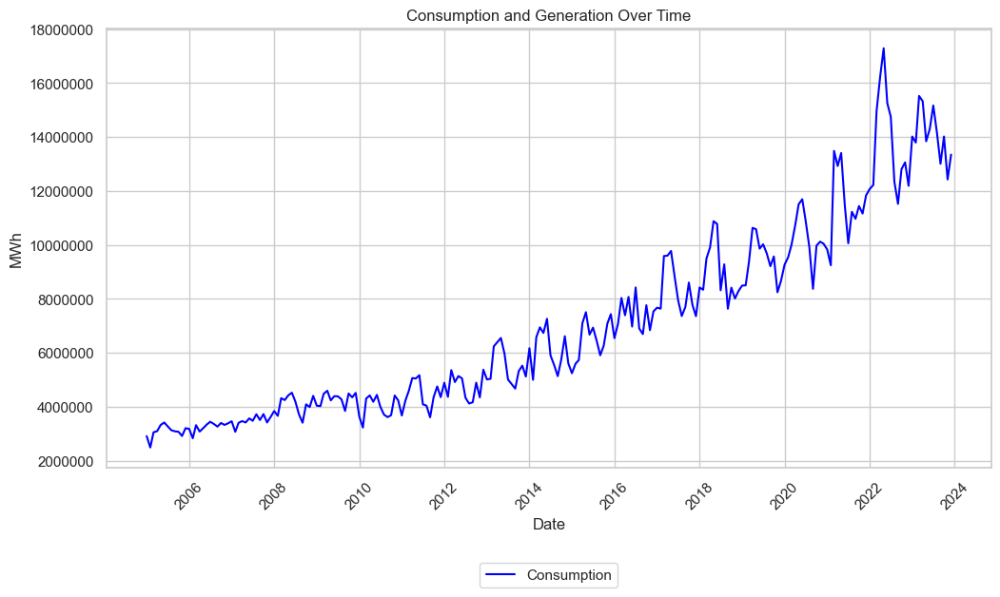

In [25]:
df_filter_ren = df_filter[df_filter['source'] == 'all renewables']

# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='consumption_mwh', data=df_filter_ren, color='blue', label='Consumption', errorbar=None)

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Consumption and Generation Over Time')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos la leyenda en la parte inferior del gráfico
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=False, ncol=2)

# Mostramos el gráfico
plt.show()

Observamos que el ajuste rudimentario funciona, ya que los valores siguen la tendencia de crecimiento exponencial.

## DATASET PIB SECTOR UTILIDADES

In [26]:
# Importamos un archivo .xlsx con la información extraída de Trading Economics
# Elaboración propia a partir de https://tradingeconomics.com/united-states/gdp-from-utilities
df_pib = pd.read_excel('datos_pib.xlsx')
df_pib.head()

,date,pib
0,2005-01-01,72.80
1,2005-02-01,72.80
2,2005-03-01,72.80
3,2005-04-01,72.53
4,2005-05-01,72.53


In [27]:
# Corroboramos los tipos de datos
df_pib.dtypes

date    datetime64[ns]
pib            float64
dtype: object

## DATASET ÍNDICE DE PRODUCCIÓN INDUSTRIAL

In [28]:
# Importamos un archivo .csv con la información extraída del Federal Reserve Bank of St. Louis
df_indpro = pd.read_csv('indpro.csv')
df_indpro.head()

,DATE,INDPRO
0,2005-01-01,95.88
1,2005-02-01,96.56
2,2005-03-01,96.44
3,2005-04-01,96.63
4,2005-05-01,96.73


In [29]:
# Corroboramos los tipos de datos y renombramos columnas
df_indpro.rename(columns={'DATE':'date', 'INDPRO':'indpro'}, inplace=True)
df_indpro.dtypes

date       object
indpro    float64
dtype: object

In [30]:
# Cambiamos los tipos de datos
df_indpro['date'] = pd.to_datetime(df_indpro['date'])
df_indpro['indpro'] = df_indpro['indpro'].astype(float)
df_indpro.dtypes

date      datetime64[ns]
indpro           float64
dtype: object

## DATASET PRECIOS ENERGÍA ELÉCTRICA POR ESTADO

In [31]:
# Importamos los dataset de precios de la energía eléctrica de cada estado
df_price_california = pd.read_excel('California_EnergyPrice_01-24.xlsx', skiprows=9)
df_price_illinois = pd.read_excel('Illinois_EnergyPrice_01-24.xlsx', skiprows=9)
df_price_pennsylvania = pd.read_excel('Pennsylvania_EnergyPrice_01-24.xlsx', skiprows=9)
df_price_texas = pd.read_excel('Texas_EnergyPrice_01-24.xlsx', skiprows=9)

In [32]:
# Observamos las columnas de unos de los dataframes
df_price_california.head()

,Series ID,Year,Period,Value
0,APUS49A72610,2001,M01,0.12
1,APUS49A72610,2001,M02,0.12
2,APUS49A72610,2001,M03,0.12
3,APUS49A72610,2001,M04,0.13
4,APUS49A72610,2001,M05,0.13


In [33]:
# Revisamos los tipos de las columnas para ver si Value necesita ser cambiado
df_price_california.dtypes

Series ID     object
Year           int64
Period        object
Value        float64
dtype: object

In [34]:
# Creamos una columna 'date' que tenga la información de fecha en formato datetime
df_price_california['month_num'] = df_price_california['Period'].str.extract('(\d+)').astype(int)
df_price_california['date'] = pd.to_datetime(df_price_california['Year'].astype(str) + df_price_california['month_num'].astype(str).str.zfill(2), format='%Y%m')
df_price_california = df_price_california.drop(['month_num'], axis=1)

df_price_illinois['month_num'] = df_price_illinois['Period'].str.extract('(\d+)').astype(int)
df_price_illinois['date'] = pd.to_datetime(df_price_illinois['Year'].astype(str) + df_price_illinois['month_num'].astype(str).str.zfill(2), format='%Y%m')
df_price_illinois = df_price_illinois.drop(['month_num'], axis=1)

df_price_pennsylvania['month_num'] = df_price_pennsylvania['Period'].str.extract('(\d+)').astype(int)
df_price_pennsylvania['date'] = pd.to_datetime(df_price_pennsylvania['Year'].astype(str) + df_price_pennsylvania['month_num'].astype(str).str.zfill(2), format='%Y%m')
df_price_pennsylvania = df_price_pennsylvania.drop(['month_num'], axis=1)

df_price_texas['month_num'] = df_price_texas['Period'].str.extract('(\d+)').astype(int)
df_price_texas['date'] = pd.to_datetime(df_price_texas['Year'].astype(str) + df_price_texas['month_num'].astype(str).str.zfill(2), format='%Y%m')
df_price_texas = df_price_texas.drop(['month_num'], axis=1)

In [35]:
# Eliminamos las columnas innecesarias
df_price_california.drop(columns=['Series ID', 'Year', 'Period'], inplace=True)
df_price_california.rename(columns={'Value':'price'}, inplace=True)

df_price_illinois.drop(columns=['Series ID', 'Year', 'Period'], inplace=True)
df_price_illinois.rename(columns={'Value':'price'}, inplace=True)

df_price_pennsylvania.drop(columns=['Series ID', 'Year', 'Period'], inplace=True)
df_price_pennsylvania.rename(columns={'Value':'price'}, inplace=True)

df_price_texas.drop(columns=['Series ID', 'Year', 'Period'], inplace=True)
df_price_texas.rename(columns={'Value':'price'}, inplace=True)

# Creamos una columna de estado para cada dataset
df_price_california['state'] = 'California'
df_price_illinois['state'] = 'Illinois'
df_price_pennsylvania['state'] = 'Pennsylvania'
df_price_texas['state'] = 'Texas'

## UNIENDO DATAFRAMES

In [36]:
# Unimos todos los dataframes en uno solo
df_main = df_filter.copy()
df_main = df_main.merge(df_pib, on='date', how='left') \
    .merge(df_indpro, on='date', how='left') \
    .merge(df_price_california, on=['date', 'state'], how='left', suffixes=('', '_california')) \
    .merge(df_price_illinois, on=['date', 'state'], how='left', suffixes=('', '_illinois')) \
    .merge(df_price_pennsylvania, on=['date', 'state'], how='left', suffixes=('', '_pennsylvania')) \
    .merge(df_price_texas, on=['date', 'state'], how='left', suffixes=('', '_texas'))

# Cambiamos los NaN a 0 para poder unificar las columnas de precio
df_main.fillna({'price':0, 'price_illinois':0, 'price_pennsylvania':0, 'price_texas':0}, inplace=True)

# Unificamos las columnas de precio
df_main['price'] = df_main['price'] + df_main['price_illinois'] + df_main['price_pennsylvania'] + df_main['price_texas']

# Eliminamos las columnas de precio por estado
df_main.drop(columns=['price_illinois', 'price_pennsylvania', 'price_texas'], inplace=True)

In [37]:
# Corroboramos que los tipos de las variables sean correctos
df_main.dtypes

date                            datetime64[ns]
state                                   object
sector                          string[python]
source                          string[python]
consumption-for-eg-btu                 float64
consumption-for-eg-btu-units    string[python]
generation                             float64
generation-units                string[python]
year                                     int64
generation_mwh                         float64
consumption_btu                        float64
consumption_mwh                        float64
efficiency                             float64
pib                                    float64
indpro                                 float64
price                                  float64
dtype: object

In [38]:
# Ordenamos los datos por fecha
df_main.sort_values(by='date', ascending=True, inplace=True)

In [39]:
df_main.isna().sum()

date                            0
state                           0
sector                          0
source                          0
consumption-for-eg-btu          0
consumption-for-eg-btu-units    0
generation                      0
generation-units                0
year                            0
generation_mwh                  0
consumption_btu                 0
consumption_mwh                 0
efficiency                      0
pib                             0
indpro                          0
price                           0
dtype: int64

In [40]:
df_main.head()

,date,state,sector,source,consumption-for-eg-btu,consumption-for-eg-btu-units,generation,generation-units,year,generation_mwh,consumption_btu,consumption_mwh,efficiency,pib,indpro,price
181,2005-01-01,Illinois,All Sectors,all coal products,88.28,million MMBtu,8475.63,thousand megawatthours,2005,8475629.61,88278060.00,25871745.50,0.33,72.80,95.88,0.10
177,2005-01-01,California,All Sectors,nuclear,32.09,million MMBtu,3075.12,thousand megawatthours,2005,3075117.00,32088850.00,9404313.60,0.33,72.80,95.88,0.14
178,2005-01-01,California,All Sectors,natural gas,54.57,million MMBtu,7131.80,thousand megawatthours,2005,7131796.68,54573660.00,15993960.93,0.45,72.80,95.88,0.14
179,2005-01-01,Pennsylvania,All Sectors,all renewables,2.57,million MMBtu,190.64,thousand megawatthours,2005,190643.82,2572810.00,754016.18,0.25,72.80,95.88,0.12
180,2005-01-01,Illinois,All Sectors,all renewables,0.77,million MMBtu,56.55,thousand megawatthours,2005,56550.02,765200.00,224257.98,0.25,72.80,95.88,0.10


## ANÁLISIS EXPLORATIORIO

In [41]:
# Primero creamos una copia de df_main para no alterarlo
df_exp = df_main.copy()

### Filtrando el dataset para 2022

Como nuestro objetivo es predecir 2023, vamos a limitar todo nuestro análisis a lo que sería 2022 con el fin de simular que no tenemos los datos de consumo. La razón por la cual creamos el dataset con todos los datos es porque es mucho más simple utilizar las variables exógenas para 2023 y luego comparar los datos si creamos el dataset con todo y luego seleccionamos con que parte nos quedamos para entrenar y analizar.

In [42]:
# Creamos un dataset hasta 2022-12-31 y uno con toda la información para poder predecir 2023 luego
df_exp_2023 = df_exp.copy()
df_exp = df_exp[df_exp['date'] < '2023-01-01']

### Generación y consumo a lo largo del tiempo

In [43]:
# Comenzamos creando el dataset agrupado a nivel de estado y mes para tener la serie temporal
df_grouped = df_exp.groupby(['state', 'date']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum', 'pib': 'sum', 'indpro':'sum', 'price':'sum'}).reset_index()
df_grouped['efficiency'] = df_grouped['generation_mwh'] / df_grouped['consumption_mwh']

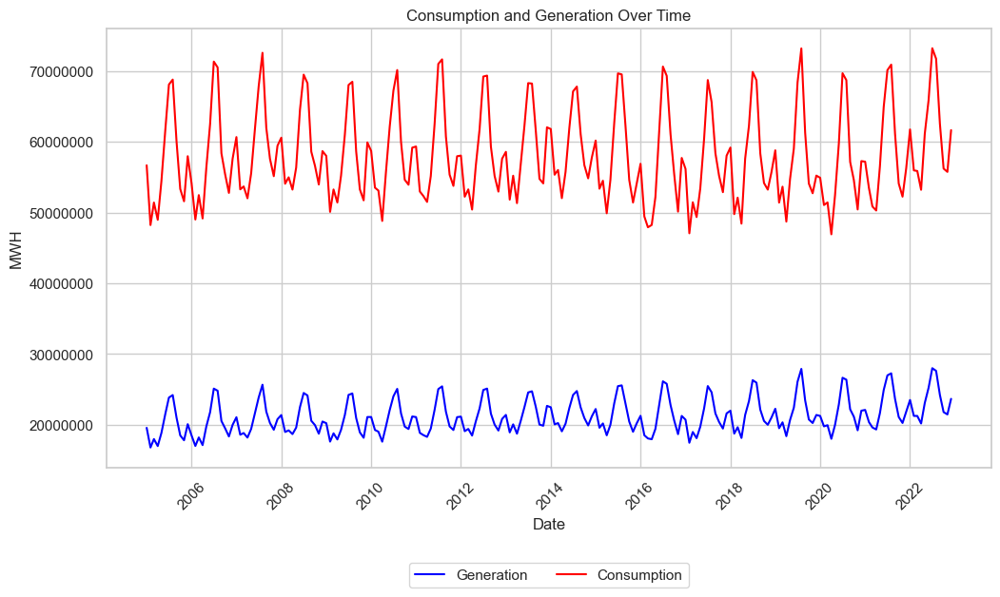

In [44]:
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='generation_mwh', data=df_grouped, color='blue', label='Generation', errorbar=None)
sns.lineplot(x='date', y='consumption_mwh', data=df_grouped, color='red', label='Consumption', errorbar=None)


# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Consumption and Generation Over Time')
plt.xlabel('Date')
plt.ylabel('MWH')

# Mostramos la leyenda en la parte inferior del gráfico
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=False, ncol=2)

# Mostramos el gráfico
plt.show()

In [45]:
# Calculemos los promedios para tener una referencia
df_grouped[['generation_mwh', 'consumption_mwh']].mean()

generation_mwh    21210761.22
consumption_mwh   58048201.01
dtype: float64

###Evolución de la eficiencia a lo largo del tiempo

In [46]:
df_grouped.head()

,state,date,generation_mwh,consumption_mwh,pib,indpro,price,efficiency
0,California,2005-01-01,12160790.02,35229296.69,291.20,383.53,0.56,0.35
1,California,2005-02-01,10332303.47,29622861.77,291.20,386.25,0.54,0.35
2,California,2005-03-01,11830729.43,34161134.70,291.20,385.75,0.54,0.35
3,California,2005-04-01,11373478.99,33192965.62,290.13,386.51,0.54,0.34
4,California,2005-05-01,11701783.94,34967736.62,290.13,386.92,0.58,0.33


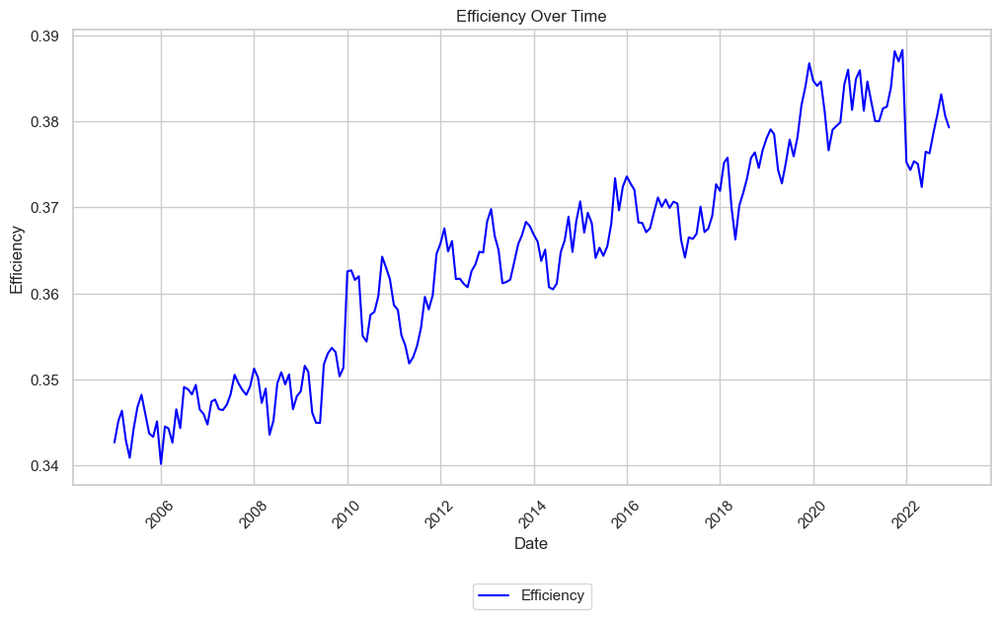

In [47]:
# Definimos el estilo del plot
sns.set(style="whitegrid")


# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='efficiency', data=df_grouped, color='blue', label='Efficiency', errorbar=None)


# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Efficiency Over Time')
plt.xlabel('Date')
plt.ylabel('Efficiency')

# Mostramos la leyenda en la parte inferior del gráfico
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=False, ncol=2)

# Mostramos el gráfico
plt.show()

### Evolución variables independientes

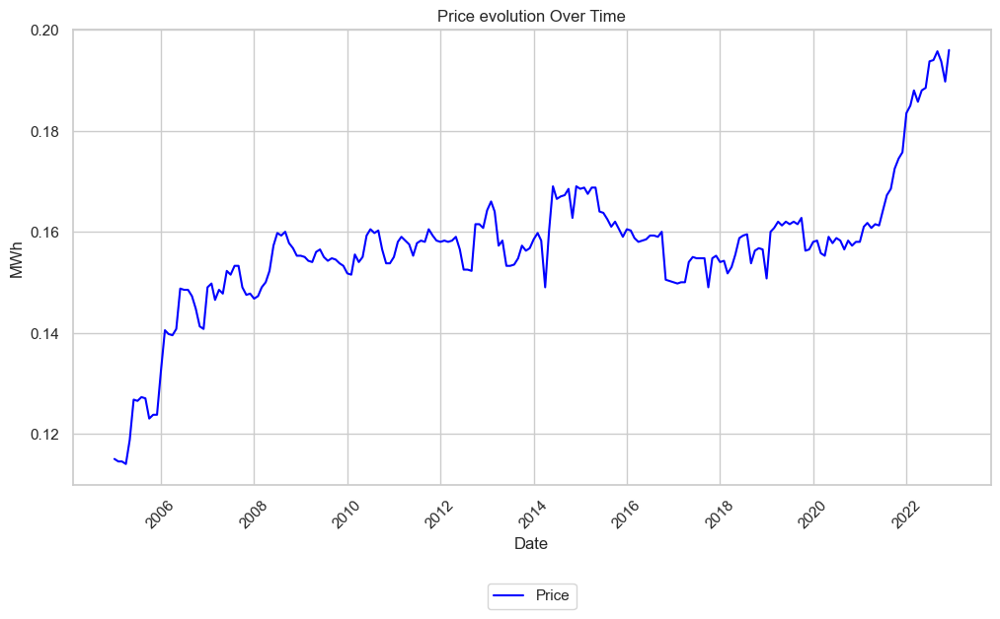

In [48]:
# Definimos el estilo del plot
sns.set(style="whitegrid")


# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='price', data=df_exp, color='blue', label='Price', errorbar=None)


# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Price evolution Over Time')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos la leyenda en la parte inferior del gráfico
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=False, ncol=2)

# Mostramos el gráfico
plt.show()

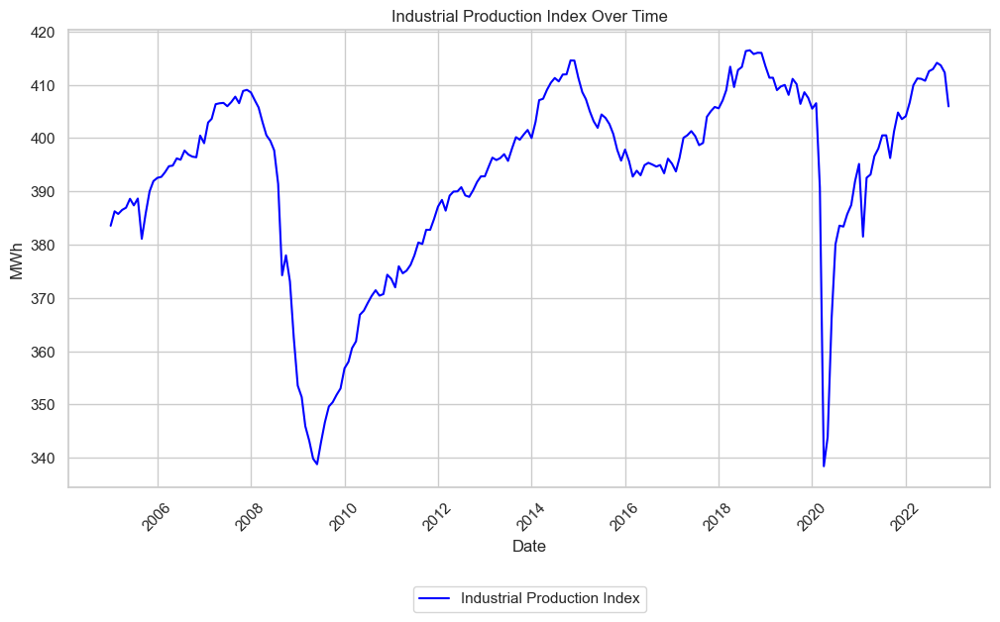

In [49]:
# Definimos el estilo del plot
sns.set(style="whitegrid")


# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='indpro', data=df_grouped, color='blue', label='Industrial Production Index', errorbar=None)


# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Industrial Production Index Over Time')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos la leyenda en la parte inferior del gráfico
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=False, ncol=2)

# Mostramos el gráfico
plt.show()

### Matriz de correlación entre las variables exogenas

                generation_mwh  price  indpro  pib
generation_mwh            1.00  -0.23    0.03 0.04
price                    -0.23   1.00    0.10 0.26
indpro                    0.03   0.10    1.00 0.31
pib                       0.04   0.26    0.31 1.00


<Axes: >

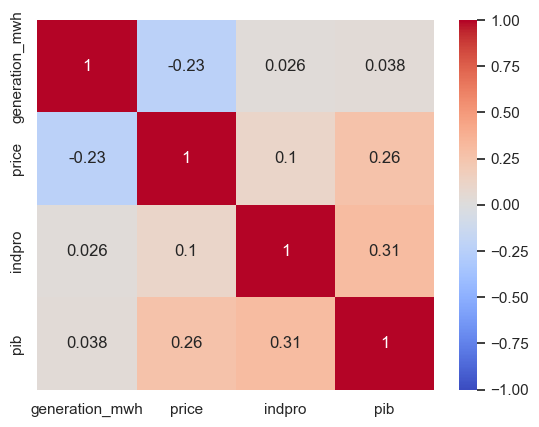

In [50]:
# Columnas que se quieren analizar
selected_columns = df_exp[['generation_mwh', 'price', 'indpro', 'pib']]

# Se calcula la matriz de correlación
correlation_matrix = selected_columns.corr()
print(correlation_matrix)


# Mapa de calor para la matriz de correlación
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)



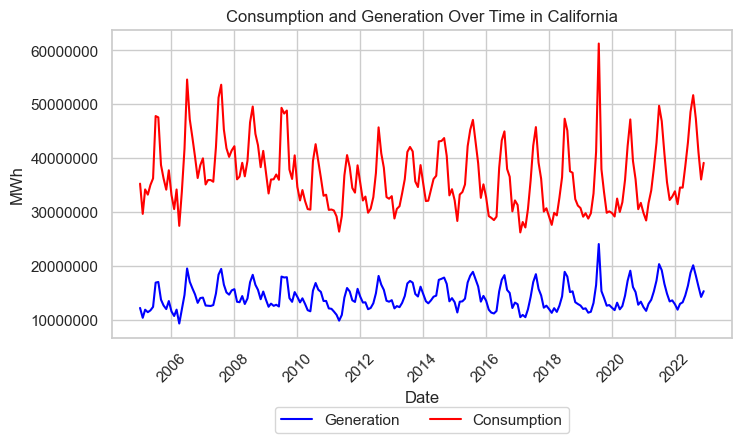

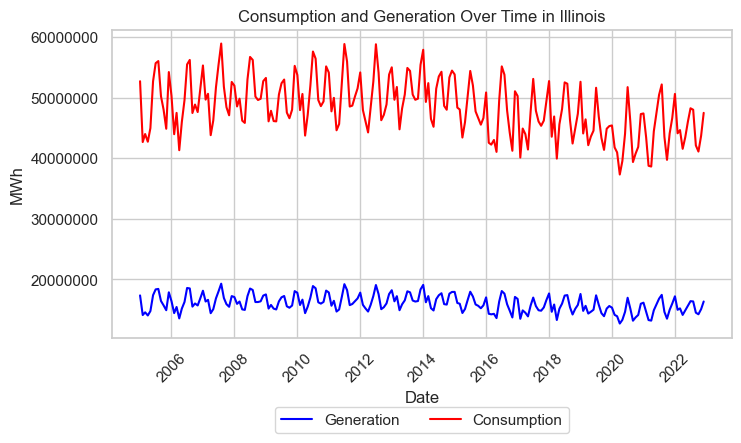

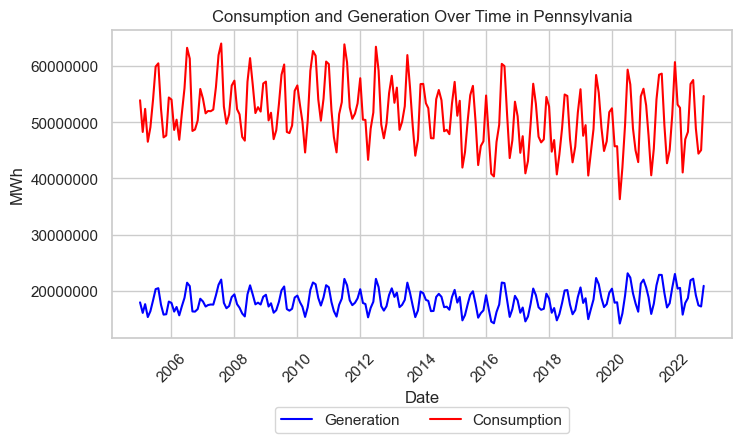

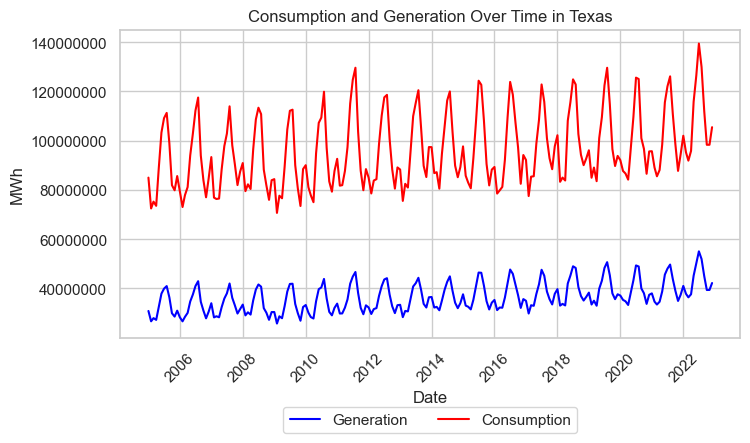

In [51]:
# Ahora vamos a ver un gráfico por cada estado

# Obtenemos los estados
unique_states = df_grouped['state'].unique()

# Definimos el estilo del plot
sns.set(style="whitegrid")

# Hacemos un loop para iterar por cada estado y graficar
for state in unique_states:
    # Filtramos los datos por el estado
    data_state = df_grouped[df_grouped['state'] == state]

    # Creamos el gráfico
    plt.figure(figsize=(8, 4))
    sns.lineplot(x='date', y='generation_mwh', data=data_state, color='blue', label='Generation', errorbar=None)
    sns.lineplot(x='date', y='consumption_mwh', data=data_state, color='red', label='Consumption', errorbar=None)

    # Ajustamos formato de fechas en el eje x
    plt.xticks(rotation=45)

    # Ajustamos formato del eje y para mostrar valores completos
    plt.ticklabel_format(style='plain', axis='y')

    # Añadimos título y etiquetas
    plt.title(f'Consumption and Generation Over Time in {state}')
    plt.xlabel('Date')
    plt.ylabel('MWh')

    # Mostramos la leyenda en el gráfico
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=False, ncol=2)

    # Mostramos el gráfico
    plt.show()


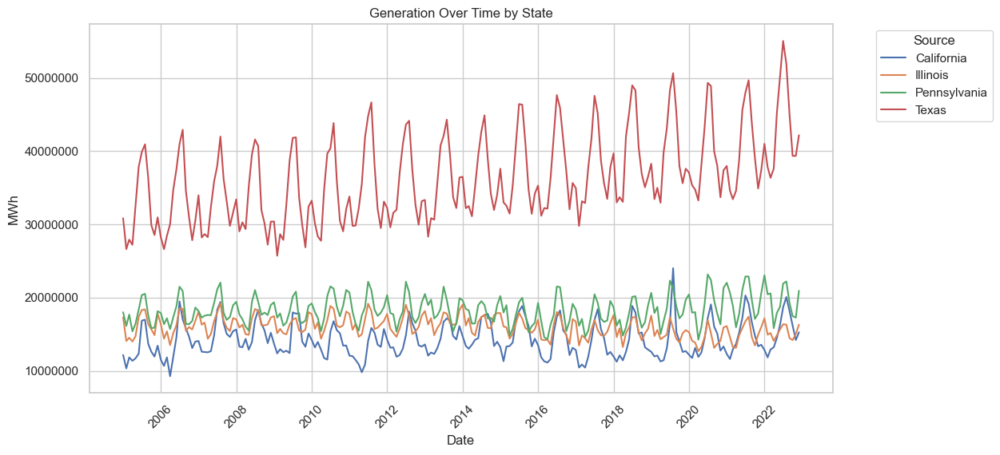

In [52]:
# Vemos generación entre estados
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='generation_mwh', data=df_grouped, errorbar=None, hue='state')

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Leyenda fuera de la gráfica
plt.legend(title='Source', bbox_to_anchor=(1.05, 1), loc='upper left')

# Añadimos título y etiquetas
plt.title('Generation Over Time by State')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos el gráfico
plt.show()

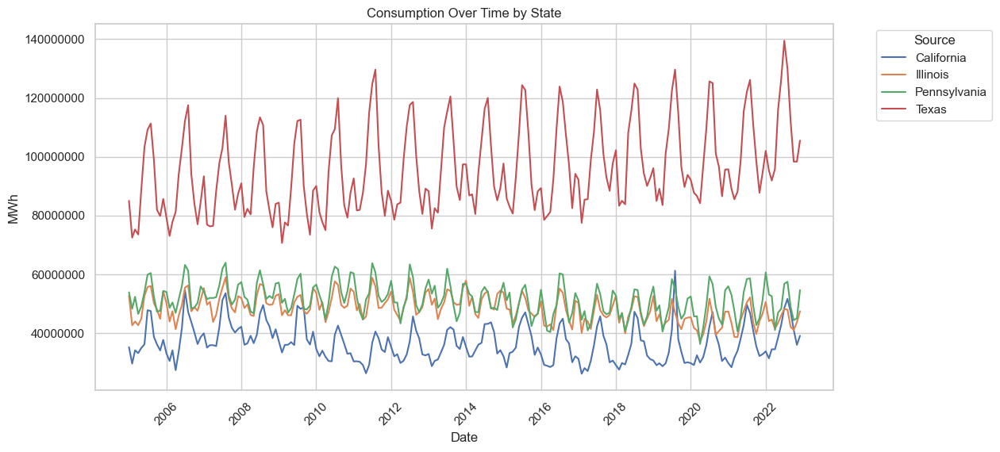

In [53]:
# Vemos consumo entre estados
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='consumption_mwh', data=df_grouped, errorbar=None, hue='state')

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Leyenda fuera de la gráfica
plt.legend(title='Source', bbox_to_anchor=(1.05, 1), loc='upper left')

# Añadimos título y etiquetas
plt.title('Consumption Over Time by State')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos el gráfico
plt.show()

### Distribución de generación y consumo por fuente y estado

In [54]:
# Creamos el dataframe para poder hacer los gráficos de torta
df_grouped_2 = df_exp.groupby(['state', 'source', 'year']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum'}).reset_index()

# Ahora filtramos para tener los últimos 2 años de datos
df_grouped_2 = df_grouped_2[df_grouped_2['year'] >= 2022]

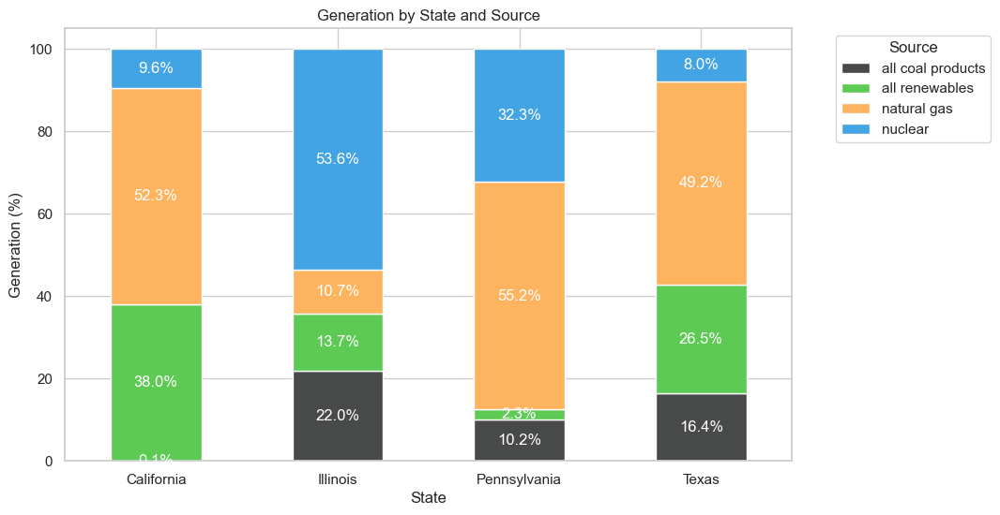

In [55]:
# Creamos una pivot table para hacer los cálculos y poder graficar
df_pivot = df_grouped_2.pivot_table(index='state', columns='source', values='generation_mwh', aggfunc='sum').fillna(0)
df_pivot = df_pivot.div(df_pivot.sum(axis=1), axis=0) * 100  # Convertimos a porcentaje
df_pivot.reset_index(inplace=True)

# Hacemos un melt de la pivot table para identificar las id variables y las metricas
df_melted = pd.melt(df_pivot, id_vars='state', var_name='source', value_name='generation_mwh')

# Define los colores para cada tipo de energía
colors = {
    'all coal products': '#484949',
    'all renewables': '#5DCA54',
    'natural gas': '#FEB35E',
    'nuclear':  '#42A4E3'
}

# Plot stacked bar chart
ax = df_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), color=[colors[col] for col in df_pivot.columns[1:]])
plt.title('Generation by State and Source')
plt.xlabel('State')
plt.ylabel('Generation (%)')
plt.xticks(range(len(df_pivot)), df_pivot['state'], rotation=0)
plt.legend(title='Source')

# Put the legend outside the plot
plt.legend(title='Source', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add labels to the bars
for index, row in df_pivot.iterrows():
    total = 0
    for i, source in enumerate(df_pivot.columns[1:]):
        plt.text(index, total + row[source]/2, f"{row[source]:.1f}%", ha='center', va='center', color='white')
        total += row[source]

plt.show()

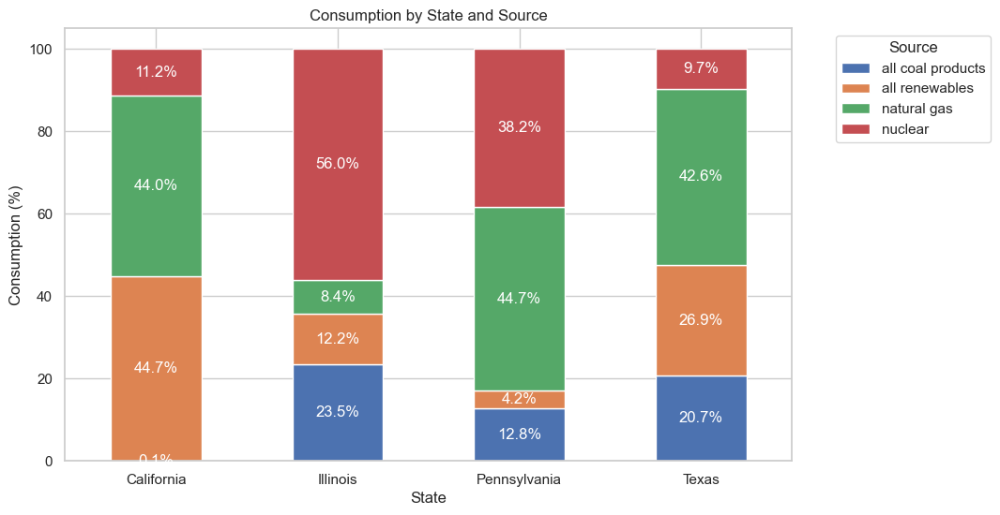

In [56]:
# Creamos una pivot table para hacer los cálculos y poder graficar
df_pivot = df_grouped_2.pivot_table(index='state', columns='source', values='consumption_mwh', aggfunc='sum').fillna(0)
df_pivot = df_pivot.div(df_pivot.sum(axis=1), axis=0) * 100  # Convertimos a porcentaje
df_pivot.reset_index(inplace=True)

# Hacemos un melt de la pivot table para identificar las id variables y las metricas
df_melted = pd.melt(df_pivot, id_vars='state', var_name='source', value_name='consumption_mwh')

# Plot stacked bar chart
df_pivot.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Consumption by State and Source')
plt.xlabel('State')
plt.ylabel('Consumption (%)')
plt.xticks(range(len(df_pivot)), df_pivot['state'], rotation=0)
plt.legend(title='Source')

# Put the legend outside the plot
plt.legend(title='Source', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add labels to the bars
for index, row in df_pivot.iterrows():
    total = 0
    for i, source in enumerate(df_pivot.columns[1:]):
        plt.text(index, total + row[source]/2, f"{row[source]:.1f}%", ha='center', va='center', color='white')
        total += row[source]

plt.show()

### VARIACIÓN PORCENTUAL MENSUAL

In [57]:
# Creamos el dataframe para poder hacer los gráficos de torta
df_grouped_3= df_exp.groupby(['state', 'source','year']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum'}).reset_index()
df_grouped_3['year'] = df_grouped_3['year'].astype(str)

# Ahora filtramos para tener los últimos 2 años de datos
#df_grouped_2 = df_grouped_2[df_grouped_2['year'] >= 2022]

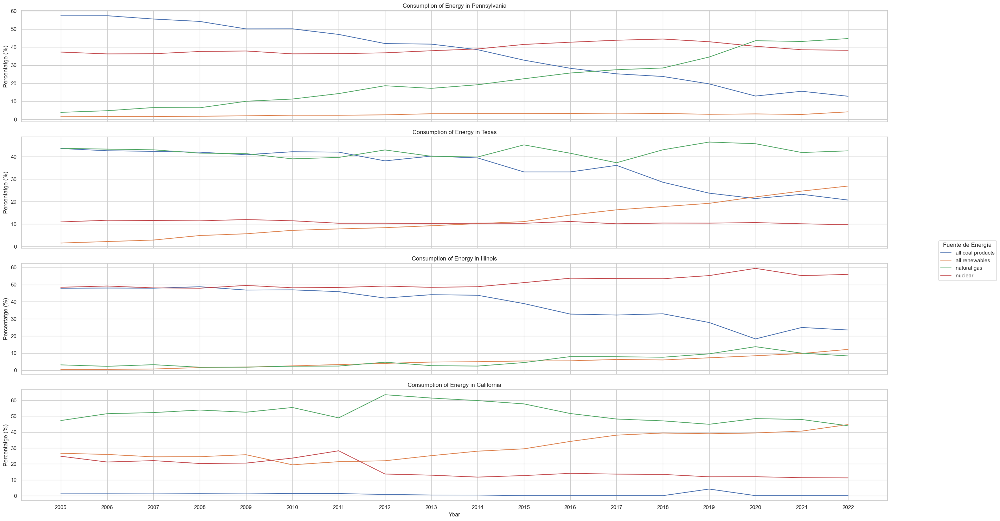

In [58]:
# Lista de estados para analizar
states = ['Pennsylvania', 'Texas', 'Illinois', 'California']

# Configurar los subplots en 1 columna con un tamaño de figura alargado
fig, axs = plt.subplots(nrows=len(states), ncols=1, figsize=(30, 15), sharex=True)

# Variable para almacenar las etiquetas de la leyenda
handles, labels = [], []

for i, state in enumerate(states):
    # Filtrar por estado
    df_state = df_grouped_3[df_grouped_3['state'] == state]

    # Crear pivot table por año
    df_pivot = df_state.pivot_table(index='year', columns='source', values='consumption_mwh', aggfunc='sum').fillna(0)

    # Convertir a porcentaje sobre el total por año
    df_pivot = df_pivot.div(df_pivot.sum(axis=1), axis=0) * 100

    # Graficar en el subplot correspondiente
    lines = axs[i].plot(df_pivot.index, df_pivot, label=df_pivot.columns)

    # Solo necesitamos obtener las leyendas una vez
    if i == 0:
        handles, labels = axs[i].get_legend_handles_labels()

    # Configuración del subplot
    axs[i].set_title(f'Consumption of Energy in {state}')
    axs[i].set_ylabel('Percentatge (%)')

    # Solo la última gráfica tiene etiqueta en el eje X
    if i == len(states) - 1:
        axs[i].set_xlabel('Year')

    # Establecer ticks y etiquetas del eje x basados en los años
    #ticks = range(int(df_pivot.index.min()), int(df_pivot.index.max()) + 1)  # Rango de años
    #axs[i].set_xticks(ticks)
    #axs[i].set_xticklabels(ticks)  # Establecer etiquetas de los ticks como los años

# Colocar la leyenda fuera de los gráficos en el lado derecho
fig.legend(handles, labels, loc='center right', bbox_to_anchor=(0.95, 0.5), title='Fuente de Energía')

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Ajustar el layout para evitar solapamientos
plt.show()

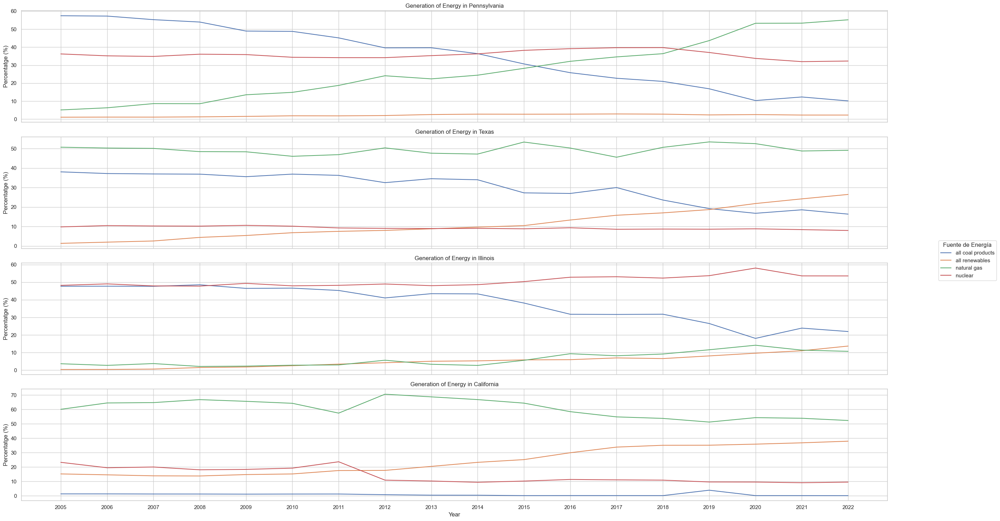

In [59]:
# Lista de estados para analizar
states = ['Pennsylvania', 'Texas', 'Illinois', 'California']

# Configurar los subplots en 1 columna con un tamaño de figura alargado
fig, axs = plt.subplots(nrows=len(states), ncols=1, figsize=(30, 15), sharex=True)

# Variable para almacenar las etiquetas de la leyenda
handles, labels = [], []

for i, state in enumerate(states):
    # Filtrar por estado
    df_state = df_grouped_3[df_grouped_3['state'] == state]

    # Crear pivot table por año
    df_pivot = df_state.pivot_table(index='year', columns='source', values='generation_mwh', aggfunc='sum').fillna(0)

    # Convertir a porcentaje sobre el total por año
    df_pivot = df_pivot.div(df_pivot.sum(axis=1), axis=0) * 100

    # Graficar en el subplot correspondiente
    lines = axs[i].plot(df_pivot.index, df_pivot, label=df_pivot.columns)

    # Solo necesitamos obtener las leyendas una vez
    if i == 0:
        handles, labels = axs[i].get_legend_handles_labels()

    # Configuración del subplot
    axs[i].set_title(f'Generation of Energy in {state}')
    axs[i].set_ylabel('Percentatge (%)')

    # Solo la última gráfica tiene etiqueta en el eje X
    if i == len(states) - 1:
        axs[i].set_xlabel('Year')

    # Establecer ticks y etiquetas del eje x basados en los años
    #ticks = range(int(df_pivot.index.min()), int(df_pivot.index.max()) + 1)  # Rango de años
    #axs[i].set_xticks(ticks)
    #axs[i].set_xticklabels(ticks)  # Establecer etiquetas de los ticks como los años

# Colocar la leyenda fuera de los gráficos en el lado derecho
fig.legend(handles, labels, loc='center right', bbox_to_anchor=(0.95, 0.5), title='Fuente de Energía')

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Ajustar el layout para evitar solapamientos
plt.show()

In [60]:
# Creamos un dataset para cada estado
df_texas = df_grouped[df_grouped['state'] == 'Texas']
df_california = df_grouped[df_grouped['state'] == 'California']
df_illinois = df_grouped[df_grouped['state'] == 'Illinois']
df_penn = df_grouped[df_grouped['state'] == 'Pennsylvania']

# Creamos la columna de variación mensual porcentual
df_texas['generation_variation'] = df_texas['generation_mwh'].pct_change() * 100
df_texas['consumption_variation'] = df_texas['consumption_mwh'].pct_change() * 100

df_california['generation_variation'] = df_california['generation_mwh'].pct_change() * 100
df_california['consumption_variation'] = df_california['consumption_mwh'].pct_change() * 100

df_illinois['generation_variation'] = df_illinois['generation_mwh'].pct_change() * 100
df_illinois['consumption_variation'] = df_illinois['consumption_mwh'].pct_change() * 100

df_penn['generation_variation'] = df_penn['generation_mwh'].pct_change() * 100
df_penn['consumption_variation'] = df_penn['consumption_mwh'].pct_change() * 100

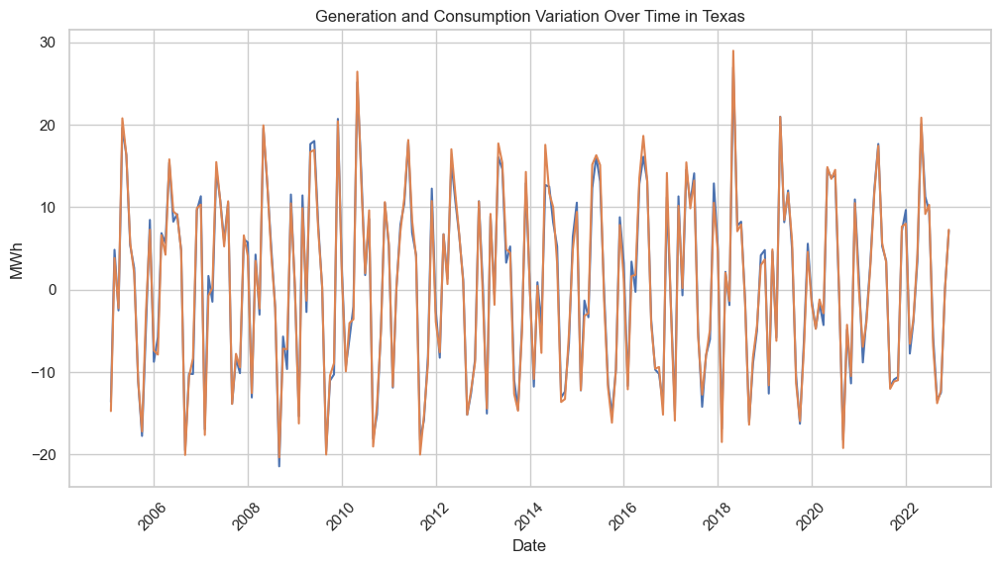

In [61]:
# Ahora graficamos
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='generation_variation', data=df_texas, errorbar=None, legend=True)
sns.lineplot(x='date', y='consumption_variation', data=df_texas, errorbar=None, legend=True)

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Generation and Consumption Variation Over Time in Texas')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos el gráfico
plt.show()

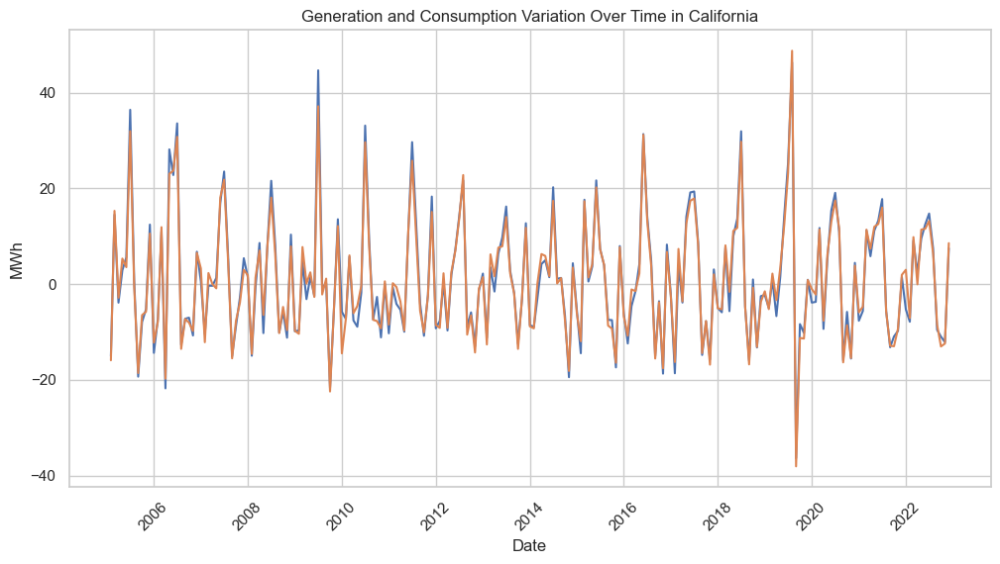

In [62]:
# Ahora graficamos
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='generation_variation', data=df_california, errorbar=None)
sns.lineplot(x='date', y='consumption_variation', data=df_california, errorbar=None)

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Generation and Consumption Variation Over Time in California')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos el gráfico
plt.show()

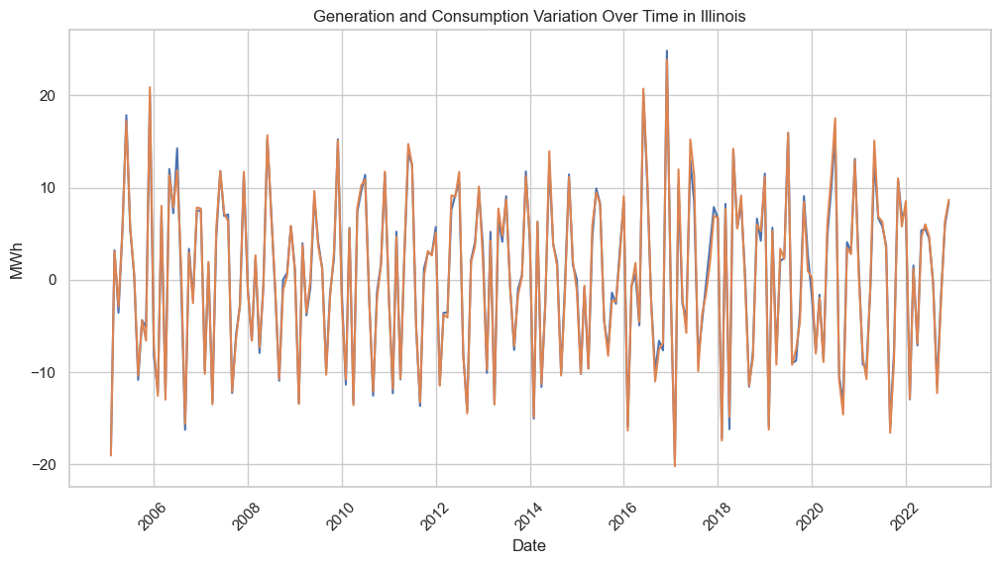

In [63]:
# Ahora graficamos
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='generation_variation', data=df_illinois, errorbar=None)
sns.lineplot(x='date', y='consumption_variation', data=df_illinois, errorbar=None)

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Generation and Consumption Variation Over Time in Illinois')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos el gráfico
plt.show()

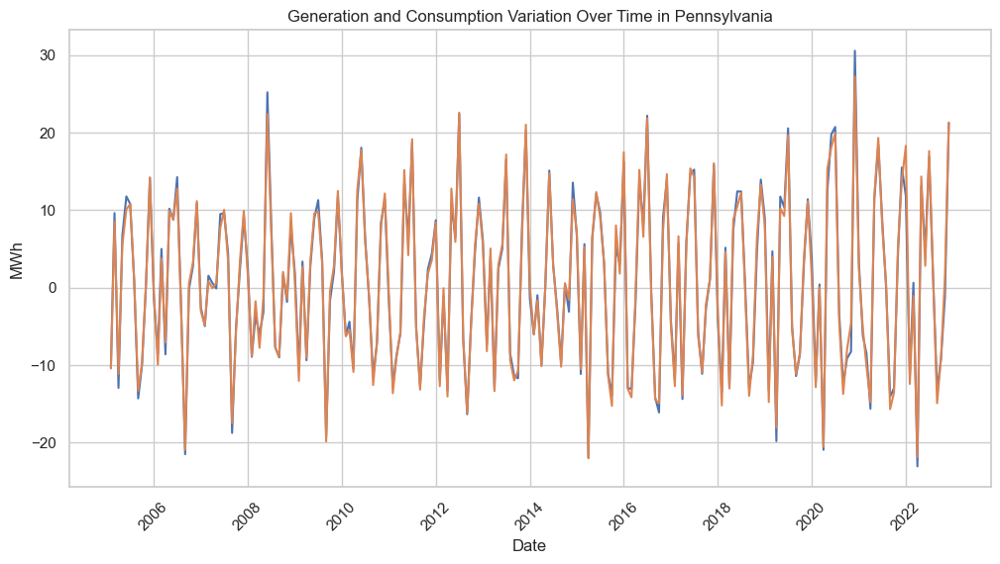

In [64]:
# Ahora graficamos
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='generation_variation', data=df_penn, errorbar=None)
sns.lineplot(x='date', y='consumption_variation', data=df_penn, errorbar=None)

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Generation and Consumption Variation Over Time in Pennsylvania')
plt.xlabel('Date')
plt.ylabel('MWh')

# Mostramos el gráfico
plt.show()

In [65]:
# Hacer las variaciones anuales

### VARIACIÓN ANUAL

In [66]:
# Creamos una variable anual mensual y luego agrupamos
df_exp['year'] = df_exp['date'].dt.year
df_grouped_a = df_exp.groupby(['state', 'year']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum'}).reset_index()

In [67]:
df_grouped_a.head()

,state,year,generation_mwh,consumption_mwh
0,California,2005,155298369.25,445409107.39
1,California,2006,163800474.51,461239880.49
2,California,2007,178636523.20,497889264.77
3,California,2008,179538425.57,492487663.08
4,California,2009,172816867.21,476387528.37


In [68]:
# Creamos un dataset para cada estado
df_texas_a = df_grouped_a[df_grouped_a['state'] == 'Texas']
df_california_a = df_grouped_a[df_grouped_a['state'] == 'California']
df_illinois_a = df_grouped_a[df_grouped_a['state'] == 'Illinois']
df_penn_a = df_grouped_a[df_grouped_a['state'] == 'Pennsylvania']

# Creamos la columna de variación mensual porcentual
df_texas_a['generation_variation'] = df_texas_a['generation_mwh'].pct_change() * 100
df_texas_a['consumption_variation'] = df_texas_a['consumption_mwh'].pct_change() * 100

df_california_a['generation_variation'] = df_california_a['generation_mwh'].pct_change() * 100
df_california_a['consumption_variation'] = df_california_a['consumption_mwh'].pct_change() * 100

df_illinois_a['generation_variation'] = df_illinois_a['generation_mwh'].pct_change() * 100
df_illinois_a['consumption_variation'] = df_illinois_a['consumption_mwh'].pct_change() * 100

df_penn_a['generation_variation'] = df_penn_a['generation_mwh'].pct_change() * 100
df_penn_a['consumption_variation'] = df_penn_a['consumption_mwh'].pct_change() * 100

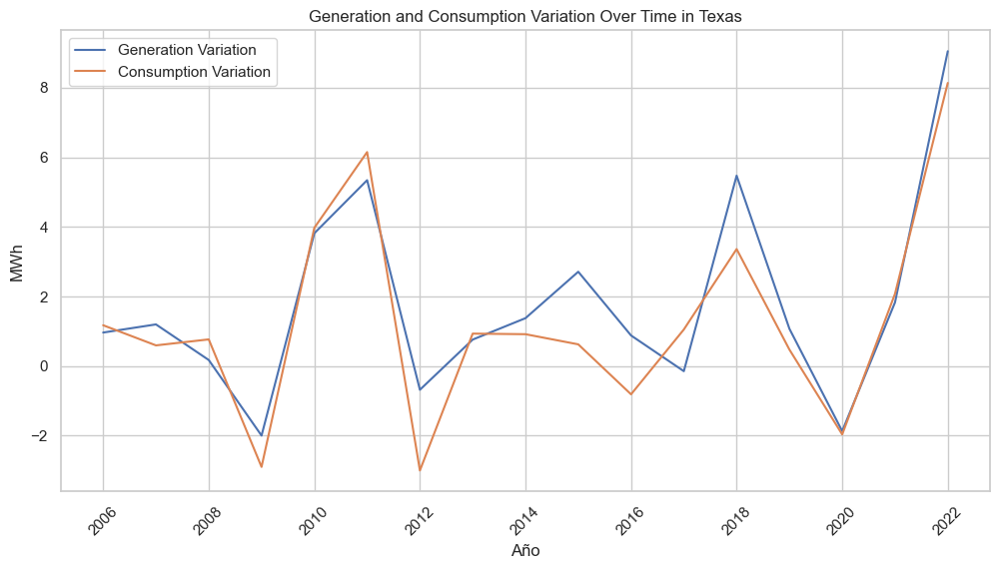

In [69]:
# Ahora graficamos
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='generation_variation', data=df_texas_a, errorbar=None, label='Generation Variation')
sns.lineplot(x='year', y='consumption_variation', data=df_texas_a, errorbar=None, label='Consumption Variation')

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Generation and Consumption Variation Over Time in Texas')
plt.xlabel('Año')
plt.ylabel('MWh')
plt.legend()

# Mostramos el gráfico
plt.show()

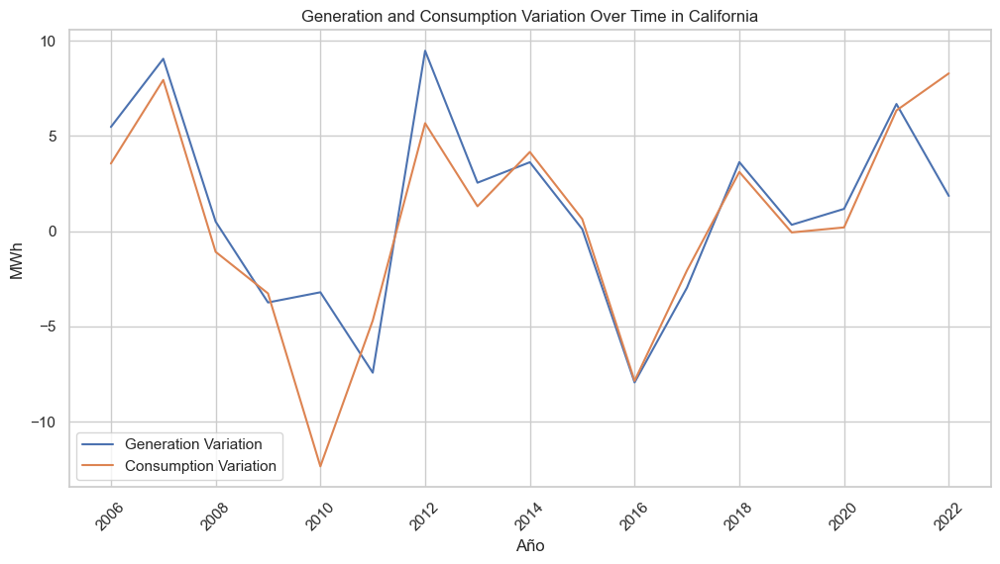

In [70]:
# Ahora graficamos
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='generation_variation', data=df_california_a, errorbar=None, label='Generation Variation')
sns.lineplot(x='year', y='consumption_variation', data=df_california_a, errorbar=None, label='Consumption Variation')

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Generation and Consumption Variation Over Time in California')
plt.xlabel('Año')
plt.ylabel('MWh')
plt.legend()

# Mostramos el gráfico
plt.show()

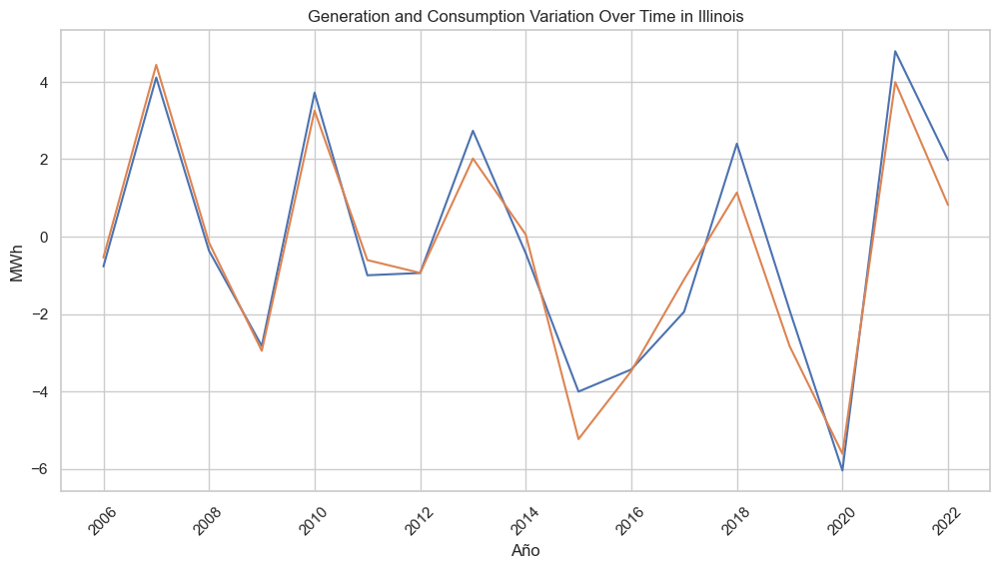

In [71]:
# Ahora graficamos
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='generation_variation', data=df_illinois_a, errorbar=None, legend=True)
sns.lineplot(x='year', y='consumption_variation', data=df_illinois_a, errorbar=None, legend=True)

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Generation and Consumption Variation Over Time in Illinois')
plt.xlabel('Año')
plt.ylabel('MWh')

# Mostramos el gráfico
plt.show()

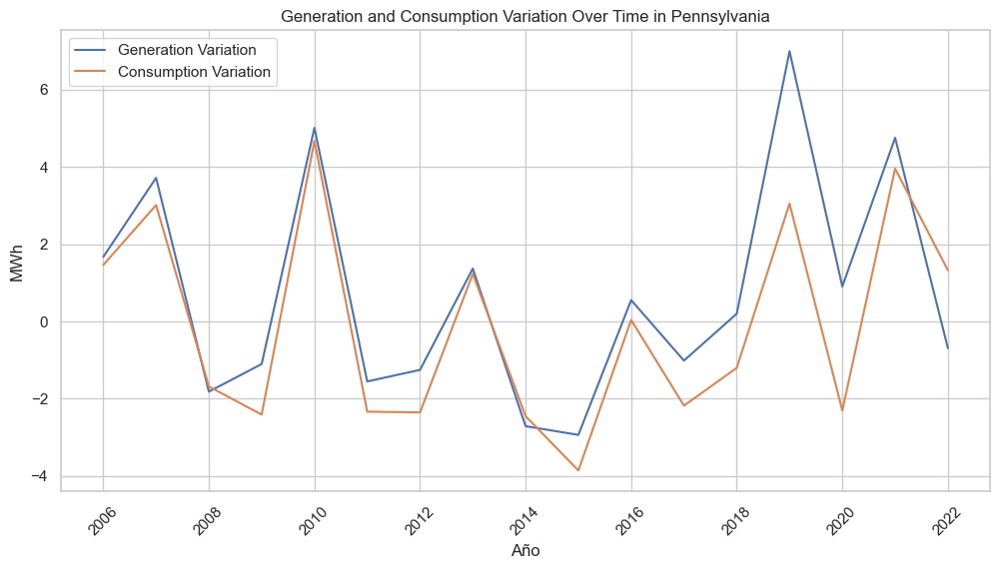

In [72]:
# Ahora graficamos
# Definimos el estilo del plot
sns.set(style="whitegrid")

# Creamos el gráfico
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='generation_variation', data=df_penn_a, errorbar=None, label='Generation Variation')
sns.lineplot(x='year', y='consumption_variation', data=df_penn_a, errorbar=None, label='Consumption Variation')

# Ajustamos formato de fechas en el eje x
plt.xticks(rotation=45)

# Ajustamos formato del eje y para mostrar valores completos
plt.ticklabel_format(style='plain', axis='y')

# Añadimos título y etiquetas
plt.title('Generation and Consumption Variation Over Time in Pennsylvania')
plt.xlabel('Año')
plt.ylabel('MWh')
plt.legend()
\
# Mostramos el gráfico
plt.show()

# SARIMAX MODEL

## Preparaciones Previas

In [ ]:
# Importamos las librerías necesarias
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from pmdarima.model_selection import SlidingWindowForecastCV

# Librerías para evaluar los modelos
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
# Comenzamos creando el dataset agrupado a nivel de mes para tener la serie temporal
df_grouped_pred = df_exp.groupby(['date']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum', 'pib':'mean', 'indpro':'mean', 'price':'mean'}).reset_index()
df_grouped_pred.set_index('date', inplace=True)
df_grouped_pred.index.freq = 'MS'

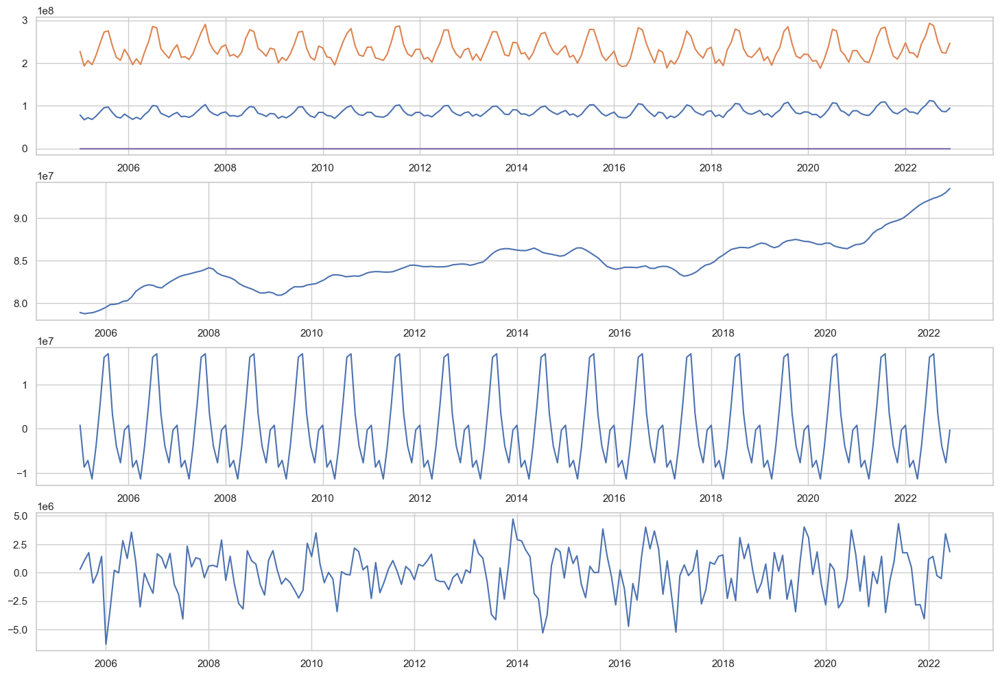

In [ ]:
# Ahora realizamos la decomposición estacional de la serie para deducir con que parámetros vamos a empezar a probar nuestro modelo
result = seasonal_decompose(df_grouped_pred['generation_mwh'], model='additive')

# Graficamos los resultados
plt.figure(figsize=(18, 12))

plt.subplot(411)
plt.plot(df_grouped_pred, label='Original')

plt.subplot(412)
plt.plot(result.trend, label='Trend')

plt.subplot(413)
plt.plot(result.seasonal, label='Seasonal')

plt.subplot(414)
plt.plot(result.resid, label='Residual')

plt.show()

### Probando Modelos - Modelo Simple

Vamos a encontrar el mejor modelo utilizando el año 2022 con el fin de no darle datos de 2023 al modelo en ningún momento. Al momento de ir probando el poder predictivo del modelo, si utilizaremos los datos de 2023 como test, es decir, como herramienta para evaluar nuestras predicciones.

In [ ]:
# Vamos a comenzar probando con un modelo muy simple, sin diferenciar por medias y con el resto de los componentes = 1
# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_train = df_grouped_pred[df_grouped_pred.index < '2022-01-01']
df_test = df_grouped_pred[df_grouped_pred.index >= '2022-01-01']

# Creamos el modelo
exog_var = ['pib', 'indpro', 'price']
model_simple = SARIMAX(df_train['generation_mwh'], order=(1, 0, 1), seasonal_order=(0, 1, 0, 12), exog=df_train[exog_var])
results_simple = model_simple.fit()

# Definimos la ventana de tiempo para las predicciones
start = '2022-01-01'
end = '2022-11-30'

# Predecimos
predictions_simple = results_simple.predict(start=start, end=end, seasonal=True, exog=df_test[exog_var]).rename('predictions')

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.54189D+01    |proj g|=  6.20033D-01

At iterate    5    f=  1.53113D+01    |proj g|=  6.29093D-02

At iterate   10    f=  1.53076D+01    |proj g|=  4.58556D-03

At iterate   15    f=  1.53065D+01    |proj g|=  8.05148D-03

At iterate   20    f=  1.53000D+01    |proj g|=  2.49169D-03

At iterate   25    f=  1.52992D+01    |proj g|=  2.20712D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     29     35      1     0     0   

 This problem is unconstrained.


<Axes: xlabel='date'>

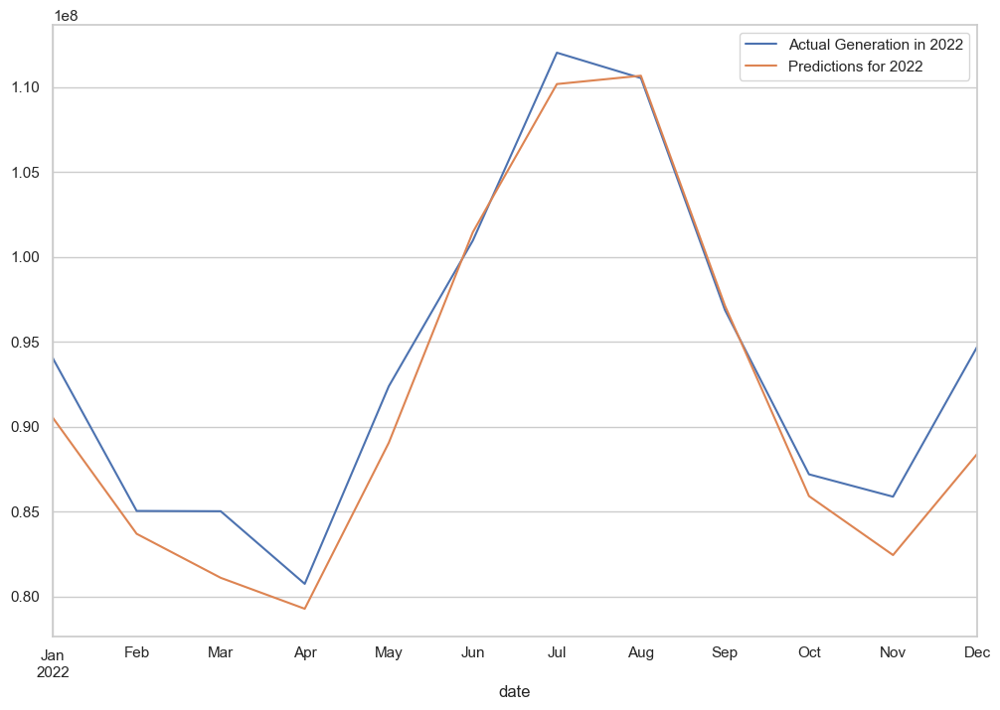

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo
df_test['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_simple.plot(figsize=(12,8), legend=True, label = 'Predictions for 2022')

In [ ]:
# Por último, calculamos las métricas de evaluación
# Calculate Mean Absolute Error (MAE)
mae_simple = mean_absolute_error(df_test['generation_mwh'], predictions_simple)

# Calculate Mean Squared Error (MSE)
mse_simple = mean_squared_error(df_test['generation_mwh'], predictions_simple)

# Calculate Root Mean Squared Error (RMSE)
rmse_simple = np.sqrt(mse_simple)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_simple = np.mean(np.abs((df_test['generation_mwh'] - predictions_simple) / df_test['generation_mwh'])) * 100

# R2
r2_simple = r2_score(df_test['generation_mwh'], predictions_simple)

print("Mean Absolute Error (MAE):", mae_simple)
print("Mean Squared Error (MSE):", mse_simple)
print("Root Mean Squared Error (RMSE):", rmse_simple)
print("Mean Absolute Percentage Error (MAPE):", mape_simple)
print("R2 Score:", r2_simple)

Mean Absolute Error (MAE): 2277966.512916006
Mean Squared Error (MSE): 8304802909404.105
Root Mean Squared Error (RMSE): 2881805.4947209926
Mean Absolute Percentage Error (MAPE): 2.5006539484942474
R2 Score: 0.9098954779907947


### Probando Modelos - Auto Arima

In [ ]:
# Si bien nuestro modelo parece ser muy bueno, utilizaremos un auto arima que nos indica de manera automática el mejor modelo para nuestros datos
# Notar que no queremos un modelo muy complejo, con lo cual limitamos el valor máximo de los parámetros AR, MA, SAR, SMA, d y D a 5.

# Configurando la validación cruzada
cv = SlidingWindowForecastCV(window_size=36, step=12, h=1) # Indicamos el entrenamiento es con 36 meses, que los test van a ser anuales y que el horizonte de predicción es 1 año

# Configurando el auto_arima
model_auto_arima_aic = auto_arima(df_grouped_pred['generation_mwh'], seasonal=True, m=12, max_order=None, max_p=5, max_d=5, max_q=5, max_P=5, max_D=5, max_Q=5, max_S=12, information_criterion='aic', trace=True, cv=cv, stepwise=True, exogenous=df_grouped_pred[exog_var])
model_auto_arima_bic = auto_arima(df_grouped_pred['generation_mwh'], seasonal=True, m=12, max_order=None, max_p=5, max_d=5, max_q=5, max_P=5, max_D=5, max_Q=5, max_S=12, information_criterion='bic', trace=True, cv=cv, stepwise=True, exogenous=df_grouped_pred[exog_var])

Performing stepwise search to minimize aic


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=7271.807, Time=1.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=7445.490, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=7337.262, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=7376.544, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=7443.512, Time=0.01 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=7312.542, Time=0.51 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=inf, Time=2.02 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(2,1,2)(2,0,2)[12] intercept   : AIC=inf, Time=2.12 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(3,1,2)(1,0,1)[12] intercept   : A

In [ ]:
# Obtenemos el mejor modelo según AIC
print('Mejor modelo AIC:', model_auto_arima_aic)
print('\n')
# Y según BIC
print('Mejor modelo BIC:', model_auto_arima_bic)

Mejor modelo AIC:  ARIMA(2,1,2)(1,0,1)[12] intercept


Mejor modelo BIC:  ARIMA(2,1,2)(1,0,1)[12] intercept


In [ ]:
# Analizamos los summary de cada modelo
print(model_auto_arima_aic.summary())
print('\n')
print(model_auto_arima_bic.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                  216
Model:             SARIMAX(2, 1, 2)x(1, 0, [1], 12)   Log Likelihood               -3627.904
Date:                              Sun, 07 Jul 2024   AIC                           7271.807
Time:                                      12:08:39   BIC                           7298.772
Sample:                                  01-01-2005   HQIC                          7282.702
                                       - 12-01-2022                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   4.762e+04   1.25e-08   3.82e+12      0.000    4.76e+04    4.76e+04
ar.L1         -1.16

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67815D+01    |proj g|=  6.48340D-02

At iterate    5    f=  1.67400D+01    |proj g|=  3.47316D-03


 This problem is unconstrained.



At iterate   10    f=  1.67384D+01    |proj g|=  3.26672D-03

At iterate   15    f=  1.67342D+01    |proj g|=  1.03347D-02

At iterate   20    f=  1.67339D+01    |proj g|=  1.21465D-03

At iterate   25    f=  1.67338D+01    |proj g|=  2.91956D-03

At iterate   30    f=  1.67329D+01    |proj g|=  2.97279D-02

At iterate   35    f=  1.67321D+01    |proj g|=  7.15073D-02

At iterate   40    f=  1.67320D+01    |proj g|=  8.98656D-04

At iterate   45    f=  1.67320D+01    |proj g|=  4.67734D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10     45     68      1     0     0   4.677D-03   1.673D+01
  F =   16.7319844628

<Axes: xlabel='date'>

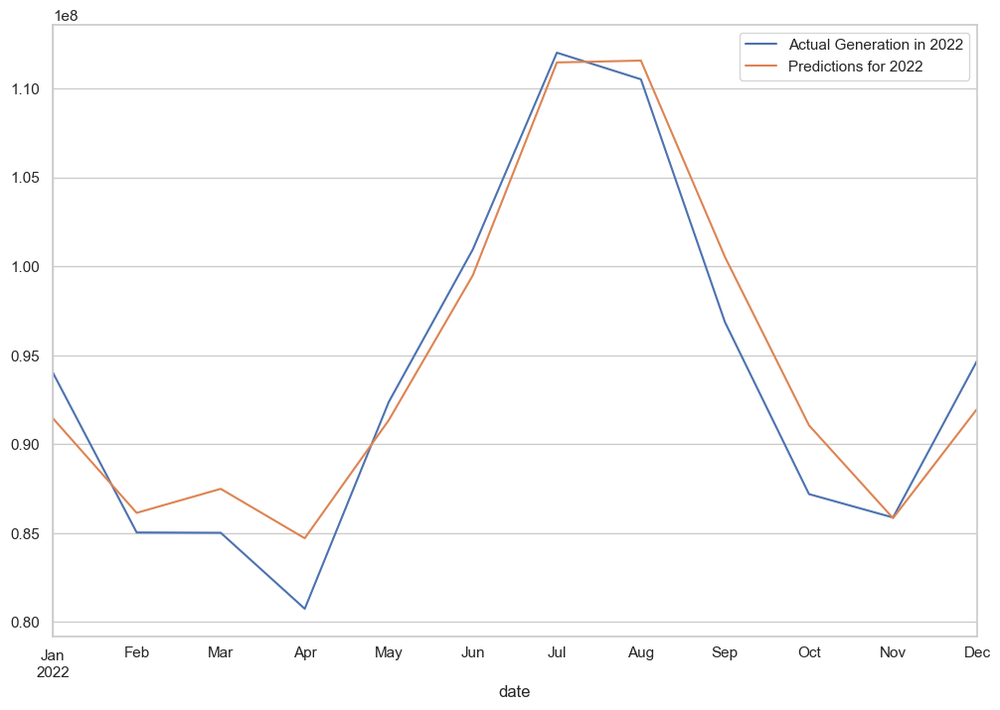

In [ ]:
# Notar que dependiendo de la versión de las librerías, los resultados pueden variar. En nuestro caso, tanto el AIC como el BIC daban el mismo modelo
# (2,1,2)(1,0,1)[12]

# Creando el modelo con los parámetros del auto-arima según AIC
model_aic = SARIMAX(df_train['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train[exog_var])
results_aic = model_aic.fit()
predictions_aic = results_aic.predict(start=start, end=end, seasonal=True, exog=df_test[exog_var]).rename('predictions')

# Graficamos
df_test['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_aic.plot(figsize=(12,8), legend=True, label = 'Predictions for 2022')

In [ ]:
# Calculamos métricas
# Calculate Mean Absolute Error (MAE)
mae_aic = mean_absolute_error(df_test['generation_mwh'], predictions_aic)

# Calculate Mean Squared Error (MSE)
mse_aic = mean_squared_error(df_test['generation_mwh'], predictions_aic)

# Calculate Root Mean Squared Error (RMSE)
rmse_aic = np.sqrt(mse_aic)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_aic = np.mean(np.abs((df_test['generation_mwh'] - predictions_aic) / df_test['generation_mwh'])) * 100

# R2
r2_aic = r2_score(df_test['generation_mwh'], predictions_aic)

print("Mean Absolute Error (MAE):", mae_aic)
print("Mean Squared Error (MSE):", mse_aic)
print("Root Mean Squared Error (RMSE):", rmse_aic)
print("Mean Absolute Percentage Error (MAPE):", mape_aic)
print("R2 Score:", r2_aic)

Mean Absolute Error (MAE): 2038965.0201648027
Mean Squared Error (MSE): 5830466345108.425
Root Mean Squared Error (RMSE): 2414635.861803685
Mean Absolute Percentage Error (MAPE): 2.246668613920932
R2 Score: 0.9367412581794252


Observamos que el modelo funciona muy bien e incluso el error es menor, utilizaremos el enfoque del AIC. A continuación, evaluaremos las predicciones con y sin variables exógenas.

### Auto Arima - Sin Variables Exógenas

In [ ]:
# Si bien nuestro modelo parece ser muy bueno, utilizaremos un auto arima que nos indica de manera automática el mejor modelo para nuestros datos
# Notar que no queremos un modelo muy complejo, con lo cual limitamos el valor máximo de los parámetros AR, MA, SAR, SMA, d y D a 5.

# Configurando la validación cruzada
cv = SlidingWindowForecastCV(window_size=36, step=12, h=1) # Indicamos el entrenamiento es con 36 meses, que los test van a ser anuales y que el horizonte de predicción es 1 año

# Configurando el auto_arima
model_auto_arima_aic = auto_arima(df_grouped_pred['generation_mwh'], seasonal=True, m=12, max_order=None, max_p=5, max_d=5, max_q=5, max_P=5, max_D=5, max_Q=5, max_S=12, information_criterion='aic', trace=True, cv=cv, stepwise=True)
model_auto_arima_bic = auto_arima(df_grouped_pred['generation_mwh'], seasonal=True, m=12, max_order=None, max_p=5, max_d=5, max_q=5, max_P=5, max_D=5, max_Q=5, max_S=12, information_criterion='bic', trace=True, cv=cv, stepwise=True)

Performing stepwise search to minimize aic


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=7271.807, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=7445.490, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=7337.262, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=7376.544, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=7443.512, Time=0.00 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=7312.542, Time=0.50 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=inf, Time=2.02 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=2.14 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(2,1,2)(2,0,2)[12] intercept   : AIC=inf, Time=2.13 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(2,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(3,1,2)(1,0,1)[12] intercept   : A

In [ ]:
# Obtenemos el mejor modelo según AIC
print('Mejor modelo AIC:', model_auto_arima_aic)
print('\n')
# Y según BIC
print('Mejor modelo BIC:', model_auto_arima_bic)

Mejor modelo AIC:  ARIMA(2,1,2)(1,0,1)[12] intercept


Mejor modelo BIC:  ARIMA(2,1,2)(1,0,1)[12] intercept


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.69675D+01    |proj g|=  2.09616D-01



At iterate    5    f=  1.68042D+01    |proj g|=  1.26895D-03


 This problem is unconstrained.



At iterate   10    f=  1.68037D+01    |proj g|=  2.31334D-02

At iterate   15    f=  1.67991D+01    |proj g|=  6.38594D-03

At iterate   20    f=  1.67983D+01    |proj g|=  1.13309D-03

At iterate   25    f=  1.67979D+01    |proj g|=  2.29509D-03

At iterate   30    f=  1.67979D+01    |proj g|=  2.58964D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     30     35      1     0     0   2.590D-05   1.680D+01
  F =   16.797922376284010     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


<Axes: xlabel='date'>

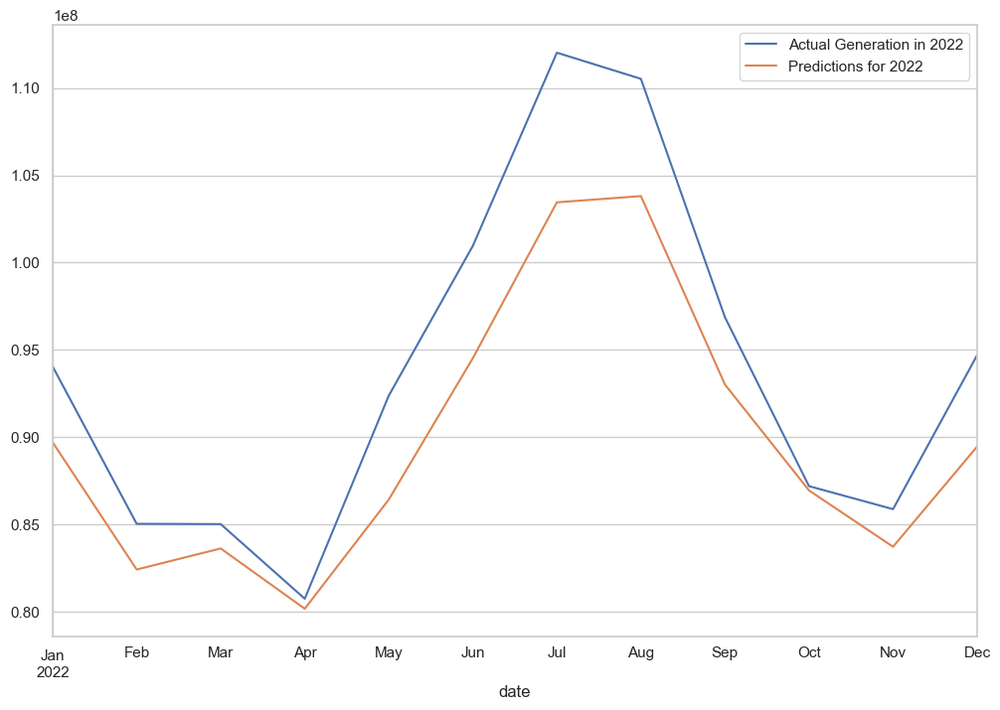

In [ ]:
# Notar que dependiendo de la versión de las librerías, los resultados pueden variar. En nuestro caso, tanto el AIC como el BIC daban el mismo modelo
# (2,1,1)(1,0,1)[12]

# Creando el modelo con los parámetros del auto-arima pero sin utilizar variables exógenas
model_sv = SARIMAX(df_train['generation_mwh'], order=(2, 1, 1), seasonal_order=(1, 0, 1, 12))
results_sv = model_sv.fit()
predictions_sv = results_sv.predict(start=start, end=end, seasonal=True).rename('predictions')

# Graficamos
df_test['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_sv.plot(figsize=(12,8), legend=True, label = 'Predictions for 2022')

In [ ]:
# Calculamos métricas
# Calculate Mean Absolute Error (MAE)
mae_sv = mean_absolute_error(df_test['generation_mwh'], predictions_sv)

# Calculate Mean Squared Error (MSE)
mse_sv = mean_squared_error(df_test['generation_mwh'], predictions_sv)

# Calculate Root Mean Squared Error (RMSE)
rmse_sv = np.sqrt(mse_sv)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_sv = np.mean(np.abs((df_test['generation_mwh'] - predictions_sv) / df_test['generation_mwh'])) * 100

# R2
r2_sv = r2_score(df_test['generation_mwh'], predictions_sv)

print("Mean Absolute Error (MAE):", mae_sv)
print("Mean Squared Error (MSE):", mse_sv)
print("Root Mean Squared Error (RMSE):", rmse_sv)
print("Mean Absolute Percentage Error (MAPE):", mape_sv)
print("R2 Score:", r2_sv)

Mean Absolute Error (MAE): 4007567.9453530773
Mean Squared Error (MSE): 22529989697874.28
Root Mean Squared Error (RMSE): 4746576.629306039
Mean Absolute Percentage Error (MAPE): 4.073806906168632
R2 Score: 0.7555566369551637


### Con vs Sin Variables Exógenas - Varios Años

In [ ]:
# Comenzamos creando los datasets de entrenamiento y testeo
df_train_2019 = df_grouped_pred[df_grouped_pred.index < '2019-01-01']
df_test_2019 = df_grouped_pred[(df_grouped_pred.index >= '2019-01-01') & (df_grouped_pred.index < '2020-01-31')]

df_train_2020 = df_grouped_pred[df_grouped_pred.index < '2020-01-01']
df_test_2020 = df_grouped_pred[(df_grouped_pred.index >= '2020-01-01') & (df_grouped_pred.index < '2021-01-31')]

df_train_2021 = df_grouped_pred[df_grouped_pred.index < '2021-01-01']
df_test_2021 = df_grouped_pred[(df_grouped_pred.index >= '2021-01-01') & (df_grouped_pred.index < '2022-01-31')]

df_train_2022 = df_grouped_pred[df_grouped_pred.index < '2022-01-01']
df_test_2022 = df_grouped_pred[(df_grouped_pred.index >= '2022-01-01') & (df_grouped_pred.index <= '2022-12-31')]

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.69633D+01    |proj g|=  5.60087D-02



At iterate    5    f=  1.68161D+01    |proj g|=  1.14161D-01

At iterate   10    f=  1.67937D+01    |proj g|=  9.32859D-02


 This problem is unconstrained.



At iterate   15    f=  1.67851D+01    |proj g|=  6.92940D-03

At iterate   20    f=  1.67848D+01    |proj g|=  6.73551D-03

At iterate   25    f=  1.67813D+01    |proj g|=  6.39508D-02

At iterate   30    f=  1.67804D+01    |proj g|=  8.26277D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f=  1.67801D+01    |proj g|=  1.46089D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10     36     70      2     0     0   1.410D-03   1.678D+01
  F =   16.780118158807788     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.89232D+01    |proj g|=  4.23158D+00

At iterate    5    f=  1.67718D+01    |proj g|=  3.47232D-02

At iterate   10    f=  1.67574D+01    |proj g|=  1.40493D-02

At iter

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   20    f=  1.67382D+01    |proj g|=  3.00410D-03

At iterate   25    f=  1.67373D+01    |proj g|=  8.25203D-03

At iterate   30    f=  1.67371D+01    |proj g|=  9.36750D-04

At iterate   35    f=  1.67367D+01    |proj g|=  4.27449D-03

At iterate   40    f=  1.67362D+01    |proj g|=  6.78317D-02

At iterate   45    f=  1.67361D+01    |proj g|=  8.55786D-03

At iterate   50    f=  1.67361D+01    |proj g|=  1.10420D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   10     50     65      1     0     0   1.104D-03   1.674D+01
  F =   16.736117316067311     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67815D+01    |proj g|=  6.48340D-02

At iterate    5    f=  1.67400D+01    |proj g|=  3.47316D-03

At iterate   10    f=  1.67384D+01    |proj g|=  3.26672D-03

At iterate   15    f=  1.67342D+01    |proj g|=  1.03347D-02

At iterate   20    f=  1.67339D+01    |proj g|=  1.21465D-03

At iterate   25    f=  1.67338D+01    |proj g|=  2.91956D-03

At iterate   30    f=  1.67329D+01    |proj g|=  2.97279D-02

At iterate   35    f=  1.67321D+01    |proj g|=  7.15073D-02

At iterate   40    f=  1.67320D+01    |proj g|=  8.98656D-04

At iterate   45    f=  1.67320D+01    |proj g|=  4.67734D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

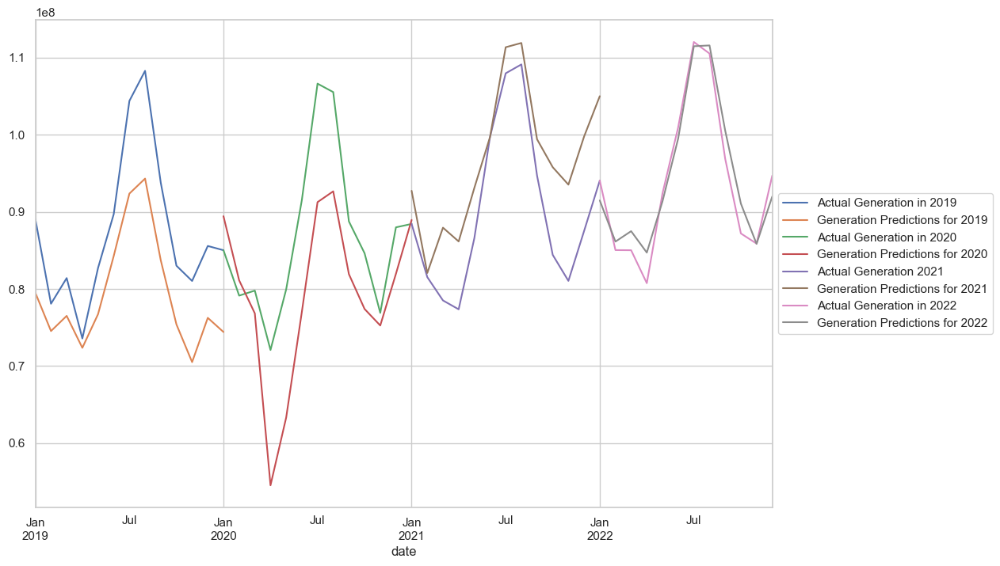

In [ ]:
# CON VARIABLES EXÓGENAS

# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 8057702.523483533
Mean Absolute Error (MAE) 2020: 8346296.751880189
Mean Absolute Error (MAE) 2021: 6732671.792719396
Mean Absolute Error (MAE) 2022: 2038965.0201648027
Promedio MAE: 6293909.02206198


Mean Squared Error (MSE) 2010: 77218008699796.94
Mean Squared Error (MSE) 2020: 105123904827176.02
Mean Squared Error (MSE) 2021: 63396225247471.92
Mean Squared Error (MSE) 2022: 5830466345108.425
Promedio MSE: 62892151279888.33


Root Mean Squared Error (RMSE) 2019: 8787377.805682248
Root Mean Squared Error (RMSE) 2020: 10252994.919884434
Root Mean Squared Error (RMSE) 2021: 7962174.655674913
Root Mean Squared Error (RMSE) 2022: 2414635.861803685
Promedio RMSE: 7354295.8107613195


Mean Absolute Percentage Error (MAPE) 2019: 8.992062217160298
Mean Absolute Percentage Error (MAPE) 2020: 9.598956203795492
Mean Absolute Percentage Error (MAPE) 2021: 7.816644512512188
Mean Absolute Percentage Error (MAPE) 2022: 2.246668613920932
Promedio MAPE: 7.16358288684

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.70950D+01    |proj g|=  4.35356D-02


 This problem is unconstrained.



At iterate    5    f=  1.69879D+01    |proj g|=  5.12167D-01

At iterate   10    f=  1.68345D+01    |proj g|=  8.07706D-02

At iterate   15    f=  1.68258D+01    |proj g|=  8.67463D-03

At iterate   20    f=  1.68147D+01    |proj g|=  1.65395D-01

At iterate   25    f=  1.68104D+01    |proj g|=  2.01853D-03

At iterate   30    f=  1.68095D+01    |proj g|=  1.29899D-02

At iterate   35    f=  1.68094D+01    |proj g|=  8.90726D-03

At iterate   40    f=  1.68091D+01    |proj g|=  3.90083D-02

At iterate   45    f=  1.68091D+01    |proj g|=  4.47214D-03

At iterate   50    f=  1.68091D+01    |proj g|=  1.14011D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87278D+01    |proj g|=  3.93849D+00

At iterate    5    f=  1.68287D+01    |proj g|=  3.22727D-02

At iterate   10    f=  1.68126D+01    |proj g|=  6.25807D-02

At iterate   15    f=  1.68001D+01    |proj g|=  1.92282D-02

At iterate   20    f=  1.67988D+01    |proj g|=  1.20012D-02

At iterate   25    f=  1.67983D+01    |proj g|=  6.89360D-04

At iterate   30    f=  1.67980D+01    |proj g|=  8.08768D-03

At iterate   35    f=  1.67977D+01    |proj g|=  1.37441D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.



At iterate   15    f=  1.67776D+01    |proj g|=  3.17609D-02

At iterate   20    f=  1.67715D+01    |proj g|=  3.40519D-03

At iterate   25    f=  1.67714D+01    |proj g|=  1.50464D-03

At iterate   30    f=  1.67710D+01    |proj g|=  7.74353D-03

At iterate   35    f=  1.67708D+01    |proj g|=  1.53834D-02

At iterate   40    f=  1.67705D+01    |proj g|=  1.22623D-02

At iterate   45    f=  1.67704D+01    |proj g|=  2.48650D-02

At iterate   50    f=  1.67703D+01    |proj g|=  4.75576D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     50     61      1     0     0   4.756D-02   1.677D+01
  F =   16.7703416844

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f=  1.67701D+01    |proj g|=  1.74163D-02

At iterate   10    f=  1.67662D+01    |proj g|=  3.66092D-03

At iterate   15    f=  1.67643D+01    |proj g|=  2.44438D-02

At iterate   20    f=  1.67622D+01    |proj g|=  4.51277D-03

At iterate   25    f=  1.67621D+01    |proj g|=  1.62418D-03

At iterate   30    f=  1.67615D+01    |proj g|=  3.84554D-02

At iterate   35    f=  1.67606D+01    |proj g|=  1.57707D-02

At iterate   40    f=  1.67600D+01    |proj g|=  5.31023D-03

At iterate   45    f=  1.67600D+01    |proj g|=  2.17452D-02


/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   50    f=  1.67595D+01    |proj g|=  1.21290D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     50     63      1     0     0   1.213D-02   1.676D+01
  F =   16.759478920238301     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


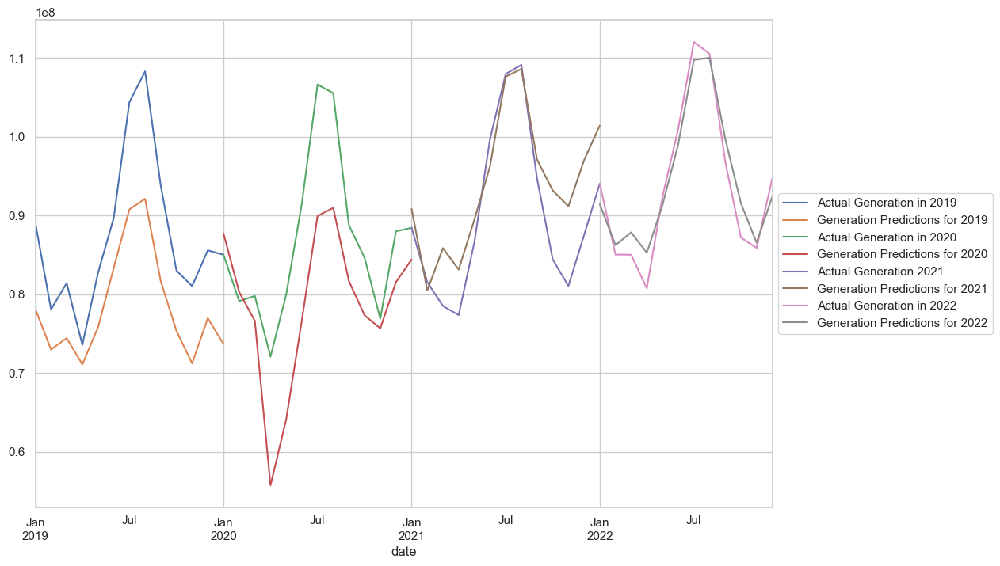

In [ ]:
# CON VARIABLES EXÓGENAS - SOLO PRECIO & INDPRO

exog_var = ['price', 'indpro']

# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 9083894.470678572
Mean Absolute Error (MAE) 2020: 8567608.935899587
Mean Absolute Error (MAE) 2021: 4761303.982016968
Mean Absolute Error (MAE) 2022: 2267900.9717780673
Promedio MAE: 6170177.090093299


Mean Squared Error (MSE) 2010: 95395560173633.83
Mean Squared Error (MSE) 2020: 108470241756808.86
Mean Squared Error (MSE) 2021: 34166572038291.953
Mean Squared Error (MSE) 2022: 6705689540525.07
Promedio MSE: 61184515877314.93


Root Mean Squared Error (RMSE) 2019: 9767065.074710716
Root Mean Squared Error (RMSE) 2020: 10414904.788657881
Root Mean Squared Error (RMSE) 2021: 5845217.877743477
Root Mean Squared Error (RMSE) 2022: 2589534.6185222296
Promedio RMSE: 7154180.589908576


Mean Absolute Percentage Error (MAPE) 2019: 10.140460834552021
Mean Absolute Percentage Error (MAPE) 2020: 9.756413929554007
Mean Absolute Percentage Error (MAPE) 2021: 5.575008485629937
Mean Absolute Percentage Error (MAPE) 2022: 2.4931382171444056
Promedio MAPE: 6.99125536

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.68582D+01    |proj g|=  9.66912D-02

At iterate    5    f=  1.67582D+01    |proj g|=  9.83028D-03



At iterate   10    f=  1.67572D+01    |proj g|=  7.27489D-03


 This problem is unconstrained.



At iterate   15    f=  1.67549D+01    |proj g|=  4.86236D-02

At iterate   20    f=  1.67447D+01    |proj g|=  6.93681D-01

At iterate   25    f=  1.67418D+01    |proj g|=  6.18223D-02

At iterate   30    f=  1.67417D+01    |proj g|=  1.31202D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     30     48      1     0     0   1.312D-03   1.674D+01
  F =   16.741726462792990     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f=  1.67971D+01    |proj g|=  1.03406D-02

At iterate   25    f=  1.67934D+01    |proj g|=  2.32523D-02

At iterate   30    f=  1.67896D+01    |proj g|=  2.63829D-01

At iterate   35    f=  1.67871D+01    |proj g|=  5.84214D-02

At iterate   40    f=  1.67863D+01    |proj g|=  9.62988D-02

At iterate   45    f=  1.67861D+01    |proj g|=  2.69710D-01

At iterate   50    f=  1.67861D+01    |proj g|=  4.40327D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     50     70      1     0     0   4.403D-02   1.679D+01
  F =   16.786097446360479     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   10    f=  1.67975D+01    |proj g|=  3.39838D-02

At iterate   15    f=  1.67958D+01    |proj g|=  2.91640D-03

At iterate   20    f=  1.67918D+01    |proj g|=  1.93222D-01

At iterate   25    f=  1.67864D+01    |proj g|=  1.66505D-01

At iterate   30    f=  1.67845D+01    |proj g|=  1.36960D-01

At iterate   35    f=  1.67825D+01    |proj g|=  3.67998D-02



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     38     67      1     0     0   1.466D-03   1.678D+01
  F =   16.782529680993495     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.69349D+01    |proj g|=  1.36409D-01

At iterate    5    f=  1.67914D+01    |proj g|=  5.91623D-03

At iterate   10    f=  1.67879D+01    |proj g|=  2.88753D-03

At iterate   15    f=  1.67850D+01    |proj g|=  7.23388D-02

At iter

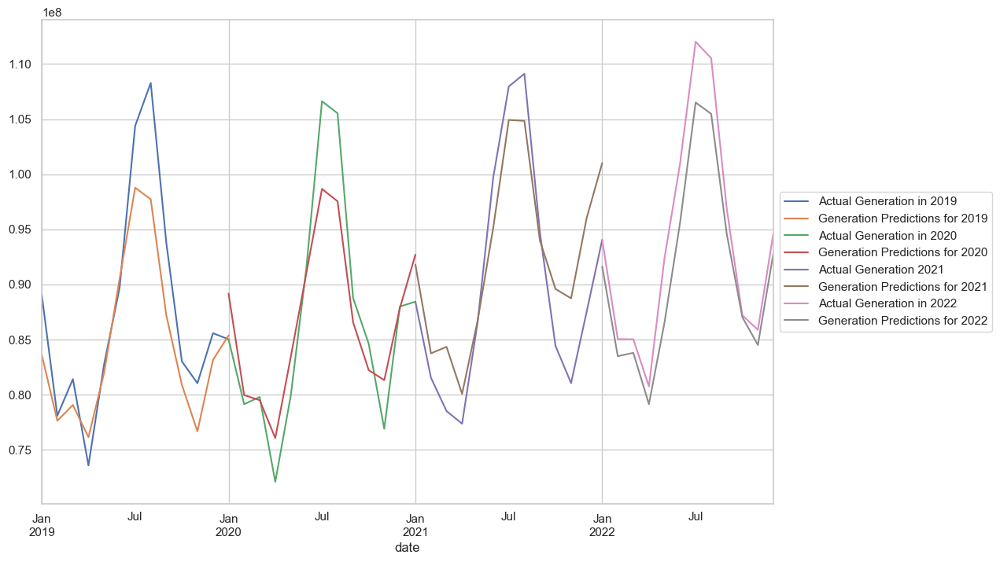

In [ ]:
# CON VARIABLES EXÓGENAS - SOLO PRECIO & PBI

exog_var = ['pib', 'price']

# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 3418903.3285985133
Mean Absolute Error (MAE) 2020: 3276277.744367158
Mean Absolute Error (MAE) 2021: 4246361.238495832
Mean Absolute Error (MAE) 2022: 2855201.275514234
Promedio MAE: 3449185.8967439346


Mean Squared Error (MSE) 2010: 19945287645952.773
Mean Squared Error (MSE) 2020: 17049256366148.646
Mean Squared Error (MSE) 2021: 24084848080985.86
Mean Squared Error (MSE) 2022: 11824641578144.143
Promedio MSE: 18226008417807.855


Root Mean Squared Error (RMSE) 2019: 4466014.738662735
Root Mean Squared Error (RMSE) 2020: 4129074.5169043206
Root Mean Squared Error (RMSE) 2021: 4907631.616267246
Root Mean Squared Error (RMSE) 2022: 3438697.6572743556
Promedio RMSE: 4235354.632277165


Mean Absolute Percentage Error (MAPE) 2019: 3.7135383460192766
Mean Absolute Percentage Error (MAPE) 2020: 3.6753462685270972
Mean Absolute Percentage Error (MAPE) 2021: 4.802559031737889
Mean Absolute Percentage Error (MAPE) 2022: 2.922894482178588
Promedio MAPE: 3.7785

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67429D+01    |proj g|=  6.82398D-02



At iterate    5    f=  1.66964D+01    |proj g|=  5.04001D-03

At iterate   10    f=  1.66949D+01    |proj g|=  6.67261D-03


 This problem is unconstrained.



At iterate   15    f=  1.66916D+01    |proj g|=  4.85138D-02

At iterate   20    f=  1.66835D+01    |proj g|=  6.06343D-02

At iterate   25    f=  1.66831D+01    |proj g|=  3.10181D-03

At iterate   30    f=  1.66829D+01    |proj g|=  2.85660D-02

At iterate   35    f=  1.66823D+01    |proj g|=  2.69396D-02

At iterate   40    f=  1.66820D+01    |proj g|=  7.85683D-04

At iterate   45    f=  1.66819D+01    |proj g|=  1.94315D-02

At iterate   50    f=  1.66815D+01    |proj g|=  3.69215D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     50     66      1     0     0   3.692D-02   1.668D+01
  F =   16.6814930001

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.68229D+01    |proj g|=  6.19069D-02

At iterate    5    f=  1.67433D+01    |proj g|=  5.07969D-02

At iterate   10    f=  1.67322D+01    |proj g|=  2.49585D-02

At iterate   15    f=  1.67282D+01    |proj g|=  1.37714D-02

At iterate   20    f=  1.67276D+01    |proj g|=  4.30749D-03

At iterate   25    f=  1.67270D+01    |proj g|=  8.37047D-03

At iterate   30    f=  1.67264D+01    |proj g|=  1.44067D-02

At iterate   35    f=  1.67263D+01    |proj g|=  1.70637D-03



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     39     79      1     0     0   2.907D-03   1.673D+01
  F =   16.726338749706915     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67250D+01    |proj g|=  5.85401D-02

At iterate    5    f=  1.67000D+01    |proj g|=  3.44193D-03

At iterate   10    f=  1.66995D+01    |proj g|=  5.54765D-03

At iterate   15    f=  1.66976D+01    |proj g|=  6.98367D-03

At iter

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   40    f=  1.66949D+01    |proj g|=  3.84065D-02

At iterate   45    f=  1.66945D+01    |proj g|=  1.66352D-02

At iterate   50    f=  1.66945D+01    |proj g|=  1.76912D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9     50     61      1     0     0   1.769D-02   1.669D+01
  F =   16.694457210907924     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67195D+01    |proj g|=  5.56263D-02

At iter

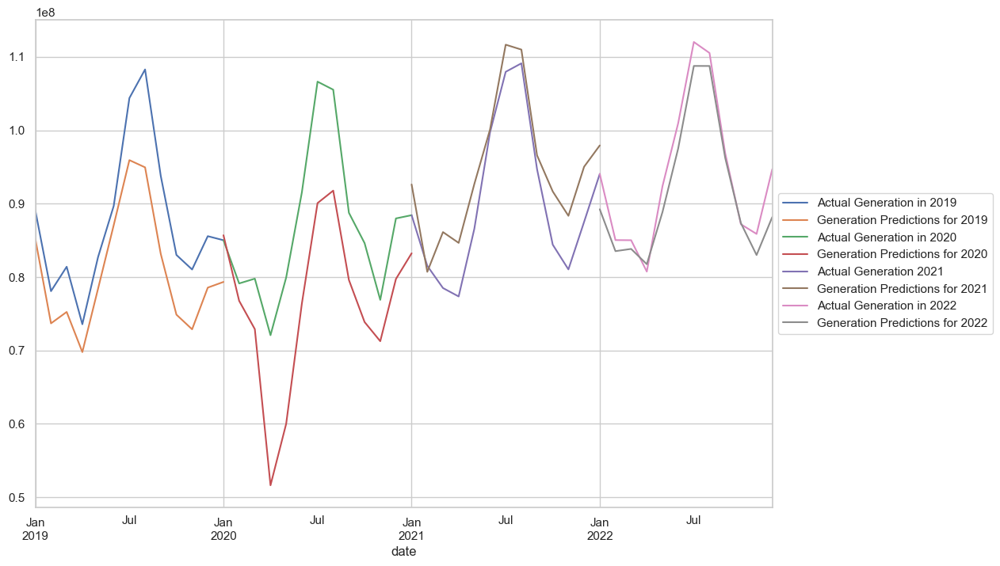

In [ ]:
# CON VARIABLES EXÓGENAS - SOLO PBI & INDPRO

exog_var = ['pib', 'indpro']

# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 6656302.448738863
Mean Absolute Error (MAE) 2020: 10362922.946192343
Mean Absolute Error (MAE) 2021: 4601582.270893609
Mean Absolute Error (MAE) 2022: 2558916.1404248723
Promedio MAE: 6044930.951562421


Mean Squared Error (MSE) 2010: 52942242584993.36
Mean Squared Error (MSE) 2020: 145161112777503.12
Mean Squared Error (MSE) 2021: 28083115729443.4
Mean Squared Error (MSE) 2022: 9762108862745.305
Promedio MSE: 58987144988671.3


Root Mean Squared Error (RMSE) 2019: 7276142.0124261845
Root Mean Squared Error (RMSE) 2020: 12048282.565473933
Root Mean Squared Error (RMSE) 2021: 5299350.500716423
Root Mean Squared Error (RMSE) 2022: 3124437.367390376
Promedio RMSE: 6937053.111501729


Mean Absolute Percentage Error (MAPE) 2019: 7.483756391041947
Mean Absolute Percentage Error (MAPE) 2020: 12.029275281763569
Mean Absolute Percentage Error (MAPE) 2021: 5.3663455948004675
Mean Absolute Percentage Error (MAPE) 2022: 2.6955572120539855
Promedio MAPE: 6.89373361

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67924D+01    |proj g|=  8.16690D-02


 This problem is unconstrained.



At iterate    5    f=  1.67336D+01    |proj g|=  5.04012D-03

At iterate   10    f=  1.67332D+01    |proj g|=  1.22463D-02

At iterate   15    f=  1.67273D+01    |proj g|=  1.27705D-02

At iterate   20    f=  1.67263D+01    |proj g|=  1.40055D-02

At iterate   25    f=  1.67235D+01    |proj g|=  4.60932D-02

At iterate   30    f=  1.67231D+01    |proj g|=  2.95403D-02

At iterate   35    f=  1.67223D+01    |proj g|=  3.62963D-02

At iterate   40    f=  1.67219D+01    |proj g|=  8.22284D-02

At iterate   45    f=  1.67217D+01    |proj g|=  2.65409D-02

At iterate   50    f=  1.67216D+01    |proj g|=  1.08317D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f=  1.67833D+01    |proj g|=  8.54962D-02

At iterate   10    f=  1.67755D+01    |proj g|=  1.40384D-02

At iterate   15    f=  1.67730D+01    |proj g|=  2.64519D-03

At iterate   20    f=  1.67694D+01    |proj g|=  3.04036D-02

At iterate   25    f=  1.67658D+01    |proj g|=  2.15181D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     28     65      1     0     0   2.223D-02   1.677D+01
  F =   16.765819051603231     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f=  1.67607D+01    |proj g|=  1.05031D-02

At iterate   15    f=  1.67568D+01    |proj g|=  1.09701D-02

At iterate   20    f=  1.67563D+01    |proj g|=  1.15790D-03

At iterate   25    f=  1.67563D+01    |proj g|=  1.76373D-02

At iterate   30    f=  1.67562D+01    |proj g|=  8.83516D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     34     43      1     0     0   8.021D-05   1.676D+01
  F =   16.756225743497264     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.68316D+01    |proj g|=  1.02130D-01

At iterate    5    f=  1.67594D+01    |proj g|=  4.56978D-03

At iterate   10    f=  1.67578D+01    |proj g|=  3.18026D-03

At iterate   15    f=  1.67546D+01    |proj g|=  3.14310D-02

At iterate   20    f=  1.67525D+01    |proj g|=  4.12527D-03

At iterate   25    f=  1.67525D+01    |proj g|=  1.14860D-03

At iterate   30    f=  1.67524D+01    |proj g|=  3.63177D-02

At iterate   35    f=  1.67520D+01    |proj g|=  9.02750D-02

At iterate   40    f=  1.67515D+01    |proj g|=  1.32285D-01



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   45    f=  1.67512D+01    |proj g|=  1.38639D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     45     77      1     0     0   1.386D-01   1.675D+01
  F =   16.751222406937295     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


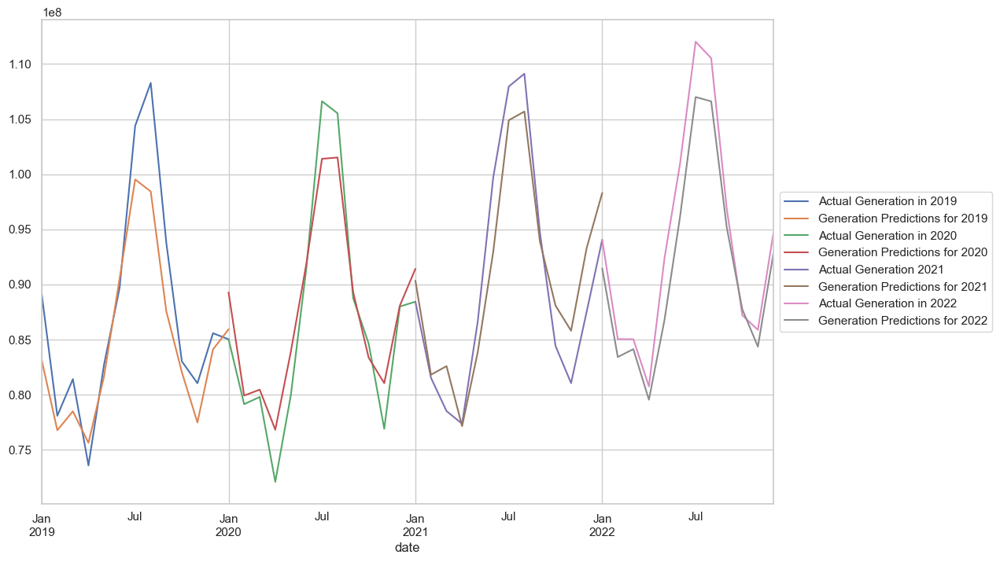

In [ ]:
# CON VARIABLES EXÓGENAS - SOLO PRECIO

exog_var = 'price'

# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 3231779.9121339964
Mean Absolute Error (MAE) 2020: 2541997.1691519516
Mean Absolute Error (MAE) 2021: 3212346.9155984083
Mean Absolute Error (MAE) 2022: 2609754.3030273453
Promedio MAE: 2898969.5749779255


Mean Squared Error (MSE) 2010: 17536880226681.479
Mean Squared Error (MSE) 2020: 9899666035596.998
Mean Squared Error (MSE) 2021: 14072470614028.217
Mean Squared Error (MSE) 2022: 9650305410714.736
Promedio MSE: 12789830571755.357


Root Mean Squared Error (RMSE) 2019: 4187705.842902708
Root Mean Squared Error (RMSE) 2020: 3146373.4736354803
Root Mean Squared Error (RMSE) 2021: 3751329.179641293
Root Mean Squared Error (RMSE) 2022: 3106494.0706067244
Promedio RMSE: 3547975.6416965513


Mean Absolute Percentage Error (MAPE) 2019: 3.517846629943427
Mean Absolute Percentage Error (MAPE) 2020: 2.9571106533616605
Mean Absolute Percentage Error (MAPE) 2021: 3.547344251945602
Mean Absolute Percentage Error (MAPE) 2022: 2.684067236493162
Promedio MAPE: 3.17

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.72436D+01    |proj g|=  1.80906D-01



At iterate    5    f=  1.68629D+01    |proj g|=  9.15711D-02


 This problem is unconstrained.



At iterate   10    f=  1.68310D+01    |proj g|=  2.36508D-01

At iterate   15    f=  1.68202D+01    |proj g|=  2.82009D-02

At iterate   20    f=  1.68148D+01    |proj g|=  1.26107D-01

At iterate   25    f=  1.68040D+01    |proj g|=  4.22824D-01

At iterate   30    f=  1.68007D+01    |proj g|=  8.17792D-01

At iterate   35    f=  1.67990D+01    |proj g|=  2.16214D-02

At iterate   40    f=  1.67990D+01    |proj g|=  8.66827D-03

At iterate   45    f=  1.67990D+01    |proj g|=  1.70808D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     49     81      1     0     0   6.808D-03   1.680D+01
  F =   16.7990017323

 This problem is unconstrained.



At iterate   40    f=  1.68219D+01    |proj g|=  6.10710D-02

At iterate   45    f=  1.68158D+01    |proj g|=  2.53838D-01

At iterate   50    f=  1.68141D+01    |proj g|=  1.84942D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     50     60      1     0     0   1.849D-01   1.681D+01
  F =   16.814060960337631     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.72796D+01    |proj g|=  1.47983D-01

At iterate    5    f=  1.68748D+01    |proj g|=  8.09860D-02

At iterate   10    f=  1.68533D+01    |proj g|=  7.66899D-03

At iterate   15    f=  1.68483D+01    |proj g|=  2.22946D-01

At iterate   20    f=  1.68396D+01    |proj g|=  1.19009D-02

At iterate   25    f=  1.68389D+01    |proj g|=  4.06103D-02

At iterate   30    f=  1.68313D+01    |proj g|=  2.25584D-01

At iterate   35    f=  1.68283D+01    |proj g|=  1.16236D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.



At iterate   20    f=  1.68217D+01    |proj g|=  2.06389D-02

At iterate   25    f=  1.68140D+01    |proj g|=  1.80908D-01

At iterate   30    f=  1.68121D+01    |proj g|=  9.52421D-01

At iterate   35    f=  1.68104D+01    |proj g|=  7.08502D-01

At iterate   40    f=  1.68092D+01    |proj g|=  4.31087D-02

At iterate   45    f=  1.68092D+01    |proj g|=  6.83831D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     49     76      1     0     0   2.103D-03   1.681D+01
  F =   16.809184842675752     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


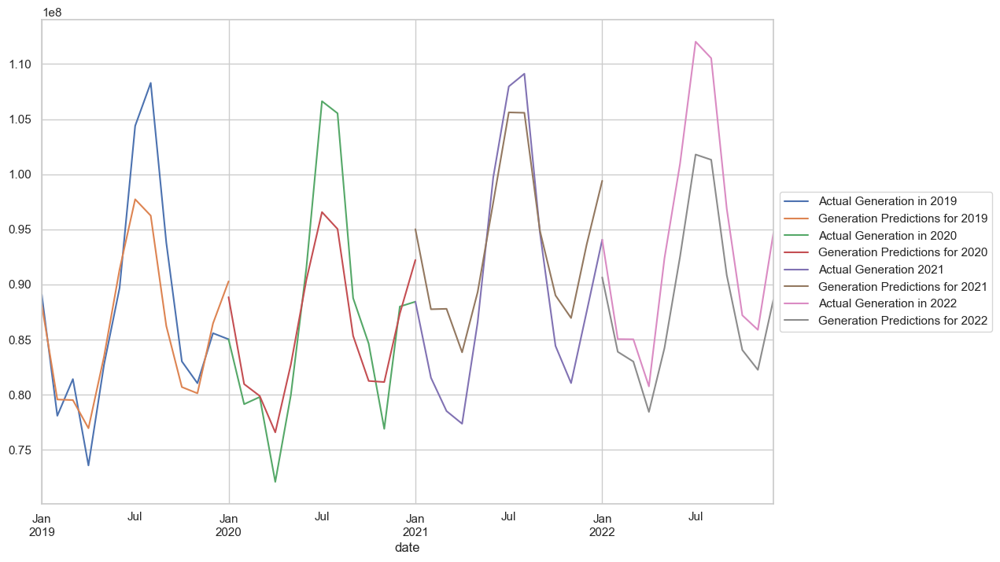

In [ ]:
# CON VARIABLES EXÓGENAS - SOLO PBI

exog_var = 'pib'

# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 3517778.7521415628
Mean Absolute Error (MAE) 2020: 3858705.0820433176
Mean Absolute Error (MAE) 2021: 4734616.902578752
Mean Absolute Error (MAE) 2022: 5317447.172062844
Promedio MAE: 4357136.977206619


Mean Squared Error (MSE) 2010: 23284758662910.61
Mean Squared Error (MSE) 2020: 24189270683652.12
Mean Squared Error (MSE) 2021: 27871439602648.11
Mean Squared Error (MSE) 2022: 37155707079945.445
Promedio MSE: 28125294007289.07


Root Mean Squared Error (RMSE) 2019: 4825428.339837885
Root Mean Squared Error (RMSE) 2020: 4918258.907748973
Root Mean Squared Error (RMSE) 2021: 5279340.830316613
Root Mean Squared Error (RMSE) 2022: 6095548.136135539
Promedio RMSE: 5279644.053509753


Mean Absolute Percentage Error (MAPE) 2019: 3.7934085110710223
Mean Absolute Percentage Error (MAPE) 2020: 4.277901770742275
Mean Absolute Percentage Error (MAPE) 2021: 5.512170791063302
Mean Absolute Percentage Error (MAPE) 2022: 5.445418393013864
Promedio MAPE: 4.7572248664

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67831D+01    |proj g|=  6.77837D-02

At iterate    5    f=  1.67221D+01    |proj g|=  1.56295D-02


 This problem is unconstrained.



At iterate   10    f=  1.67183D+01    |proj g|=  7.27989D-03

At iterate   15    f=  1.67176D+01    |proj g|=  6.76938D-03

At iterate   20    f=  1.67072D+01    |proj g|=  1.82446D-01

At iterate   25    f=  1.67044D+01    |proj g|=  1.93650D-02

At iterate   30    f=  1.67043D+01    |proj g|=  3.56049D-03

At iterate   35    f=  1.67037D+01    |proj g|=  6.74011D-02

At iterate   40    f=  1.67027D+01    |proj g|=  2.43760D-02

At iterate   45    f=  1.67024D+01    |proj g|=  6.74599D-04

At iterate   50    f=  1.67023D+01    |proj g|=  1.19059D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     50     72   

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   10    f=  1.67659D+01    |proj g|=  4.53984D-02

At iterate   15    f=  1.67635D+01    |proj g|=  9.02788D-03

At iterate   20    f=  1.67635D+01    |proj g|=  6.38159D-03

At iterate   25    f=  1.67630D+01    |proj g|=  1.85558D-02

At iterate   30    f=  1.67623D+01    |proj g|=  8.48272D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     32     50      1     0     0   4.278D-02   1.676D+01
  F =   16.762272726609527     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

 This problem is unconstrained.



At iterate   20    f=  1.67146D+01    |proj g|=  5.24870D-03

At iterate   25    f=  1.67136D+01    |proj g|=  3.15056D-03

At iterate   30    f=  1.67133D+01    |proj g|=  1.30173D-02

At iterate   35    f=  1.67133D+01    |proj g|=  4.63014D-03

At iterate   40    f=  1.67132D+01    |proj g|=  4.85189D-03

At iterate   45    f=  1.67131D+01    |proj g|=  5.08879D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     49     70      1     0     0   3.446D-02   1.671D+01
  F =   16.713128662325047     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  1.67142D+01    |proj g|=  7.02700D-03

At iterate   10    f=  1.67133D+01    |proj g|=  5.55049D-03

At iterate   15    f=  1.67128D+01    |proj g|=  8.23157D-03

At iterate   20    f=  1.67113D+01    |proj g|=  9.98168D-03

At iterate   25    f=  1.67110D+01    |proj g|=  4.43143D-03

At iterate   30    f=  1.67103D+01    |proj g|=  4.86740D-02

At iterate   35    f=  1.67100D+01    |proj g|=  1.43716D-03

At iterate   40    f=  1.67099D+01    |proj g|=  1.52824D-02

At iterate   45    f=  1.67099D+01    |proj g|=  1.80108D-02

At iterate   50    f=  1.67097D+01    |proj g|=  3.33216D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


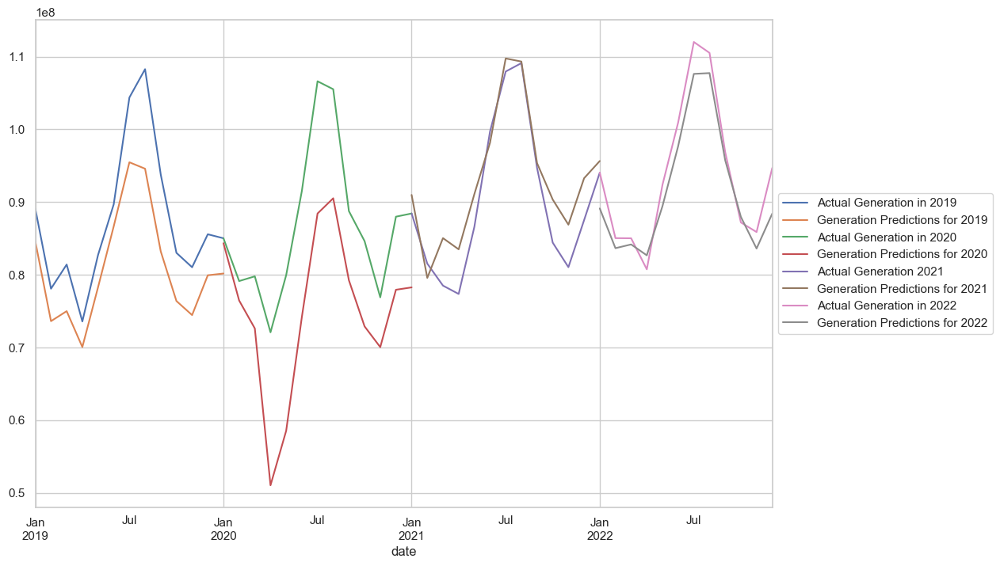

In [ ]:
# CON VARIABLES EXÓGENAS - SOLO INDPRO

exog_var = 'indpro'

# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 6402784.119084596
Mean Absolute Error (MAE) 2020: 11680028.106258515
Mean Absolute Error (MAE) 2021: 3466710.4973909142
Mean Absolute Error (MAE) 2022: 2739719.3904664046
Promedio MAE: 6072310.528300107


Mean Squared Error (MSE) 2010: 49522246740869.88
Mean Squared Error (MSE) 2020: 176672479727301.16
Mean Squared Error (MSE) 2021: 17102633009739.123
Mean Squared Error (MSE) 2022: 10271684423950.959
Promedio MSE: 63392260975465.28


Root Mean Squared Error (RMSE) 2019: 7037204.469167418
Root Mean Squared Error (RMSE) 2020: 13291820.030654235
Root Mean Squared Error (RMSE) 2021: 4135532.977711473
Root Mean Squared Error (RMSE) 2022: 3204946.867570656
Promedio RMSE: 6917376.086275945


Mean Absolute Percentage Error (MAPE) 2019: 7.1556451427668435
Mean Absolute Percentage Error (MAPE) 2020: 13.521853265435901
Mean Absolute Percentage Error (MAPE) 2021: 4.108119136167072
Mean Absolute Percentage Error (MAPE) 2022: 2.8656984679405566
Promedio MAPE: 6.9128

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.70561D+01    |proj g|=  2.13048D-01

At iterate    5    f=  1.68097D+01    |proj g|=  1.10975D-02



At iterate   10    f=  1.68095D+01    |proj g|=  1.64092D-02

At iterate   15    f=  1.68032D+01    |proj g|=  1.83664D-02

At iterate   20    f=  1.68002D+01    |proj g|=  1.04328D-02


 This problem is unconstrained.



At iterate   25    f=  1.68000D+01    |proj g|=  4.22074D-04

At iterate   30    f=  1.68000D+01    |proj g|=  9.13283D-03

At iterate   35    f=  1.67984D+01    |proj g|=  2.59125D-03

At iterate   40    f=  1.67983D+01    |proj g|=  6.71742D-04

At iterate   45    f=  1.67983D+01    |proj g|=  2.68571D-04

At iterate   50    f=  1.67983D+01    |proj g|=  1.19285D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     50     68      1     0     0   1.193D-04   1.680D+01
  F =   16.798339658967272     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f=  1.68147D+01    |proj g|=  1.82427D-02

At iterate   10    f=  1.68133D+01    |proj g|=  4.40589D-02

At iterate   15    f=  1.68080D+01    |proj g|=  3.08290D-03

At iterate   20    f=  1.68024D+01    |proj g|=  1.20575D-02

At iterate   25    f=  1.68008D+01    |proj g|=  1.98575D-03

At iterate   30    f=  1.68007D+01    |proj g|=  1.16064D-03

At iterate   35    f=  1.68005D+01    |proj g|=  3.70040D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     39     59      1     0     0   1.978D-04   1.680D+01
  F =   16.800445336461465     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   20    f=  1.68068D+01    |proj g|=  4.55441D-03

At iterate   25    f=  1.68067D+01    |proj g|=  1.44179D-04

At iterate   30    f=  1.68067D+01    |proj g|=  3.73409D-03

At iterate   35    f=  1.68066D+01    |proj g|=  9.84507D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     35     43      1     0     0   9.845D-05   1.681D+01
  F =   16.806616883040380     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   25    f=  1.67979D+01    |proj g|=  2.29509D-03

At iterate   30    f=  1.67979D+01    |proj g|=  2.58964D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     30     35      1     0     0   2.590D-05   1.680D+01
  F =   16.797922376284010     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


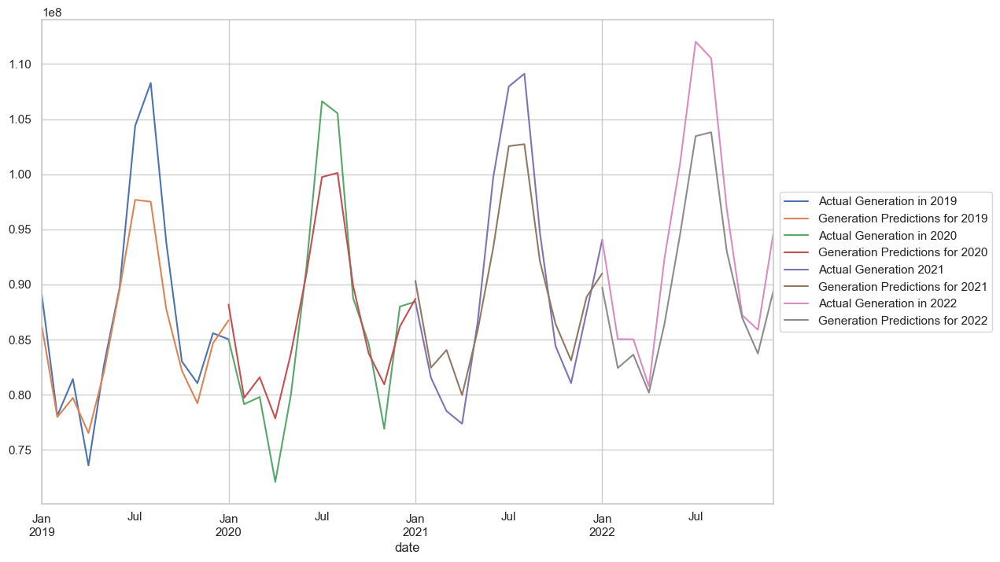

In [ ]:
# SIN VARIABLES EXÓGENAS

# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 1), seasonal_order=(1, 0, 1, 12))
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 1), seasonal_order=(1, 0, 1, 12))
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 1), seasonal_order=(1, 0, 1, 12))
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 1), seasonal_order=(1, 0, 1, 12))
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 2860741.670307884
Mean Absolute Error (MAE) 2020: 2772404.034561882
Mean Absolute Error (MAE) 2021: 3150766.4382565203
Mean Absolute Error (MAE) 2022: 4007567.9453530773
Promedio MAE: 3197870.0221198406


Mean Squared Error (MSE) 2010: 17351556453633.465
Mean Squared Error (MSE) 2020: 12269684367321.035
Mean Squared Error (MSE) 2021: 13806799480715.23
Mean Squared Error (MSE) 2022: 22529989697874.28
Promedio MSE: 16489507499886.004


Root Mean Squared Error (RMSE) 2019: 4165519.949974248
Root Mean Squared Error (RMSE) 2020: 3502810.923718412
Root Mean Squared Error (RMSE) 2021: 3715750.1908383495
Root Mean Squared Error (RMSE) 2022: 4746576.629306039
Promedio RMSE: 4032664.423459262


Mean Absolute Percentage Error (MAPE) 2019: 3.0391365156084134
Mean Absolute Percentage Error (MAPE) 2020: 3.1937197578203174
Mean Absolute Percentage Error (MAPE) 2021: 3.4059820943105805
Mean Absolute Percentage Error (MAPE) 2022: 4.073806906168632
Promedio MAPE: 3.4281

Observando los resultados, queda muy claro que las variables exógenas seleccionadas afectan de manera negativa a las predicciones si se utilizan todas juntas. Existen varias razones por las cuales esto podría estar ocurriendo y estas se encuentran abordadas en el documento. Sin embargo, al utilizar el precio únicamente, obtenemos predicciones buenas y si en un futuro ocurren grandes cambios en esta variable, es importante tenerla en el modelo puesto que se encuentra directamente correlacionada con el consumo. A su vez, como tenemos el dato del precio a nivel de estado, esta variable se ajustará mejor al momento de realizar predicciones a nivel de estado, mientras que otras como el pib se encuentran a nivel nacional.

En base a esto, nuestro modelo será un SARIMAX (2,1,2)(1,0,1)[12] y el precio será nuestra variable exógena.

### Encontrando el Horizonte Temporal Óptimo

In [ ]:
# Comenzamos creando los datasets de entrenamiento y testeo con datos desde el 2010
df_train_2019 = df_grouped_pred[(df_grouped_pred.index < '2019-01-01') & (df_grouped_pred.index >= '2010-01-01')]
df_test_2019 = df_grouped_pred[(df_grouped_pred.index >= '2019-01-01') & (df_grouped_pred.index < '2020-01-31')]

df_train_2020 = df_grouped_pred[(df_grouped_pred.index < '2020-01-01') & (df_grouped_pred.index >= '2010-01-01')]
df_test_2020 = df_grouped_pred[(df_grouped_pred.index >= '2020-01-01') & (df_grouped_pred.index < '2021-01-31')]

df_train_2021 = df_grouped_pred[(df_grouped_pred.index < '2021-01-01') & (df_grouped_pred.index >= '2010-01-01')]
df_test_2021 = df_grouped_pred[(df_grouped_pred.index >= '2021-01-01') & (df_grouped_pred.index < '2022-01-31')]

df_train_2022 = df_grouped_pred[(df_grouped_pred.index < '2022-01-01') & (df_grouped_pred.index >= '2010-01-01')]
df_test_2022 = df_grouped_pred[(df_grouped_pred.index >= '2022-01-01') & (df_grouped_pred.index <= '2022-12-31')]

exog_var = 'price'

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.68189D+01    |proj g|=  1.53391D-01


 This problem is unconstrained.



At iterate    5    f=  1.67153D+01    |proj g|=  2.02267D-02

At iterate   10    f=  1.67106D+01    |proj g|=  4.74301D-03

At iterate   15    f=  1.67057D+01    |proj g|=  4.53318D-02

At iterate   20    f=  1.66996D+01    |proj g|=  1.55748D-02

At iterate   25    f=  1.66975D+01    |proj g|=  7.99134D-02

At iterate   30    f=  1.66956D+01    |proj g|=  5.80049D-02

At iterate   35    f=  1.66948D+01    |proj g|=  1.55155D-02

At iterate   40    f=  1.66922D+01    |proj g|=  6.68069D-02

At iterate   45    f=  1.66911D+01    |proj g|=  6.97253D-02

At iterate   50    f=  1.66910D+01    |proj g|=  2.09761D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.72291D+01    |proj g|=  1.30838D-01

At iterate    5    f=  1.68221D+01    |proj g|=  6.01126D-02

At iterate   10    f=  1.68085D+01    |proj g|=  6.22203D-02

At iterate   15    f=  1.67946D+01    |proj g|=  3.37609D-02

At iterate   20    f=  1.67904D+01    |proj g|=  1.01243D-01

At iterate   25    f=  1.67776D+01    |proj g|=  1.01831D-01

At iterate   30    f=  1.67764D+01    |proj g|=  8.55219D-02
  ys=-2.376E-04  -gs= 5.611E-04 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

   

 This problem is unconstrained.



At iterate   10    f=  1.67848D+01    |proj g|=  1.01368D-01

At iterate   15    f=  1.67753D+01    |proj g|=  4.71699D-03

At iterate   20    f=  1.67674D+01    |proj g|=  1.05049D-01

At iterate   25    f=  1.67625D+01    |proj g|=  1.63972D-01

At iterate   30    f=  1.67616D+01    |proj g|=  3.01710D-03

At iterate   35    f=  1.67615D+01    |proj g|=  1.24860D-01

At iterate   40    f=  1.67597D+01    |proj g|=  1.71689D-01

At iterate   45    f=  1.67590D+01    |proj g|=  1.54803D-01

At iterate   50    f=  1.67585D+01    |proj g|=  1.58645D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     50     66   

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.69978D+01    |proj g|=  1.86934D-01

At iterate    5    f=  1.67969D+01    |proj g|=  1.82953D-02

At iterate   10    f=  1.67930D+01    |proj g|=  5.04130D-02

At iterate   15    f=  1.67788D+01    |proj g|=  1.26118D-01

At iterate   20    f=  1.67746D+01    |proj g|=  3.76797D-03

At iterate   25    f=  1.67670D+01    |proj g|=  8.05605D-02

At iterate   30    f=  1.67662D+01    |proj g|=  1.25072D-02

At iterate   35    f=  1.67655D+01    |proj g|=  2.84954D-02

At iterate   40    f=  1.67654D+01    |proj g|=  1.50165D-02

At iterate   45    f=  1.67619D+01    |proj g|=  5.96806D-01

At iterate   50    f=  1.67597D+01    |proj g|=  3.80370D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


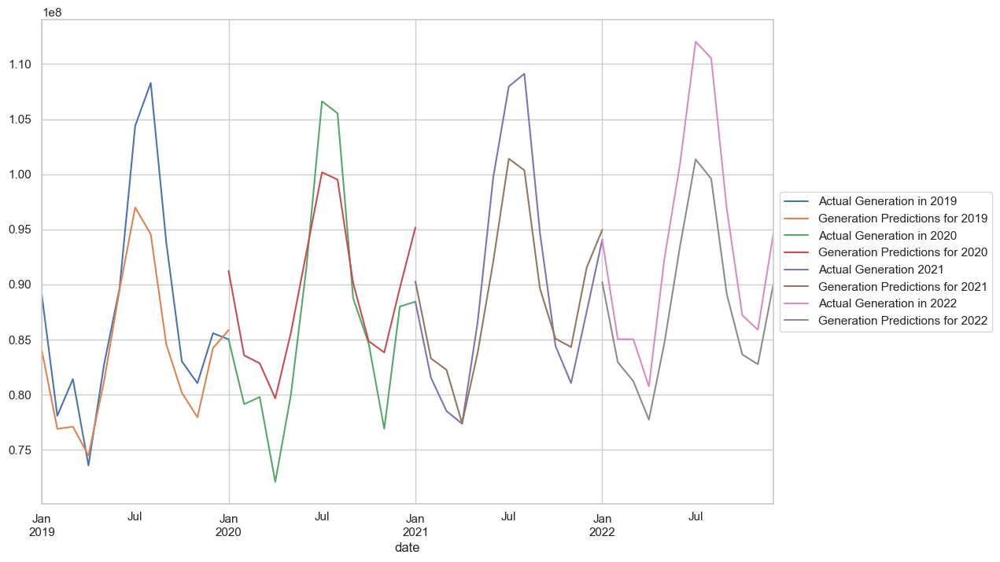

In [ ]:
# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 3969495.5638747206
Mean Absolute Error (MAE) 2020: 4440057.855103841
Mean Absolute Error (MAE) 2021: 3613576.1173349814
Mean Absolute Error (MAE) 2022: 5712799.207270156
Promedio MAE: 4433982.185895924


Mean Squared Error (MSE) 2010: 30564328768970.57
Mean Squared Error (MSE) 2020: 25754176510244.566
Mean Squared Error (MSE) 2021: 19982254799477.53
Mean Squared Error (MSE) 2022: 41206759431931.805
Promedio MSE: 29376879877656.117


Root Mean Squared Error (RMSE) 2019: 5528501.493982847
Root Mean Squared Error (RMSE) 2020: 5074857.289643184
Root Mean Squared Error (RMSE) 2021: 4470151.540996964
Root Mean Squared Error (RMSE) 2022: 6419249.133031978
Promedio RMSE: 5373189.864413744


Mean Absolute Percentage Error (MAPE) 2019: 4.240497832139671
Mean Absolute Percentage Error (MAPE) 2020: 5.225264915094633
Mean Absolute Percentage Error (MAPE) 2021: 3.821600588969204
Mean Absolute Percentage Error (MAPE) 2022: 5.872892167914612
Promedio MAPE: 4.790063876

In [ ]:
# Comenzamos creando los datasets de entrenamiento y testeo con datos desde el 2015
df_train_2019 = df_grouped_pred[(df_grouped_pred.index < '2019-01-01') & (df_grouped_pred.index >= '2015-01-01')]
df_test_2019 = df_grouped_pred[(df_grouped_pred.index >= '2019-01-01') & (df_grouped_pred.index < '2020-01-31')]

df_train_2020 = df_grouped_pred[(df_grouped_pred.index < '2020-01-01') & (df_grouped_pred.index >= '2015-01-01')]
df_test_2020 = df_grouped_pred[(df_grouped_pred.index >= '2020-01-01') & (df_grouped_pred.index < '2021-01-31')]

df_train_2021 = df_grouped_pred[(df_grouped_pred.index < '2021-01-01') & (df_grouped_pred.index >= '2015-01-01')]
df_test_2021 = df_grouped_pred[(df_grouped_pred.index >= '2021-01-01') & (df_grouped_pred.index < '2022-01-31')]

df_train_2022 = df_grouped_pred[(df_grouped_pred.index < '2022-01-01') & (df_grouped_pred.index >= '2015-01-01')]
df_test_2022 = df_grouped_pred[(df_grouped_pred.index >= '2022-01-01') & (df_grouped_pred.index <= '2022-12-31')]

exog_var = 'price'

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67777D+01    |proj g|=  2.70395D-01

At iterate    5    f=  1.66803D+01    |proj g|=  5.26474D-03


 This problem is unconstrained.



At iterate   10    f=  1.66600D+01    |proj g|=  2.26428D-02

At iterate   15    f=  1.66513D+01    |proj g|=  2.48895D-02

At iterate   20    f=  1.66450D+01    |proj g|=  2.01504D-03

At iterate   25    f=  1.66438D+01    |proj g|=  3.14176D-02

At iterate   30    f=  1.66420D+01    |proj g|=  2.22678D-03

At iterate   35    f=  1.66410D+01    |proj g|=  2.03122D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     39     51      1     0     0   1.189D-05   1.664D+01
  F =   16.641005170254832     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   20    f=  1.67959D+01    |proj g|=  2.59376D-02

At iterate   25    f=  1.67950D+01    |proj g|=  3.44351D-02

At iterate   30    f=  1.67938D+01    |proj g|=  5.66870D-02

At iterate   35    f=  1.67923D+01    |proj g|=  2.35914D-01

At iterate   40    f=  1.67798D+01    |proj g|=  2.25351D-01

At iterate   45    f=  1.67791D+01    |proj g|=  5.54160D-02

At iterate   50    f=  1.67791D+01    |proj g|=  1.63073D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     50     59      1     0     0   1.631D-02   1.678D+01
  F =   16.779098943012563     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate   10    f=  1.68070D+01    |proj g|=  3.82286D-02

At iterate   15    f=  1.68013D+01    |proj g|=  3.45254D-02

At iterate   20    f=  1.67993D+01    |proj g|=  5.67806D-02

At iterate   25    f=  1.67899D+01    |proj g|=  1.59376D-01

At iterate   30    f=  1.67852D+01    |proj g|=  2.84167D-02

At iterate   35    f=  1.67845D+01    |proj g|=  1.82969D-02

At iterate   40    f=  1.67836D+01    |proj g|=  8.31918D-02

At iterate   45    f=  1.67786D+01    |proj g|=  1.56802D-01

At iterate   50    f=  1.67780D+01    |proj g|=  8.22237D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     50     61   

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


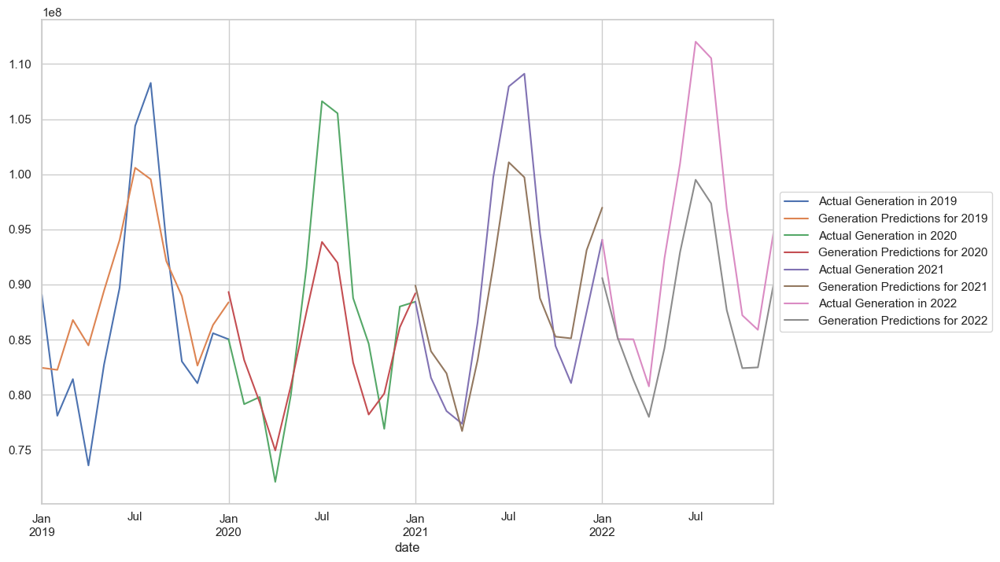

In [ ]:
# Creamos y entrenamos nuestros modelos
model_2019 = SARIMAX(df_train_2019['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2019[exog_var])
model_2020 = SARIMAX(df_train_2020['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2020[exog_var])
model_2021 = SARIMAX(df_train_2021['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2021[exog_var])
model_2022 = SARIMAX(df_train_2022['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train_2022[exog_var])
results_2019 = model_2019.fit()
results_2020 = model_2020.fit()
results_2021 = model_2021.fit()
results_2022 = model_2022.fit()

# Definimos la ventana de tiempo y creamos las predicciones - 2019
start = '2019-01-01'
end = '2019-12-30'
predictions_2019 = results_2019.predict(start=start, end=end, seasonal=True, exog=df_test_2019[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2020
start = '2020-01-01'
end = '2020-12-30'
predictions_2020 = results_2020.predict(start=start, end=end, seasonal=True, exog=df_test_2020[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2021
start = '2021-01-01'
end = '2021-12-30'
predictions_2021 = results_2021.predict(start=start, end=end, seasonal=True, exog=df_test_2021[exog_var]).rename('predictions')

# Definimos la ventana de tiempo y creamos las predicciones - 2022
start = '2022-01-01'
end = '2022-11-30'
predictions_2022 = results_2022.predict(start=start, end=end, seasonal=True, exog=df_test_2022[exog_var]).rename('predictions')

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2019')
predictions_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019')

df_test_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2020')
predictions_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020')

df_test_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation 2021')
predictions_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021')

df_test_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2022')
predictions_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Métricas de Evaluación
# Calculate Mean Absolute Error (MAE)
mae_general_2019 = mean_absolute_error(df_test_2019['generation_mwh'], predictions_2019)
mae_2020 = mean_absolute_error(df_test_2020['generation_mwh'], predictions_2020)
mae_2021 = mean_absolute_error(df_test_2021['generation_mwh'], predictions_2021)
mae_2022 = mean_absolute_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Mean Squared Error (MSE)
mse_2019 = mean_squared_error(df_test_2019['generation_mwh'], predictions_2019)
mse_2020 = mean_squared_error(df_test_2020['generation_mwh'], predictions_2020)
mse_2021 = mean_squared_error(df_test_2021['generation_mwh'], predictions_2021)
mse_2022 = mean_squared_error(df_test_2022['generation_mwh'], predictions_2022)

# Calculate Root Mean Squared Error (RMSE)
rmse_2019 = np.sqrt(mse_2019)
rmse_2020 = np.sqrt(mse_2020)
rmse_2021 = np.sqrt(mse_2021)
rmse_2022 = np.sqrt(mse_2022)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2019 = np.mean(np.abs((df_test_2019['generation_mwh'] - predictions_2019) / df_test_2019['generation_mwh'])) * 100
mape_2020 = np.mean(np.abs((df_test_2020['generation_mwh'] - predictions_2020) / df_test_2020['generation_mwh'])) * 100
mape_2021 = np.mean(np.abs((df_test_2021['generation_mwh'] - predictions_2021) / df_test_2021['generation_mwh'])) * 100
mmape_2022 = np.mean(np.abs((df_test_2022['generation_mwh'] - predictions_2022) / df_test_2022['generation_mwh'])) * 100


# R2
r2_2019 = r2_score(df_test_2019['generation_mwh'], predictions_2019)
r2_2020 = r2_score(df_test_2020['generation_mwh'], predictions_2020)
r2_2021 = r2_score(df_test_2021['generation_mwh'], predictions_2021)
r2_2022 = r2_score(df_test_2022['generation_mwh'], predictions_2022)

print('\n')
print("Mean Absolute Error (MAE) 2010:", mae_general_2019)
print("Mean Absolute Error (MAE) 2020:", mae_2020)
print("Mean Absolute Error (MAE) 2021:", mae_2021)
print("Mean Absolute Error (MAE) 2022:", mae_2022)
print('Promedio MAE:', statistics.mean([mae_general_2019, mae_2020, mae_2021, mae_2022]))
print('\n')
print("Mean Squared Error (MSE) 2010:", mse_2019)
print("Mean Squared Error (MSE) 2020:", mse_2020)
print("Mean Squared Error (MSE) 2021:", mse_2021)
print("Mean Squared Error (MSE) 2022:", mse_2022)
print('Promedio MSE:', statistics.mean([mse_2019, mse_2020, mse_2021, mse_2022]))
print('\n')
print("Root Mean Squared Error (RMSE) 2019:", rmse_2019)
print("Root Mean Squared Error (RMSE) 2020:", rmse_2020)
print("Root Mean Squared Error (RMSE) 2021:", rmse_2021)
print("Root Mean Squared Error (RMSE) 2022:", rmse_2022)
print('Promedio RMSE:', statistics.mean([rmse_2019, rmse_2020, rmse_2021, rmse_2022]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_2019)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_2020)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_2021)
print("Mean Absolute Percentage Error (MAPE) 2022:", mmape_2022)
print('Promedio MAPE:', statistics.mean([mape_2019, mape_2020, mape_2021, mmape_2022]))
print('\n')
print("R2 Score 2019:", r2_2019)
print("R2 Score 2020:", r2_2020)
print("R2 Score 2021:", r2_2021)
print("R2 Score 2022:", r2_2022)
print('Promedio R2:', statistics.mean([r2_2019, r2_2020, r2_2021, r2_2022]))



Mean Absolute Error (MAE) 2010: 4920912.389261441
Mean Absolute Error (MAE) 2020: 4695217.055452915
Mean Absolute Error (MAE) 2021: 4234163.519329784
Mean Absolute Error (MAE) 2022: 6171735.000605197
Promedio MAE: 5005506.991162335


Mean Squared Error (MSE) 2010: 32009855143988.227
Mean Squared Error (MSE) 2020: 38264955937186.95
Mean Squared Error (MSE) 2021: 24943329712753.758
Mean Squared Error (MSE) 2022: 53065135431785.914
Promedio MSE: 37070819056428.71


Root Mean Squared Error (RMSE) 2019: 5657725.262328335
Root Mean Squared Error (RMSE) 2020: 6185867.436114918
Root Mean Squared Error (RMSE) 2021: 4994329.756108797
Root Mean Squared Error (RMSE) 2022: 7284582.035490157
Promedio RMSE: 6030626.122510552


Mean Absolute Percentage Error (MAPE) 2019: 5.736843378415135
Mean Absolute Percentage Error (MAPE) 2020: 5.1071648365456195
Mean Absolute Percentage Error (MAPE) 2021: 4.507166564483051
Mean Absolute Percentage Error (MAPE) 2022: 6.285744380254581
Promedio MAPE: 5.4092297899

Habiendo probado con diferentes horizontes temporales, vemos que no hay una diferencia sustancial, con lo cual optaremos con quedarnos con la mayor cantidad de datos posibles. 

## Predicciones por Estado y Tipo de Energía

In [ ]:
# Comenzamos creando el dataset con el que vamos a crear el resto por estado
df_pred_general = df_exp.groupby(['date', 'state']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum', 'pib':'mean', 'indpro':'mean', 'price':'mean'}).reset_index()
df_pred_source = df_exp.groupby(['date', 'state', 'source']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum', 'pib':'mean', 'indpro':'mean', 'price':'mean'}).reset_index()

In [ ]:
# Creamos las funciones para predecir el consumo de energía
def sarimax_train(df_train):
    model = SARIMAX(df_train['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train['price'])
    results = model.fit()
    return results

def sarimax_predictions(start, end, df_test, results):
    predictions = results.predict(start=start, end=end, seasonal=True, exog=df_test['price']).rename('predictions')
    return predictions

def calculo_metricas(df_test, predictions):
    mae = mean_absolute_error(df_test['generation_mwh'], predictions)
    mse = mean_squared_error(df_test['generation_mwh'], predictions)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((df_test['generation_mwh'] - predictions) / df_test['generation_mwh'])) * 100
    r2 = r2_score(df_test['generation_mwh'], predictions)
    return(mae, mse, rmse, mape, r2)

### Texas - General

In [ ]:
# Creamos el dataset que necesitamos filtrando por texas primero, y luego por cada fuente de energía
df_texas_pred = df_pred_general[df_pred_general['state'] == 'Texas'].copy()
df_texas_pred_coal = df_pred_source[(df_pred_source['source'] == 'all coal products') & (df_pred_source['state'] == 'Texas')].copy()
df_texas_pred_renewables = df_pred_source[(df_pred_source['source'] == 'all renewables') & (df_pred_source['state'] == 'Texas')].copy()
df_texas_pred_gas = df_pred_source[(df_pred_source['source'] == 'natural gas') & (df_pred_source['state'] == 'Texas')].copy()
df_texas_pred_nuclear = df_pred_source[(df_pred_source['source'] == 'nuclear') & (df_pred_source['state'] == 'Texas')].copy()

# Ahora convertimos todas las fechas en el index del dataframe para poder hacer una serie de tiempo
df_texas_pred.set_index('date', inplace=True)
df_texas_pred.index.freq = 'MS'
df_texas_pred_coal.set_index('date', inplace=True)
df_texas_pred_coal.index.freq = 'MS'
df_texas_pred_renewables.set_index('date', inplace=True)
df_texas_pred_renewables.index.freq = 'MS'
df_texas_pred_gas.set_index('date', inplace=True)
df_texas_pred_gas.index.freq = 'MS'
df_texas_pred_nuclear.set_index('date', inplace=True)
df_texas_pred_nuclear.index.freq = 'MS'

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.61416D+01    |proj g|=  9.35536D-02

At iterate    5    f=  1.60952D+01    |proj g|=  3.29284D-03


 This problem is unconstrained.



At iterate   10    f=  1.60942D+01    |proj g|=  2.21927D-02

At iterate   15    f=  1.60874D+01    |proj g|=  7.31915D-03

At iterate   20    f=  1.60865D+01    |proj g|=  4.29182D-04

At iterate   25    f=  1.60843D+01    |proj g|=  4.55273D-03

At iterate   30    f=  1.60834D+01    |proj g|=  1.06916D-02

At iterate   35    f=  1.60802D+01    |proj g|=  1.03708D-02

At iterate   40    f=  1.60785D+01    |proj g|=  1.81666D-03

At iterate   45    f=  1.60785D+01    |proj g|=  2.64084D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     45     60      1     0     0   2.641D-05   1.608D+01
  F =   16.0784538406

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.61612D+01    |proj g|=  9.63977D-02

At iterate    5    f=  1.61109D+01    |proj g|=  2.23598D-03

At iterate   10    f=  1.61091D+01    |proj g|=  2.11358D-02

At iterate   15    f=  1.60951D+01    |proj g|=  6.06514D-03

At iterate   20    f=  1.60943D+01    |proj g|=  2.32332D-02

At iterate   25    f=  1.60929D+01    |proj g|=  1.71661D-02

At iterate   30    f=  1.60925D+01    |proj g|=  5.36309D-03

At iterate   35    f=  1.60919D+01    |proj g|=  4.01784D-03

At iterate   40    f=  1.60912D+01    |proj g|=  5.00415D-02

At iterate   45    f=  1.60910D+01    |proj g|=  2.40323D-02

At iterate   50    f=  1.60909D+01    |proj g|=  1.75651D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.



At iterate    5    f=  1.60944D+01    |proj g|=  6.89834D-03

At iterate   10    f=  1.60921D+01    |proj g|=  1.96605D-02

At iterate   15    f=  1.60851D+01    |proj g|=  4.14145D-03

At iterate   20    f=  1.60846D+01    |proj g|=  3.80731D-03

At iterate   25    f=  1.60825D+01    |proj g|=  1.02549D-02

At iterate   30    f=  1.60805D+01    |proj g|=  3.81848D-03

At iterate   35    f=  1.60780D+01    |proj g|=  1.24238D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     38     46      1     0     0   1.044D-05   1.608D+01
  F =   16.077916077943247     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   25    f=  1.60715D+01    |proj g|=  5.39165D-03

At iterate   30    f=  1.60713D+01    |proj g|=  2.06984D-04

At iterate   35    f=  1.60712D+01    |proj g|=  7.89771D-04

At iterate   40    f=  1.60712D+01    |proj g|=  1.22602D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     43     51      1     0     0   6.780D-06   1.607D+01
  F =   16.071188982367591     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


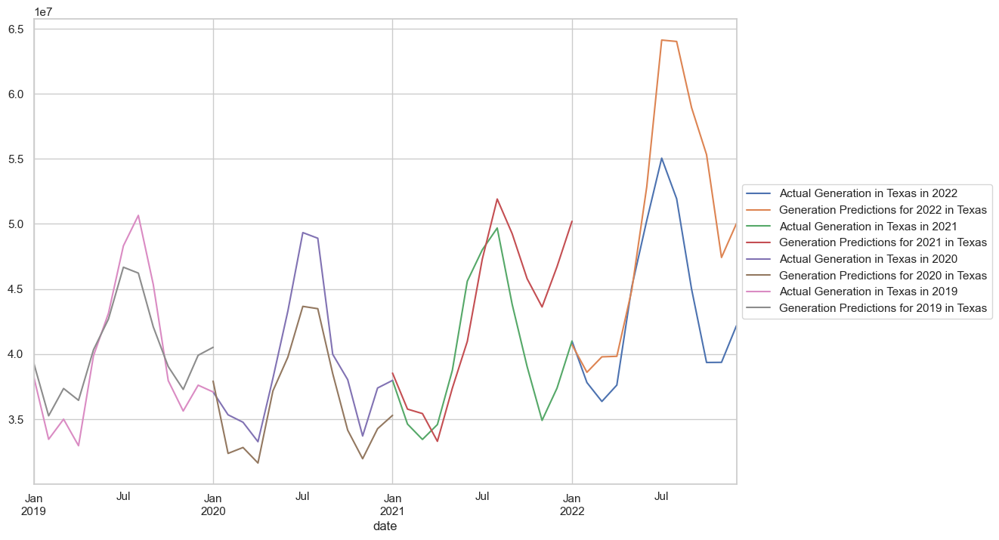



Mean Absolute Error (MAE) 2022: 6374727.234095705
Mean Absolute Error (MAE) 2021: 4104544.982490096
Mean Absolute Error (MAE) 2020: 2760727.9291600557
Mean Absolute Error (MAE) 2019: 2107921.3210644955
Promedio MAE: 3836980.366702588


Mean Squared Error (MSE) 2022: 69034886253229.38
Mean Squared Error (MSE) 2021: 27601087668250.684
Mean Squared Error (MSE) 2020: 9855688228960.39
Mean Squared Error (MSE) 2019: 5876543711587.35
Promedio MSE: 28092051465506.953


Root Mean Squared Error (RMSE) 2022: 8308723.503236185
Root Mean Squared Error (RMSE) 2021: 5253673.730662257
Root Mean Squared Error (RMSE) 2020: 3139377.044727248
Root Mean Squared Error (RMSE) 2019: 2424158.3511782703
Promedio RMSE: 4781483.15745099


Mean Absolute Percentage Error (MAPE) 2022: 14.510069006149298
Mean Absolute Percentage Error (MAPE) 2021: 10.475526683561311
Mean Absolute Percentage Error (MAPE) 2020: 6.841881460082436
Mean Absolute Percentage Error (MAPE) 2019: 5.372100820274716
Promedio MAPE: 9.2998944925

In [ ]:
# TEXAS GENERAL

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_texas_train_general_2022 = df_texas_pred[df_texas_pred.index < '2022-01-01']
df_texas_test_general_2022 = df_texas_pred[df_texas_pred.index >= '2022-01-01']

df_texas_train_general_2021 = df_texas_pred[df_texas_pred.index < '2021-01-01']
df_texas_test_general_2021 = df_texas_pred[(df_texas_pred.index >= '2021-01-01') & (df_texas_pred.index < '2022-01-31')]

df_texas_train_general_2020 = df_texas_pred[df_texas_pred.index < '2020-01-01']
df_texas_test_general_2020 = df_texas_pred[(df_texas_pred.index >= '2020-01-01') & (df_texas_pred.index < '2021-01-31')]

df_texas_train_general_2019 = df_texas_pred[df_texas_pred.index < '2019-01-01']
df_texas_test_general_2019 = df_texas_pred[(df_texas_pred.index >= '2019-01-01') & (df_texas_pred.index < '2020-01-31')]

# Creamos el modelo
results_texas_general_2022 = sarimax_train(df_texas_train_general_2022)
results_texas_general_2021 = sarimax_train(df_texas_train_general_2021)
results_texas_general_2020 = sarimax_train(df_texas_train_general_2020)
results_texas_general_2019 = sarimax_train(df_texas_train_general_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_texas_general_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_texas_test_general_2022, results_texas_general_2022)
predictions_texas_general_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_texas_test_general_2021, results_texas_general_2021)
predictions_texas_general_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_texas_test_general_2020, results_texas_general_2020)
predictions_texas_general_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_texas_test_general_2019, results_texas_general_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_texas_test_general_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2022')
predictions_texas_general_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Texas')

df_texas_test_general_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2021')
predictions_texas_general_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Texas')

df_texas_test_general_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2020')
predictions_texas_general_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Texas')

df_texas_test_general_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2019')
predictions_texas_general_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Texas')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_texas_general_2022, mse_texas_general_2022, rmse_texas_general_2022, mape_texas_general_2022, r2_texas_general_2022 = calculo_metricas(df_texas_test_general_2022, predictions_texas_general_2022)
mae_texas_general_2021, mse_texas_general_2021, rmse_texas_general_2021, mape_texas_general_2021, r2_texas_general_2021 = calculo_metricas(df_texas_test_general_2021, predictions_texas_general_2021)
mae_texas_general_2020, mse_texas_general_2020, rmse_texas_general_2020, mape_texas_general_2020, r2_texas_general_2020 = calculo_metricas(df_texas_test_general_2020, predictions_texas_general_2020)
mae_texas_general_2019, mse_texas_general_2019, rmse_texas_general_2019, mape_texas_general_2019, r2_texas_general_2019 = calculo_metricas(df_texas_test_general_2019, predictions_texas_general_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_texas_general_2022)
print("Mean Absolute Error (MAE) 2021:", mae_texas_general_2021)
print("Mean Absolute Error (MAE) 2020:", mae_texas_general_2020)
print("Mean Absolute Error (MAE) 2019:", mae_texas_general_2019)
print('Promedio MAE:', statistics.mean([mae_texas_general_2022, mae_texas_general_2021, mae_texas_general_2020, mae_texas_general_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_texas_general_2022)
print("Mean Squared Error (MSE) 2021:", mse_texas_general_2021)
print("Mean Squared Error (MSE) 2020:", mse_texas_general_2020)
print("Mean Squared Error (MSE) 2019:", mse_texas_general_2019)
print('Promedio MSE:', statistics.mean([mse_texas_general_2022, mse_texas_general_2021, mse_texas_general_2020, mse_texas_general_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_texas_general_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_texas_general_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_texas_general_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_texas_general_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_general_2022, rmse_texas_general_2021, rmse_texas_general_2020, rmse_texas_general_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_texas_general_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_texas_general_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_texas_general_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_texas_general_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_general_2022, mape_texas_general_2021, mape_texas_general_2020, mape_texas_general_2019]))
print('\n')
print("R2 Score 2022:", r2_texas_general_2022)
print("R2 Score 2021:", r2_texas_general_2021)
print("R2 Score 2020:", r2_texas_general_2020)
print("R2 Score 2019:", r2_texas_general_2019)
print('Promedio R2:', statistics.mean([r2_texas_general_2022, r2_texas_general_2021, r2_texas_general_2020, r2_texas_general_2019]))

### Texas - Coal

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.52001D+01    |proj g|=  1.80936D-01

At iterate    5    f=  1.51622D+01    |proj g|=  1.21731D-02


 This problem is unconstrained.



At iterate   10    f=  1.51513D+01    |proj g|=  2.31879D-03

At iterate   15    f=  1.51506D+01    |proj g|=  2.75445D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     19     21      1     0     0   1.604D-05   1.515D+01
  F =   15.150613855586629     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.52074D+01    |proj g|=  1.89192D-01


 This problem is unconstrained.



At iterate    5    f=  1.51630D+01    |proj g|=  2.36414D-02

At iterate   10    f=  1.51554D+01    |proj g|=  3.63274D-03

At iterate   15    f=  1.51537D+01    |proj g|=  6.49590D-03

At iterate   20    f=  1.51534D+01    |proj g|=  1.29091D-04

At iterate   25    f=  1.51533D+01    |proj g|=  3.25838D-03

At iterate   30    f=  1.51526D+01    |proj g|=  9.20992D-03

At iterate   35    f=  1.51513D+01    |proj g|=  5.47390D-04

At iterate   40    f=  1.51513D+01    |proj g|=  5.16168D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     41     46      1     0     0   2.752D-06   1.515D+01
  F =   15.1513011315

 This problem is unconstrained.



At iterate    5    f=  1.51678D+01    |proj g|=  2.20312D-02

At iterate   10    f=  1.51614D+01    |proj g|=  1.34182D-03

At iterate   15    f=  1.51612D+01    |proj g|=  2.15711D-03

At iterate   20    f=  1.51611D+01    |proj g|=  7.07365D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     20     22      1     0     0   7.074D-05   1.516D+01
  F =   15.161116678791192     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   10    f=  1.51650D+01    |proj g|=  3.40166D-03

At iterate   15    f=  1.51613D+01    |proj g|=  3.87799D-03

At iterate   20    f=  1.51612D+01    |proj g|=  1.34926D-04

At iterate   25    f=  1.51608D+01    |proj g|=  7.38468D-03

At iterate   30    f=  1.51594D+01    |proj g|=  2.41962D-03

At iterate   35    f=  1.51592D+01    |proj g|=  3.61258D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     36     42      1     0     0   8.960D-06   1.516D+01
  F =   15.159185621802365     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


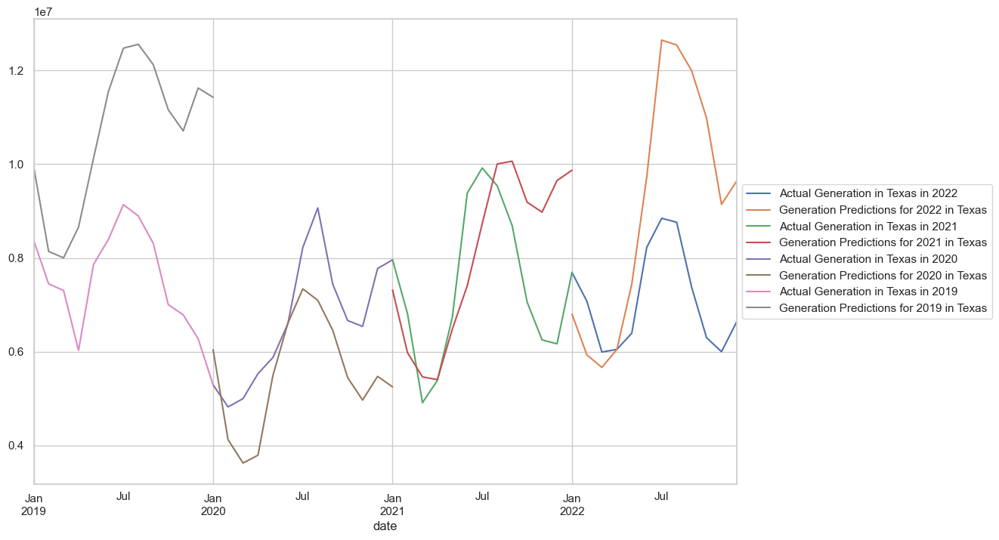



Mean Absolute Error (MAE) 2022: 2327783.9938494447
Mean Absolute Error (MAE) 2021: 1370720.9695185274
Mean Absolute Error (MAE) 2020: 1276671.4380870552
Mean Absolute Error (MAE) 2019: 3182657.5137403435
Promedio MAE: 2039458.4787988428


Mean Squared Error (MSE) 2022: 8033993128833.195
Mean Squared Error (MSE) 2021: 2902762098604.6484
Mean Squared Error (MSE) 2020: 2179224524775.0376
Mean Squared Error (MSE) 2019: 12567758720234.521
Promedio MSE: 6420934618111.851


Root Mean Squared Error (RMSE) 2022: 2834429.947773131
Root Mean Squared Error (RMSE) 2021: 1703749.4236549716
Root Mean Squared Error (RMSE) 2020: 1476219.6736173914
Root Mean Squared Error (RMSE) 2019: 3545103.4851234625
Promedio RMSE: 2389875.632542239


Mean Absolute Percentage Error (MAPE) 2022: 32.37843889663325
Mean Absolute Percentage Error (MAPE) 2021: 19.072005519430714
Mean Absolute Percentage Error (MAPE) 2020: 18.92099664241323
Mean Absolute Percentage Error (MAPE) 2019: 45.338536532928735
Promedio MAPE: 28.

In [ ]:
# TEXAS COAL

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_texas_train_coal_2022 = df_texas_pred_coal[df_texas_pred_coal.index < '2022-01-01']
df_texas_test_coal_2022 = df_texas_pred_coal[df_texas_pred_coal.index >= '2022-01-01']

df_texas_train_coal_2021 = df_texas_pred_coal[df_texas_pred_coal.index < '2021-01-01']
df_texas_test_coal_2021 = df_texas_pred_coal[(df_texas_pred_coal.index >= '2021-01-01') & (df_texas_pred_coal.index < '2022-01-31')]

df_texas_train_coal_2020 = df_texas_pred_coal[df_texas_pred_coal.index < '2020-01-01']
df_texas_test_coal_2020 = df_texas_pred_coal[(df_texas_pred_coal.index >= '2020-01-01') & (df_texas_pred_coal.index < '2021-01-31')]

df_texas_train_coal_2019 = df_texas_pred_coal[df_texas_pred_coal.index < '2019-01-01']
df_texas_test_coal_2019 = df_texas_pred_coal[(df_texas_pred_coal.index >= '2019-01-01') & (df_texas_pred_coal.index < '2020-01-31')]

# Creamos el modelo
results_texas_coal_2022 = sarimax_train(df_texas_train_coal_2022)
results_texas_coal_2021 = sarimax_train(df_texas_train_coal_2021)
results_texas_coal_2020 = sarimax_train(df_texas_train_coal_2020)
results_texas_coal_2019 = sarimax_train(df_texas_train_coal_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_texas_coal_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_texas_test_coal_2022, results_texas_coal_2022)
predictions_texas_coal_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_texas_test_coal_2021, results_texas_coal_2021)
predictions_texas_coal_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_texas_test_coal_2020, results_texas_coal_2020)
predictions_texas_coal_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_texas_test_coal_2019, results_texas_coal_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_texas_test_coal_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2022')
predictions_texas_coal_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Texas')

df_texas_test_coal_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2021')
predictions_texas_coal_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Texas')

df_texas_test_coal_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2020')
predictions_texas_coal_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Texas')

df_texas_test_coal_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2019')
predictions_texas_coal_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Texas')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_texas_coal_2022, mse_texas_coal_2022, rmse_texas_coal_2022, mape_texas_coal_2022, r2_texas_coal_2022 = calculo_metricas(df_texas_test_coal_2022, predictions_texas_coal_2022)
mae_texas_coal_2021, mse_texas_coal_2021, rmse_texas_coal_2021, mape_texas_coal_2021, r2_texas_coal_2021 = calculo_metricas(df_texas_test_coal_2021, predictions_texas_coal_2021)
mae_texas_coal_2020, mse_texas_coal_2020, rmse_texas_coal_2020, mape_texas_coal_2020, r2_texas_coal_2020 = calculo_metricas(df_texas_test_coal_2020, predictions_texas_coal_2020)
mae_texas_coal_2019, mse_texas_coal_2019, rmse_texas_coal_2019, mape_texas_coal_2019, r2_texas_coal_2019 = calculo_metricas(df_texas_test_coal_2019, predictions_texas_coal_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_texas_coal_2022)
print("Mean Absolute Error (MAE) 2021:", mae_texas_coal_2021)
print("Mean Absolute Error (MAE) 2020:", mae_texas_coal_2020)
print("Mean Absolute Error (MAE) 2019:", mae_texas_coal_2019)
print('Promedio MAE:', statistics.mean([mae_texas_coal_2022, mae_texas_coal_2021, mae_texas_coal_2020, mae_texas_coal_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_texas_coal_2022)
print("Mean Squared Error (MSE) 2021:", mse_texas_coal_2021)
print("Mean Squared Error (MSE) 2020:", mse_texas_coal_2020)
print("Mean Squared Error (MSE) 2019:", mse_texas_coal_2019)
print('Promedio MSE:', statistics.mean([mse_texas_coal_2022, mse_texas_coal_2021, mse_texas_coal_2020, mse_texas_coal_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_texas_coal_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_texas_coal_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_texas_coal_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_texas_coal_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_coal_2022, rmse_texas_coal_2021, rmse_texas_coal_2020, rmse_texas_coal_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_texas_coal_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_texas_coal_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_texas_coal_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_texas_coal_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_coal_2022, mape_texas_coal_2021, mape_texas_coal_2020, mape_texas_coal_2019]))
print('\n')
print("R2 Score 2022:", r2_texas_coal_2022)
print("R2 Score 2021:", r2_texas_coal_2021)
print("R2 Score 2020:", r2_texas_coal_2020)
print("R2 Score 2019:", r2_texas_coal_2019)
print('Promedio R2:', statistics.mean([r2_texas_coal_2022, r2_texas_coal_2021, r2_texas_coal_2020, r2_texas_coal_2019]))

### Texas - Gas

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.59418D+01    |proj g|=  1.24491D-01

At iterate    5    f=  1.59144D+01    |proj g|=  2.93778D-03


 This problem is unconstrained.



At iterate   10    f=  1.59087D+01    |proj g|=  1.73478D-02

At iterate   15    f=  1.59042D+01    |proj g|=  3.80499D-03

At iterate   20    f=  1.59013D+01    |proj g|=  2.65002D-03

At iterate   25    f=  1.59008D+01    |proj g|=  1.11065D-03

At iterate   30    f=  1.59002D+01    |proj g|=  1.99169D-03

At iterate   35    f=  1.59001D+01    |proj g|=  6.40625D-05


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     38     45      1     0     0   9.420D-07   1.590D+01
  F =   15.900125511596038     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.59382D+01    |proj g|=  1.07740D-01

At iterate    5    f=  1.59101D+01    |proj g|=  3.13383D-03

At iterate   10    f=  1.59023D+01    |proj g|=  1.71015D-02

At iterate   15    f=  1.58987D+01    |proj g|=  7.67560D-03

At iter

/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.59246D+01    |proj g|=  1.04748D-01

At iterate    5    f=  1.59040D+01    |proj g|=  2.74294D-03

At iterate   10    f=  1.58982D+01    |proj g|=  5.97472D-03

At iterate   15    f=  1.58973D+01    |proj g|=  1.76855D-03

At iterate   20    f=  1.58950D+01    |proj g|=  3.41578D-03

At iterate   25    f=  1.58949D+01    |proj g|=  1.75130D-04

At iterate   30    f=  1.58949D+01    |proj g|=  2.33438D-03

At iterate   35    f=  1.58942D+01    |proj g|=  2.65566D-03

At iterate   40    f=  1.58942D+01    |proj g|=  1.07939D-04

At iterate   45    f=  1.58942D+01    |proj g|=  8.31198D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.



At iterate   10    f=  1.58801D+01    |proj g|=  8.02046D-03

At iterate   15    f=  1.58789D+01    |proj g|=  2.18141D-03

At iterate   20    f=  1.58778D+01    |proj g|=  1.62940D-03

At iterate   25    f=  1.58776D+01    |proj g|=  7.26796D-04

At iterate   30    f=  1.58768D+01    |proj g|=  7.21762D-03

At iterate   35    f=  1.58764D+01    |proj g|=  4.67716D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     38     46      1     0     0   6.689D-05   1.588D+01
  F =   15.876372890170041     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


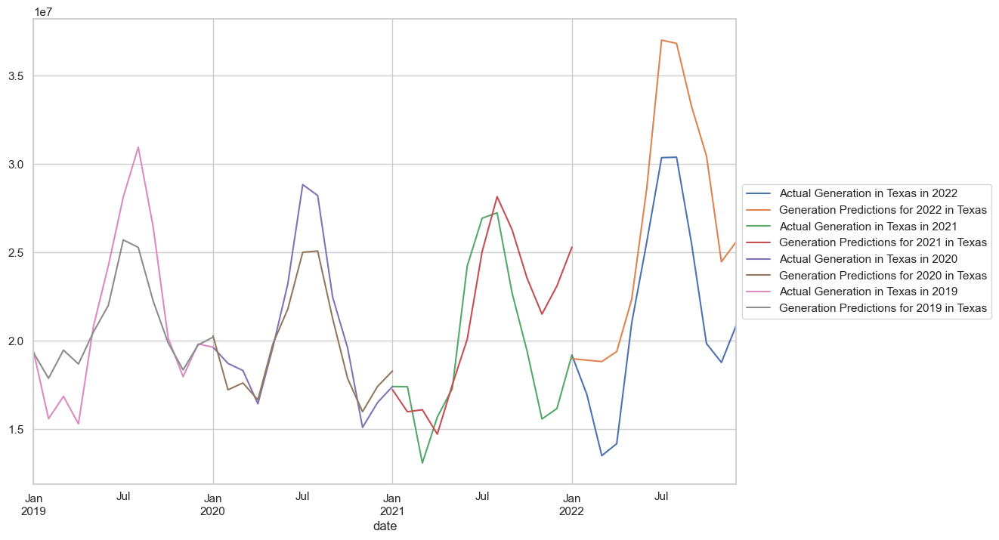



Mean Absolute Error (MAE) 2022: 4911033.414755415
Mean Absolute Error (MAE) 2021: 3029285.029301723
Mean Absolute Error (MAE) 2020: 1329118.1869040357
Mean Absolute Error (MAE) 2019: 1884013.2421731765
Promedio MAE: 2788362.4682835876


Mean Squared Error (MSE) 2022: 31963243524205.86
Mean Squared Error (MSE) 2021: 14140943733022.967
Mean Squared Error (MSE) 2020: 2816505942678.5703
Mean Squared Error (MSE) 2019: 6520976030281.89
Promedio MSE: 13860417307547.322


Root Mean Squared Error (RMSE) 2022: 5653604.4718573885
Root Mean Squared Error (RMSE) 2021: 3760444.6190607524
Root Mean Squared Error (RMSE) 2020: 1678244.8994942813
Root Mean Squared Error (RMSE) 2019: 2553620.181288104
Promedio RMSE: 3411478.5429251315


Mean Absolute Percentage Error (MAPE) 2022: 23.909783540121875
Mean Absolute Percentage Error (MAPE) 2021: 16.67164397109212
Mean Absolute Percentage Error (MAPE) 2020: 6.054350451455473
Mean Absolute Percentage Error (MAPE) 2019: 8.687693121858588
Promedio MAPE: 13.830

In [ ]:
# TEXAS NATURAL GAS

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_texas_train_gas_2022 = df_texas_pred_gas[df_texas_pred_gas.index < '2022-01-01']
df_texas_test_gas_2022 = df_texas_pred_gas[df_texas_pred_gas.index >= '2022-01-01']

df_texas_train_gas_2021 = df_texas_pred_gas[df_texas_pred_gas.index < '2021-01-01']
df_texas_test_gas_2021 = df_texas_pred_gas[(df_texas_pred_gas.index >= '2021-01-01') & (df_texas_pred_gas.index < '2022-01-31')]

df_texas_train_gas_2020 = df_texas_pred_gas[df_texas_pred_gas.index < '2020-01-01']
df_texas_test_gas_2020 = df_texas_pred_gas[(df_texas_pred_gas.index >= '2020-01-01') & (df_texas_pred_gas.index < '2021-01-31')]

df_texas_train_gas_2019 = df_texas_pred_gas[df_texas_pred_gas.index < '2019-01-01']
df_texas_test_gas_2019 = df_texas_pred_gas[(df_texas_pred_gas.index >= '2019-01-01') & (df_texas_pred_gas.index < '2020-01-31')]

# Creamos el modelo
results_texas_gas_2022 = sarimax_train(df_texas_train_gas_2022)
results_texas_gas_2021 = sarimax_train(df_texas_train_gas_2021)
results_texas_gas_2020 = sarimax_train(df_texas_train_gas_2020)
results_texas_gas_2019 = sarimax_train(df_texas_train_gas_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_texas_gas_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_texas_test_gas_2022, results_texas_gas_2022)
predictions_texas_gas_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_texas_test_gas_2021, results_texas_gas_2021)
predictions_texas_gas_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_texas_test_gas_2020, results_texas_gas_2020)
predictions_texas_gas_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_texas_test_gas_2019, results_texas_gas_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_texas_test_gas_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2022')
predictions_texas_gas_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Texas')

df_texas_test_gas_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2021')
predictions_texas_gas_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Texas')

df_texas_test_gas_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2020')
predictions_texas_gas_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Texas')

df_texas_test_gas_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2019')
predictions_texas_gas_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Texas')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_texas_gas_2022, mse_texas_gas_2022, rmse_texas_gas_2022, mape_texas_gas_2022, r2_texas_gas_2022 = calculo_metricas(df_texas_test_gas_2022, predictions_texas_gas_2022)
mae_texas_gas_2021, mse_texas_gas_2021, rmse_texas_gas_2021, mape_texas_gas_2021, r2_texas_gas_2021 = calculo_metricas(df_texas_test_gas_2021, predictions_texas_gas_2021)
mae_texas_gas_2020, mse_texas_gas_2020, rmse_texas_gas_2020, mape_texas_gas_2020, r2_texas_gas_2020 = calculo_metricas(df_texas_test_gas_2020, predictions_texas_gas_2020)
mae_texas_gas_2019, mse_texas_gas_2019, rmse_texas_gas_2019, mape_texas_gas_2019, r2_texas_gas_2019 = calculo_metricas(df_texas_test_gas_2019, predictions_texas_gas_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_texas_gas_2022)
print("Mean Absolute Error (MAE) 2021:", mae_texas_gas_2021)
print("Mean Absolute Error (MAE) 2020:", mae_texas_gas_2020)
print("Mean Absolute Error (MAE) 2019:", mae_texas_gas_2019)
print('Promedio MAE:', statistics.mean([mae_texas_gas_2022, mae_texas_gas_2021, mae_texas_gas_2020, mae_texas_gas_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_texas_gas_2022)
print("Mean Squared Error (MSE) 2021:", mse_texas_gas_2021)
print("Mean Squared Error (MSE) 2020:", mse_texas_gas_2020)
print("Mean Squared Error (MSE) 2019:", mse_texas_gas_2019)
print('Promedio MSE:', statistics.mean([mse_texas_gas_2022, mse_texas_gas_2021, mse_texas_gas_2020, mse_texas_gas_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_texas_gas_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_texas_gas_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_texas_gas_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_texas_gas_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_gas_2022, rmse_texas_gas_2021, rmse_texas_gas_2020, rmse_texas_gas_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_texas_gas_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_texas_gas_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_texas_gas_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_texas_gas_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_gas_2022, mape_texas_gas_2021, mape_texas_gas_2020, mape_texas_gas_2019]))
print('\n')
print("R2 Score 2022:", r2_texas_gas_2022)
print("R2 Score 2021:", r2_texas_gas_2021)
print("R2 Score 2020:", r2_texas_gas_2020)
print("R2 Score 2019:", r2_texas_gas_2019)
print('Promedio R2:', statistics.mean([r2_texas_gas_2022, r2_texas_gas_2021, r2_texas_gas_2020, r2_texas_gas_2019]))

### Texas - Renewables

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.48611D+01    |proj g|=  1.15487D-01

At iterate    5    f=  1.47870D+01    |proj g|=  2.76879D-02


 This problem is unconstrained.



At iterate   10    f=  1.47599D+01    |proj g|=  8.74045D-03

At iterate   15    f=  1.47567D+01    |proj g|=  1.03011D-02

At iterate   20    f=  1.47524D+01    |proj g|=  4.10526D-03

At iterate   25    f=  1.47504D+01    |proj g|=  3.05094D-03

At iterate   30    f=  1.47499D+01    |proj g|=  2.10617D-04

At iterate   35    f=  1.47499D+01    |proj g|=  1.02398D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     35     38      1     0     0   1.024D-05   1.475D+01
  F =   14.749861956539760     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   10    f=  1.46202D+01    |proj g|=  4.81077D-02

At iterate   15    f=  1.46092D+01    |proj g|=  1.47364D-03

At iterate   20    f=  1.46092D+01    |proj g|=  5.39746D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     23     25      1     0     0   4.764D-05   1.461D+01
  F =   14.609177447945081     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.46560D+01    |proj g|=  7.29386D-02

At iter

 This problem is unconstrained.



At iterate   10    f=  1.45873D+01    |proj g|=  5.57317D-02

At iterate   15    f=  1.45776D+01    |proj g|=  1.66677D-03

At iterate   20    f=  1.45776D+01    |proj g|=  7.92149D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     20     25      1     0     0   7.921D-06   1.458D+01
  F =   14.577576981544333     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.46386D+01    |proj g|=  6.78722D-02

At iter

 This problem is unconstrained.



At iterate   10    f=  1.45980D+01    |proj g|=  3.60043D-02

At iterate   15    f=  1.45889D+01    |proj g|=  1.78201D-02

At iterate   20    f=  1.45768D+01    |proj g|=  4.15208D-02

At iterate   25    f=  1.45752D+01    |proj g|=  2.99529D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     29     33      1     0     0   4.324D-06   1.458D+01
  F =   14.575161943086549     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


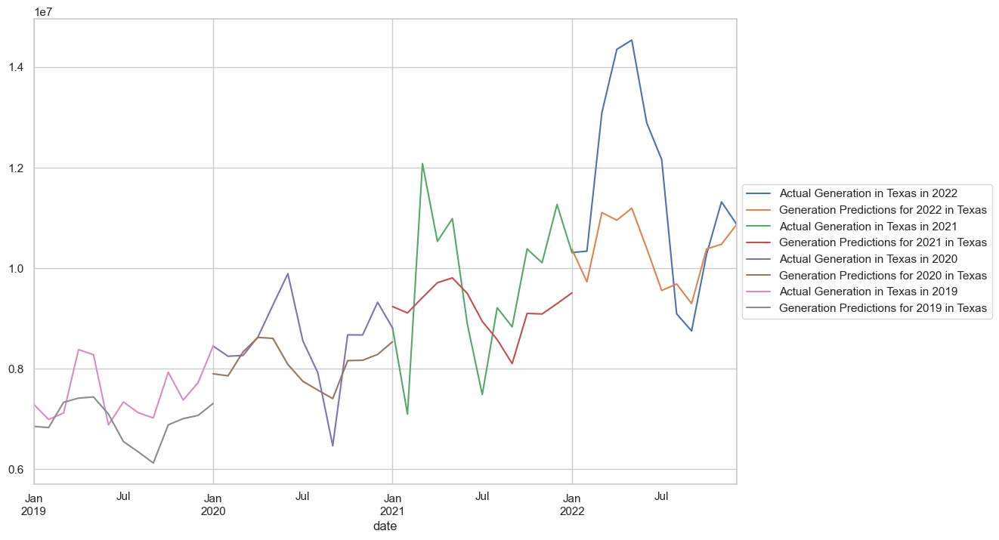



Mean Absolute Error (MAE) 2022: 1383989.5701942744
Mean Absolute Error (MAE) 2021: 1200484.0240699642
Mean Absolute Error (MAE) 2020: 608588.8167604629
Mean Absolute Error (MAE) 2019: 654727.9174312296
Promedio MAE: 961947.5821139828


Mean Squared Error (MSE) 2022: 3454178346639.576
Mean Squared Error (MSE) 2021: 1849272860054.6318
Mean Squared Error (MSE) 2020: 575723405182.1449
Mean Squared Error (MSE) 2019: 534354552832.52704
Promedio MSE: 1603382291177.22


Root Mean Squared Error (RMSE) 2022: 1858541.9948549927
Root Mean Squared Error (RMSE) 2021: 1359879.7226426431
Root Mean Squared Error (RMSE) 2020: 758764.3937232064
Root Mean Squared Error (RMSE) 2019: 730995.5901594256
Promedio RMSE: 1177045.425345067


Mean Absolute Percentage Error (MAPE) 2022: 10.879580222236601
Mean Absolute Percentage Error (MAPE) 2021: 12.53418327039999
Mean Absolute Percentage Error (MAPE) 2020: 7.071165483804778
Mean Absolute Percentage Error (MAPE) 2019: 8.521391288286564
Promedio MAPE: 9.75158006

In [ ]:
# TEXAS RENEWABLES

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_texas_train_renewables_2022 = df_texas_pred_renewables[df_texas_pred_renewables.index < '2022-01-01']
df_texas_test_renewables_2022 = df_texas_pred_renewables[df_texas_pred_renewables.index >= '2022-01-01']

df_texas_train_renewables_2021 = df_texas_pred_renewables[df_texas_pred_renewables.index < '2021-01-01']
df_texas_test_renewables_2021 = df_texas_pred_renewables[(df_texas_pred_renewables.index >= '2021-01-01') & (df_texas_pred_renewables.index < '2022-01-31')]

df_texas_train_renewables_2020 = df_texas_pred_renewables[df_texas_pred_renewables.index < '2020-01-01']
df_texas_test_renewables_2020 = df_texas_pred_renewables[(df_texas_pred_renewables.index >= '2020-01-01') & (df_texas_pred_renewables.index < '2021-01-31')]

df_texas_train_renewables_2019 = df_texas_pred_renewables[df_texas_pred_renewables.index < '2019-01-01']
df_texas_test_renewables_2019 = df_texas_pred_renewables[(df_texas_pred_renewables.index >= '2019-01-01') & (df_texas_pred_renewables.index < '2020-01-31')]

# Creamos el modelo
results_texas_renewables_2022 = sarimax_train(df_texas_train_renewables_2022)
results_texas_renewables_2021 = sarimax_train(df_texas_train_renewables_2021)
results_texas_renewables_2020 = sarimax_train(df_texas_train_renewables_2020)
results_texas_renewables_2019 = sarimax_train(df_texas_train_renewables_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_texas_renewables_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_texas_test_renewables_2022, results_texas_renewables_2022)
predictions_texas_renewables_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_texas_test_renewables_2021, results_texas_renewables_2021)
predictions_texas_renewables_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_texas_test_renewables_2020, results_texas_renewables_2020)
predictions_texas_renewables_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_texas_test_renewables_2019, results_texas_renewables_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_texas_test_renewables_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2022')
predictions_texas_renewables_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Texas')

df_texas_test_renewables_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2021')
predictions_texas_renewables_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Texas')

df_texas_test_renewables_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2020')
predictions_texas_renewables_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Texas')

df_texas_test_renewables_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2019')
predictions_texas_renewables_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Texas')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_texas_renewables_2022, mse_texas_renewables_2022, rmse_texas_renewables_2022, mape_texas_renewables_2022, r2_texas_renewables_2022 = calculo_metricas(df_texas_test_renewables_2022, predictions_texas_renewables_2022)
mae_texas_renewables_2021, mse_texas_renewables_2021, rmse_texas_renewables_2021, mape_texas_renewables_2021, r2_texas_renewables_2021 = calculo_metricas(df_texas_test_renewables_2021, predictions_texas_renewables_2021)
mae_texas_renewables_2020, mse_texas_renewables_2020, rmse_texas_renewables_2020, mape_texas_renewables_2020, r2_texas_renewables_2020 = calculo_metricas(df_texas_test_renewables_2020, predictions_texas_renewables_2020)
mae_texas_renewables_2019, mse_texas_renewables_2019, rmse_texas_renewables_2019, mape_texas_renewables_2019, r2_texas_renewables_2019 = calculo_metricas(df_texas_test_renewables_2019, predictions_texas_renewables_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_texas_renewables_2022)
print("Mean Absolute Error (MAE) 2021:", mae_texas_renewables_2021)
print("Mean Absolute Error (MAE) 2020:", mae_texas_renewables_2020)
print("Mean Absolute Error (MAE) 2019:", mae_texas_renewables_2019)
print('Promedio MAE:', statistics.mean([mae_texas_renewables_2022, mae_texas_renewables_2021, mae_texas_renewables_2020, mae_texas_renewables_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_texas_renewables_2022)
print("Mean Squared Error (MSE) 2021:", mse_texas_renewables_2021)
print("Mean Squared Error (MSE) 2020:", mse_texas_renewables_2020)
print("Mean Squared Error (MSE) 2019:", mse_texas_renewables_2019)
print('Promedio MSE:', statistics.mean([mse_texas_renewables_2022, mse_texas_renewables_2021, mse_texas_renewables_2020, mse_texas_renewables_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_texas_renewables_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_texas_renewables_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_texas_renewables_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_texas_renewables_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_renewables_2022, rmse_texas_renewables_2021, rmse_texas_renewables_2020, rmse_texas_renewables_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_texas_renewables_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_texas_renewables_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_texas_renewables_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_texas_renewables_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_renewables_2022, mape_texas_renewables_2021, mape_texas_renewables_2020, mape_texas_renewables_2019]))
print('\n')
print("R2 Score 2022:", r2_texas_renewables_2022)
print("R2 Score 2021:", r2_texas_renewables_2021)
print("R2 Score 2020:", r2_texas_renewables_2020)
print("R2 Score 2019:", r2_texas_renewables_2019)
print('Promedio R2:', statistics.mean([r2_texas_renewables_2022, r2_texas_renewables_2021, r2_texas_renewables_2020, r2_texas_renewables_2019]))

### Texas - Nuclear

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.51414D+01    |proj g|=  1.31628D+00

At iterate    5    f=  1.43654D+01    |proj g|=  1.36796D-01


 This problem is unconstrained.



At iterate   10    f=  1.43179D+01    |proj g|=  1.82040D-02

At iterate   15    f=  1.43066D+01    |proj g|=  3.99279D-03

At iterate   20    f=  1.43063D+01    |proj g|=  5.28097D-04

At iterate   25    f=  1.43062D+01    |proj g|=  3.63579D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     29     35      1     0     0   1.502D-05   1.431D+01
  F =   14.306214790535201     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   15    f=  1.43036D+01    |proj g|=  4.85490D-03

At iterate   20    f=  1.43029D+01    |proj g|=  3.49659D-03

At iterate   25    f=  1.43020D+01    |proj g|=  3.08066D-03

At iterate   30    f=  1.43020D+01    |proj g|=  1.13261D-04

At iterate   35    f=  1.43008D+01    |proj g|=  3.59593D-03

At iterate   40    f=  1.43003D+01    |proj g|=  5.35021D-04

At iterate   45    f=  1.43002D+01    |proj g|=  2.86214D-04



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     48     69      1     0     0   2.526D-05   1.430D+01
  F =   14.300173545020286     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.51122D+01    |proj g|=  1.28472D+00

At iterate    5    f=  1.43574D+01    |proj g|=  9.13110D-02

At iterate   10    f=  1.43327D+01    |proj g|=  2.66758D-02

At iterate   15    f=  1.43251D+01    |proj g|=  1.32058D-03

At iter

 This problem is unconstrained.



At iterate   20    f=  1.43334D+01    |proj g|=  3.03796D-03

At iterate   25    f=  1.43326D+01    |proj g|=  1.08402D-02

At iterate   30    f=  1.43311D+01    |proj g|=  8.87602D-03

At iterate   35    f=  1.43304D+01    |proj g|=  1.51312D-03

At iterate   40    f=  1.43302D+01    |proj g|=  1.74468D-03



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     44     61      1     0     0   1.055D-04   1.433D+01
  F =   14.330199620102235     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


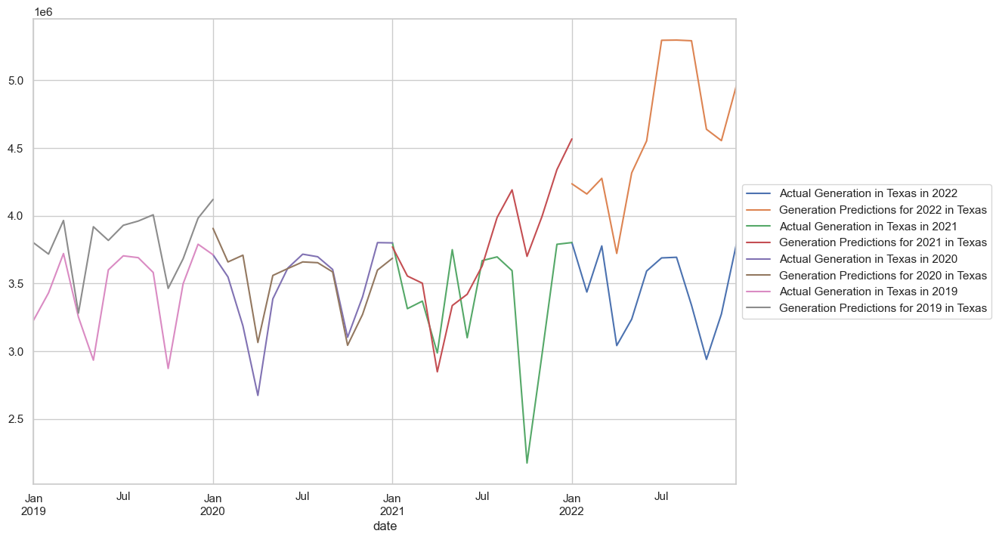



Mean Absolute Error (MAE) 2022: 1141033.4522762445
Mean Absolute Error (MAE) 2021: 466654.51385237207
Mean Absolute Error (MAE) 2020: 155307.04693325976
Mean Absolute Error (MAE) 2019: 356308.7050393709
Promedio MAE: 529825.9295253118


Mean Squared Error (MSE) 2022: 1531682090612.617
Mean Squared Error (MSE) 2021: 390095134335.75616
Mean Squared Error (MSE) 2020: 45009380374.8613
Mean Squared Error (MSE) 2019: 183016762602.67413
Promedio MSE: 537450841981.4771


Root Mean Squared Error (RMSE) 2022: 1237611.4457343293
Root Mean Squared Error (RMSE) 2021: 624575.9636231258
Root Mean Squared Error (RMSE) 2020: 212154.14295945602
Root Mean Squared Error (RMSE) 2019: 427804.58459754044
Promedio RMSE: 625536.5342286129


Mean Absolute Percentage Error (MAPE) 2022: 33.45810709475604
Mean Absolute Percentage Error (MAPE) 2021: 15.597663187531962
Mean Absolute Percentage Error (MAPE) 2020: 4.7574390774927835
Mean Absolute Percentage Error (MAPE) 2019: 10.798577181595938
Promedio MAPE: 16.152

In [ ]:
# TEXAS NUCLEAR

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_texas_train_nuclear_2022 = df_texas_pred_nuclear[df_texas_pred_nuclear.index < '2022-01-01']
df_texas_test_nuclear_2022 = df_texas_pred_nuclear[df_texas_pred_nuclear.index >= '2022-01-01']

df_texas_train_nuclear_2021 = df_texas_pred_nuclear[df_texas_pred_nuclear.index < '2021-01-01']
df_texas_test_nuclear_2021 = df_texas_pred_nuclear[(df_texas_pred_nuclear.index >= '2021-01-01') & (df_texas_pred_nuclear.index < '2022-01-31')]

df_texas_train_nuclear_2020 = df_texas_pred_nuclear[df_texas_pred_nuclear.index < '2020-01-01']
df_texas_test_nuclear_2020 = df_texas_pred_nuclear[(df_texas_pred_nuclear.index >= '2020-01-01') & (df_texas_pred_nuclear.index < '2021-01-31')]

df_texas_train_nuclear_2019 = df_texas_pred_nuclear[df_texas_pred_nuclear.index < '2019-01-01']
df_texas_test_nuclear_2019 = df_texas_pred_nuclear[(df_texas_pred_nuclear.index >= '2019-01-01') & (df_texas_pred_nuclear.index < '2020-01-31')]

# Creamos el modelo
results_texas_nuclear_2022 = sarimax_train(df_texas_train_nuclear_2022)
results_texas_nuclear_2021 = sarimax_train(df_texas_train_nuclear_2021)
results_texas_nuclear_2020 = sarimax_train(df_texas_train_nuclear_2020)
results_texas_nuclear_2019 = sarimax_train(df_texas_train_nuclear_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_texas_nuclear_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_texas_test_nuclear_2022, results_texas_nuclear_2022)
predictions_texas_nuclear_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_texas_test_nuclear_2021, results_texas_nuclear_2021)
predictions_texas_nuclear_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_texas_test_nuclear_2020, results_texas_nuclear_2020)
predictions_texas_nuclear_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_texas_test_nuclear_2019, results_texas_nuclear_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_texas_test_nuclear_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2022')
predictions_texas_nuclear_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Texas')

df_texas_test_nuclear_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2021')
predictions_texas_nuclear_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Texas')

df_texas_test_nuclear_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2020')
predictions_texas_nuclear_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Texas')

df_texas_test_nuclear_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Texas in 2019')
predictions_texas_nuclear_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Texas')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_texas_nuclear_2022, mse_texas_nuclear_2022, rmse_texas_nuclear_2022, mape_texas_nuclear_2022, r2_texas_nuclear_2022 = calculo_metricas(df_texas_test_nuclear_2022, predictions_texas_nuclear_2022)
mae_texas_nuclear_2021, mse_texas_nuclear_2021, rmse_texas_nuclear_2021, mape_texas_nuclear_2021, r2_texas_nuclear_2021 = calculo_metricas(df_texas_test_nuclear_2021, predictions_texas_nuclear_2021)
mae_texas_nuclear_2020, mse_texas_nuclear_2020, rmse_texas_nuclear_2020, mape_texas_nuclear_2020, r2_texas_nuclear_2020 = calculo_metricas(df_texas_test_nuclear_2020, predictions_texas_nuclear_2020)
mae_texas_nuclear_2019, mse_texas_nuclear_2019, rmse_texas_nuclear_2019, mape_texas_nuclear_2019, r2_texas_nuclear_2019 = calculo_metricas(df_texas_test_nuclear_2019, predictions_texas_nuclear_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_texas_nuclear_2022)
print("Mean Absolute Error (MAE) 2021:", mae_texas_nuclear_2021)
print("Mean Absolute Error (MAE) 2020:", mae_texas_nuclear_2020)
print("Mean Absolute Error (MAE) 2019:", mae_texas_nuclear_2019)
print('Promedio MAE:', statistics.mean([mae_texas_nuclear_2022, mae_texas_nuclear_2021, mae_texas_nuclear_2020, mae_texas_nuclear_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_texas_nuclear_2022)
print("Mean Squared Error (MSE) 2021:", mse_texas_nuclear_2021)
print("Mean Squared Error (MSE) 2020:", mse_texas_nuclear_2020)
print("Mean Squared Error (MSE) 2019:", mse_texas_nuclear_2019)
print('Promedio MSE:', statistics.mean([mse_texas_nuclear_2022, mse_texas_nuclear_2021, mse_texas_nuclear_2020, mse_texas_nuclear_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_texas_nuclear_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_texas_nuclear_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_texas_nuclear_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_texas_nuclear_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_nuclear_2022, rmse_texas_nuclear_2021, rmse_texas_nuclear_2020, rmse_texas_nuclear_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_texas_nuclear_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_texas_nuclear_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_texas_nuclear_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_texas_nuclear_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_nuclear_2022, mape_texas_nuclear_2021, mape_texas_nuclear_2020, mape_texas_nuclear_2019]))
print('\n')
print("R2 Score 2022:", r2_texas_nuclear_2022)
print("R2 Score 2021:", r2_texas_nuclear_2021)
print("R2 Score 2020:", r2_texas_nuclear_2020)
print("R2 Score 2019:", r2_texas_nuclear_2019)
print('Promedio R2:', statistics.mean([r2_texas_nuclear_2022, r2_texas_nuclear_2021, r2_texas_nuclear_2020, r2_texas_nuclear_2019]))

### California - General

In [ ]:
# Creamos el dataset que necesitamos filtrando por texas primero, y luego por cada fuente de energía
df_california_pred = df_pred_general[df_pred_general['state'] == 'California'].copy()
#df_california_pred_coal = df_pred_source[(df_pred_source['source'] == 'all coal products') & (df_pred_source['state'] == 'California')].copy()
df_california_pred_renewables = df_pred_source[(df_pred_source['source'] == 'all renewables') & (df_pred_source['state'] == 'California')].copy()
df_california_pred_gas = df_pred_source[(df_pred_source['source'] == 'natural gas') & (df_pred_source['state'] == 'California')].copy()
df_california_pred_nuclear = df_pred_source[(df_pred_source['source'] == 'nuclear') & (df_pred_source['state'] == 'California')].copy()

# Ahora convertimos todas las fechas en el index del dataframe para poder hacer una serie de tiempo
df_california_pred.set_index('date', inplace=True)
df_california_pred.index.freq = 'MS'
#df_california_pred_coal.set_index('date', inplace=True)
#df_california_pred_coal.index.freq = 'MS'
df_california_pred_renewables.set_index('date', inplace=True)
df_california_pred_renewables.index.freq = 'MS'
df_california_pred_gas.set_index('date', inplace=True)
df_california_pred_gas.index.freq = 'MS'
df_california_pred_nuclear.set_index('date', inplace=True)
df_california_pred_nuclear.index.freq = 'MS'

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.55414D+01    |proj g|=  2.40311D-01

At iterate    5    f=  1.54859D+01    |proj g|=  1.10936D-02

At iterate   10    f=  1.54842D+01    |proj g|=  3.22448D-03


 This problem is unconstrained.



At iterate   15    f=  1.54838D+01    |proj g|=  9.34924D-04

At iterate   20    f=  1.54831D+01    |proj g|=  3.15424D-02

At iterate   25    f=  1.54768D+01    |proj g|=  9.72257D-03

At iterate   30    f=  1.54744D+01    |proj g|=  5.38480D-03

At iterate   35    f=  1.54737D+01    |proj g|=  5.07524D-04

At iterate   40    f=  1.54737D+01    |proj g|=  1.64219D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     40     51      1     0     0   1.642D-05   1.547D+01
  F =   15.473740228231222     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.55415D+01    |proj g|=  2.32663D-01

At iterate    5    f=  1.54879D+01    |proj g|=  6.85942D-03

At iterate   10    f=  1.54868D+01    |proj g|=  3.34882D-04

At iterate   15    f=  1.54868D+01    |proj g|=  9.24523D-04

At iterate   20    f=  1.54867D+01    |proj g|=  7.98558D-03

At iterate   25    f=  1.54863D+01    |proj g|=  4.03187D-03

At iterate   30    f=  1.54862D+01    |proj g|=  1.01363D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.



At iterate   25    f=  1.54903D+01    |proj g|=  7.27167D-03

At iterate   30    f=  1.54893D+01    |proj g|=  2.71937D-03

At iterate   35    f=  1.54884D+01    |proj g|=  9.37130D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     39     50      1     0     0   3.276D-06   1.549D+01
  F =   15.488416297170387     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.59530D+01    |proj g|=  6.66315D-01


 This problem is unconstrained.



At iterate    5    f=  1.54842D+01    |proj g|=  3.95762D-02

At iterate   10    f=  1.54732D+01    |proj g|=  4.91937D-03

At iterate   15    f=  1.54718D+01    |proj g|=  8.59619D-03

At iterate   20    f=  1.54714D+01    |proj g|=  1.25550D-03

At iterate   25    f=  1.54712D+01    |proj g|=  9.76953D-04

At iterate   30    f=  1.54704D+01    |proj g|=  3.05088D-03

At iterate   35    f=  1.54704D+01    |proj g|=  6.74683D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     35     43      1     0     0   6.747D-05   1.547D+01
  F =   15.470412384566094     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

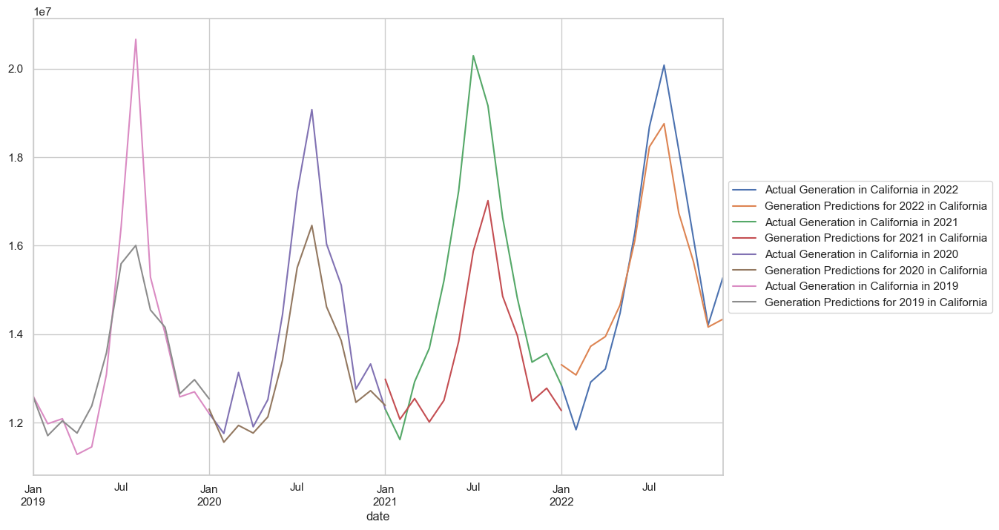



Mean Absolute Error (MAE) 2022: 692473.6408828385
Mean Absolute Error (MAE) 2021: 1592926.072244655
Mean Absolute Error (MAE) 2020: 848775.0756636922
Mean Absolute Error (MAE) 2019: 712664.9499289125
Promedio MAE: 961709.9346800246


Mean Squared Error (MSE) 2022: 677474245248.4391
Mean Squared Error (MSE) 2021: 4012464820847.8486
Mean Squared Error (MSE) 2020: 1269326415943.9475
Mean Squared Error (MSE) 2019: 1886960454877.2642
Promedio MSE: 1961556484229.3748


Root Mean Squared Error (RMSE) 2022: 823088.2366116279
Root Mean Squared Error (RMSE) 2021: 2003113.7813034607
Root Mean Squared Error (RMSE) 2020: 1126643.8727228527
Root Mean Squared Error (RMSE) 2019: 1373666.7917938703
Promedio RMSE: 1331628.1706079529


Mean Absolute Percentage Error (MAPE) 2022: 4.564205095442481
Mean Absolute Percentage Error (MAPE) 2021: 9.866955804119854
Mean Absolute Percentage Error (MAPE) 2020: 5.490177952120662
Mean Absolute Percentage Error (MAPE) 2019: 4.436616878204517
Promedio MAPE: 6.089488

In [ ]:
# CALIFORNIA GENERAL

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_california_train_general_2022 = df_california_pred[df_california_pred.index < '2022-01-01']
df_california_test_general_2022 = df_california_pred[df_california_pred.index >= '2022-01-01']

df_california_train_general_2021 = df_california_pred[df_california_pred.index < '2021-01-01']
df_california_test_general_2021 = df_california_pred[(df_california_pred.index >= '2021-01-01') & (df_california_pred.index < '2022-01-31')]

df_california_train_general_2020 = df_california_pred[df_california_pred.index < '2020-01-01']
df_california_test_general_2020 = df_california_pred[(df_california_pred.index >= '2020-01-01') & (df_california_pred.index < '2021-01-31')]

df_california_train_general_2019 = df_california_pred[df_california_pred.index < '2019-01-01']
df_california_test_general_2019 = df_california_pred[(df_california_pred.index >= '2019-01-01') & (df_california_pred.index < '2020-01-31')]

# Creamos el modelo
results_california_general_2022 = sarimax_train(df_california_train_general_2022)
results_california_general_2021 = sarimax_train(df_california_train_general_2021)
results_california_general_2020 = sarimax_train(df_california_train_general_2020)
results_california_general_2019 = sarimax_train(df_california_train_general_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_california_general_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_california_test_general_2022, results_california_general_2022)
predictions_california_general_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_california_test_general_2021, results_california_general_2021)
predictions_california_general_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_california_test_general_2020, results_california_general_2020)
predictions_california_general_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_california_test_general_2019, results_california_general_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_california_test_general_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2022')
predictions_california_general_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in California')

df_california_test_general_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2021')
predictions_california_general_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in California')

df_california_test_general_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2020')
predictions_california_general_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in California')

df_california_test_general_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2019')
predictions_california_general_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in California')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_california_general_2022, mse_california_general_2022, rmse_california_general_2022, mape_california_general_2022, r2_california_general_2022 = calculo_metricas(df_california_test_general_2022, predictions_california_general_2022)
mae_california_general_2021, mse_california_general_2021, rmse_california_general_2021, mape_california_general_2021, r2_california_general_2021 = calculo_metricas(df_california_test_general_2021, predictions_california_general_2021)
mae_california_general_2020, mse_california_general_2020, rmse_california_general_2020, mape_california_general_2020, r2_california_general_2020 = calculo_metricas(df_california_test_general_2020, predictions_california_general_2020)
mae_california_general_2019, mse_california_general_2019, rmse_california_general_2019, mape_california_general_2019, r2_california_general_2019 = calculo_metricas(df_california_test_general_2019, predictions_california_general_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_california_general_2022)
print("Mean Absolute Error (MAE) 2021:", mae_california_general_2021)
print("Mean Absolute Error (MAE) 2020:", mae_california_general_2020)
print("Mean Absolute Error (MAE) 2019:", mae_california_general_2019)
print('Promedio MAE:', statistics.mean([mae_california_general_2022, mae_california_general_2021, mae_california_general_2020, mae_california_general_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_california_general_2022)
print("Mean Squared Error (MSE) 2021:", mse_california_general_2021)
print("Mean Squared Error (MSE) 2020:", mse_california_general_2020)
print("Mean Squared Error (MSE) 2019:", mse_california_general_2019)
print('Promedio MSE:', statistics.mean([mse_california_general_2022, mse_california_general_2021, mse_california_general_2020, mse_california_general_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_california_general_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_california_general_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_california_general_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_california_general_2019)
print('Promedio RMSE:', statistics.mean([rmse_california_general_2022, rmse_california_general_2021, rmse_california_general_2020, rmse_california_general_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_california_general_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_california_general_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_california_general_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_california_general_2019)
print('Promedio MAPE:', statistics.mean([mape_california_general_2022, mape_california_general_2021, mape_california_general_2020, mape_california_general_2019]))
print('\n')
print("R2 Score 2022:", r2_california_general_2022)
print("R2 Score 2021:", r2_california_general_2021)
print("R2 Score 2020:", r2_california_general_2020)
print("R2 Score 2019:", r2_california_general_2019)
print('Promedio R2:', statistics.mean([r2_california_general_2022, r2_california_general_2021, r2_california_general_2020, r2_california_general_2019]))

### California - Natural Gas

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.53836D+01    |proj g|=  1.91720D-01



 This problem is unconstrained.


At iterate    5    f=  1.53511D+01    |proj g|=  1.17709D-02

At iterate   10    f=  1.53431D+01    |proj g|=  1.01538D-02

At iterate   15    f=  1.53419D+01    |proj g|=  2.10012D-03

At iterate   20    f=  1.53415D+01    |proj g|=  3.89223D-04

At iterate   25    f=  1.53415D+01    |proj g|=  1.61326D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     27     31      1     0     0   7.984D-06   1.534D+01
  F =   15.341510881806217     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10


 This problem is unconstrained.



At iterate    5    f=  1.53526D+01    |proj g|=  5.67650D-03

At iterate   10    f=  1.53507D+01    |proj g|=  7.86135D-04

At iterate   15    f=  1.53506D+01    |proj g|=  1.22522D-03

At iterate   20    f=  1.53472D+01    |proj g|=  2.36189D-03

At iterate   25    f=  1.53471D+01    |proj g|=  2.38372D-04

At iterate   30    f=  1.53471D+01    |proj g|=  1.22860D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     33     41      1     0     0   3.175D-06   1.535D+01
  F =   15.347083550121340     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   15    f=  1.53523D+01    |proj g|=  4.22019D-04

At iterate   20    f=  1.53514D+01    |proj g|=  1.63784D-02

At iterate   25    f=  1.53484D+01    |proj g|=  1.78438D-03

At iterate   30    f=  1.53484D+01    |proj g|=  6.46327D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     31     40      1     0     0   1.438D-06   1.535D+01
  F =   15.348403257498036     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   15    f=  1.53639D+01    |proj g|=  1.83864D-02

At iterate   20    f=  1.53624D+01    |proj g|=  1.62049D-03

At iterate   25    f=  1.53619D+01    |proj g|=  3.09566D-04

At iterate   30    f=  1.53619D+01    |proj g|=  1.48519D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     31     39      1     0     0   8.084D-06   1.536D+01
  F =   15.361907785378383     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


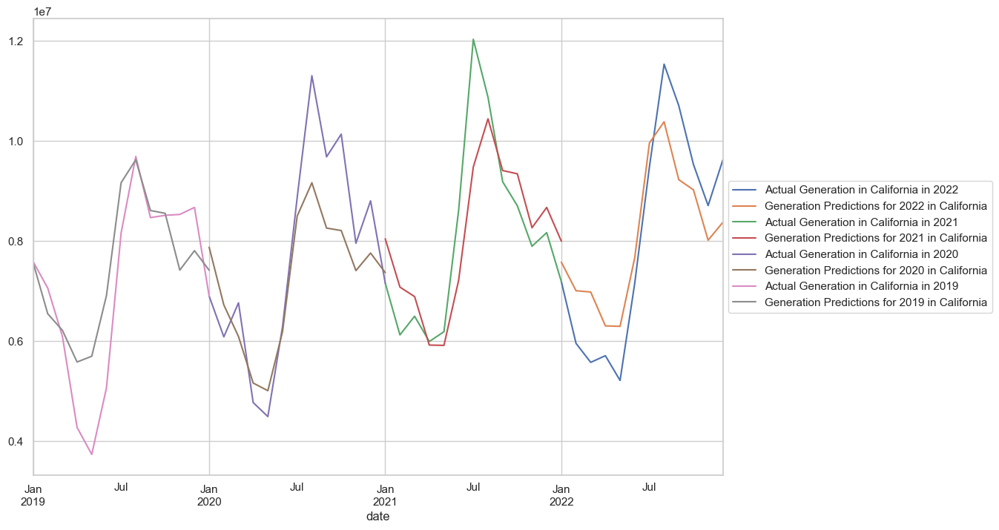



Mean Absolute Error (MAE) 2022: 883050.7996715548
Mean Absolute Error (MAE) 2021: 731837.6661935751
Mean Absolute Error (MAE) 2020: 843657.825769174
Mean Absolute Error (MAE) 2019: 732542.9187048032
Promedio MAE: 797772.3025847768


Mean Squared Error (MSE) 2022: 922477571529.4938
Mean Squared Error (MSE) 2021: 931204976598.4264
Mean Squared Error (MSE) 2020: 1088516790307.4799
Mean Squared Error (MSE) 2019: 965788357147.2349
Promedio MSE: 976996923895.6587


Root Mean Squared Error (RMSE) 2022: 960456.9597485843
Root Mean Squared Error (RMSE) 2021: 964989.6251247608
Root Mean Squared Error (RMSE) 2020: 1043320.0804678686
Root Mean Squared Error (RMSE) 2019: 982745.3165226659
Promedio RMSE: 987877.9954659699


Mean Absolute Percentage Error (MAPE) 2022: 11.817038333584188
Mean Absolute Percentage Error (MAPE) 2021: 8.694523505179287
Mean Absolute Percentage Error (MAPE) 2020: 10.347383206482682
Mean Absolute Percentage Error (MAPE) 2019: 13.458948384824366
Promedio MAPE: 11.079473357

In [ ]:
# CALIFORNIA NATURAL GAS

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_california_train_gas_2022 = df_california_pred_gas[df_california_pred_gas.index < '2022-01-01']
df_california_test_gas_2022 = df_california_pred_gas[df_california_pred_gas.index >= '2022-01-01']

df_california_train_gas_2021 = df_california_pred_gas[df_california_pred_gas.index < '2021-01-01']
df_california_test_gas_2021 = df_california_pred_gas[(df_california_pred_gas.index >= '2021-01-01') & (df_california_pred_gas.index < '2022-01-31')]

df_california_train_gas_2020 = df_california_pred_gas[df_california_pred_gas.index < '2020-01-01']
df_california_test_gas_2020 = df_california_pred_gas[(df_california_pred_gas.index >= '2020-01-01') & (df_california_pred_gas.index < '2021-01-31')]

df_california_train_gas_2019 = df_california_pred_gas[df_california_pred_gas.index < '2019-01-01']
df_california_test_gas_2019 = df_california_pred_gas[(df_california_pred_gas.index >= '2019-01-01') & (df_california_pred_gas.index < '2020-01-31')]

# Creamos el modelo
results_california_gas_2022 = sarimax_train(df_california_train_gas_2022)
results_california_gas_2021 = sarimax_train(df_california_train_gas_2021)
results_california_gas_2020 = sarimax_train(df_california_train_gas_2020)
results_california_gas_2019 = sarimax_train(df_california_train_gas_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_california_gas_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_california_test_gas_2022, results_california_gas_2022)
predictions_california_gas_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_california_test_gas_2021, results_california_gas_2021)
predictions_california_gas_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_california_test_gas_2020, results_california_gas_2020)
predictions_california_gas_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_california_test_gas_2019, results_california_gas_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_california_test_gas_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2022')
predictions_california_gas_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in California')

df_california_test_gas_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2021')
predictions_california_gas_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in California')

df_california_test_gas_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2020')
predictions_california_gas_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in California')

df_california_test_gas_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2019')
predictions_california_gas_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in California')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_california_gas_2022, mse_california_gas_2022, rmse_california_gas_2022, mape_california_gas_2022, r2_california_gas_2022 = calculo_metricas(df_california_test_gas_2022, predictions_california_gas_2022)
mae_california_gas_2021, mse_california_gas_2021, rmse_california_gas_2021, mape_california_gas_2021, r2_california_gas_2021 = calculo_metricas(df_california_test_gas_2021, predictions_california_gas_2021)
mae_california_gas_2020, mse_california_gas_2020, rmse_california_gas_2020, mape_california_gas_2020, r2_california_gas_2020 = calculo_metricas(df_california_test_gas_2020, predictions_california_gas_2020)
mae_california_gas_2019, mse_california_gas_2019, rmse_california_gas_2019, mape_california_gas_2019, r2_california_gas_2019 = calculo_metricas(df_california_test_gas_2019, predictions_california_gas_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_california_gas_2022)
print("Mean Absolute Error (MAE) 2021:", mae_california_gas_2021)
print("Mean Absolute Error (MAE) 2020:", mae_california_gas_2020)
print("Mean Absolute Error (MAE) 2019:", mae_california_gas_2019)
print('Promedio MAE:', statistics.mean([mae_california_gas_2022, mae_california_gas_2021, mae_california_gas_2020, mae_california_gas_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_california_gas_2022)
print("Mean Squared Error (MSE) 2021:", mse_california_gas_2021)
print("Mean Squared Error (MSE) 2020:", mse_california_gas_2020)
print("Mean Squared Error (MSE) 2019:", mse_california_gas_2019)
print('Promedio MSE:', statistics.mean([mse_california_gas_2022, mse_california_gas_2021, mse_california_gas_2020, mse_california_gas_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_california_gas_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_california_gas_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_california_gas_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_california_gas_2019)
print('Promedio RMSE:', statistics.mean([rmse_california_gas_2022, rmse_california_gas_2021, rmse_california_gas_2020, rmse_california_gas_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_california_gas_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_california_gas_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_california_gas_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_california_gas_2019)
print('Promedio MAPE:', statistics.mean([mape_california_gas_2022, mape_california_gas_2021, mape_california_gas_2020, mape_california_gas_2019]))
print('\n')
print("R2 Score 2022:", r2_california_gas_2022)
print("R2 Score 2021:", r2_california_gas_2021)
print("R2 Score 2020:", r2_california_gas_2020)
print("R2 Score 2019:", r2_california_gas_2019)
print('Promedio R2:', statistics.mean([r2_california_gas_2022, r2_california_gas_2021, r2_california_gas_2020, r2_california_gas_2019]))

### California - Renewables

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.43335D+01    |proj g|=  5.15345D-01

At iterate    5    f=  1.40208D+01    |proj g|=  4.92331D-02

At iterate   10    f=  1.39864D+01    |proj g|=  1.47838D-03

At iterate   15    f=  1.39801D+01    |proj g|=  1.40495D-02


 This problem is unconstrained.



At iterate   20    f=  1.39783D+01    |proj g|=  2.06425D-04

At iterate   25    f=  1.39783D+01    |proj g|=  9.31431D-05

At iterate   30    f=  1.39735D+01    |proj g|=  1.73822D-02

At iterate   35    f=  1.39665D+01    |proj g|=  1.84371D-02

At iterate   40    f=  1.39607D+01    |proj g|=  6.37241D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     43     69      1     0     0   9.869D-06   1.396D+01
  F =   13.960681398767287     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

 This problem is unconstrained.



At iterate   10    f=  1.39599D+01    |proj g|=  1.74332D-02

At iterate   15    f=  1.39526D+01    |proj g|=  1.82051D-02

At iterate   20    f=  1.39513D+01    |proj g|=  1.86591D-04

At iterate   25    f=  1.39511D+01    |proj g|=  3.26951D-03

At iterate   30    f=  1.39507D+01    |proj g|=  3.98129D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     34     46      1     0     0   7.350D-06   1.395D+01
  F =   13.950685654512839     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

 This problem is unconstrained.



At iterate    5    f=  1.39212D+01    |proj g|=  4.17123D-02

At iterate   10    f=  1.38923D+01    |proj g|=  2.51166D-02

At iterate   15    f=  1.38795D+01    |proj g|=  7.17207D-02

At iterate   20    f=  1.38481D+01    |proj g|=  1.89953D-02

At iterate   25    f=  1.38438D+01    |proj g|=  4.15697D-03

At iterate   30    f=  1.38431D+01    |proj g|=  1.28536D-03

At iterate   35    f=  1.38431D+01    |proj g|=  2.30072D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     36     42      1     0     0   1.792D-06   1.384D+01
  F =   13.843058871216662     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL  

 This problem is unconstrained.



At iterate   15    f=  1.38670D+01    |proj g|=  5.37312D-02

At iterate   20    f=  1.38509D+01    |proj g|=  5.85675D-03

At iterate   25    f=  1.38489D+01    |proj g|=  1.63096D-03

At iterate   30    f=  1.38484D+01    |proj g|=  9.03288D-04

At iterate   35    f=  1.38484D+01    |proj g|=  3.96232D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     36     45      1     0     0   5.834D-06   1.385D+01
  F =   13.848389091387766     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


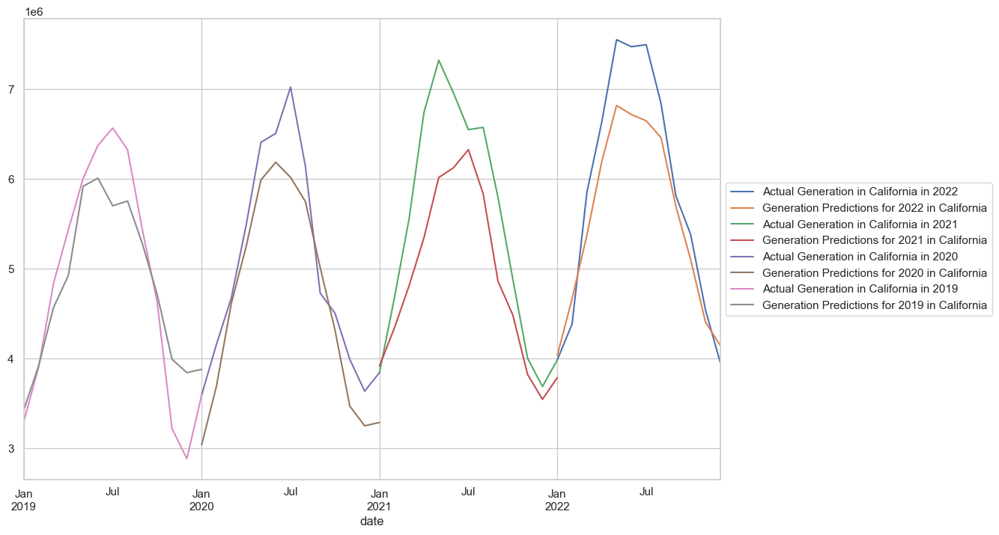



Mean Absolute Error (MAE) 2022: 390635.4039400777
Mean Absolute Error (MAE) 2021: 576680.1140562388
Mean Absolute Error (MAE) 2020: 414887.0111574056
Mean Absolute Error (MAE) 2019: 389661.0638727211
Promedio MAE: 442965.8982566108


Mean Squared Error (MSE) 2022: 218453728745.6429
Mean Squared Error (MSE) 2021: 517707008153.2864
Mean Squared Error (MSE) 2020: 221038016343.21503
Mean Squared Error (MSE) 2019: 245437190303.27298
Promedio MSE: 300658985886.3543


Root Mean Squared Error (RMSE) 2022: 467390.33873802196
Root Mean Squared Error (RMSE) 2021: 719518.5947237823
Root Mean Squared Error (RMSE) 2020: 470146.80297032226
Root Mean Squared Error (RMSE) 2019: 495416.17888727953
Promedio RMSE: 538117.9788298515


Mean Absolute Percentage Error (MAPE) 2022: 6.1776698651375
Mean Absolute Percentage Error (MAPE) 2021: 9.626648020031489
Mean Absolute Percentage Error (MAPE) 2020: 8.673146522466544
Mean Absolute Percentage Error (MAPE) 2019: 9.106576974759376
Promedio MAPE: 8.39601034559

In [ ]:
# CALIFORNIA RENEWABLES

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_california_train_renewables_2022 = df_california_pred_renewables[df_california_pred_renewables.index < '2022-01-01']
df_california_test_renewables_2022 = df_california_pred_renewables[df_california_pred_renewables.index >= '2022-01-01']

df_california_train_renewables_2021 = df_california_pred_renewables[df_california_pred_renewables.index < '2021-01-01']
df_california_test_renewables_2021 = df_california_pred_renewables[(df_california_pred_renewables.index >= '2021-01-01') & (df_california_pred_renewables.index < '2022-01-31')]

df_california_train_renewables_2020 = df_california_pred_renewables[df_california_pred_renewables.index < '2020-01-01']
df_california_test_renewables_2020 = df_california_pred_renewables[(df_california_pred_renewables.index >= '2020-01-01') & (df_california_pred_renewables.index < '2021-01-31')]

df_california_train_renewables_2019 = df_california_pred_renewables[df_california_pred_renewables.index < '2019-01-01']
df_california_test_renewables_2019 = df_california_pred_renewables[(df_california_pred_renewables.index >= '2019-01-01') & (df_california_pred_renewables.index < '2020-01-31')]

# Creamos el modelo
results_california_renewables_2022 = sarimax_train(df_california_train_renewables_2022)
results_california_renewables_2021 = sarimax_train(df_california_train_renewables_2021)
results_california_renewables_2020 = sarimax_train(df_california_train_renewables_2020)
results_california_renewables_2019 = sarimax_train(df_california_train_renewables_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_california_renewables_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_california_test_renewables_2022, results_california_renewables_2022)
predictions_california_renewables_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_california_test_renewables_2021, results_california_renewables_2021)
predictions_california_renewables_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_california_test_renewables_2020, results_california_renewables_2020)
predictions_california_renewables_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_california_test_renewables_2019, results_california_renewables_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_california_test_renewables_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2022')
predictions_california_renewables_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in California')

df_california_test_renewables_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2021')
predictions_california_renewables_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in California')

df_california_test_renewables_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2020')
predictions_california_renewables_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in California')

df_california_test_renewables_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2019')
predictions_california_renewables_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in California')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_california_renewables_2022, mse_california_renewables_2022, rmse_california_renewables_2022, mape_california_renewables_2022, r2_california_renewables_2022 = calculo_metricas(df_california_test_renewables_2022, predictions_california_renewables_2022)
mae_california_renewables_2021, mse_california_renewables_2021, rmse_california_renewables_2021, mape_california_renewables_2021, r2_california_renewables_2021 = calculo_metricas(df_california_test_renewables_2021, predictions_california_renewables_2021)
mae_california_renewables_2020, mse_california_renewables_2020, rmse_california_renewables_2020, mape_california_renewables_2020, r2_california_renewables_2020 = calculo_metricas(df_california_test_renewables_2020, predictions_california_renewables_2020)
mae_california_renewables_2019, mse_california_renewables_2019, rmse_california_renewables_2019, mape_california_renewables_2019, r2_california_renewables_2019 = calculo_metricas(df_california_test_renewables_2019, predictions_california_renewables_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_california_renewables_2022)
print("Mean Absolute Error (MAE) 2021:", mae_california_renewables_2021)
print("Mean Absolute Error (MAE) 2020:", mae_california_renewables_2020)
print("Mean Absolute Error (MAE) 2019:", mae_california_renewables_2019)
print('Promedio MAE:', statistics.mean([mae_california_renewables_2022, mae_california_renewables_2021, mae_california_renewables_2020, mae_california_renewables_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_california_renewables_2022)
print("Mean Squared Error (MSE) 2021:", mse_california_renewables_2021)
print("Mean Squared Error (MSE) 2020:", mse_california_renewables_2020)
print("Mean Squared Error (MSE) 2019:", mse_california_renewables_2019)
print('Promedio MSE:', statistics.mean([mse_california_renewables_2022, mse_california_renewables_2021, mse_california_renewables_2020, mse_california_renewables_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_california_renewables_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_california_renewables_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_california_renewables_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_california_renewables_2019)
print('Promedio RMSE:', statistics.mean([rmse_california_renewables_2022, rmse_california_renewables_2021, rmse_california_renewables_2020, rmse_california_renewables_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_california_renewables_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_california_renewables_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_california_renewables_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_california_renewables_2019)
print('Promedio MAPE:', statistics.mean([mape_california_renewables_2022, mape_california_renewables_2021, mape_california_renewables_2020, mape_california_renewables_2019]))
print('\n')
print("R2 Score 2022:", r2_california_renewables_2022)
print("R2 Score 2021:", r2_california_renewables_2021)
print("R2 Score 2020:", r2_california_renewables_2020)
print("R2 Score 2019:", r2_california_renewables_2019)
print('Promedio R2:', statistics.mean([r2_california_renewables_2022, r2_california_renewables_2021, r2_california_renewables_2020, r2_california_renewables_2019]))

### California - Nuclear

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.42021D+01    |proj g|=  2.16969D-01

At iterate    5    f=  1.41674D+01    |proj g|=  1.13744D-02


 This problem is unconstrained.



At iterate   10    f=  1.41543D+01    |proj g|=  1.56888D-02

At iterate   15    f=  1.41525D+01    |proj g|=  8.37022D-03

At iterate   20    f=  1.41478D+01    |proj g|=  6.05694D-03

At iterate   25    f=  1.41468D+01    |proj g|=  1.85603D-03

At iterate   30    f=  1.41466D+01    |proj g|=  3.27723D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     34     40      1     0     0   3.106D-05   1.415D+01
  F =   14.146590777884066     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.41694D+01    |proj g|=  1.94353D-02

At iterate   15    f=  1.41566D+01    |proj g|=  1.01388D-02

At iterate   20    f=  1.41558D+01    |proj g|=  8.24138D-04

At iterate   25    f=  1.41554D+01    |proj g|=  1.14830D-02

At iterate   30    f=  1.41554D+01    |proj g|=  3.90810D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     33     39      1     0     0   1.585D-05   1.416D+01
  F =   14.155373556693098     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

 This problem is unconstrained.



At iterate   25    f=  1.41614D+01    |proj g|=  2.04530D-03

At iterate   30    f=  1.41614D+01    |proj g|=  1.90267D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     30     36      1     0     0   1.903D-05   1.416D+01
  F =   14.161429622355827     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


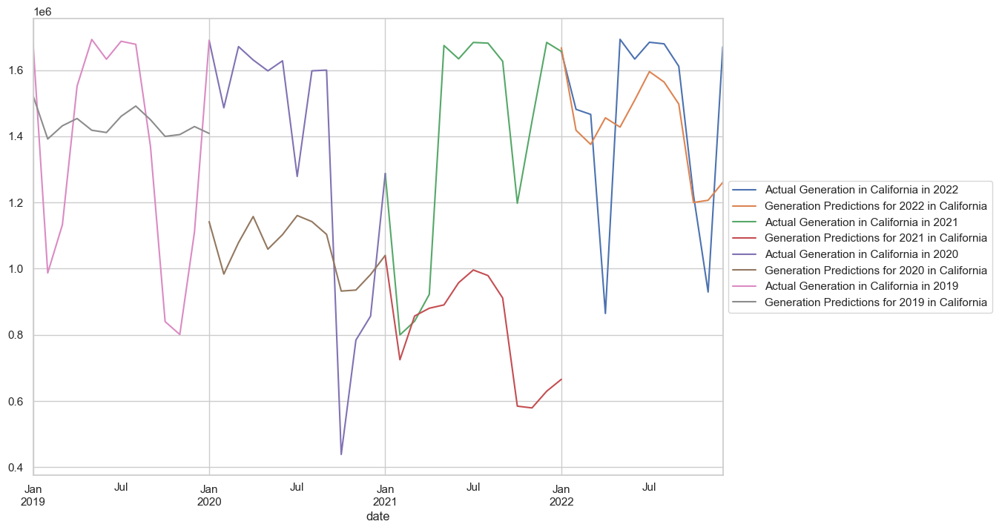



Mean Absolute Error (MAE) 2022: 181168.48790229976
Mean Absolute Error (MAE) 2021: 574793.1700413714
Mean Absolute Error (MAE) 2020: 405196.002975777
Mean Absolute Error (MAE) 2019: 285690.8141380745
Promedio MAE: 361712.1187643807


Mean Squared Error (MSE) 2022: 60593565344.70402
Mean Squared Error (MSE) 2021: 449151580172.99976
Mean Squared Error (MSE) 2020: 192672134281.56866
Mean Squared Error (MSE) 2019: 104930283963.81453
Promedio MSE: 201836890940.77173


Root Mean Squared Error (RMSE) 2022: 246157.60265468954
Root Mean Squared Error (RMSE) 2021: 670187.7201001223
Root Mean Squared Error (RMSE) 2020: 438944.34075582825
Root Mean Squared Error (RMSE) 2019: 323929.44287886913
Promedio RMSE: 419804.7765973773


Mean Absolute Percentage Error (MAPE) 2022: 14.854769955654145
Mean Absolute Percentage Error (MAPE) 2021: 37.19600734751359
Mean Absolute Percentage Error (MAPE) 2020: 33.167331786552964
Mean Absolute Percentage Error (MAPE) 2019: 25.44459047567568
Promedio MAPE: 27.6656

In [ ]:
# CALIFORNIA NUCLEAR

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_california_train_nuclear_2022 = df_california_pred_nuclear[df_california_pred_nuclear.index < '2022-01-01']
df_california_test_nuclear_2022 = df_california_pred_nuclear[df_california_pred_nuclear.index >= '2022-01-01']

df_california_train_nuclear_2021 = df_california_pred_nuclear[df_california_pred_nuclear.index < '2021-01-01']
df_california_test_nuclear_2021 = df_california_pred_nuclear[(df_california_pred_nuclear.index >= '2021-01-01') & (df_california_pred_nuclear.index < '2022-01-31')]

df_california_train_nuclear_2020 = df_california_pred_nuclear[df_california_pred_nuclear.index < '2020-01-01']
df_california_test_nuclear_2020 = df_california_pred_nuclear[(df_california_pred_nuclear.index >= '2020-01-01') & (df_california_pred_nuclear.index < '2021-01-31')]

df_california_train_nuclear_2019 = df_california_pred_nuclear[df_california_pred_nuclear.index < '2019-01-01']
df_california_test_nuclear_2019 = df_california_pred_nuclear[(df_california_pred_nuclear.index >= '2019-01-01') & (df_california_pred_nuclear.index < '2020-01-31')]

# Creamos el modelo
results_california_nuclear_2022 = sarimax_train(df_california_train_nuclear_2022)
results_california_nuclear_2021 = sarimax_train(df_california_train_nuclear_2021)
results_california_nuclear_2020 = sarimax_train(df_california_train_nuclear_2020)
results_california_nuclear_2019 = sarimax_train(df_california_train_nuclear_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_california_nuclear_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_california_test_nuclear_2022, results_california_nuclear_2022)
predictions_california_nuclear_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_california_test_nuclear_2021, results_california_nuclear_2021)
predictions_california_nuclear_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_california_test_nuclear_2020, results_california_nuclear_2020)
predictions_california_nuclear_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_california_test_nuclear_2019, results_california_nuclear_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_california_test_nuclear_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2022')
predictions_california_nuclear_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in California')

df_california_test_nuclear_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2021')
predictions_california_nuclear_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in California')

df_california_test_nuclear_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2020')
predictions_california_nuclear_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in California')

df_california_test_nuclear_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2019')
predictions_california_nuclear_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in California')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_california_nuclear_2022, mse_california_nuclear_2022, rmse_california_nuclear_2022, mape_california_nuclear_2022, r2_california_nuclear_2022 = calculo_metricas(df_california_test_nuclear_2022, predictions_california_nuclear_2022)
mae_california_nuclear_2021, mse_california_nuclear_2021, rmse_california_nuclear_2021, mape_california_nuclear_2021, r2_california_nuclear_2021 = calculo_metricas(df_california_test_nuclear_2021, predictions_california_nuclear_2021)
mae_california_nuclear_2020, mse_california_nuclear_2020, rmse_california_nuclear_2020, mape_california_nuclear_2020, r2_california_nuclear_2020 = calculo_metricas(df_california_test_nuclear_2020, predictions_california_nuclear_2020)
mae_california_nuclear_2019, mse_california_nuclear_2019, rmse_california_nuclear_2019, mape_california_nuclear_2019, r2_california_nuclear_2019 = calculo_metricas(df_california_test_nuclear_2019, predictions_california_nuclear_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_california_nuclear_2022)
print("Mean Absolute Error (MAE) 2021:", mae_california_nuclear_2021)
print("Mean Absolute Error (MAE) 2020:", mae_california_nuclear_2020)
print("Mean Absolute Error (MAE) 2019:", mae_california_nuclear_2019)
print('Promedio MAE:', statistics.mean([mae_california_nuclear_2022, mae_california_nuclear_2021, mae_california_nuclear_2020, mae_california_nuclear_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_california_nuclear_2022)
print("Mean Squared Error (MSE) 2021:", mse_california_nuclear_2021)
print("Mean Squared Error (MSE) 2020:", mse_california_nuclear_2020)
print("Mean Squared Error (MSE) 2019:", mse_california_nuclear_2019)
print('Promedio MSE:', statistics.mean([mse_california_nuclear_2022, mse_california_nuclear_2021, mse_california_nuclear_2020, mse_california_nuclear_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_california_nuclear_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_california_nuclear_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_california_nuclear_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_california_nuclear_2019)
print('Promedio RMSE:', statistics.mean([rmse_california_nuclear_2022, rmse_california_nuclear_2021, rmse_california_nuclear_2020, rmse_california_nuclear_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_california_nuclear_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_california_nuclear_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_california_nuclear_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_california_nuclear_2019)
print('Promedio MAPE:', statistics.mean([mape_california_nuclear_2022, mape_california_nuclear_2021, mape_california_nuclear_2020, mape_california_nuclear_2019]))
print('\n')
print("R2 Score 2022:", r2_california_nuclear_2022)
print("R2 Score 2021:", r2_california_nuclear_2021)
print("R2 Score 2020:", r2_california_nuclear_2020)
print("R2 Score 2019:", r2_california_nuclear_2019)
print('Promedio R2:', statistics.mean([r2_california_nuclear_2022, r2_california_nuclear_2021, r2_california_nuclear_2020, r2_california_nuclear_2019]))

### Illinois - General

In [ ]:
# Creamos el dataset que necesitamos filtrando por texas primero, y luego por cada fuente de energía
df_illinois_pred = df_pred_general[df_pred_general['state'] == 'Illinois'].copy()
df_illinois_pred_coal = df_pred_source[(df_pred_source['source'] == 'all coal products') & (df_pred_source['state'] == 'Illinois')].copy()
df_illinois_pred_renewables = df_pred_source[(df_pred_source['source'] == 'all renewables') & (df_pred_source['state'] == 'Illinois')].copy()
df_illinois_pred_gas = df_pred_source[(df_pred_source['source'] == 'natural gas') & (df_pred_source['state'] == 'Illinois')].copy()
df_illinois_pred_nuclear = df_pred_source[(df_pred_source['source'] == 'nuclear') & (df_pred_source['state'] == 'Illinois')].copy()

# Ahora convertimos todas las fechas en el index del dataframe para poder hacer una serie de tiempo
df_illinois_pred.set_index('date', inplace=True)
df_illinois_pred.index.freq = 'MS'
df_illinois_pred_coal.set_index('date', inplace=True)
df_illinois_pred_coal.index.freq = 'MS'
df_illinois_pred_renewables.set_index('date', inplace=True)
df_illinois_pred_renewables.index.freq = 'MS'
df_illinois_pred_gas.set_index('date', inplace=True)
df_illinois_pred_gas.index.freq = 'MS'
df_illinois_pred_nuclear.set_index('date', inplace=True)
df_illinois_pred_nuclear.index.freq = 'MS'

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.53120D+01    |proj g|=  2.70684D-01


 This problem is unconstrained.



At iterate    5    f=  1.52018D+01    |proj g|=  2.16265D-02

At iterate   10    f=  1.51816D+01    |proj g|=  3.11253D-02

At iterate   15    f=  1.51804D+01    |proj g|=  7.36411D-04

At iterate   20    f=  1.51803D+01    |proj g|=  1.56149D-03

At iterate   25    f=  1.51802D+01    |proj g|=  5.15789D-03

At iterate   30    f=  1.51748D+01    |proj g|=  2.96649D-02

At iterate   35    f=  1.51735D+01    |proj g|=  5.69046D-03

At iterate   40    f=  1.51729D+01    |proj g|=  3.29426D-04

At iterate   45    f=  1.51729D+01    |proj g|=  1.08798D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     46     56   

 This problem is unconstrained.



At iterate   25    f=  1.51792D+01    |proj g|=  1.78199D-02

At iterate   30    f=  1.51780D+01    |proj g|=  3.89331D-03

At iterate   35    f=  1.51770D+01    |proj g|=  5.11074D-03

At iterate   40    f=  1.51769D+01    |proj g|=  2.30214D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     40     54      1     0     0   2.302D-05   1.518D+01
  F =   15.176869944629431     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f=  1.52093D+01    |proj g|=  1.27253D-02

At iterate   10    f=  1.51935D+01    |proj g|=  5.67145D-02

At iterate   15    f=  1.51916D+01    |proj g|=  3.41653D-04

At iterate   20    f=  1.51915D+01    |proj g|=  1.12874D-03

At iterate   25    f=  1.51915D+01    |proj g|=  1.07517D-03

At iterate   30    f=  1.51913D+01    |proj g|=  1.46288D-02

At iterate   35    f=  1.51886D+01    |proj g|=  1.23263D-02

At iterate   40    f=  1.51847D+01    |proj g|=  1.40325D-02

At iterate   45    f=  1.51840D+01    |proj g|=  5.23449D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     47     60   

 This problem is unconstrained.



At iterate    5    f=  1.52116D+01    |proj g|=  1.35321D-02

At iterate   10    f=  1.51956D+01    |proj g|=  4.66191D-02

At iterate   15    f=  1.51942D+01    |proj g|=  7.73916D-04

At iterate   20    f=  1.51934D+01    |proj g|=  4.71672D-02

At iterate   25    f=  1.51882D+01    |proj g|=  2.40106D-02

At iterate   30    f=  1.51872D+01    |proj g|=  3.61792D-03

At iterate   35    f=  1.51872D+01    |proj g|=  1.43703D-03

At iterate   40    f=  1.51871D+01    |proj g|=  1.77923D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     43     58      1     0     0   8.944D-06   1.519D+01
  F =   15.1870621141

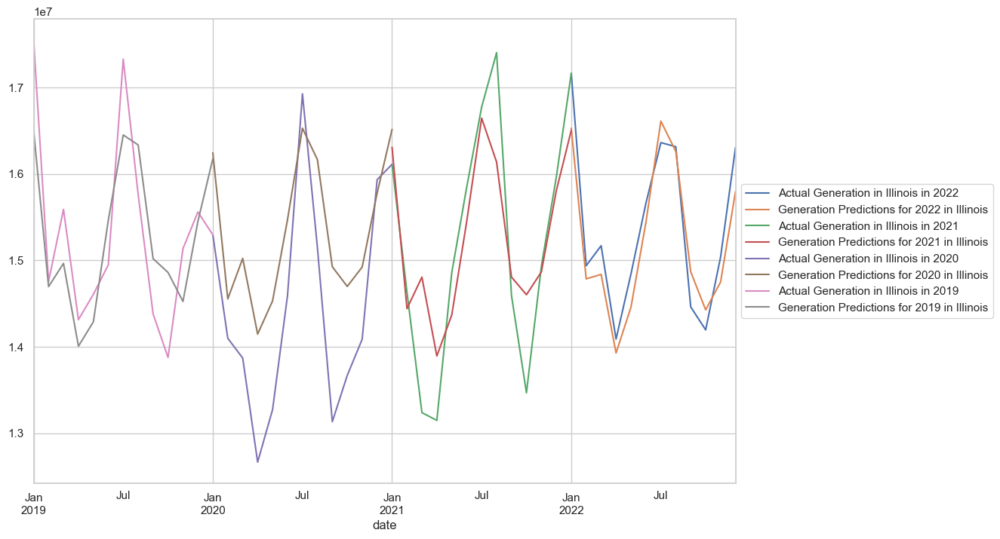



Mean Absolute Error (MAE) 2022: 302279.95342636324
Mean Absolute Error (MAE) 2021: 555021.9786578052
Mean Absolute Error (MAE) 2020: 907873.760610337
Mean Absolute Error (MAE) 2019: 580477.2523667205
Promedio MAE: 586413.2362653065


Mean Squared Error (MSE) 2022: 115538459398.70624
Mean Squared Error (MSE) 2021: 530786653307.9268
Mean Squared Error (MSE) 2020: 1025178870021.4368
Mean Squared Error (MSE) 2019: 429558762487.47046
Promedio MSE: 525265686303.8851


Root Mean Squared Error (RMSE) 2022: 339909.48706781666
Root Mean Squared Error (RMSE) 2021: 728551.0643104756
Root Mean Squared Error (RMSE) 2020: 1012511.1703193387
Root Mean Squared Error (RMSE) 2019: 655407.3256284754
Promedio RMSE: 684094.7618315266


Mean Absolute Percentage Error (MAPE) 2022: 1.9505390897117663
Mean Absolute Percentage Error (MAPE) 2021: 3.7731284278547723
Mean Absolute Percentage Error (MAPE) 2020: 6.505072647411001
Mean Absolute Percentage Error (MAPE) 2019: 3.7600575113008774
Promedio MAPE: 3.997199

In [ ]:
# ILLINOIS GENERAL

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_illinois_train_general_2022 = df_illinois_pred[df_illinois_pred.index < '2022-01-01']
df_illinois_test_general_2022 = df_illinois_pred[df_illinois_pred.index >= '2022-01-01']

df_illinois_train_general_2021 = df_illinois_pred[df_illinois_pred.index < '2021-01-01']
df_illinois_test_general_2021 = df_illinois_pred[(df_illinois_pred.index >= '2021-01-01') & (df_illinois_pred.index < '2022-01-31')]

df_illinois_train_general_2020 = df_illinois_pred[df_illinois_pred.index < '2020-01-01']
df_illinois_test_general_2020 = df_illinois_pred[(df_illinois_pred.index >= '2020-01-01') & (df_illinois_pred.index < '2021-01-31')]

df_illinois_train_general_2019 = df_illinois_pred[df_illinois_pred.index < '2019-01-01']
df_illinois_test_general_2019 = df_illinois_pred[(df_illinois_pred.index >= '2019-01-01') & (df_illinois_pred.index < '2020-01-31')]

# Creamos el modelo
results_illinois_general_2022 = sarimax_train(df_illinois_train_general_2022)
results_illinois_general_2021 = sarimax_train(df_illinois_train_general_2021)
results_illinois_general_2020 = sarimax_train(df_illinois_train_general_2020)
results_illinois_general_2019 = sarimax_train(df_illinois_train_general_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_illinois_general_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_illinois_test_general_2022, results_illinois_general_2022)
predictions_illinois_general_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_illinois_test_general_2021, results_illinois_general_2021)
predictions_illinois_general_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_illinois_test_general_2020, results_illinois_general_2020)
predictions_illinois_general_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_illinois_test_general_2019, results_illinois_general_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_illinois_test_general_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2022')
predictions_illinois_general_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Illinois')

df_illinois_test_general_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2021')
predictions_illinois_general_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Illinois')

df_illinois_test_general_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2020')
predictions_illinois_general_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Illinois')

df_illinois_test_general_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2019')
predictions_illinois_general_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Illinois')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_illinois_general_2022, mse_illinois_general_2022, rmse_illinois_general_2022, mape_illinois_general_2022, r2_illinois_general_2022 = calculo_metricas(df_illinois_test_general_2022, predictions_illinois_general_2022)
mae_illinois_general_2021, mse_illinois_general_2021, rmse_illinois_general_2021, mape_illinois_general_2021, r2_illinois_general_2021 = calculo_metricas(df_illinois_test_general_2021, predictions_illinois_general_2021)
mae_illinois_general_2020, mse_illinois_general_2020, rmse_illinois_general_2020, mape_illinois_general_2020, r2_illinois_general_2020 = calculo_metricas(df_illinois_test_general_2020, predictions_illinois_general_2020)
mae_illinois_general_2019, mse_illinois_general_2019, rmse_illinois_general_2019, mape_illinois_general_2019, r2_illinois_general_2019 = calculo_metricas(df_illinois_test_general_2019, predictions_illinois_general_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_illinois_general_2022)
print("Mean Absolute Error (MAE) 2021:", mae_illinois_general_2021)
print("Mean Absolute Error (MAE) 2020:", mae_illinois_general_2020)
print("Mean Absolute Error (MAE) 2019:", mae_illinois_general_2019)
print('Promedio MAE:', statistics.mean([mae_illinois_general_2022, mae_illinois_general_2021, mae_illinois_general_2020, mae_illinois_general_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_illinois_general_2022)
print("Mean Squared Error (MSE) 2021:", mse_illinois_general_2021)
print("Mean Squared Error (MSE) 2020:", mse_illinois_general_2020)
print("Mean Squared Error (MSE) 2019:", mse_illinois_general_2019)
print('Promedio MSE:', statistics.mean([mse_illinois_general_2022, mse_illinois_general_2021, mse_illinois_general_2020, mse_illinois_general_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_illinois_general_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_illinois_general_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_illinois_general_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_illinois_general_2019)
print('Promedio RMSE:', statistics.mean([rmse_illinois_general_2022, rmse_illinois_general_2021, rmse_illinois_general_2020, rmse_illinois_general_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_illinois_general_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_illinois_general_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_illinois_general_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_illinois_general_2019)
print('Promedio MAPE:', statistics.mean([mape_illinois_general_2022, mape_illinois_general_2021, mape_illinois_general_2020, mape_illinois_general_2019]))
print('\n')
print("R2 Score 2022:", r2_illinois_general_2022)
print("R2 Score 2021:", r2_illinois_general_2021)
print("R2 Score 2020:", r2_illinois_general_2020)
print("R2 Score 2019:", r2_illinois_general_2019)
print('Promedio R2:', statistics.mean([r2_illinois_general_2022, r2_illinois_general_2021, r2_illinois_general_2020, r2_illinois_general_2019]))

### Illinois - Coal

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.48086D+01    |proj g|=  1.08787D-01

At iterate    5    f=  1.47841D+01    |proj g|=  3.96175D-02


 This problem is unconstrained.



At iterate   10    f=  1.47706D+01    |proj g|=  5.54904D-03

At iterate   15    f=  1.47702D+01    |proj g|=  1.65977D-03

At iterate   20    f=  1.47702D+01    |proj g|=  2.10825D-03

At iterate   25    f=  1.47701D+01    |proj g|=  5.31854D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     26     31      1     0     0   9.556D-06   1.477D+01
  F =   14.770138788094696     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   10    f=  1.47683D+01    |proj g|=  3.87807D-03

At iterate   15    f=  1.47671D+01    |proj g|=  5.90101D-04

At iterate   20    f=  1.47671D+01    |proj g|=  2.22632D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     24     29      1     0     0   3.482D-05   1.477D+01
  F =   14.767078300121971     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.48058D+01    |proj g|=  1.06768D-01


 This problem is unconstrained.



At iterate    5    f=  1.47782D+01    |proj g|=  4.95074D-02

At iterate   10    f=  1.47707D+01    |proj g|=  4.32724D-03

At iterate   15    f=  1.47700D+01    |proj g|=  5.54339D-04

At iterate   20    f=  1.47700D+01    |proj g|=  2.46738D-03


 This problem is unconstrained.



At iterate   25    f=  1.47699D+01    |proj g|=  1.16004D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     27     30      1     0     0   3.045D-05   1.477D+01
  F =   14.769889553974114     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.48128D+01    |proj g|=  1.38596D-01

At iterate    5    f=  1.47775D+01    |proj g|=  3.45798D-02

At iterate   10    f=  1.47685D+01    |proj g|=  4.48436D-03

At iter

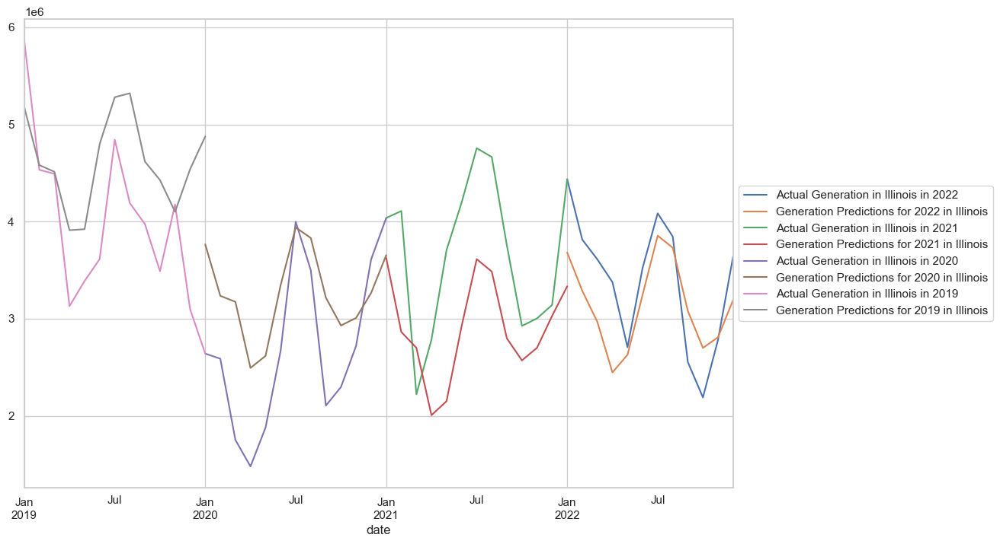



Mean Absolute Error (MAE) 2022: 421989.5842274586
Mean Absolute Error (MAE) 2021: 837741.7394754133
Mean Absolute Error (MAE) 2020: 674865.1355045793
Mean Absolute Error (MAE) 2019: 781855.425588177
Promedio MAE: 679112.9711989071


Mean Squared Error (MSE) 2022: 251087331892.314
Mean Squared Error (MSE) 2021: 895945861813.4961
Mean Squared Error (MSE) 2020: 602469801229.697
Mean Squared Error (MSE) 2019: 971395441430.1199
Promedio MSE: 680224609091.4067


Root Mean Squared Error (RMSE) 2022: 501086.15216578677
Root Mean Squared Error (RMSE) 2021: 946544.1679147868
Root Mean Squared Error (RMSE) 2020: 776189.2818312406
Root Mean Squared Error (RMSE) 2019: 985593.9536290388
Promedio RMSE: 802353.3888852133


Mean Absolute Percentage Error (MAPE) 2022: 12.722693092500636
Mean Absolute Percentage Error (MAPE) 2021: 22.12761203496065
Mean Absolute Percentage Error (MAPE) 2020: 30.986276221667357
Mean Absolute Percentage Error (MAPE) 2019: 23.00217732521004
Promedio MAPE: 22.2096896685846

In [ ]:
# ILLINOIS COAL

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_illinois_train_coal_2022 = df_illinois_pred_coal[df_illinois_pred_coal.index < '2022-01-01']
df_illinois_test_coal_2022 = df_illinois_pred_coal[df_illinois_pred_coal.index >= '2022-01-01']

df_illinois_train_coal_2021 = df_illinois_pred_coal[df_illinois_pred_coal.index < '2021-01-01']
df_illinois_test_coal_2021 = df_illinois_pred_coal[(df_illinois_pred_coal.index >= '2021-01-01') & (df_illinois_pred_coal.index < '2022-01-31')]

df_illinois_train_coal_2020 = df_illinois_pred_coal[df_illinois_pred_coal.index < '2020-01-01']
df_illinois_test_coal_2020 = df_illinois_pred_coal[(df_illinois_pred_coal.index >= '2020-01-01') & (df_illinois_pred_coal.index < '2021-01-31')]

df_illinois_train_coal_2019 = df_illinois_pred_coal[df_illinois_pred_coal.index < '2019-01-01']
df_illinois_test_coal_2019 = df_illinois_pred_coal[(df_illinois_pred_coal.index >= '2019-01-01') & (df_illinois_pred_coal.index < '2020-01-31')]

# Creamos el modelo
results_illinois_coal_2022 = sarimax_train(df_illinois_train_coal_2022)
results_illinois_coal_2021 = sarimax_train(df_illinois_train_coal_2021)
results_illinois_coal_2020 = sarimax_train(df_illinois_train_coal_2020)
results_illinois_coal_2019 = sarimax_train(df_illinois_train_coal_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_illinois_coal_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_illinois_test_coal_2022, results_illinois_coal_2022)
predictions_illinois_coal_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_illinois_test_coal_2021, results_illinois_coal_2021)
predictions_illinois_coal_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_illinois_test_coal_2020, results_illinois_coal_2020)
predictions_illinois_coal_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_illinois_test_coal_2019, results_illinois_coal_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_illinois_test_coal_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2022')
predictions_illinois_coal_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Illinois')

df_illinois_test_coal_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2021')
predictions_illinois_coal_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Illinois')

df_illinois_test_coal_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2020')
predictions_illinois_coal_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Illinois')

df_illinois_test_coal_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2019')
predictions_illinois_coal_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Illinois')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_illinois_coal_2022, mse_illinois_coal_2022, rmse_illinois_coal_2022, mape_illinois_coal_2022, r2_illinois_coal_2022 = calculo_metricas(df_illinois_test_coal_2022, predictions_illinois_coal_2022)
mae_illinois_coal_2021, mse_illinois_coal_2021, rmse_illinois_coal_2021, mape_illinois_coal_2021, r2_illinois_coal_2021 = calculo_metricas(df_illinois_test_coal_2021, predictions_illinois_coal_2021)
mae_illinois_coal_2020, mse_illinois_coal_2020, rmse_illinois_coal_2020, mape_illinois_coal_2020, r2_illinois_coal_2020 = calculo_metricas(df_illinois_test_coal_2020, predictions_illinois_coal_2020)
mae_illinois_coal_2019, mse_illinois_coal_2019, rmse_illinois_coal_2019, mape_illinois_coal_2019, r2_illinois_coal_2019 = calculo_metricas(df_illinois_test_coal_2019, predictions_illinois_coal_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_illinois_coal_2022)
print("Mean Absolute Error (MAE) 2021:", mae_illinois_coal_2021)
print("Mean Absolute Error (MAE) 2020:", mae_illinois_coal_2020)
print("Mean Absolute Error (MAE) 2019:", mae_illinois_coal_2019)
print('Promedio MAE:', statistics.mean([mae_illinois_coal_2022, mae_illinois_coal_2021, mae_illinois_coal_2020, mae_illinois_coal_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_illinois_coal_2022)
print("Mean Squared Error (MSE) 2021:", mse_illinois_coal_2021)
print("Mean Squared Error (MSE) 2020:", mse_illinois_coal_2020)
print("Mean Squared Error (MSE) 2019:", mse_illinois_coal_2019)
print('Promedio MSE:', statistics.mean([mse_illinois_coal_2022, mse_illinois_coal_2021, mse_illinois_coal_2020, mse_illinois_coal_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_illinois_coal_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_illinois_coal_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_illinois_coal_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_illinois_coal_2019)
print('Promedio RMSE:', statistics.mean([rmse_illinois_coal_2022, rmse_illinois_coal_2021, rmse_illinois_coal_2020, rmse_illinois_coal_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_illinois_coal_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_illinois_coal_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_illinois_coal_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_illinois_coal_2019)
print('Promedio MAPE:', statistics.mean([mape_illinois_coal_2022, mape_illinois_coal_2021, mape_illinois_coal_2020, mape_illinois_coal_2019]))
print('\n')
print("R2 Score 2022:", r2_illinois_coal_2022)
print("R2 Score 2021:", r2_illinois_coal_2021)
print("R2 Score 2020:", r2_illinois_coal_2020)
print("R2 Score 2019:", r2_illinois_coal_2019)
print('Promedio R2:', statistics.mean([r2_illinois_coal_2022, r2_illinois_coal_2021, r2_illinois_coal_2020, r2_illinois_coal_2019]))

### Illinois - Natural Gas

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.41624D+01    |proj g|=  1.20206D-01

At iterate    5    f=  1.41208D+01    |proj g|=  3.21219D-02

At iterate   10    f=  1.41118D+01    |proj g|=  7.06232D-03

At iterate   15    f=  1.41102D+01    |proj g|=  1.02303D-03


 This problem is unconstrained.



At iterate   20    f=  1.41100D+01    |proj g|=  4.14132D-03

At iterate   25    f=  1.41092D+01    |proj g|=  1.11005D-03

At iterate   30    f=  1.41091D+01    |proj g|=  1.38819D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     32     36      1     0     0   1.174D-05   1.411D+01
  F =   14.109129031152714     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.41068D+01    |proj g|=  1.39857D-01

At iter

 This problem is unconstrained.



At iterate   10    f=  1.40645D+01    |proj g|=  1.16624D-02

At iterate   15    f=  1.40640D+01    |proj g|=  2.79591D-04

At iterate   20    f=  1.40639D+01    |proj g|=  2.77900D-03

At iterate   25    f=  1.40629D+01    |proj g|=  3.29936D-03

At iterate   30    f=  1.40625D+01    |proj g|=  8.17863D-04

At iterate   35    f=  1.40625D+01    |proj g|=  1.75832D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     36     54      1     0     0   1.345D-04   1.406D+01
  F =   14.062474322969072     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f=  1.39975D+01    |proj g|=  5.15853D-04

At iterate   20    f=  1.39974D+01    |proj g|=  2.74022D-03

At iterate   25    f=  1.39972D+01    |proj g|=  8.08872D-04

At iterate   30    f=  1.39972D+01    |proj g|=  6.83658D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     31     35      1     0     0   7.722D-06   1.400D+01
  F =   13.997194725922251     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f=  1.39825D+01    |proj g|=  2.23450D-02

At iterate   10    f=  1.39618D+01    |proj g|=  7.99759D-03

At iterate   15    f=  1.39608D+01    |proj g|=  3.03316D-03

At iterate   20    f=  1.39599D+01    |proj g|=  2.18671D-03

At iterate   25    f=  1.39598D+01    |proj g|=  3.50738D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     29     33      1     0     0   1.455D-05   1.396D+01
  F =   13.959843788479102     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


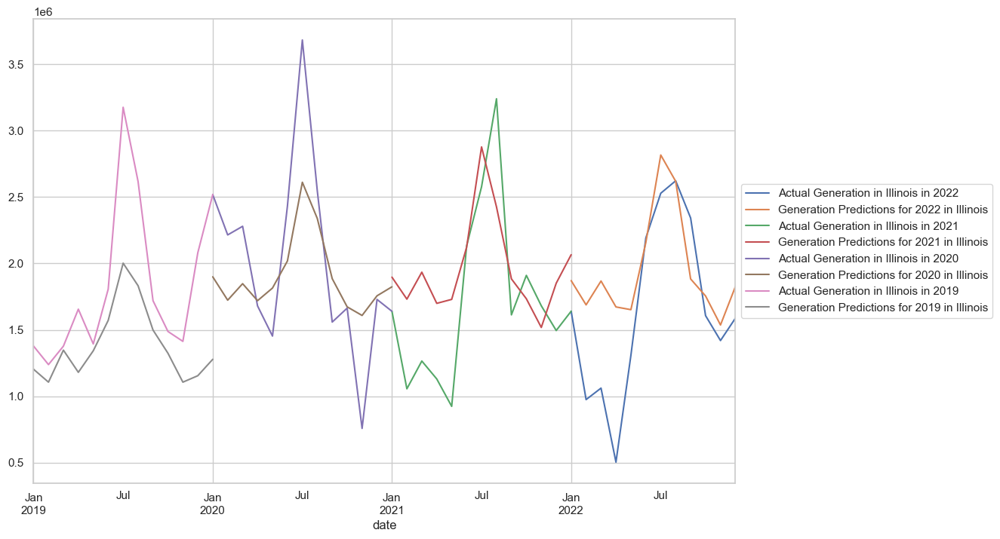



Mean Absolute Error (MAE) 2022: 379182.8533659721
Mean Absolute Error (MAE) 2021: 422187.2860193455
Mean Absolute Error (MAE) 2020: 387148.5930958136
Mean Absolute Error (MAE) 2019: 454864.79990069417
Promedio MAE: 410845.88309545635


Mean Squared Error (MSE) 2022: 256745992512.73087
Mean Squared Error (MSE) 2021: 240850336967.78842
Mean Squared Error (MSE) 2020: 243635711206.49847
Mean Squared Error (MSE) 2019: 375965543746.1642
Promedio MSE: 279299396108.2955


Root Mean Squared Error (RMSE) 2022: 506701.08793324186
Root Mean Squared Error (RMSE) 2021: 490765.0527164586
Root Mean Squared Error (RMSE) 2020: 493594.6831221934
Root Mean Squared Error (RMSE) 2019: 613160.2920494479
Promedio RMSE: 526055.2789553355


Mean Absolute Percentage Error (MAPE) 2022: 40.503501944091674
Mean Absolute Percentage Error (MAPE) 2021: 30.186373792462135
Mean Absolute Percentage Error (MAPE) 2020: 22.585247205210013
Mean Absolute Percentage Error (MAPE) 2019: 21.318042301438076
Promedio MAPE: 28.648

In [ ]:
# ILLINOIS NATURAL GAS

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_illinois_train_gas_2022 = df_illinois_pred_gas[df_illinois_pred_gas.index < '2022-01-01']
df_illinois_test_gas_2022 = df_illinois_pred_gas[df_illinois_pred_gas.index >= '2022-01-01']

df_illinois_train_gas_2021 = df_illinois_pred_gas[df_illinois_pred_gas.index < '2021-01-01']
df_illinois_test_gas_2021 = df_illinois_pred_gas[(df_illinois_pred_gas.index >= '2021-01-01') & (df_illinois_pred_gas.index < '2022-01-31')]

df_illinois_train_gas_2020 = df_illinois_pred_gas[df_illinois_pred_gas.index < '2020-01-01']
df_illinois_test_gas_2020 = df_illinois_pred_gas[(df_illinois_pred_gas.index >= '2020-01-01') & (df_illinois_pred_gas.index < '2021-01-31')]

df_illinois_train_gas_2019 = df_illinois_pred_gas[df_illinois_pred_gas.index < '2019-01-01']
df_illinois_test_gas_2019 = df_illinois_pred_gas[(df_illinois_pred_gas.index >= '2019-01-01') & (df_illinois_pred_gas.index < '2020-01-31')]

# Creamos el modelo
results_illinois_gas_2022 = sarimax_train(df_illinois_train_gas_2022)
results_illinois_gas_2021 = sarimax_train(df_illinois_train_gas_2021)
results_illinois_gas_2020 = sarimax_train(df_illinois_train_gas_2020)
results_illinois_gas_2019 = sarimax_train(df_illinois_train_gas_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_illinois_gas_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_illinois_test_gas_2022, results_illinois_gas_2022)
predictions_illinois_gas_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_illinois_test_gas_2021, results_illinois_gas_2021)
predictions_illinois_gas_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_illinois_test_gas_2020, results_illinois_gas_2020)
predictions_illinois_gas_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_illinois_test_gas_2019, results_illinois_gas_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_illinois_test_gas_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2022')
predictions_illinois_gas_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Illinois')

df_illinois_test_gas_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2021')
predictions_illinois_gas_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Illinois')

df_illinois_test_gas_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2020')
predictions_illinois_gas_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Illinois')

df_illinois_test_gas_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2019')
predictions_illinois_gas_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Illinois')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_illinois_gas_2022, mse_illinois_gas_2022, rmse_illinois_gas_2022, mape_illinois_gas_2022, r2_illinois_gas_2022 = calculo_metricas(df_illinois_test_gas_2022, predictions_illinois_gas_2022)
mae_illinois_gas_2021, mse_illinois_gas_2021, rmse_illinois_gas_2021, mape_illinois_gas_2021, r2_illinois_gas_2021 = calculo_metricas(df_illinois_test_gas_2021, predictions_illinois_gas_2021)
mae_illinois_gas_2020, mse_illinois_gas_2020, rmse_illinois_gas_2020, mape_illinois_gas_2020, r2_illinois_gas_2020 = calculo_metricas(df_illinois_test_gas_2020, predictions_illinois_gas_2020)
mae_illinois_gas_2019, mse_illinois_gas_2019, rmse_illinois_gas_2019, mape_illinois_gas_2019, r2_illinois_gas_2019 = calculo_metricas(df_illinois_test_gas_2019, predictions_illinois_gas_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_illinois_gas_2022)
print("Mean Absolute Error (MAE) 2021:", mae_illinois_gas_2021)
print("Mean Absolute Error (MAE) 2020:", mae_illinois_gas_2020)
print("Mean Absolute Error (MAE) 2019:", mae_illinois_gas_2019)
print('Promedio MAE:', statistics.mean([mae_illinois_gas_2022, mae_illinois_gas_2021, mae_illinois_gas_2020, mae_illinois_gas_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_illinois_gas_2022)
print("Mean Squared Error (MSE) 2021:", mse_illinois_gas_2021)
print("Mean Squared Error (MSE) 2020:", mse_illinois_gas_2020)
print("Mean Squared Error (MSE) 2019:", mse_illinois_gas_2019)
print('Promedio MSE:', statistics.mean([mse_illinois_gas_2022, mse_illinois_gas_2021, mse_illinois_gas_2020, mse_illinois_gas_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_illinois_gas_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_illinois_gas_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_illinois_gas_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_illinois_gas_2019)
print('Promedio RMSE:', statistics.mean([rmse_illinois_gas_2022, rmse_illinois_gas_2021, rmse_illinois_gas_2020, rmse_illinois_gas_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_illinois_gas_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_illinois_gas_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_illinois_gas_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_illinois_gas_2019)
print('Promedio MAPE:', statistics.mean([mape_illinois_gas_2022, mape_illinois_gas_2021, mape_illinois_gas_2020, mape_illinois_gas_2019]))
print('\n')
print("R2 Score 2022:", r2_illinois_gas_2022)
print("R2 Score 2021:", r2_illinois_gas_2021)
print("R2 Score 2020:", r2_illinois_gas_2020)
print("R2 Score 2019:", r2_illinois_gas_2019)
print('Promedio R2:', statistics.mean([r2_illinois_gas_2022, r2_illinois_gas_2021, r2_illinois_gas_2020, r2_illinois_gas_2019]))

### Illinois - Renewables

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.35132D+01    |proj g|=  1.19888D-01

At iterate    5    f=  1.34580D+01    |proj g|=  8.92486D-02


 This problem is unconstrained.



At iterate   10    f=  1.34209D+01    |proj g|=  1.03115D-02

At iterate   15    f=  1.34194D+01    |proj g|=  3.26016D-03

At iterate   20    f=  1.34193D+01    |proj g|=  1.45118D-03

At iterate   25    f=  1.34193D+01    |proj g|=  2.29523D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     25     28      1     0     0   2.295D-06   1.342D+01
  F =   13.419294077490175     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f=  1.33823D+01    |proj g|=  1.06095D-01

At iterate   10    f=  1.33467D+01    |proj g|=  5.79889D-03

At iterate   15    f=  1.33465D+01    |proj g|=  7.53116D-04

At iterate   20    f=  1.33464D+01    |proj g|=  2.51843D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     21     24      1     0     0   2.958D-06   1.335D+01
  F =   13.346422777167655     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.32545D+01    |proj g|=  5.92908D-03

At iterate   15    f=  1.32531D+01    |proj g|=  4.77585D-03

At iterate   20    f=  1.32523D+01    |proj g|=  3.05146D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     21     26      1     0     0   9.689D-06   1.325D+01
  F =   13.252270604022881     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.32871D+01    |proj g|=  9.04593D-02

At iter

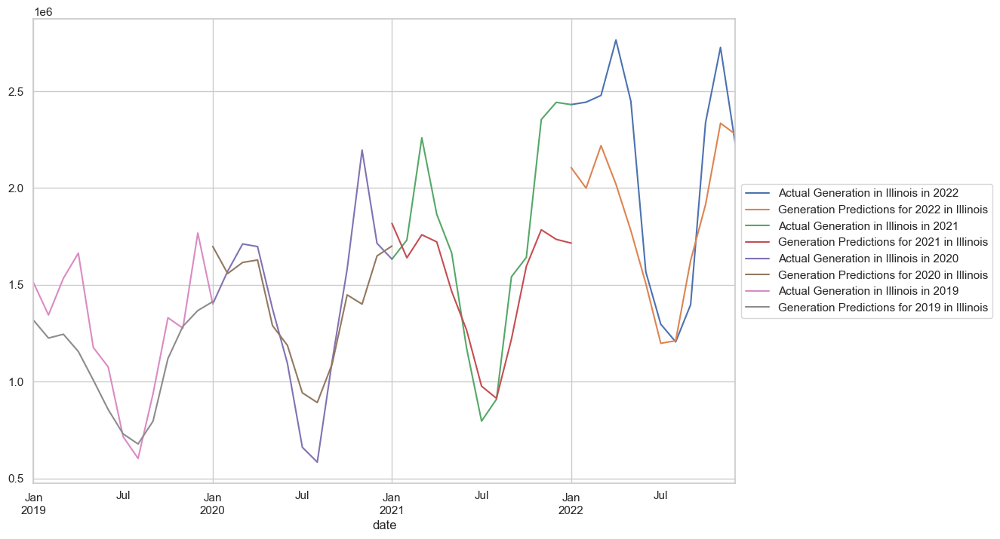



Mean Absolute Error (MAE) 2022: 308938.8050157183
Mean Absolute Error (MAE) 2021: 289321.874323588
Mean Absolute Error (MAE) 2020: 178613.89081304803
Mean Absolute Error (MAE) 2019: 181808.0590649978
Promedio MAE: 239670.657304338


Mean Squared Error (MSE) 2022: 147966665429.8221
Mean Squared Error (MSE) 2021: 141501441523.8834
Mean Squared Error (MSE) 2020: 73316147993.23212
Mean Squared Error (MSE) 2019: 54009309317.94657
Promedio MSE: 104198391066.22105


Root Mean Squared Error (RMSE) 2022: 384664.35424902855
Root Mean Squared Error (RMSE) 2021: 376166.7735511516
Root Mean Squared Error (RMSE) 2020: 270769.54775829596
Root Mean Squared Error (RMSE) 2019: 232399.03037221686
Promedio RMSE: 315999.92648267327


Mean Absolute Percentage Error (MAPE) 2022: 13.297198845762722
Mean Absolute Percentage Error (MAPE) 2021: 15.079308945619113
Mean Absolute Percentage Error (MAPE) 2020: 15.069921892551408
Mean Absolute Percentage Error (MAPE) 2019: 13.504489213270404
Promedio MAPE: 14.23772

In [ ]:
# ILLINOIS RENEWABLES

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_illinois_train_renewables_2022 = df_illinois_pred_renewables[df_illinois_pred_renewables.index < '2022-01-01']
df_illinois_test_renewables_2022 = df_illinois_pred_renewables[df_illinois_pred_renewables.index >= '2022-01-01']

df_illinois_train_renewables_2021 = df_illinois_pred_renewables[df_illinois_pred_renewables.index < '2021-01-01']
df_illinois_test_renewables_2021 = df_illinois_pred_renewables[(df_illinois_pred_renewables.index >= '2021-01-01') & (df_illinois_pred_renewables.index < '2022-01-31')]

df_illinois_train_renewables_2020 = df_illinois_pred_renewables[df_illinois_pred_renewables.index < '2020-01-01']
df_illinois_test_renewables_2020 = df_illinois_pred_renewables[(df_illinois_pred_renewables.index >= '2020-01-01') & (df_illinois_pred_renewables.index < '2021-01-31')]

df_illinois_train_renewables_2019 = df_illinois_pred_renewables[df_illinois_pred_renewables.index < '2019-01-01']
df_illinois_test_renewables_2019 = df_illinois_pred_renewables[(df_illinois_pred_renewables.index >= '2019-01-01') & (df_illinois_pred_renewables.index < '2020-01-31')]

# Creamos el modelo
results_illinois_renewables_2022 = sarimax_train(df_illinois_train_renewables_2022)
results_illinois_renewables_2021 = sarimax_train(df_illinois_train_renewables_2021)
results_illinois_renewables_2020 = sarimax_train(df_illinois_train_renewables_2020)
results_illinois_renewables_2019 = sarimax_train(df_illinois_train_renewables_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_illinois_renewables_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_illinois_test_renewables_2022, results_illinois_renewables_2022)
predictions_illinois_renewables_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_illinois_test_renewables_2021, results_illinois_renewables_2021)
predictions_illinois_renewables_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_illinois_test_renewables_2020, results_illinois_renewables_2020)
predictions_illinois_renewables_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_illinois_test_renewables_2019, results_illinois_renewables_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_illinois_test_renewables_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2022')
predictions_illinois_renewables_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Illinois')

df_illinois_test_renewables_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2021')
predictions_illinois_renewables_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Illinois')

df_illinois_test_renewables_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2020')
predictions_illinois_renewables_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Illinois')

df_illinois_test_renewables_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2019')
predictions_illinois_renewables_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Illinois')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_illinois_renewables_2022, mse_illinois_renewables_2022, rmse_illinois_renewables_2022, mape_illinois_renewables_2022, r2_illinois_renewables_2022 = calculo_metricas(df_illinois_test_renewables_2022, predictions_illinois_renewables_2022)
mae_illinois_renewables_2021, mse_illinois_renewables_2021, rmse_illinois_renewables_2021, mape_illinois_renewables_2021, r2_illinois_renewables_2021 = calculo_metricas(df_illinois_test_renewables_2021, predictions_illinois_renewables_2021)
mae_illinois_renewables_2020, mse_illinois_renewables_2020, rmse_illinois_renewables_2020, mape_illinois_renewables_2020, r2_illinois_renewables_2020 = calculo_metricas(df_illinois_test_renewables_2020, predictions_illinois_renewables_2020)
mae_illinois_renewables_2019, mse_illinois_renewables_2019, rmse_illinois_renewables_2019, mape_illinois_renewables_2019, r2_illinois_renewables_2019 = calculo_metricas(df_illinois_test_renewables_2019, predictions_illinois_renewables_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_illinois_renewables_2022)
print("Mean Absolute Error (MAE) 2021:", mae_illinois_renewables_2021)
print("Mean Absolute Error (MAE) 2020:", mae_illinois_renewables_2020)
print("Mean Absolute Error (MAE) 2019:", mae_illinois_renewables_2019)
print('Promedio MAE:', statistics.mean([mae_illinois_renewables_2022, mae_illinois_renewables_2021, mae_illinois_renewables_2020, mae_illinois_renewables_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_illinois_renewables_2022)
print("Mean Squared Error (MSE) 2021:", mse_illinois_renewables_2021)
print("Mean Squared Error (MSE) 2020:", mse_illinois_renewables_2020)
print("Mean Squared Error (MSE) 2019:", mse_illinois_renewables_2019)
print('Promedio MSE:', statistics.mean([mse_illinois_renewables_2022, mse_illinois_renewables_2021, mse_illinois_renewables_2020, mse_illinois_renewables_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_illinois_renewables_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_illinois_renewables_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_illinois_renewables_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_illinois_renewables_2019)
print('Promedio RMSE:', statistics.mean([rmse_illinois_renewables_2022, rmse_illinois_renewables_2021, rmse_illinois_renewables_2020, rmse_illinois_renewables_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_illinois_renewables_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_illinois_renewables_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_illinois_renewables_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_illinois_renewables_2019)
print('Promedio MAPE:', statistics.mean([mape_illinois_renewables_2022, mape_illinois_renewables_2021, mape_illinois_renewables_2020, mape_illinois_renewables_2019]))
print('\n')
print("R2 Score 2022:", r2_illinois_renewables_2022)
print("R2 Score 2021:", r2_illinois_renewables_2021)
print("R2 Score 2020:", r2_illinois_renewables_2020)
print("R2 Score 2019:", r2_illinois_renewables_2019)
print('Promedio R2:', statistics.mean([r2_illinois_renewables_2022, r2_illinois_renewables_2021, r2_illinois_renewables_2020, r2_illinois_renewables_2019]))

### Illinois - Nuclear

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.46933D+01    |proj g|=  6.49017D-01

At iterate    5    f=  1.44007D+01    |proj g|=  3.42410D-02

At iterate   10    f=  1.43822D+01    |proj g|=  6.61031D-02

At iterate   15    f=  1.43729D+01    |proj g|=  2.40806D-02


 This problem is unconstrained.



At iterate   20    f=  1.43720D+01    |proj g|=  3.92292D-03

At iterate   25    f=  1.43704D+01    |proj g|=  1.69060D-02

At iterate   30    f=  1.43700D+01    |proj g|=  1.07464D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     34     38      1     0     0   3.310D-06   1.437D+01
  F =   14.369999012383353     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.47145D+01    |proj g|=  6.93869D-01


 This problem is unconstrained.



At iterate    5    f=  1.43970D+01    |proj g|=  5.59424D-02

At iterate   10    f=  1.43667D+01    |proj g|=  2.60254D-02

At iterate   15    f=  1.43648D+01    |proj g|=  4.87984D-03

At iterate   20    f=  1.43646D+01    |proj g|=  6.23419D-03

At iterate   25    f=  1.43632D+01    |proj g|=  9.94344D-03

At iterate   30    f=  1.43624D+01    |proj g|=  3.46854D-03

At iterate   35    f=  1.43623D+01    |proj g|=  1.57677D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     35     42      1     0     0   1.577D-05   1.436D+01
  F =   14.362344024221770     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   15    f=  1.43863D+01    |proj g|=  2.23000D-03

At iterate   20    f=  1.43850D+01    |proj g|=  1.12899D-02

At iterate   25    f=  1.43835D+01    |proj g|=  2.04084D-02

At iterate   30    f=  1.43833D+01    |proj g|=  5.36988D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     32     40      1     0     0   3.418D-06   1.438D+01
  F =   14.383259865435440     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f=  1.44164D+01    |proj g|=  5.39595D-02

At iterate   10    f=  1.43910D+01    |proj g|=  1.23706D-02

At iterate   15    f=  1.43902D+01    |proj g|=  2.21540D-03

At iterate   20    f=  1.43895D+01    |proj g|=  1.91488D-02

At iterate   25    f=  1.43878D+01    |proj g|=  6.12103D-03

At iterate   30    f=  1.43873D+01    |proj g|=  4.44816D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     33     40      1     0     0   6.820D-05   1.439D+01
  F =   14.387272071952836     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


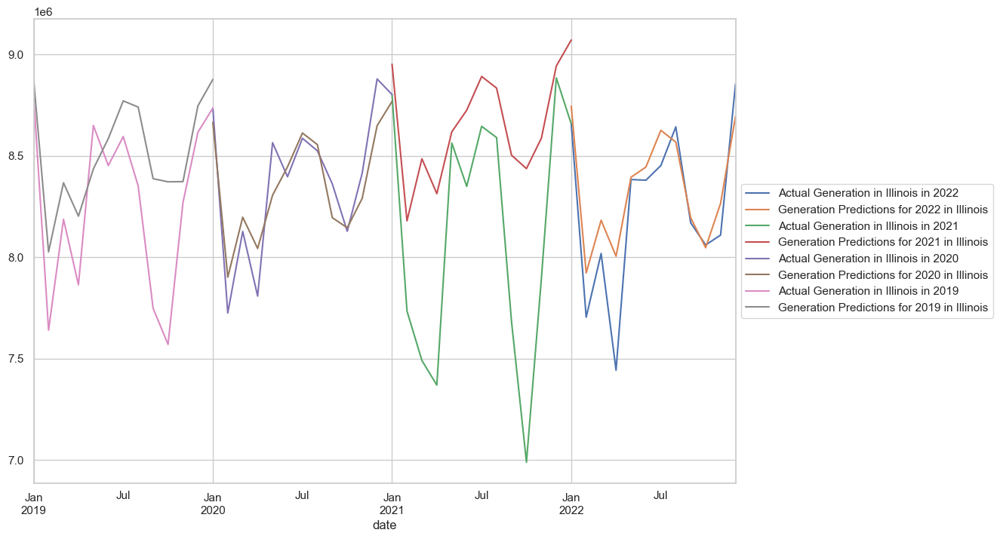



Mean Absolute Error (MAE) 2022: 142472.05863890308
Mean Absolute Error (MAE) 2021: 529200.1867912242
Mean Absolute Error (MAE) 2020: 114433.42740005956
Mean Absolute Error (MAE) 2019: 285309.39889333874
Promedio MAE: 267853.7679308814


Mean Squared Error (MSE) 2022: 40653830654.31718
Mean Squared Error (MSE) 2021: 444288882172.2334
Mean Squared Error (MSE) 2020: 20349292280.803574
Mean Squared Error (MSE) 2019: 126424836800.305
Promedio MSE: 157929210476.9148


Root Mean Squared Error (RMSE) 2022: 201627.95107404425
Root Mean Squared Error (RMSE) 2021: 666549.9847515064
Root Mean Squared Error (RMSE) 2020: 142650.94560080412
Root Mean Squared Error (RMSE) 2019: 355562.7044563378
Promedio RMSE: 341597.89647067315


Mean Absolute Percentage Error (MAPE) 2022: 1.7881551777374618
Mean Absolute Percentage Error (MAPE) 2021: 6.913189891631384
Mean Absolute Percentage Error (MAPE) 2020: 1.3751979731424124
Mean Absolute Percentage Error (MAPE) 2019: 3.5688692613489823
Promedio MAPE: 3.41135

In [ ]:
# ILLINOIS NUCLEAR

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_illinois_train_nuclear_2022 = df_illinois_pred_nuclear[df_illinois_pred_nuclear.index < '2022-01-01']
df_illinois_test_nuclear_2022 = df_illinois_pred_nuclear[df_illinois_pred_nuclear.index >= '2022-01-01']

df_illinois_train_nuclear_2021 = df_illinois_pred_nuclear[df_illinois_pred_nuclear.index < '2021-01-01']
df_illinois_test_nuclear_2021 = df_illinois_pred_nuclear[(df_illinois_pred_nuclear.index >= '2021-01-01') & (df_illinois_pred_nuclear.index < '2022-01-31')]

df_illinois_train_nuclear_2020 = df_illinois_pred_nuclear[df_illinois_pred_nuclear.index < '2020-01-01']
df_illinois_test_nuclear_2020 = df_illinois_pred_nuclear[(df_illinois_pred_nuclear.index >= '2020-01-01') & (df_illinois_pred_nuclear.index < '2021-01-31')]

df_illinois_train_nuclear_2019 = df_illinois_pred_nuclear[df_illinois_pred_nuclear.index < '2019-01-01']
df_illinois_test_nuclear_2019 = df_illinois_pred_nuclear[(df_illinois_pred_nuclear.index >= '2019-01-01') & (df_illinois_pred_nuclear.index < '2020-01-31')]

# Creamos el modelo
results_illinois_nuclear_2022 = sarimax_train(df_illinois_train_nuclear_2022)
results_illinois_nuclear_2021 = sarimax_train(df_illinois_train_nuclear_2021)
results_illinois_nuclear_2020 = sarimax_train(df_illinois_train_nuclear_2020)
results_illinois_nuclear_2019 = sarimax_train(df_illinois_train_nuclear_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_illinois_nuclear_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_illinois_test_nuclear_2022, results_illinois_nuclear_2022)
predictions_illinois_nuclear_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_illinois_test_nuclear_2021, results_illinois_nuclear_2021)
predictions_illinois_nuclear_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_illinois_test_nuclear_2020, results_illinois_nuclear_2020)
predictions_illinois_nuclear_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_illinois_test_nuclear_2019, results_illinois_nuclear_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_illinois_test_nuclear_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2022')
predictions_illinois_nuclear_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Illinois')

df_illinois_test_nuclear_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2021')
predictions_illinois_nuclear_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Illinois')

df_illinois_test_nuclear_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2020')
predictions_illinois_nuclear_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Illinois')

df_illinois_test_nuclear_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Illinois in 2019')
predictions_illinois_nuclear_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Illinois')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_illinois_nuclear_2022, mse_illinois_nuclear_2022, rmse_illinois_nuclear_2022, mape_illinois_nuclear_2022, r2_illinois_nuclear_2022 = calculo_metricas(df_illinois_test_nuclear_2022, predictions_illinois_nuclear_2022)
mae_illinois_nuclear_2021, mse_illinois_nuclear_2021, rmse_illinois_nuclear_2021, mape_illinois_nuclear_2021, r2_illinois_nuclear_2021 = calculo_metricas(df_illinois_test_nuclear_2021, predictions_illinois_nuclear_2021)
mae_illinois_nuclear_2020, mse_illinois_nuclear_2020, rmse_illinois_nuclear_2020, mape_illinois_nuclear_2020, r2_illinois_nuclear_2020 = calculo_metricas(df_illinois_test_nuclear_2020, predictions_illinois_nuclear_2020)
mae_illinois_nuclear_2019, mse_illinois_nuclear_2019, rmse_illinois_nuclear_2019, mape_illinois_nuclear_2019, r2_illinois_nuclear_2019 = calculo_metricas(df_illinois_test_nuclear_2019, predictions_illinois_nuclear_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_illinois_nuclear_2022)
print("Mean Absolute Error (MAE) 2021:", mae_illinois_nuclear_2021)
print("Mean Absolute Error (MAE) 2020:", mae_illinois_nuclear_2020)
print("Mean Absolute Error (MAE) 2019:", mae_illinois_nuclear_2019)
print('Promedio MAE:', statistics.mean([mae_illinois_nuclear_2022, mae_illinois_nuclear_2021, mae_illinois_nuclear_2020, mae_illinois_nuclear_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_illinois_nuclear_2022)
print("Mean Squared Error (MSE) 2021:", mse_illinois_nuclear_2021)
print("Mean Squared Error (MSE) 2020:", mse_illinois_nuclear_2020)
print("Mean Squared Error (MSE) 2019:", mse_illinois_nuclear_2019)
print('Promedio MSE:', statistics.mean([mse_illinois_nuclear_2022, mse_illinois_nuclear_2021, mse_illinois_nuclear_2020, mse_illinois_nuclear_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_illinois_nuclear_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_illinois_nuclear_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_illinois_nuclear_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_illinois_nuclear_2019)
print('Promedio RMSE:', statistics.mean([rmse_illinois_nuclear_2022, rmse_illinois_nuclear_2021, rmse_illinois_nuclear_2020, rmse_illinois_nuclear_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_illinois_nuclear_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_illinois_nuclear_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_illinois_nuclear_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_illinois_nuclear_2019)
print('Promedio MAPE:', statistics.mean([mape_illinois_nuclear_2022, mape_illinois_nuclear_2021, mape_illinois_nuclear_2020, mape_illinois_nuclear_2019]))
print('\n')
print("R2 Score 2022:", r2_illinois_nuclear_2022)
print("R2 Score 2021:", r2_illinois_nuclear_2021)
print("R2 Score 2020:", r2_illinois_nuclear_2020)
print("R2 Score 2019:", r2_illinois_nuclear_2019)
print('Promedio R2:', statistics.mean([r2_illinois_nuclear_2022, r2_illinois_nuclear_2021, r2_illinois_nuclear_2020, r2_illinois_nuclear_2019]))

### Pennsylvania - General

In [ ]:
# Creamos el dataset que necesitamos filtrando por texas primero, y luego por cada fuente de energía
df_pennsylvania_pred = df_pred_general[df_pred_general['state'] == 'Pennsylvania'].copy()
df_pennsylvania_pred_coal = df_pred_source[(df_pred_source['source'] == 'all coal products') & (df_pred_source['state'] == 'Pennsylvania')].copy()
df_pennsylvania_pred_renewables = df_pred_source[(df_pred_source['source'] == 'all renewables') & (df_pred_source['state'] == 'Pennsylvania')].copy()
df_pennsylvania_pred_gas = df_pred_source[(df_pred_source['source'] == 'natural gas') & (df_pred_source['state'] == 'Pennsylvania')].copy()
df_pennsylvania_pred_nuclear = df_pred_source[(df_pred_source['source'] == 'nuclear') & (df_pred_source['state'] == 'Pennsylvania')].copy()

# Ahora convertimos todas las fechas en el index del dataframe para poder hacer una serie de tiempo
df_pennsylvania_pred.set_index('date', inplace=True)
df_pennsylvania_pred.index.freq = 'MS'
df_pennsylvania_pred_coal.set_index('date', inplace=True)
df_pennsylvania_pred_coal.index.freq = 'MS'
df_pennsylvania_pred_renewables.set_index('date', inplace=True)
df_pennsylvania_pred_renewables.index.freq = 'MS'
df_pennsylvania_pred_gas.set_index('date', inplace=True)
df_pennsylvania_pred_gas.index.freq = 'MS'
df_pennsylvania_pred_nuclear.set_index('date', inplace=True)
df_pennsylvania_pred_nuclear.index.freq = 'MS'

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.54130D+01    |proj g|=  1.10907D-01

At iterate    5    f=  1.53816D+01    |proj g|=  4.43875D-03

At iterate   10    f=  1.53767D+01    |proj g|=  2.00533D-02


 This problem is unconstrained.



At iterate   15    f=  1.53745D+01    |proj g|=  2.19426D-03

At iterate   20    f=  1.53731D+01    |proj g|=  1.06166D-02

At iterate   25    f=  1.53727D+01    |proj g|=  4.45323D-03

At iterate   30    f=  1.53726D+01    |proj g|=  3.43611D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     31     33      1     0     0   1.862D-05   1.537D+01
  F =   15.372648703597642     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f=  1.53872D+01    |proj g|=  4.39501D-03

At iterate   25    f=  1.53870D+01    |proj g|=  6.77172D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     26     30      1     0     0   2.998D-05   1.539D+01
  F =   15.387017017040151     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.54197D+01    |proj g|=  1.34752D-01

At iterate    5    f=  1.53722D+01    |proj g|=  6.47158D-03

At iter

 This problem is unconstrained.



At iterate   15    f=  1.53686D+01    |proj g|=  4.15728D-03

At iterate   20    f=  1.53678D+01    |proj g|=  3.38369D-03

At iterate   25    f=  1.53675D+01    |proj g|=  3.58074D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     28     34      1     0     0   1.244D-05   1.537D+01
  F =   15.367506457567041     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.52903D+01    |proj g|=  7.54507D-02

At iter

 This problem is unconstrained.



At iterate   20    f=  1.52726D+01    |proj g|=  4.31362D-03

At iterate   25    f=  1.52725D+01    |proj g|=  1.98643D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     26     33      1     0     0   4.137D-06   1.527D+01
  F =   15.272459329697050     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


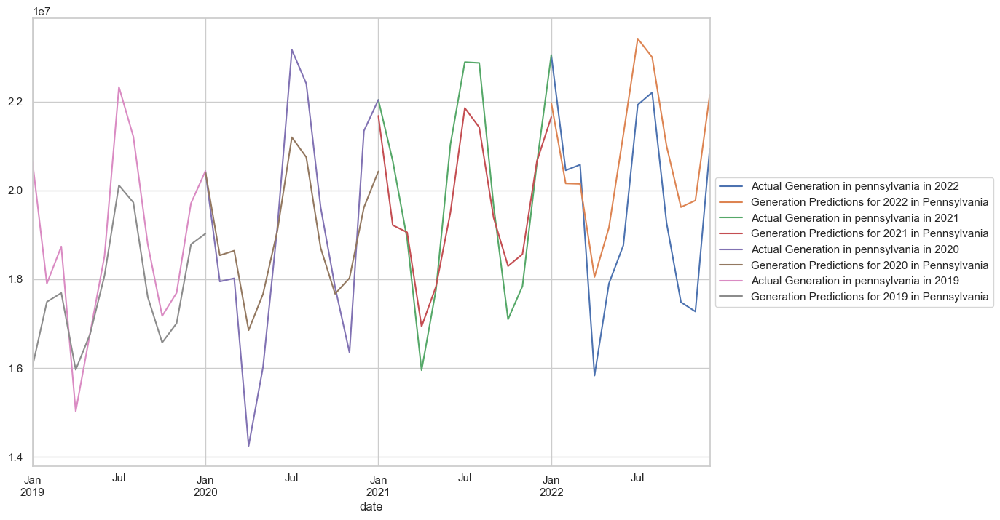



Mean Absolute Error (MAE) 2022: 1470920.8781976681
Mean Absolute Error (MAE) 2021: 820080.3699897296
Mean Absolute Error (MAE) 2020: 1174496.9349587574
Mean Absolute Error (MAE) 2019: 1229285.342805745
Promedio MAE: 1173695.8814879751


Mean Squared Error (MSE) 2022: 2694869012839.4985
Mean Squared Error (MSE) 2021: 978840509872.1394
Mean Squared Error (MSE) 2020: 2008572501283.4229
Mean Squared Error (MSE) 2019: 2758179099524.1875
Promedio MSE: 2110115280879.812


Root Mean Squared Error (RMSE) 2022: 1641605.6203727797
Root Mean Squared Error (RMSE) 2021: 989363.6893843131
Root Mean Squared Error (RMSE) 2020: 1417241.158477774
Root Mean Squared Error (RMSE) 2019: 1660776.6555212014
Promedio RMSE: 1427246.780939017


Mean Absolute Percentage Error (MAPE) 2022: 7.871753077248438
Mean Absolute Percentage Error (MAPE) 2021: 4.06554749103611
Mean Absolute Percentage Error (MAPE) 2020: 6.3753486563442845
Mean Absolute Percentage Error (MAPE) 2019: 6.244780937131704
Promedio MAPE: 6.139357

In [ ]:
# PENNSYLVANIA GENERAL

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_pennsylvania_train_general_2022 = df_pennsylvania_pred[df_pennsylvania_pred.index < '2022-01-01']
df_pennsylvania_test_general_2022 = df_pennsylvania_pred[df_pennsylvania_pred.index >= '2022-01-01']

df_pennsylvania_train_general_2021 = df_pennsylvania_pred[df_pennsylvania_pred.index < '2021-01-01']
df_pennsylvania_test_general_2021 = df_pennsylvania_pred[(df_pennsylvania_pred.index >= '2021-01-01') & (df_pennsylvania_pred.index < '2022-01-31')]

df_pennsylvania_train_general_2020 = df_pennsylvania_pred[df_pennsylvania_pred.index < '2020-01-01']
df_pennsylvania_test_general_2020 = df_pennsylvania_pred[(df_pennsylvania_pred.index >= '2020-01-01') & (df_pennsylvania_pred.index < '2021-01-31')]

df_pennsylvania_train_general_2019 = df_pennsylvania_pred[df_pennsylvania_pred.index < '2019-01-01']
df_pennsylvania_test_general_2019 = df_pennsylvania_pred[(df_pennsylvania_pred.index >= '2019-01-01') & (df_pennsylvania_pred.index < '2020-01-31')]

# Creamos el modelo
results_pennsylvania_general_2022 = sarimax_train(df_pennsylvania_train_general_2022)
results_pennsylvania_general_2021 = sarimax_train(df_pennsylvania_train_general_2021)
results_pennsylvania_general_2020 = sarimax_train(df_pennsylvania_train_general_2020)
results_pennsylvania_general_2019 = sarimax_train(df_pennsylvania_train_general_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_pennsylvania_general_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_pennsylvania_test_general_2022, results_pennsylvania_general_2022)
predictions_pennsylvania_general_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_pennsylvania_test_general_2021, results_pennsylvania_general_2021)
predictions_pennsylvania_general_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_pennsylvania_test_general_2020, results_pennsylvania_general_2020)
predictions_pennsylvania_general_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_pennsylvania_test_general_2019, results_pennsylvania_general_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_pennsylvania_test_general_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in pennsylvania in 2022')
predictions_pennsylvania_general_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Pennsylvania')

df_pennsylvania_test_general_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in pennsylvania in 2021')
predictions_pennsylvania_general_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Pennsylvania')

df_pennsylvania_test_general_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in pennsylvania in 2020')
predictions_pennsylvania_general_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Pennsylvania')

df_pennsylvania_test_general_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in pennsylvania in 2019')
predictions_pennsylvania_general_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Pennsylvania')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_pennsylvania_general_2022, mse_pennsylvania_general_2022, rmse_pennsylvania_general_2022, mape_pennsylvania_general_2022, r2_pennsylvania_general_2022 = calculo_metricas(df_pennsylvania_test_general_2022, predictions_pennsylvania_general_2022)
mae_pennsylvania_general_2021, mse_pennsylvania_general_2021, rmse_pennsylvania_general_2021, mape_pennsylvania_general_2021, r2_pennsylvania_general_2021 = calculo_metricas(df_pennsylvania_test_general_2021, predictions_pennsylvania_general_2021)
mae_pennsylvania_general_2020, mse_pennsylvania_general_2020, rmse_pennsylvania_general_2020, mape_pennsylvania_general_2020, r2_pennsylvania_general_2020 = calculo_metricas(df_pennsylvania_test_general_2020, predictions_pennsylvania_general_2020)
mae_pennsylvania_general_2019, mse_pennsylvania_general_2019, rmse_pennsylvania_general_2019, mape_pennsylvania_general_2019, r2_pennsylvania_general_2019 = calculo_metricas(df_pennsylvania_test_general_2019, predictions_pennsylvania_general_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_pennsylvania_general_2022)
print("Mean Absolute Error (MAE) 2021:", mae_pennsylvania_general_2021)
print("Mean Absolute Error (MAE) 2020:", mae_pennsylvania_general_2020)
print("Mean Absolute Error (MAE) 2019:", mae_pennsylvania_general_2019)
print('Promedio MAE:', statistics.mean([mae_pennsylvania_general_2022, mae_pennsylvania_general_2021, mae_pennsylvania_general_2020, mae_pennsylvania_general_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_pennsylvania_general_2022)
print("Mean Squared Error (MSE) 2021:", mse_pennsylvania_general_2021)
print("Mean Squared Error (MSE) 2020:", mse_pennsylvania_general_2020)
print("Mean Squared Error (MSE) 2019:", mse_pennsylvania_general_2019)
print('Promedio MSE:', statistics.mean([mse_pennsylvania_general_2022, mse_pennsylvania_general_2021, mse_pennsylvania_general_2020, mse_pennsylvania_general_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_pennsylvania_general_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_pennsylvania_general_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_pennsylvania_general_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_pennsylvania_general_2019)
print('Promedio RMSE:', statistics.mean([rmse_pennsylvania_general_2022, rmse_pennsylvania_general_2021, rmse_pennsylvania_general_2020, rmse_pennsylvania_general_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_pennsylvania_general_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_pennsylvania_general_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_pennsylvania_general_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_pennsylvania_general_2019)
print('Promedio MAPE:', statistics.mean([mape_pennsylvania_general_2022, mape_pennsylvania_general_2021, mape_pennsylvania_general_2020, mape_pennsylvania_general_2019]))
print('\n')
print("R2 Score 2022:", r2_pennsylvania_general_2022)
print("R2 Score 2021:", r2_pennsylvania_general_2021)
print("R2 Score 2020:", r2_pennsylvania_general_2020)
print("R2 Score 2019:", r2_pennsylvania_general_2019)
print('Promedio R2:', statistics.mean([r2_pennsylvania_general_2022, r2_pennsylvania_general_2021, r2_pennsylvania_general_2020, r2_pennsylvania_general_2019]))

### Pennsylvania - Coal

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.50172D+01    |proj g|=  1.07459D-01

At iterate    5    f=  1.49778D+01    |proj g|=  1.03966D-02

At iterate   10    f=  1.49740D+01    |proj g|=  6.30633D-03


 This problem is unconstrained.



At iterate   15    f=  1.49739D+01    |proj g|=  3.65599D-04

At iterate   20    f=  1.49739D+01    |proj g|=  2.22188D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     21     25      1     0     0   3.754D-05   1.497D+01
  F =   14.973926510698817     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.50149D+01    |proj g|=  1.25587D-01

At iterate    5    f=  1.49778D+01    |proj g|=  3.03912D-02

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.50251D+01    |proj g|=  8.85327D-02

At iterate    5    f=  1.49993D+01    |proj g|=  3.14279D-02

At iterate   10    f=  1.49887D+01    |proj g|=  9.47435D-03

At iterate   15    f=  1.49882D+01    |proj g|=  3.99590D-04


 This problem is unconstrained.



At iterate   20    f=  1.49881D+01    |proj g|=  3.55663D-04

At iterate   25    f=  1.49881D+01    |proj g|=  2.77961D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     25     28      1     0     0   2.780D-05   1.499D+01
  F =   14.988113085722505     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.50050D+01    |proj g|=  1.67425D-01

At iterate    5    f=  1.49707D+01    |proj g|=  2.37936D-02

At iter

 This problem is unconstrained.


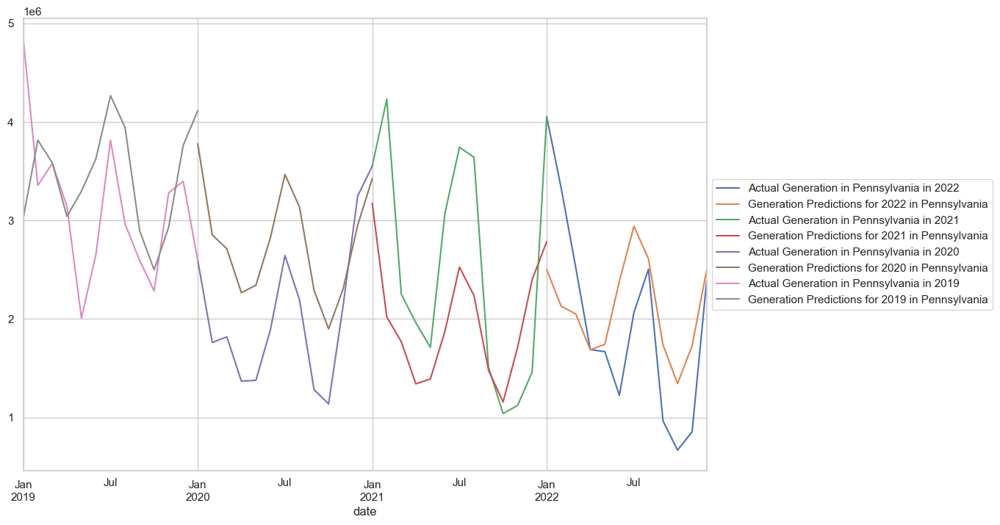



Mean Absolute Error (MAE) 2022: 655572.905168347
Mean Absolute Error (MAE) 2021: 828316.1456950424
Mean Absolute Error (MAE) 2020: 776449.665209988
Mean Absolute Error (MAE) 2019: 678012.7440114607
Promedio MAE: 734587.8650212095


Mean Squared Error (MSE) 2022: 667991737401.2656
Mean Squared Error (MSE) 2021: 1036369515076.0475
Mean Squared Error (MSE) 2020: 715172462379.6545
Mean Squared Error (MSE) 2019: 767071000000.7665
Promedio MSE: 796651178714.4336


Root Mean Squared Error (RMSE) 2022: 817307.6149169697
Root Mean Squared Error (RMSE) 2021: 1018022.3548999538
Root Mean Squared Error (RMSE) 2020: 845678.6992585628
Root Mean Squared Error (RMSE) 2019: 875825.8959409492
Promedio RMSE: 889208.6412541089


Mean Absolute Percentage Error (MAPE) 2022: 43.85809025864483
Mean Absolute Percentage Error (MAPE) 2021: 31.21026475165648
Mean Absolute Percentage Error (MAPE) 2020: 44.764685810400636
Mean Absolute Percentage Error (MAPE) 2019: 23.13407776411049
Promedio MAPE: 35.741779646203

In [ ]:
# PENNSYLVANIA COAL

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_pennsylvania_train_coal_2022 = df_pennsylvania_pred_coal[df_pennsylvania_pred_coal.index < '2022-01-01']
df_pennsylvania_test_coal_2022 = df_pennsylvania_pred_coal[df_pennsylvania_pred_coal.index >= '2022-01-01']

df_pennsylvania_train_coal_2021 = df_pennsylvania_pred_coal[df_pennsylvania_pred_coal.index < '2021-01-01']
df_pennsylvania_test_coal_2021 = df_pennsylvania_pred_coal[(df_pennsylvania_pred_coal.index >= '2021-01-01') & (df_pennsylvania_pred_coal.index < '2022-01-31')]

df_pennsylvania_train_coal_2020 = df_pennsylvania_pred_coal[df_pennsylvania_pred_coal.index < '2020-01-01']
df_pennsylvania_test_coal_2020 = df_pennsylvania_pred_coal[(df_pennsylvania_pred_coal.index >= '2020-01-01') & (df_pennsylvania_pred_coal.index < '2021-01-31')]

df_pennsylvania_train_coal_2019 = df_pennsylvania_pred_coal[df_pennsylvania_pred_coal.index < '2019-01-01']
df_pennsylvania_test_coal_2019 = df_pennsylvania_pred_coal[(df_pennsylvania_pred_coal.index >= '2019-01-01') & (df_pennsylvania_pred_coal.index < '2020-01-31')]

# Creamos el modelo
results_pennsylvania_coal_2022 = sarimax_train(df_pennsylvania_train_coal_2022)
results_pennsylvania_coal_2021 = sarimax_train(df_pennsylvania_train_coal_2021)
results_pennsylvania_coal_2020 = sarimax_train(df_pennsylvania_train_coal_2020)
results_pennsylvania_coal_2019 = sarimax_train(df_pennsylvania_train_coal_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_pennsylvania_coal_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_pennsylvania_test_coal_2022, results_pennsylvania_coal_2022)
predictions_pennsylvania_coal_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_pennsylvania_test_coal_2021, results_pennsylvania_coal_2021)
predictions_pennsylvania_coal_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_pennsylvania_test_coal_2020, results_pennsylvania_coal_2020)
predictions_pennsylvania_coal_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_pennsylvania_test_coal_2019, results_pennsylvania_coal_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_pennsylvania_test_coal_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2022')
predictions_pennsylvania_coal_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Pennsylvania')

df_pennsylvania_test_coal_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2021')
predictions_pennsylvania_coal_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Pennsylvania')

df_pennsylvania_test_coal_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2020')
predictions_pennsylvania_coal_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Pennsylvania')

df_pennsylvania_test_coal_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2019')
predictions_pennsylvania_coal_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Pennsylvania')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_pennsylvania_coal_2022, mse_pennsylvania_coal_2022, rmse_pennsylvania_coal_2022, mape_pennsylvania_coal_2022, r2_pennsylvania_coal_2022 = calculo_metricas(df_pennsylvania_test_coal_2022, predictions_pennsylvania_coal_2022)
mae_pennsylvania_coal_2021, mse_pennsylvania_coal_2021, rmse_pennsylvania_coal_2021, mape_pennsylvania_coal_2021, r2_pennsylvania_coal_2021 = calculo_metricas(df_pennsylvania_test_coal_2021, predictions_pennsylvania_coal_2021)
mae_pennsylvania_coal_2020, mse_pennsylvania_coal_2020, rmse_pennsylvania_coal_2020, mape_pennsylvania_coal_2020, r2_pennsylvania_coal_2020 = calculo_metricas(df_pennsylvania_test_coal_2020, predictions_pennsylvania_coal_2020)
mae_pennsylvania_coal_2019, mse_pennsylvania_coal_2019, rmse_pennsylvania_coal_2019, mape_pennsylvania_coal_2019, r2_pennsylvania_coal_2019 = calculo_metricas(df_pennsylvania_test_coal_2019, predictions_pennsylvania_coal_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_pennsylvania_coal_2022)
print("Mean Absolute Error (MAE) 2021:", mae_pennsylvania_coal_2021)
print("Mean Absolute Error (MAE) 2020:", mae_pennsylvania_coal_2020)
print("Mean Absolute Error (MAE) 2019:", mae_pennsylvania_coal_2019)
print('Promedio MAE:', statistics.mean([mae_pennsylvania_coal_2022, mae_pennsylvania_coal_2021, mae_pennsylvania_coal_2020, mae_pennsylvania_coal_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_pennsylvania_coal_2022)
print("Mean Squared Error (MSE) 2021:", mse_pennsylvania_coal_2021)
print("Mean Squared Error (MSE) 2020:", mse_pennsylvania_coal_2020)
print("Mean Squared Error (MSE) 2019:", mse_pennsylvania_coal_2019)
print('Promedio MSE:', statistics.mean([mse_pennsylvania_coal_2022, mse_pennsylvania_coal_2021, mse_pennsylvania_coal_2020, mse_pennsylvania_coal_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_pennsylvania_coal_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_pennsylvania_coal_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_pennsylvania_coal_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_pennsylvania_coal_2019)
print('Promedio RMSE:', statistics.mean([rmse_pennsylvania_coal_2022, rmse_pennsylvania_coal_2021, rmse_pennsylvania_coal_2020, rmse_pennsylvania_coal_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_pennsylvania_coal_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_pennsylvania_coal_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_pennsylvania_coal_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_pennsylvania_coal_2019)
print('Promedio MAPE:', statistics.mean([mape_pennsylvania_coal_2022, mape_pennsylvania_coal_2021, mape_pennsylvania_coal_2020, mape_pennsylvania_coal_2019]))
print('\n')
print("R2 Score 2022:", r2_pennsylvania_coal_2022)
print("R2 Score 2021:", r2_pennsylvania_coal_2021)
print("R2 Score 2020:", r2_pennsylvania_coal_2020)
print("R2 Score 2019:", r2_pennsylvania_coal_2019)
print('Promedio R2:', statistics.mean([r2_pennsylvania_coal_2022, r2_pennsylvania_coal_2021, r2_pennsylvania_coal_2020, r2_pennsylvania_coal_2019]))

### Pennsylvania - Natural Gas

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.46973D+01    |proj g|=  9.34209D-02


 This problem is unconstrained.



At iterate    5    f=  1.46926D+01    |proj g|=  2.25923D-03

At iterate   10    f=  1.46909D+01    |proj g|=  2.80330D-02

At iterate   15    f=  1.46862D+01    |proj g|=  6.51954D-03

At iterate   20    f=  1.46849D+01    |proj g|=  5.77614D-04

At iterate   25    f=  1.46849D+01    |proj g|=  1.74314D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     25     30      1     0     0   1.743D-06   1.468D+01
  F =   14.684929282194812     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

 This problem is unconstrained.


At iterate   10    f=  1.46754D+01    |proj g|=  2.30927D-02

At iterate   15    f=  1.46726D+01    |proj g|=  2.53256D-03

At iterate   20    f=  1.46715D+01    |proj g|=  1.98411D-03

At iterate   25    f=  1.46714D+01    |proj g|=  1.50134D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     29     32      1     0     0   2.127D-06   1.467D+01
  F =   14.671371033132800     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At itera

 This problem is unconstrained.



At iterate   20    f=  1.45610D+01    |proj g|=  3.44750D-03

At iterate   25    f=  1.45609D+01    |proj g|=  5.65476D-04

At iterate   30    f=  1.45609D+01    |proj g|=  7.41363D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     30     34      1     0     0   7.414D-06   1.456D+01
  F =   14.560881952155594     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.45010D+01    |proj g|=  1.13121D-01

At iter

 This problem is unconstrained.



At iterate   15    f=  1.44847D+01    |proj g|=  1.43154D-03

At iterate   20    f=  1.44839D+01    |proj g|=  3.11011D-02

At iterate   25    f=  1.44799D+01    |proj g|=  8.11453D-03

At iterate   30    f=  1.44789D+01    |proj g|=  2.45792D-03

At iterate   35    f=  1.44788D+01    |proj g|=  4.97682D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     35     40      1     0     0   4.977D-06   1.448D+01
  F =   14.478846662408520     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


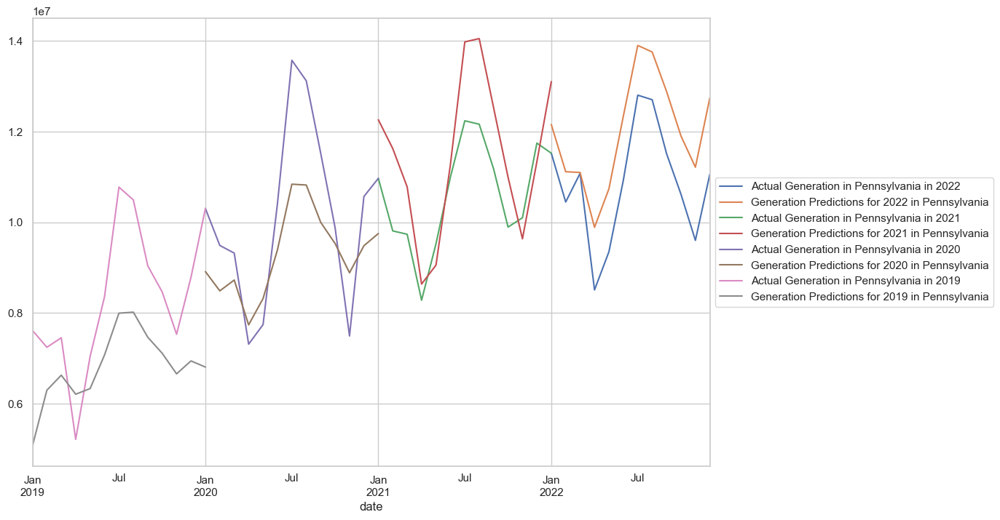



Mean Absolute Error (MAE) 2022: 1134146.9560361737
Mean Absolute Error (MAE) 2021: 1060596.704977612
Mean Absolute Error (MAE) 2020: 1200905.4627421035
Mean Absolute Error (MAE) 2019: 1670156.856602476
Promedio MAE: 1266451.4950895912


Mean Squared Error (MSE) 2022: 1497672688633.4617
Mean Squared Error (MSE) 2021: 1460722744388.4248
Mean Squared Error (MSE) 2020: 1896471581933.76
Mean Squared Error (MSE) 2019: 3522747460590.614
Promedio MSE: 2094403618886.565


Root Mean Squared Error (RMSE) 2022: 1223794.3816807878
Root Mean Squared Error (RMSE) 2021: 1208603.6341118724
Root Mean Squared Error (RMSE) 2020: 1377124.388693251
Root Mean Squared Error (RMSE) 2019: 1876898.361816807
Promedio RMSE: 1421605.1915756795


Mean Absolute Percentage Error (MAPE) 2022: 10.74780056860824
Mean Absolute Percentage Error (MAPE) 2021: 9.806343672655927
Mean Absolute Percentage Error (MAPE) 2020: 11.373104579954193
Mean Absolute Percentage Error (MAPE) 2019: 19.34163550648817
Promedio MAPE: 12.81722

In [ ]:
# PENNSYLVANIA NATURAL GAS

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_pennsylvania_train_gas_2022 = df_pennsylvania_pred_gas[df_pennsylvania_pred_gas.index < '2022-01-01']
df_pennsylvania_test_gas_2022 = df_pennsylvania_pred_gas[df_pennsylvania_pred_gas.index >= '2022-01-01']

df_pennsylvania_train_gas_2021 = df_pennsylvania_pred_gas[df_pennsylvania_pred_gas.index < '2021-01-01']
df_pennsylvania_test_gas_2021 = df_pennsylvania_pred_gas[(df_pennsylvania_pred_gas.index >= '2021-01-01') & (df_pennsylvania_pred_gas.index < '2022-01-31')]

df_pennsylvania_train_gas_2020 = df_pennsylvania_pred_gas[df_pennsylvania_pred_gas.index < '2020-01-01']
df_pennsylvania_test_gas_2020 = df_pennsylvania_pred_gas[(df_pennsylvania_pred_gas.index >= '2020-01-01') & (df_pennsylvania_pred_gas.index < '2021-01-31')]

df_pennsylvania_train_gas_2019 = df_pennsylvania_pred_gas[df_pennsylvania_pred_gas.index < '2019-01-01']
df_pennsylvania_test_gas_2019 = df_pennsylvania_pred_gas[(df_pennsylvania_pred_gas.index >= '2019-01-01') & (df_pennsylvania_pred_gas.index < '2020-01-31')]

# Creamos el modelo
results_pennsylvania_gas_2022 = sarimax_train(df_pennsylvania_train_gas_2022)
results_pennsylvania_gas_2021 = sarimax_train(df_pennsylvania_train_gas_2021)
results_pennsylvania_gas_2020 = sarimax_train(df_pennsylvania_train_gas_2020)
results_pennsylvania_gas_2019 = sarimax_train(df_pennsylvania_train_gas_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_pennsylvania_gas_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_pennsylvania_test_gas_2022, results_pennsylvania_gas_2022)
predictions_pennsylvania_gas_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_pennsylvania_test_gas_2021, results_pennsylvania_gas_2021)
predictions_pennsylvania_gas_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_pennsylvania_test_gas_2020, results_pennsylvania_gas_2020)
predictions_pennsylvania_gas_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_pennsylvania_test_gas_2019, results_pennsylvania_gas_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_pennsylvania_test_gas_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2022')
predictions_pennsylvania_gas_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Pennsylvania')

df_pennsylvania_test_gas_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2021')
predictions_pennsylvania_gas_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Pennsylvania')

df_pennsylvania_test_gas_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2020')
predictions_pennsylvania_gas_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Pennsylvania')

df_pennsylvania_test_gas_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2019')
predictions_pennsylvania_gas_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Pennsylvania')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_pennsylvania_gas_2022, mse_pennsylvania_gas_2022, rmse_pennsylvania_gas_2022, mape_pennsylvania_gas_2022, r2_pennsylvania_gas_2022 = calculo_metricas(df_pennsylvania_test_gas_2022, predictions_pennsylvania_gas_2022)
mae_pennsylvania_gas_2021, mse_pennsylvania_gas_2021, rmse_pennsylvania_gas_2021, mape_pennsylvania_gas_2021, r2_pennsylvania_gas_2021 = calculo_metricas(df_pennsylvania_test_gas_2021, predictions_pennsylvania_gas_2021)
mae_pennsylvania_gas_2020, mse_pennsylvania_gas_2020, rmse_pennsylvania_gas_2020, mape_pennsylvania_gas_2020, r2_pennsylvania_gas_2020 = calculo_metricas(df_pennsylvania_test_gas_2020, predictions_pennsylvania_gas_2020)
mae_pennsylvania_gas_2019, mse_pennsylvania_gas_2019, rmse_pennsylvania_gas_2019, mape_pennsylvania_gas_2019, r2_pennsylvania_gas_2019 = calculo_metricas(df_pennsylvania_test_gas_2019, predictions_pennsylvania_gas_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_pennsylvania_gas_2022)
print("Mean Absolute Error (MAE) 2021:", mae_pennsylvania_gas_2021)
print("Mean Absolute Error (MAE) 2020:", mae_pennsylvania_gas_2020)
print("Mean Absolute Error (MAE) 2019:", mae_pennsylvania_gas_2019)
print('Promedio MAE:', statistics.mean([mae_pennsylvania_gas_2022, mae_pennsylvania_gas_2021, mae_pennsylvania_gas_2020, mae_pennsylvania_gas_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_pennsylvania_gas_2022)
print("Mean Squared Error (MSE) 2021:", mse_pennsylvania_gas_2021)
print("Mean Squared Error (MSE) 2020:", mse_pennsylvania_gas_2020)
print("Mean Squared Error (MSE) 2019:", mse_pennsylvania_gas_2019)
print('Promedio MSE:', statistics.mean([mse_pennsylvania_gas_2022, mse_pennsylvania_gas_2021, mse_pennsylvania_gas_2020, mse_pennsylvania_gas_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_pennsylvania_gas_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_pennsylvania_gas_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_pennsylvania_gas_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_pennsylvania_gas_2019)
print('Promedio RMSE:', statistics.mean([rmse_pennsylvania_gas_2022, rmse_pennsylvania_gas_2021, rmse_pennsylvania_gas_2020, rmse_pennsylvania_gas_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_pennsylvania_gas_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_pennsylvania_gas_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_pennsylvania_gas_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_pennsylvania_gas_2019)
print('Promedio MAPE:', statistics.mean([mape_pennsylvania_gas_2022, mape_pennsylvania_gas_2021, mape_pennsylvania_gas_2020, mape_pennsylvania_gas_2019]))
print('\n')
print("R2 Score 2022:", r2_pennsylvania_gas_2022)
print("R2 Score 2021:", r2_pennsylvania_gas_2021)
print("R2 Score 2020:", r2_pennsylvania_gas_2020)
print("R2 Score 2019:", r2_pennsylvania_gas_2019)
print('Promedio R2:', statistics.mean([r2_pennsylvania_gas_2022, r2_pennsylvania_gas_2021, r2_pennsylvania_gas_2020, r2_pennsylvania_gas_2019]))

### Pennsylvania - Renewables

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.22372D+01    |proj g|=  2.22708D-01

At iterate    5    f=  1.21881D+01    |proj g|=  3.44734D-02


 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.21730D+01    |proj g|=  1.83303D-02

At iterate   15    f=  1.21628D+01    |proj g|=  9.71778D-03

At iterate   20    f=  1.21626D+01    |proj g|=  4.56815D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     21     27      1     0     0   3.424D-05   1.216D+01
  F =   12.162585991817229     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.22117D+01    |proj g|=  2.58181D-01

At iter

 This problem is unconstrained.



At iterate    5    f=  1.21277D+01    |proj g|=  2.39109D-02

At iterate   10    f=  1.21187D+01    |proj g|=  2.45603D-02

At iterate   15    f=  1.21093D+01    |proj g|=  1.46581D-02

At iterate   20    f=  1.21091D+01    |proj g|=  4.34604D-04

At iterate   25    f=  1.21090D+01    |proj g|=  5.72474D-03

At iterate   30    f=  1.21079D+01    |proj g|=  3.66789D-03

At iterate   35    f=  1.21068D+01    |proj g|=  9.99870D-04

At iterate   40    f=  1.21063D+01    |proj g|=  9.65123D-04

At iterate   45    f=  1.21063D+01    |proj g|=  1.87886D-04


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     49     57      1     0     0   1.702D-05   1.211D+01
  F =   12.106295882010393     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.21494D+01    |proj g|=  1.25641D-01

At iterate    5    f=  1.21311D+01    |proj g|=  3.16120D-02

At iterate   10    f=  1.21304D+01    |proj g|=  9.21286D-03

At iterate   15    f=  1.21278D+01    |proj g|=  8.81654D-02

At iter

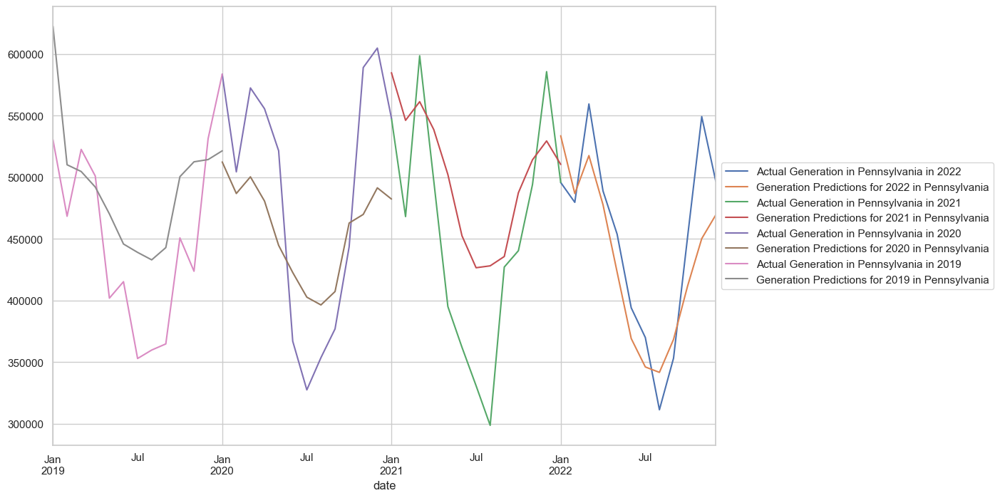



Mean Absolute Error (MAE) 2022: 32430.62451885987
Mean Absolute Error (MAE) 2021: 58686.450053279055
Mean Absolute Error (MAE) 2020: 64150.6617637917
Mean Absolute Error (MAE) 2019: 54951.8976525122
Promedio MAE: 52554.90849711071


Mean Squared Error (MSE) 2022: 1564872133.0468132
Mean Squared Error (MSE) 2021: 4783507316.777325
Mean Squared Error (MSE) 2020: 5024067700.101624
Mean Squared Error (MSE) 2019: 3812976222.5861053
Promedio MSE: 3796355843.127967


Root Mean Squared Error (RMSE) 2022: 39558.46474582669
Root Mean Squared Error (RMSE) 2021: 69162.9041956548
Root Mean Squared Error (RMSE) 2020: 70880.65815228879
Root Mean Squared Error (RMSE) 2019: 61749.30139350651
Promedio RMSE: 60337.8321218192


Mean Absolute Percentage Error (MAPE) 2022: 7.070408977495847
Mean Absolute Percentage Error (MAPE) 2021: 14.743493844481012
Mean Absolute Percentage Error (MAPE) 2020: 13.08450976264767
Mean Absolute Percentage Error (MAPE) 2019: 12.908191514931753
Promedio MAPE: 11.951651024889

In [ ]:
# PENNSYLVANIA RENEWABLES

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_pennsylvania_train_renewables_2022 = df_pennsylvania_pred_renewables[df_pennsylvania_pred_renewables.index < '2022-01-01']
df_pennsylvania_test_renewables_2022 = df_pennsylvania_pred_renewables[df_pennsylvania_pred_renewables.index >= '2022-01-01']

df_pennsylvania_train_renewables_2021 = df_pennsylvania_pred_renewables[df_pennsylvania_pred_renewables.index < '2021-01-01']
df_pennsylvania_test_renewables_2021 = df_pennsylvania_pred_renewables[(df_pennsylvania_pred_renewables.index >= '2021-01-01') & (df_pennsylvania_pred_renewables.index < '2022-01-31')]

df_pennsylvania_train_renewables_2020 = df_pennsylvania_pred_renewables[df_pennsylvania_pred_renewables.index < '2020-01-01']
df_pennsylvania_test_renewables_2020 = df_pennsylvania_pred_renewables[(df_pennsylvania_pred_renewables.index >= '2020-01-01') & (df_pennsylvania_pred_renewables.index < '2021-01-31')]

df_pennsylvania_train_renewables_2019 = df_pennsylvania_pred_renewables[df_pennsylvania_pred_renewables.index < '2019-01-01']
df_pennsylvania_test_renewables_2019 = df_pennsylvania_pred_renewables[(df_pennsylvania_pred_renewables.index >= '2019-01-01') & (df_pennsylvania_pred_renewables.index < '2020-01-31')]

# Creamos el modelo
results_pennsylvania_renewables_2022 = sarimax_train(df_pennsylvania_train_renewables_2022)
results_pennsylvania_renewables_2021 = sarimax_train(df_pennsylvania_train_renewables_2021)
results_pennsylvania_renewables_2020 = sarimax_train(df_pennsylvania_train_renewables_2020)
results_pennsylvania_renewables_2019 = sarimax_train(df_pennsylvania_train_renewables_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_pennsylvania_renewables_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_pennsylvania_test_renewables_2022, results_pennsylvania_renewables_2022)
predictions_pennsylvania_renewables_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_pennsylvania_test_renewables_2021, results_pennsylvania_renewables_2021)
predictions_pennsylvania_renewables_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_pennsylvania_test_renewables_2020, results_pennsylvania_renewables_2020)
predictions_pennsylvania_renewables_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_pennsylvania_test_renewables_2019, results_pennsylvania_renewables_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_pennsylvania_test_renewables_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2022')
predictions_pennsylvania_renewables_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Pennsylvania')

df_pennsylvania_test_renewables_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2021')
predictions_pennsylvania_renewables_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Pennsylvania')

df_pennsylvania_test_renewables_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2020')
predictions_pennsylvania_renewables_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Pennsylvania')

df_pennsylvania_test_renewables_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2019')
predictions_pennsylvania_renewables_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Pennsylvania')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_pennsylvania_renewables_2022, mse_pennsylvania_renewables_2022, rmse_pennsylvania_renewables_2022, mape_pennsylvania_renewables_2022, r2_pennsylvania_renewables_2022 = calculo_metricas(df_pennsylvania_test_renewables_2022, predictions_pennsylvania_renewables_2022)
mae_pennsylvania_renewables_2021, mse_pennsylvania_renewables_2021, rmse_pennsylvania_renewables_2021, mape_pennsylvania_renewables_2021, r2_pennsylvania_renewables_2021 = calculo_metricas(df_pennsylvania_test_renewables_2021, predictions_pennsylvania_renewables_2021)
mae_pennsylvania_renewables_2020, mse_pennsylvania_renewables_2020, rmse_pennsylvania_renewables_2020, mape_pennsylvania_renewables_2020, r2_pennsylvania_renewables_2020 = calculo_metricas(df_pennsylvania_test_renewables_2020, predictions_pennsylvania_renewables_2020)
mae_pennsylvania_renewables_2019, mse_pennsylvania_renewables_2019, rmse_pennsylvania_renewables_2019, mape_pennsylvania_renewables_2019, r2_pennsylvania_renewables_2019 = calculo_metricas(df_pennsylvania_test_renewables_2019, predictions_pennsylvania_renewables_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_pennsylvania_renewables_2022)
print("Mean Absolute Error (MAE) 2021:", mae_pennsylvania_renewables_2021)
print("Mean Absolute Error (MAE) 2020:", mae_pennsylvania_renewables_2020)
print("Mean Absolute Error (MAE) 2019:", mae_pennsylvania_renewables_2019)
print('Promedio MAE:', statistics.mean([mae_pennsylvania_renewables_2022, mae_pennsylvania_renewables_2021, mae_pennsylvania_renewables_2020, mae_pennsylvania_renewables_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_pennsylvania_renewables_2022)
print("Mean Squared Error (MSE) 2021:", mse_pennsylvania_renewables_2021)
print("Mean Squared Error (MSE) 2020:", mse_pennsylvania_renewables_2020)
print("Mean Squared Error (MSE) 2019:", mse_pennsylvania_renewables_2019)
print('Promedio MSE:', statistics.mean([mse_pennsylvania_renewables_2022, mse_pennsylvania_renewables_2021, mse_pennsylvania_renewables_2020, mse_pennsylvania_renewables_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_pennsylvania_renewables_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_pennsylvania_renewables_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_pennsylvania_renewables_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_pennsylvania_renewables_2019)
print('Promedio RMSE:', statistics.mean([rmse_pennsylvania_renewables_2022, rmse_pennsylvania_renewables_2021, rmse_pennsylvania_renewables_2020, rmse_pennsylvania_renewables_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_pennsylvania_renewables_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_pennsylvania_renewables_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_pennsylvania_renewables_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_pennsylvania_renewables_2019)
print('Promedio MAPE:', statistics.mean([mape_pennsylvania_renewables_2022, mape_pennsylvania_renewables_2021, mape_pennsylvania_renewables_2020, mape_pennsylvania_renewables_2019]))
print('\n')
print("R2 Score 2022:", r2_pennsylvania_renewables_2022)
print("R2 Score 2021:", r2_pennsylvania_renewables_2021)
print("R2 Score 2020:", r2_pennsylvania_renewables_2020)
print("R2 Score 2019:", r2_pennsylvania_renewables_2019)
print('Promedio R2:', statistics.mean([r2_pennsylvania_renewables_2022, r2_pennsylvania_renewables_2021, r2_pennsylvania_renewables_2020, r2_pennsylvania_renewables_2019]))

### Pennsylvania - Nuclear

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.49800D+01    |proj g|=  1.15514D+00

At iterate    5    f=  1.44642D+01    |proj g|=  1.84230D-02

At iterate   10    f=  1.44566D+01    |proj g|=  3.57600D-03


 This problem is unconstrained.



At iterate   15    f=  1.44563D+01    |proj g|=  2.67828D-03

At iterate   20    f=  1.44562D+01    |proj g|=  1.09834D-03

At iterate   25    f=  1.44562D+01    |proj g|=  8.17943D-03

At iterate   30    f=  1.44561D+01    |proj g|=  8.82315D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     31     34      1     0     0   3.672D-05   1.446D+01
  F =   14.456083140913604     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f=  1.44742D+01    |proj g|=  4.79862D-03

At iterate   25    f=  1.44741D+01    |proj g|=  1.20088D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     27     32      1     0     0   2.877D-06   1.447D+01
  F =   14.474132044767742     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.51053D+01    |proj g|=  1.29658D+00

At iterate    5    f=  1.44920D+01    |proj g|=  2.09222D-02

At iter

 This problem is unconstrained.



At iterate   15    f=  1.44822D+01    |proj g|=  3.60645D-03

At iterate   20    f=  1.44821D+01    |proj g|=  1.66735D-03

At iterate   25    f=  1.44819D+01    |proj g|=  8.32642D-04

At iterate   30    f=  1.44819D+01    |proj g|=  7.05402D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     31     35      1     0     0   3.142D-06   1.448D+01
  F =   14.481882631199547     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.


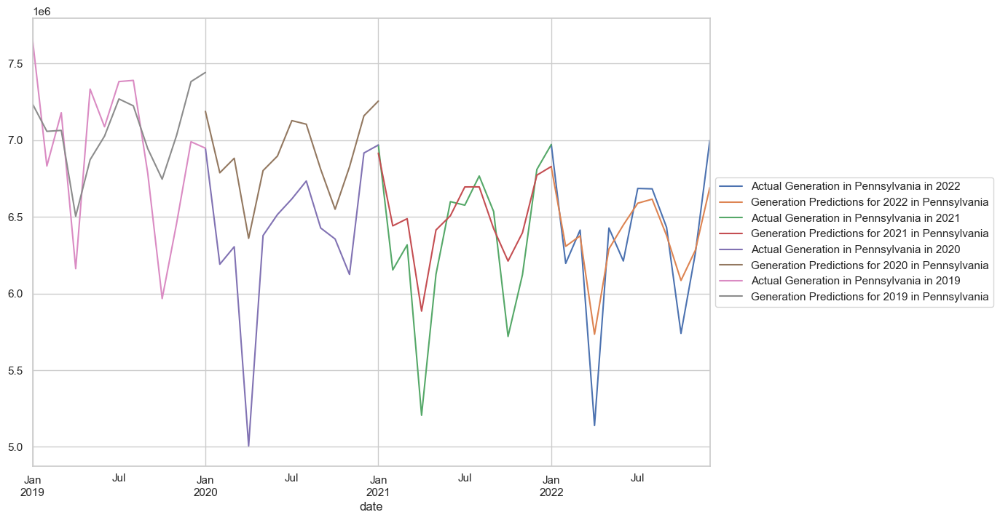



Mean Absolute Error (MAE) 2022: 179119.57894173652
Mean Absolute Error (MAE) 2021: 216818.91356689905
Mean Absolute Error (MAE) 2020: 481568.5589669062
Mean Absolute Error (MAE) 2019: 331469.87881102186
Promedio MAE: 302244.2325716409


Mean Squared Error (MSE) 2022: 57791779730.91381
Mean Squared Error (MSE) 2021: 79845356894.65372
Mean Squared Error (MSE) 2020: 316781542842.0116
Mean Squared Error (MSE) 2019: 152159779568.46124
Promedio MSE: 151644614759.0101


Root Mean Squared Error (RMSE) 2022: 240399.20908961786
Root Mean Squared Error (RMSE) 2021: 282569.2072655011
Root Mean Squared Error (RMSE) 2020: 562833.4947762185
Root Mean Squared Error (RMSE) 2019: 390076.6329434016
Promedio RMSE: 368969.6360186848


Mean Absolute Percentage Error (MAPE) 2022: 2.99479684712793
Mean Absolute Percentage Error (MAPE) 2021: 3.655481760869633
Mean Absolute Percentage Error (MAPE) 2020: 7.928000176893344
Mean Absolute Percentage Error (MAPE) 2019: 4.920372084216141
Promedio MAPE: 4.8746627172

In [ ]:
# PENNSYLVANIA NUCLEAR

# Separamos nuestros datos entre train y test, tomando 2022 como nuestro objetivo a predecir
df_pennsylvania_train_nuclear_2022 = df_pennsylvania_pred_nuclear[df_pennsylvania_pred_nuclear.index < '2022-01-01']
df_pennsylvania_test_nuclear_2022 = df_pennsylvania_pred_nuclear[df_pennsylvania_pred_nuclear.index >= '2022-01-01']

df_pennsylvania_train_nuclear_2021 = df_pennsylvania_pred_nuclear[df_pennsylvania_pred_nuclear.index < '2021-01-01']
df_pennsylvania_test_nuclear_2021 = df_pennsylvania_pred_nuclear[(df_pennsylvania_pred_nuclear.index >= '2021-01-01') & (df_pennsylvania_pred_nuclear.index < '2022-01-31')]

df_pennsylvania_train_nuclear_2020 = df_pennsylvania_pred_nuclear[df_pennsylvania_pred_nuclear.index < '2020-01-01']
df_pennsylvania_test_nuclear_2020 = df_pennsylvania_pred_nuclear[(df_pennsylvania_pred_nuclear.index >= '2020-01-01') & (df_pennsylvania_pred_nuclear.index < '2021-01-31')]

df_pennsylvania_train_nuclear_2019 = df_pennsylvania_pred_nuclear[df_pennsylvania_pred_nuclear.index < '2019-01-01']
df_pennsylvania_test_nuclear_2019 = df_pennsylvania_pred_nuclear[(df_pennsylvania_pred_nuclear.index >= '2019-01-01') & (df_pennsylvania_pred_nuclear.index < '2020-01-31')]

# Creamos el modelo
results_pennsylvania_nuclear_2022 = sarimax_train(df_pennsylvania_train_nuclear_2022)
results_pennsylvania_nuclear_2021 = sarimax_train(df_pennsylvania_train_nuclear_2021)
results_pennsylvania_nuclear_2020 = sarimax_train(df_pennsylvania_train_nuclear_2020)
results_pennsylvania_nuclear_2019 = sarimax_train(df_pennsylvania_train_nuclear_2019)

# Definimos la ventana de tiempo y creamos las predicciones
predictions_pennsylvania_nuclear_2022 = sarimax_predictions('2022-01-01', '2022-11-30', df_pennsylvania_test_nuclear_2022, results_pennsylvania_nuclear_2022)
predictions_pennsylvania_nuclear_2021 = sarimax_predictions('2021-01-01', '2021-12-31', df_pennsylvania_test_nuclear_2021, results_pennsylvania_nuclear_2021)
predictions_pennsylvania_nuclear_2020 = sarimax_predictions('2020-01-01', '2020-12-31', df_pennsylvania_test_nuclear_2020, results_pennsylvania_nuclear_2020)
predictions_pennsylvania_nuclear_2019 = sarimax_predictions('2019-01-01', '2019-12-31', df_pennsylvania_test_nuclear_2019, results_pennsylvania_nuclear_2019)

# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_pennsylvania_test_nuclear_2022['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2022')
predictions_pennsylvania_nuclear_2022.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2022 in Pennsylvania')

df_pennsylvania_test_nuclear_2021['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2021')
predictions_pennsylvania_nuclear_2021.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2021 in Pennsylvania')

df_pennsylvania_test_nuclear_2020['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2020')
predictions_pennsylvania_nuclear_2020.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2020 in Pennsylvania')

df_pennsylvania_test_nuclear_2019['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in Pennsylvania in 2019')
predictions_pennsylvania_nuclear_2019.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2019 in Pennsylvania')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

# Métricas de Evaluación
mae_pennsylvania_nuclear_2022, mse_pennsylvania_nuclear_2022, rmse_pennsylvania_nuclear_2022, mape_pennsylvania_nuclear_2022, r2_pennsylvania_nuclear_2022 = calculo_metricas(df_pennsylvania_test_nuclear_2022, predictions_pennsylvania_nuclear_2022)
mae_pennsylvania_nuclear_2021, mse_pennsylvania_nuclear_2021, rmse_pennsylvania_nuclear_2021, mape_pennsylvania_nuclear_2021, r2_pennsylvania_nuclear_2021 = calculo_metricas(df_pennsylvania_test_nuclear_2021, predictions_pennsylvania_nuclear_2021)
mae_pennsylvania_nuclear_2020, mse_pennsylvania_nuclear_2020, rmse_pennsylvania_nuclear_2020, mape_pennsylvania_nuclear_2020, r2_pennsylvania_nuclear_2020 = calculo_metricas(df_pennsylvania_test_nuclear_2020, predictions_pennsylvania_nuclear_2020)
mae_pennsylvania_nuclear_2019, mse_pennsylvania_nuclear_2019, rmse_pennsylvania_nuclear_2019, mape_pennsylvania_nuclear_2019, r2_pennsylvania_nuclear_2019 = calculo_metricas(df_pennsylvania_test_nuclear_2019, predictions_pennsylvania_nuclear_2019)

print('\n')
print("Mean Absolute Error (MAE) 2022:", mae_pennsylvania_nuclear_2022)
print("Mean Absolute Error (MAE) 2021:", mae_pennsylvania_nuclear_2021)
print("Mean Absolute Error (MAE) 2020:", mae_pennsylvania_nuclear_2020)
print("Mean Absolute Error (MAE) 2019:", mae_pennsylvania_nuclear_2019)
print('Promedio MAE:', statistics.mean([mae_pennsylvania_nuclear_2022, mae_pennsylvania_nuclear_2021, mae_pennsylvania_nuclear_2020, mae_pennsylvania_nuclear_2019]))
print('\n')
print("Mean Squared Error (MSE) 2022:", mse_pennsylvania_nuclear_2022)
print("Mean Squared Error (MSE) 2021:", mse_pennsylvania_nuclear_2021)
print("Mean Squared Error (MSE) 2020:", mse_pennsylvania_nuclear_2020)
print("Mean Squared Error (MSE) 2019:", mse_pennsylvania_nuclear_2019)
print('Promedio MSE:', statistics.mean([mse_pennsylvania_nuclear_2022, mse_pennsylvania_nuclear_2021, mse_pennsylvania_nuclear_2020, mse_pennsylvania_nuclear_2019]))
print('\n')
print("Root Mean Squared Error (RMSE) 2022:", rmse_pennsylvania_nuclear_2022)
print("Root Mean Squared Error (RMSE) 2021:", rmse_pennsylvania_nuclear_2021)
print("Root Mean Squared Error (RMSE) 2020:", rmse_pennsylvania_nuclear_2020)
print("Root Mean Squared Error (RMSE) 2019:", rmse_pennsylvania_nuclear_2019)
print('Promedio RMSE:', statistics.mean([rmse_pennsylvania_nuclear_2022, rmse_pennsylvania_nuclear_2021, rmse_pennsylvania_nuclear_2020, rmse_pennsylvania_nuclear_2019]))
print('\n')
print("Mean Absolute Percentage Error (MAPE) 2022:", mape_pennsylvania_nuclear_2022)
print("Mean Absolute Percentage Error (MAPE) 2021:", mape_pennsylvania_nuclear_2021)
print("Mean Absolute Percentage Error (MAPE) 2020:", mape_pennsylvania_nuclear_2020)
print("Mean Absolute Percentage Error (MAPE) 2019:", mape_pennsylvania_nuclear_2019)
print('Promedio MAPE:', statistics.mean([mape_pennsylvania_nuclear_2022, mape_pennsylvania_nuclear_2021, mape_pennsylvania_nuclear_2020, mape_pennsylvania_nuclear_2019]))
print('\n')
print("R2 Score 2022:", r2_pennsylvania_nuclear_2022)
print("R2 Score 2021:", r2_pennsylvania_nuclear_2021)
print("R2 Score 2020:", r2_pennsylvania_nuclear_2020)
print("R2 Score 2019:", r2_pennsylvania_nuclear_2019)
print('Promedio R2:', statistics.mean([r2_pennsylvania_nuclear_2022, r2_pennsylvania_nuclear_2021, r2_pennsylvania_nuclear_2020, r2_pennsylvania_nuclear_2019]))

## Comparando Predicciones

### Predicción General

In [ ]:
print('PREDICCIÓN GENERAL 2022')
print("Texas Mean Absolute Error (MAE):", mae_texas_general_2022)
print("California Mean Absolute Error (MAE):", mae_california_general_2022)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_general_2022)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_general_2022)
print('Promedio MAE:', statistics.mean([mae_texas_general_2022, mae_california_general_2022, mae_illinois_general_2022, mae_pennsylvania_general_2022]))
print('\n')
print('PREDICCIÓN GENERAL 2021')
print("Texas Mean Absolute Error (MAE):", mae_texas_general_2021)
print("California Mean Absolute Error (MAE):", mae_california_general_2021)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_general_2021)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_general_2021)
print('Promedio MAE:', statistics.mean([mae_texas_general_2021, mae_california_general_2021, mae_illinois_general_2021, mae_pennsylvania_general_2021]))
print('\n')
print('PREDICCIÓN GENERAL 2020')
print("Texas Mean Absolute Error (MAE):", mae_texas_general_2020)
print("California Mean Absolute Error (MAE):", mae_california_general_2020)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_general_2020)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_general_2020)
print('Promedio MAE:', statistics.mean([mae_texas_general_2020, mae_california_general_2020, mae_illinois_general_2020, mae_pennsylvania_general_2020]))
print('\n')
print('PREDICCIÓN GENERAL 2019')
print("Texas Mean Absolute Error (MAE):", mae_texas_general_2019)
print("California Mean Absolute Error (MAE):", mae_california_general_2019)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_general_2019)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_general_2019)
print('Promedio MAE:', statistics.mean([mae_texas_general_2019, mae_california_general_2019, mae_illinois_general_2019, mae_pennsylvania_general_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MSE 2022')
print("Texas Mean Squared Error (MSE):", mse_texas_general_2022)
print("California Mean Squared Error (MSE):", mse_california_general_2022)
print("Illinois Mean Squared Error (MSE):", mse_illinois_general_2022)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_general_2022)
print('Promedio MSE:', statistics.mean([mse_texas_general_2022, mse_california_general_2022, mse_illinois_general_2022, mse_pennsylvania_general_2022]))
print('\n')
print('PREDICCIÓN MSE 2021')
print("Texas Mean Squared Error (MSE):", mse_texas_general_2021)
print("California Mean Squared Error (MSE):", mse_california_general_2021)
print("Illinois Mean Squared Error (MSE):", mse_illinois_general_2021)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_general_2021)
print('Promedio MSE:', statistics.mean([mse_texas_general_2021, mse_california_general_2021, mse_illinois_general_2021, mse_pennsylvania_general_2021]))
print('\n')
print('PREDICCIÓN MSE 2020')
print("Texas Mean Squared Error (MSE):", mse_texas_general_2020)
print("California Mean Squared Error (MSE):", mse_california_general_2020)
print("Illinois Mean Squared Error (MSE):", mse_illinois_general_2020)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_general_2020)
print('Promedio MSE:', statistics.mean([mse_texas_general_2020, mse_california_general_2020, mse_illinois_general_2020, mse_pennsylvania_general_2020]))
print('\n')
print('PREDICCIÓN MSE 2019')
print("Texas Mean Squared Error (MSE):", mse_texas_general_2019)
print("California Mean Squared Error (MSE):", mse_california_general_2019)
print("Illinois Mean Squared Error (MSE):", mse_illinois_general_2019)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_general_2019)
print('Promedio MSE:', statistics.mean([mse_texas_general_2019, mse_california_general_2019, mse_illinois_general_2019, mse_pennsylvania_general_2019]))
print('\n')
print('\n')
print('PREDICCIÓN RMSE 2022')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_general_2022)
print("California Root Mean Squared Error (RMSE):", rmse_california_general_2022)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_general_2022)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_general_2022)
print('Promedio RMSE:', statistics.mean([rmse_texas_general_2022, rmse_california_general_2022, rmse_illinois_general_2022, rmse_pennsylvania_general_2022]))
print('\n')
print('PREDICCIÓN RMSE 2021')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_general_2021)
print("California Root Mean Squared Error (RMSE):", rmse_california_general_2021)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_general_2021)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_general_2021)
print('Promedio RMSE:', statistics.mean([rmse_texas_general_2021, rmse_california_general_2021, rmse_illinois_general_2021, rmse_pennsylvania_general_2021]))
print('\n')
print('PREDICCIÓN RMSE 2020')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_general_2020)
print("California Root Mean Squared Error (RMSE):", rmse_california_general_2020)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_general_2020)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_general_2020)
print('Promedio RMSE:', statistics.mean([rmse_texas_general_2020, rmse_california_general_2020, rmse_illinois_general_2020, rmse_pennsylvania_general_2020]))
print('\n')
print('PREDICCIÓN RMSE 2019')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_general_2019)
print("California Root Mean Squared Error (RMSE):", rmse_california_general_2019)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_general_2019)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_general_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_general_2019, rmse_california_general_2019, rmse_illinois_general_2019, rmse_pennsylvania_general_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MAPE 2022')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_general_2022)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_general_2022)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_general_2022)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_general_2022)
print('Promedio MAPE:', statistics.mean([mape_texas_general_2022, mape_california_general_2022, mape_illinois_general_2022, mape_pennsylvania_general_2022]))
print('\n')
print('PREDICCIÓN MAPE 2021')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_general_2021)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_general_2021)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_general_2021)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_general_2021)
print('Promedio MAPE:', statistics.mean([mape_texas_general_2021, mape_california_general_2021, mape_illinois_general_2021, mape_pennsylvania_general_2021]))
print('\n')
print('PREDICCIÓN MAPE 2020')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_general_2020)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_general_2020)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_general_2020)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_general_2020)
print('Promedio MAPE:', statistics.mean([mape_texas_general_2020, mape_california_general_2020, mape_illinois_general_2020, mape_pennsylvania_general_2020]))
print('\n')
print('PREDICCIÓN MAPE 2019')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_general_2019)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_general_2019)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_general_2019)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_general_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_general_2019, mape_california_general_2019, mape_illinois_general_2019, mape_pennsylvania_general_2019]))
print('\n')
print('\n')
print('PREDICCIÓN R2 SCORE 2022')
print("Texas R2 Score:", r2_texas_general_2022)
print("California R2 Score:", r2_california_general_2022)
print("Illinois R2 Score:", r2_illinois_general_2022)
print("Pennsylvania R2 Score:", r2_pennsylvania_general_2022)
print('Promedio R2 Score:', statistics.mean([r2_texas_general_2022, r2_california_general_2022, r2_illinois_general_2022, r2_pennsylvania_general_2022]))
print('\n')
print('PREDICCIÓN R2 SCORE 2021')
print("Texas R2 Score:", r2_texas_general_2021)
print("California R2 Score:", r2_california_general_2021)
print("Illinois R2 Score:", r2_illinois_general_2021)
print("Pennsylvania R2 Score:", r2_pennsylvania_general_2021)
print('Promedio R2 Score:', statistics.mean([r2_texas_general_2021, r2_california_general_2021, r2_illinois_general_2021, r2_pennsylvania_general_2021]))
print('\n')
print('PREDICCIÓN R2 SCORE 2020')
print("Texas R2 Score:", r2_texas_general_2020)
print("California R2 Score:", r2_california_general_2020)
print("Illinois R2 Score:", r2_illinois_general_2020)
print("Pennsylvania R2 Score:", r2_pennsylvania_general_2020)
print('Promedio R2 Score:', statistics.mean([r2_texas_general_2020, r2_california_general_2020, r2_illinois_general_2020, r2_pennsylvania_general_2020]))
print('\n')
print('PREDICCIÓN R2 SCORE 2019')
print("Texas R2 Score:", r2_texas_general_2019)
print("California R2 Score:", r2_california_general_2019)
print("Illinois R2 Score:", r2_illinois_general_2019)
print("Pennsylvania R2 Score:", r2_pennsylvania_general_2019)
print('Promedio R2 Score:', statistics.mean([r2_texas_general_2019, r2_california_general_2019, r2_illinois_general_2019, r2_pennsylvania_general_2019]))
print('\n')

PREDICCIÓN GENERAL 2022
Texas Mean Absolute Error (MAE): 6374727.234095705
California Mean Absolute Error (MAE): 692473.6408828385
Illinois Mean Absolute Error (MAE): 302279.95342636324
Pennsylvania Mean Absolute Error (MAE): 1470920.8781976681
Promedio MAE: 2210100.426650644


PREDICCIÓN GENERAL 2021
Texas Mean Absolute Error (MAE): 4104544.982490096
California Mean Absolute Error (MAE): 1592926.072244655
Illinois Mean Absolute Error (MAE): 555021.9786578052
Pennsylvania Mean Absolute Error (MAE): 820080.3699897296
Promedio MAE: 1768143.3508455714


PREDICCIÓN GENERAL 2020
Texas Mean Absolute Error (MAE): 2760727.9291600557
California Mean Absolute Error (MAE): 848775.0756636922
Illinois Mean Absolute Error (MAE): 907873.760610337
Pennsylvania Mean Absolute Error (MAE): 1174496.9349587574
Promedio MAE: 1422968.4250982106


PREDICCIÓN GENERAL 2019
Texas Mean Absolute Error (MAE): 2107921.3210644955
California Mean Absolute Error (MAE): 712664.9499289125
Illinois Mean Absolute Error (MA

### Predicción Coal

In [ ]:
print('PREDICCIÓN COAL 2022')
print("Texas Mean Absolute Error (MAE):", mae_texas_coal_2022)
#print("California Mean Absolute Error (MAE):", mae_california_coal_2022)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_coal_2022)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_coal_2022)
print('Promedio MAE:', statistics.mean([mae_texas_coal_2022, mae_illinois_coal_2022, mae_pennsylvania_coal_2022]))
print('\n')
print('PREDICCIÓN COAL 2021')
print("Texas Mean Absolute Error (MAE):", mae_texas_coal_2021)
#print("California Mean Absolute Error (MAE):", mae_california_coal_2021)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_coal_2021)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_coal_2021)
print('Promedio MAE:', statistics.mean([mae_texas_coal_2021, mae_illinois_coal_2021, mae_pennsylvania_coal_2021]))
print('\n')
print('PREDICCIÓN COAL 2020')
print("Texas Mean Absolute Error (MAE):", mae_texas_coal_2020)
#print("California Mean Absolute Error (MAE):", mae_california_coal_2020)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_coal_2020)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_coal_2020)
print('Promedio MAE:', statistics.mean([mae_texas_coal_2020, mae_illinois_coal_2020, mae_pennsylvania_coal_2020]))
print('\n')
print('PREDICCIÓN COAL 2019')
print("Texas Mean Absolute Error (MAE):", mae_texas_coal_2019)
#print("California Mean Absolute Error (MAE):", mae_california_coal_2019)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_coal_2019)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_coal_2019)
print('Promedio MAE:', statistics.mean([mae_texas_coal_2019, mae_illinois_coal_2019, mae_pennsylvania_coal_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MSE 2022')
print("Texas Mean Squared Error (MSE):", mse_texas_coal_2022)
#print("California Mean Squared Error (MSE):", mse_california_coal_2022)
print("Illinois Mean Squared Error (MSE):", mse_illinois_coal_2022)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_coal_2022)
print('Promedio MSE:', statistics.mean([mse_texas_coal_2022, mse_illinois_coal_2022, mse_pennsylvania_coal_2022]))
print('\n')
print('PREDICCIÓN MSE 2021')
print("Texas Mean Squared Error (MSE):", mse_texas_coal_2021)
#print("California Mean Squared Error (MSE):", mse_california_coal_2021)
print("Illinois Mean Squared Error (MSE):", mse_illinois_coal_2021)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_coal_2021)
print('Promedio MSE:', statistics.mean([mse_texas_coal_2021, mse_illinois_coal_2021, mse_pennsylvania_coal_2021]))
print('\n')
print('PREDICCIÓN MSE 2020')
print("Texas Mean Squared Error (MSE):", mse_texas_coal_2020)
#print("California Mean Squared Error (MSE):", mse_california_coal_2020)
print("Illinois Mean Squared Error (MSE):", mse_illinois_coal_2020)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_coal_2020)
print('Promedio MSE:', statistics.mean([mse_texas_coal_2020, mse_illinois_coal_2020, mse_pennsylvania_coal_2020]))
print('\n')
print('PREDICCIÓN MSE 2019')
print("Texas Mean Squared Error (MSE):", mse_texas_coal_2019)
#print("California Mean Squared Error (MSE):", mse_california_coal_2019)
print("Illinois Mean Squared Error (MSE):", mse_illinois_coal_2019)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_coal_2019)
print('Promedio MSE:', statistics.mean([mse_texas_coal_2019, mse_illinois_coal_2019, mse_pennsylvania_coal_2019]))
print('\n')
print('\n')
print('PREDICCIÓN RMSE 2022')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_coal_2022)
#print("California Root Mean Squared Error (RMSE):", rmse_california_coal_2022)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_coal_2022)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_coal_2022)
print('Promedio RMSE:', statistics.mean([rmse_texas_coal_2022, rmse_illinois_coal_2022, rmse_pennsylvania_coal_2022]))
print('\n')
print('PREDICCIÓN RMSE 2021')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_coal_2021)
#print("California Root Mean Squared Error (RMSE):", rmse_california_coal_2021)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_coal_2021)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_coal_2021)
print('Promedio RMSE:', statistics.mean([rmse_texas_coal_2021, rmse_illinois_coal_2021, rmse_pennsylvania_coal_2021]))
print('\n')
print('PREDICCIÓN RMSE 2020')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_coal_2020)
#print("California Root Mean Squared Error (RMSE):", rmse_california_coal_2020)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_coal_2020)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_coal_2020)
print('Promedio RMSE:', statistics.mean([rmse_texas_coal_2020, rmse_illinois_coal_2020, rmse_pennsylvania_coal_2020]))
print('\n')
print('PREDICCIÓN RMSE 2019')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_coal_2019)
#print("California Root Mean Squared Error (RMSE):", rmse_california_coal_2019)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_coal_2019)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_coal_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_coal_2019, rmse_illinois_coal_2019, rmse_pennsylvania_coal_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MAPE 2022')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_coal_2022)
#print("California Mean Absolute Percentage Error (MAPE):", mape_california_coal_2022)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_coal_2022)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_coal_2022)
print('Promedio MAPE:', statistics.mean([mape_texas_coal_2022, mape_illinois_coal_2022, mape_pennsylvania_coal_2022]))
print('\n')
print('PREDICCIÓN MAPE 2021')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_coal_2021)
#print("California Mean Absolute Percentage Error (MAPE):", mape_california_coal_2021)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_coal_2021)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_coal_2021)
print('Promedio MAPE:', statistics.mean([mape_texas_coal_2021, mape_illinois_coal_2021, mape_pennsylvania_coal_2021]))
print('\n')
print('PREDICCIÓN MAPE 2020')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_coal_2020)
#print("California Mean Absolute Percentage Error (MAPE):", mape_california_coal_2020)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_coal_2020)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_coal_2020)
print('Promedio MAPE:', statistics.mean([mape_texas_coal_2020, mape_illinois_coal_2020, mape_pennsylvania_coal_2020]))
print('\n')
print('PREDICCIÓN MAPE 2019')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_coal_2019)
#print("California Mean Absolute Percentage Error (MAPE):", mape_california_coal_2019)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_coal_2019)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_coal_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_coal_2019, mape_illinois_coal_2019, mape_pennsylvania_coal_2019]))
print('\n')
print('\n')
print('PREDICCIÓN R2 SCORE 2022')
print("Texas R2 Score:", r2_texas_coal_2022)
#print("California R2 Score:", r2_california_coal_2022)
print("Illinois R2 Score:", r2_illinois_coal_2022)
print("Pennsylvania R2 Score:", r2_pennsylvania_coal_2022)
print('Promedio R2 Score:', statistics.mean([r2_texas_coal_2022, r2_illinois_coal_2022, r2_pennsylvania_coal_2022]))
print('\n')
print('PREDICCIÓN R2 SCORE 2021')
print("Texas R2 Score:", r2_texas_coal_2021)
#print("California R2 Score:", r2_california_coal_2021)
print("Illinois R2 Score:", r2_illinois_coal_2021)
print("Pennsylvania R2 Score:", r2_pennsylvania_coal_2021)
print('Promedio R2 Score:', statistics.mean([r2_texas_coal_2021, r2_illinois_coal_2021, r2_pennsylvania_coal_2021]))
print('\n')
print('PREDICCIÓN R2 SCORE 2020')
print("Texas R2 Score:", r2_texas_coal_2020)
#print("California R2 Score:", r2_california_coal_2020)
print("Illinois R2 Score:", r2_illinois_coal_2020)
print("Pennsylvania R2 Score:", r2_pennsylvania_coal_2020)
print('Promedio R2 Score:', statistics.mean([r2_texas_coal_2020, r2_illinois_coal_2020, r2_pennsylvania_coal_2020]))
print('\n')
print('PREDICCIÓN R2 SCORE 2019')
print("Texas R2 Score:", r2_texas_coal_2019)
#print("California R2 Score:", r2_california_coal_2019)
print("Illinois R2 Score:", r2_illinois_coal_2019)
print("Pennsylvania R2 Score:", r2_pennsylvania_coal_2019)
print('Promedio R2 Score:', statistics.mean([r2_texas_coal_2019, r2_illinois_coal_2019, r2_pennsylvania_coal_2019]))
print('\n')

PREDICCIÓN COAL 2022
Texas Mean Absolute Error (MAE): 2327783.9938494447
Illinois Mean Absolute Error (MAE): 421989.5842274586
Pennsylvania Mean Absolute Error (MAE): 655572.905168347
Promedio MAE: 1135115.4944150834


PREDICCIÓN COAL 2021
Texas Mean Absolute Error (MAE): 1370720.9695185274
Illinois Mean Absolute Error (MAE): 837741.7394754133
Pennsylvania Mean Absolute Error (MAE): 828316.1456950424
Promedio MAE: 1012259.618229661


PREDICCIÓN COAL 2020
Texas Mean Absolute Error (MAE): 1276671.4380870552
Illinois Mean Absolute Error (MAE): 674865.1355045793
Pennsylvania Mean Absolute Error (MAE): 776449.665209988
Promedio MAE: 909328.7462672075


PREDICCIÓN COAL 2019
Texas Mean Absolute Error (MAE): 3182657.5137403435
Illinois Mean Absolute Error (MAE): 781855.425588177
Pennsylvania Mean Absolute Error (MAE): 678012.7440114607
Promedio MAE: 1547508.561113327




PREDICCIÓN MSE 2022
Texas Mean Squared Error (MSE): 8033993128833.195
Illinois Mean Squared Error (MSE): 251087331892.314
Pe

### Predicción Natural Gas

In [ ]:
print('PREDICCIÓN NATURAL GAS 2022')
print("Texas Mean Absolute Error (MAE):", mae_texas_gas_2022)
print("California Mean Absolute Error (MAE):", mae_california_gas_2022)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_gas_2022)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_gas_2022)
print('Promedio MAE:', statistics.mean([mae_texas_gas_2022, mae_california_gas_2022, mae_illinois_gas_2022, mae_pennsylvania_gas_2022]))
print('\n')
print('PREDICCIÓN NATURAL GAS 2021')
print("Texas Mean Absolute Error (MAE):", mae_texas_gas_2021)
print("California Mean Absolute Error (MAE):", mae_california_gas_2021)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_gas_2021)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_gas_2021)
print('Promedio MAE:', statistics.mean([mae_texas_gas_2021, mae_california_gas_2021, mae_illinois_gas_2021, mae_pennsylvania_gas_2021]))
print('\n')
print('PREDICCIÓN NATURAL GAS 2020')
print("Texas Mean Absolute Error (MAE):", mae_texas_gas_2020)
print("California Mean Absolute Error (MAE):", mae_california_gas_2020)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_gas_2020)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_gas_2020)
print('Promedio MAE:', statistics.mean([mae_texas_gas_2020, mae_california_gas_2020, mae_illinois_gas_2020, mae_pennsylvania_gas_2020]))
print('\n')
print('PREDICCIÓN NATURAL GAS 2019')
print("Texas Mean Absolute Error (MAE):", mae_texas_gas_2019)
print("California Mean Absolute Error (MAE):", mae_california_gas_2019)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_gas_2019)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_gas_2019)
print('Promedio MAE:', statistics.mean([mae_texas_gas_2019, mae_california_gas_2019, mae_illinois_gas_2019, mae_pennsylvania_gas_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MSE 2022')
print("Texas Mean Squared Error (MSE):", mse_texas_gas_2022)
print("California Mean Squared Error (MSE):", mse_california_gas_2022)
print("Illinois Mean Squared Error (MSE):", mse_illinois_gas_2022)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_gas_2022)
print('Promedio MSE:', statistics.mean([mse_texas_gas_2022, mse_california_gas_2022, mse_illinois_gas_2022, mse_pennsylvania_gas_2022]))
print('\n')
print('PREDICCIÓN MSE 2021')
print("Texas Mean Squared Error (MSE):", mse_texas_gas_2021)
print("California Mean Squared Error (MSE):", mse_california_gas_2021)
print("Illinois Mean Squared Error (MSE):", mse_illinois_gas_2021)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_gas_2021)
print('Promedio MSE:', statistics.mean([mse_texas_gas_2021, mse_california_gas_2021, mse_illinois_gas_2021, mse_pennsylvania_gas_2021]))
print('\n')
print('PREDICCIÓN MSE 2020')
print("Texas Mean Squared Error (MSE):", mse_texas_gas_2020)
print("California Mean Squared Error (MSE):", mse_california_gas_2020)
print("Illinois Mean Squared Error (MSE):", mse_illinois_gas_2020)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_gas_2020)
print('Promedio MSE:', statistics.mean([mse_texas_gas_2020, mse_california_gas_2020, mse_illinois_gas_2020, mse_pennsylvania_gas_2020]))
print('\n')
print('PREDICCIÓN MSE 2019')
print("Texas Mean Squared Error (MSE):", mse_texas_gas_2019)
print("California Mean Squared Error (MSE):", mse_california_gas_2019)
print("Illinois Mean Squared Error (MSE):", mse_illinois_gas_2019)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_gas_2019)
print('Promedio MSE:', statistics.mean([mse_texas_gas_2019, mse_california_gas_2019, mse_illinois_gas_2019, mse_pennsylvania_gas_2019]))
print('\n')
print('\n')
print('PREDICCIÓN RMSE 2022')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_gas_2022)
print("California Root Mean Squared Error (RMSE):", rmse_california_gas_2022)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_gas_2022)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_gas_2022)
print('Promedio RMSE:', statistics.mean([rmse_texas_gas_2022, rmse_california_gas_2022, rmse_illinois_gas_2022, rmse_pennsylvania_gas_2022]))
print('\n')
print('PREDICCIÓN RMSE 2021')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_gas_2021)
print("California Root Mean Squared Error (RMSE):", rmse_california_gas_2021)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_gas_2021)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_gas_2021)
print('Promedio RMSE:', statistics.mean([rmse_texas_gas_2021, rmse_california_gas_2021, rmse_illinois_gas_2021, rmse_pennsylvania_gas_2021]))
print('\n')
print('PREDICCIÓN RMSE 2020')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_gas_2020)
print("California Root Mean Squared Error (RMSE):", rmse_california_gas_2020)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_gas_2020)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_gas_2020)
print('Promedio RMSE:', statistics.mean([rmse_texas_gas_2020, rmse_california_gas_2020, rmse_illinois_gas_2020, rmse_pennsylvania_gas_2020]))
print('\n')
print('PREDICCIÓN RMSE 2019')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_gas_2019)
print("California Root Mean Squared Error (RMSE):", rmse_california_gas_2019)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_gas_2019)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_gas_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_gas_2019, rmse_california_gas_2019, rmse_illinois_gas_2019, rmse_pennsylvania_gas_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MAPE 2022')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_gas_2022)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_gas_2022)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_gas_2022)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_gas_2022)
print('Promedio MAPE:', statistics.mean([mape_texas_gas_2022, mape_california_gas_2022, mape_illinois_gas_2022, mape_pennsylvania_gas_2022]))
print('\n')
print('PREDICCIÓN MAPE 2021')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_gas_2021)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_gas_2021)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_gas_2021)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_gas_2021)
print('Promedio MAPE:', statistics.mean([mape_texas_gas_2021, mape_california_gas_2021, mape_illinois_gas_2021, mape_pennsylvania_gas_2021]))
print('\n')
print('PREDICCIÓN MAPE 2020')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_gas_2020)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_gas_2020)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_gas_2020)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_gas_2020)
print('Promedio MAPE:', statistics.mean([mape_texas_gas_2020, mape_california_gas_2020, mape_illinois_gas_2020, mape_pennsylvania_gas_2020]))
print('\n')
print('PREDICCIÓN MAPE 2019')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_gas_2019)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_gas_2019)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_gas_2019)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_gas_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_gas_2019, mape_california_gas_2019, mape_illinois_gas_2019, mape_pennsylvania_gas_2019]))
print('\n')
print('\n')
print('PREDICCIÓN R2 SCORE 2022')
print("Texas R2 Score:", r2_texas_gas_2022)
print("California R2 Score:", r2_california_gas_2022)
print("Illinois R2 Score:", r2_illinois_gas_2022)
print("Pennsylvania R2 Score:", r2_pennsylvania_gas_2022)
print('Promedio R2 Score:', statistics.mean([r2_texas_gas_2022, r2_california_gas_2022, r2_illinois_gas_2022, r2_pennsylvania_gas_2022]))
print('\n')
print('PREDICCIÓN R2 SCORE 2021')
print("Texas R2 Score:", r2_texas_gas_2021)
print("California R2 Score:", r2_california_gas_2021)
print("Illinois R2 Score:", r2_illinois_gas_2021)
print("Pennsylvania R2 Score:", r2_pennsylvania_gas_2021)
print('Promedio R2 Score:', statistics.mean([r2_texas_gas_2021, r2_california_gas_2021, r2_illinois_gas_2021, r2_pennsylvania_gas_2021]))
print('\n')
print('PREDICCIÓN R2 SCORE 2020')
print("Texas R2 Score:", r2_texas_gas_2020)
print("California R2 Score:", r2_california_gas_2020)
print("Illinois R2 Score:", r2_illinois_gas_2020)
print("Pennsylvania R2 Score:", r2_pennsylvania_gas_2020)
print('Promedio R2 Score:', statistics.mean([r2_texas_gas_2020, r2_california_gas_2020, r2_illinois_gas_2020, r2_pennsylvania_gas_2020]))
print('\n')
print('PREDICCIÓN R2 SCORE 2019')
print("Texas R2 Score:", r2_texas_gas_2019)
print("California R2 Score:", r2_california_gas_2019)
print("Illinois R2 Score:", r2_illinois_gas_2019)
print("Pennsylvania R2 Score:", r2_pennsylvania_gas_2019)
print('Promedio R2 Score:', statistics.mean([r2_texas_gas_2019, r2_california_gas_2019, r2_illinois_gas_2019, r2_pennsylvania_gas_2019]))
print('\n')

PREDICCIÓN NATURAL GAS 2022
Texas Mean Absolute Error (MAE): 4911033.414755415
California Mean Absolute Error (MAE): 883050.7996715548
Illinois Mean Absolute Error (MAE): 379182.8533659721
Pennsylvania Mean Absolute Error (MAE): 1134146.9560361737
Promedio MAE: 1826853.505957279


PREDICCIÓN NATURAL GAS 2021
Texas Mean Absolute Error (MAE): 3029285.029301723
California Mean Absolute Error (MAE): 731837.6661935751
Illinois Mean Absolute Error (MAE): 422187.2860193455
Pennsylvania Mean Absolute Error (MAE): 1060596.704977612
Promedio MAE: 1310976.671623064


PREDICCIÓN NATURAL GAS 2020
Texas Mean Absolute Error (MAE): 1329118.1869040357
California Mean Absolute Error (MAE): 843657.825769174
Illinois Mean Absolute Error (MAE): 387148.5930958136
Pennsylvania Mean Absolute Error (MAE): 1200905.4627421035
Promedio MAE: 940207.5171277818


PREDICCIÓN NATURAL GAS 2019
Texas Mean Absolute Error (MAE): 1884013.2421731765
California Mean Absolute Error (MAE): 732542.9187048032
Illinois Mean Absol

### Predicción Renewables

In [ ]:
print('PREDICCIÓN RENEWABLES 2022')
print("Texas Mean Absolute Error (MAE):", mae_texas_renewables_2022)
print("California Mean Absolute Error (MAE):", mae_california_renewables_2022)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_renewables_2022)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_renewables_2022)
print('Promedio MAE:', statistics.mean([mae_texas_renewables_2022, mae_california_renewables_2022, mae_illinois_renewables_2022, mae_pennsylvania_renewables_2022]))
print('\n')
print('PREDICCIÓN RENEWABLES 2021')
print("Texas Mean Absolute Error (MAE):", mae_texas_renewables_2021)
print("California Mean Absolute Error (MAE):", mae_california_renewables_2021)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_renewables_2021)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_renewables_2021)
print('Promedio MAE:', statistics.mean([mae_texas_renewables_2021, mae_california_renewables_2021, mae_illinois_renewables_2021, mae_pennsylvania_renewables_2021]))
print('\n')
print('PREDICCIÓN RENEWABLES 2020')
print("Texas Mean Absolute Error (MAE):", mae_texas_renewables_2020)
print("California Mean Absolute Error (MAE):", mae_california_renewables_2020)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_renewables_2020)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_renewables_2020)
print('Promedio MAE:', statistics.mean([mae_texas_renewables_2020, mae_california_renewables_2020, mae_illinois_renewables_2020, mae_pennsylvania_renewables_2020]))
print('\n')
print('PREDICCIÓN RENEWABLES 2019')
print("Texas Mean Absolute Error (MAE):", mae_texas_renewables_2019)
print("California Mean Absolute Error (MAE):", mae_california_renewables_2019)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_renewables_2019)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_renewables_2019)
print('Promedio MAE:', statistics.mean([mae_texas_renewables_2019, mae_california_renewables_2019, mae_illinois_renewables_2019, mae_pennsylvania_renewables_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MSE 2022')
print("Texas Mean Squared Error (MSE):", mse_texas_renewables_2022)
print("California Mean Squared Error (MSE):", mse_california_renewables_2022)
print("Illinois Mean Squared Error (MSE):", mse_illinois_renewables_2022)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_renewables_2022)
print('Promedio MSE:', statistics.mean([mse_texas_renewables_2022, mse_california_renewables_2022, mse_illinois_renewables_2022, mse_pennsylvania_renewables_2022]))
print('\n')
print('PREDICCIÓN MSE 2021')
print("Texas Mean Squared Error (MSE):", mse_texas_renewables_2021)
print("California Mean Squared Error (MSE):", mse_california_renewables_2021)
print("Illinois Mean Squared Error (MSE):", mse_illinois_renewables_2021)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_renewables_2021)
print('Promedio MSE:', statistics.mean([mse_texas_renewables_2021, mse_california_renewables_2021, mse_illinois_renewables_2021, mse_pennsylvania_renewables_2021]))
print('\n')
print('PREDICCIÓN MSE 2020')
print("Texas Mean Squared Error (MSE):", mse_texas_renewables_2020)
print("California Mean Squared Error (MSE):", mse_california_renewables_2020)
print("Illinois Mean Squared Error (MSE):", mse_illinois_renewables_2020)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_renewables_2020)
print('Promedio MSE:', statistics.mean([mse_texas_renewables_2020, mse_california_renewables_2020, mse_illinois_renewables_2020, mse_pennsylvania_renewables_2020]))
print('\n')
print('PREDICCIÓN MSE 2019')
print("Texas Mean Squared Error (MSE):", mse_texas_renewables_2019)
print("California Mean Squared Error (MSE):", mse_california_renewables_2019)
print("Illinois Mean Squared Error (MSE):", mse_illinois_renewables_2019)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_renewables_2019)
print('Promedio MSE:', statistics.mean([mse_texas_renewables_2019, mse_california_renewables_2019, mse_illinois_renewables_2019, mse_pennsylvania_renewables_2019]))
print('\n')
print('\n')
print('PREDICCIÓN RMSE 2022')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_renewables_2022)
print("California Root Mean Squared Error (RMSE):", rmse_california_renewables_2022)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_renewables_2022)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_renewables_2022)
print('Promedio RMSE:', statistics.mean([rmse_texas_renewables_2022, rmse_california_renewables_2022, rmse_illinois_renewables_2022, rmse_pennsylvania_renewables_2022]))
print('\n')
print('PREDICCIÓN RMSE 2021')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_renewables_2021)
print("California Root Mean Squared Error (RMSE):", rmse_california_renewables_2021)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_renewables_2021)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_renewables_2021)
print('Promedio RMSE:', statistics.mean([rmse_texas_renewables_2021, rmse_california_renewables_2021, rmse_illinois_renewables_2021, rmse_pennsylvania_renewables_2021]))
print('\n')
print('PREDICCIÓN RMSE 2020')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_renewables_2020)
print("California Root Mean Squared Error (RMSE):", rmse_california_renewables_2020)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_renewables_2020)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_renewables_2020)
print('Promedio RMSE:', statistics.mean([rmse_texas_renewables_2020, rmse_california_renewables_2020, rmse_illinois_renewables_2020, rmse_pennsylvania_renewables_2020]))
print('\n')
print('PREDICCIÓN RMSE 2019')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_renewables_2019)
print("California Root Mean Squared Error (RMSE):", rmse_california_renewables_2019)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_renewables_2019)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_renewables_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_renewables_2019, rmse_california_renewables_2019, rmse_illinois_renewables_2019, rmse_pennsylvania_renewables_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MAPE 2022')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_renewables_2022)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_renewables_2022)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_renewables_2022)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_renewables_2022)
print('Promedio MAPE:', statistics.mean([mape_texas_renewables_2022, mape_california_renewables_2022, mape_illinois_renewables_2022, mape_pennsylvania_renewables_2022]))
print('\n')
print('PREDICCIÓN MAPE 2021')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_renewables_2021)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_renewables_2021)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_renewables_2021)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_renewables_2021)
print('Promedio MAPE:', statistics.mean([mape_texas_renewables_2021, mape_california_renewables_2021, mape_illinois_renewables_2021, mape_pennsylvania_renewables_2021]))
print('\n')
print('PREDICCIÓN MAPE 2020')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_renewables_2020)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_renewables_2020)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_renewables_2020)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_renewables_2020)
print('Promedio MAPE:', statistics.mean([mape_texas_renewables_2020, mape_california_renewables_2020, mape_illinois_renewables_2020, mape_pennsylvania_renewables_2020]))
print('\n')
print('PREDICCIÓN MAPE 2019')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_renewables_2019)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_renewables_2019)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_renewables_2019)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_renewables_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_renewables_2019, mape_california_renewables_2019, mape_illinois_renewables_2019, mape_pennsylvania_renewables_2019]))
print('\n')
print('\n')
print('PREDICCIÓN R2 SCORE 2022')
print("Texas R2 Score:", r2_texas_renewables_2022)
print("California R2 Score:", r2_california_renewables_2022)
print("Illinois R2 Score:", r2_illinois_renewables_2022)
print("Pennsylvania R2 Score:", r2_pennsylvania_renewables_2022)
print('Promedio R2 Score:', statistics.mean([r2_texas_renewables_2022, r2_california_renewables_2022, r2_illinois_renewables_2022, r2_pennsylvania_renewables_2022]))
print('\n')
print('PREDICCIÓN R2 SCORE 2021')
print("Texas R2 Score:", r2_texas_renewables_2021)
print("California R2 Score:", r2_california_renewables_2021)
print("Illinois R2 Score:", r2_illinois_renewables_2021)
print("Pennsylvania R2 Score:", r2_pennsylvania_renewables_2021)
print('Promedio R2 Score:', statistics.mean([r2_texas_renewables_2021, r2_california_renewables_2021, r2_illinois_renewables_2021, r2_pennsylvania_renewables_2021]))
print('\n')
print('PREDICCIÓN R2 SCORE 2020')
print("Texas R2 Score:", r2_texas_renewables_2020)
print("California R2 Score:", r2_california_renewables_2020)
print("Illinois R2 Score:", r2_illinois_renewables_2020)
print("Pennsylvania R2 Score:", r2_pennsylvania_renewables_2020)
print('Promedio R2 Score:', statistics.mean([r2_texas_renewables_2020, r2_california_renewables_2020, r2_illinois_renewables_2020, r2_pennsylvania_renewables_2020]))
print('\n')
print('PREDICCIÓN R2 SCORE 2019')
print("Texas R2 Score:", r2_texas_renewables_2019)
print("California R2 Score:", r2_california_renewables_2019)
print("Illinois R2 Score:", r2_illinois_renewables_2019)
print("Pennsylvania R2 Score:", r2_pennsylvania_renewables_2019)
print('Promedio R2 Score:', statistics.mean([r2_texas_renewables_2019, r2_california_renewables_2019, r2_illinois_renewables_2019, r2_pennsylvania_renewables_2019]))
print('\n')

PREDICCIÓN RENEWABLES 2022
Texas Mean Absolute Error (MAE): 1383989.5701942744
California Mean Absolute Error (MAE): 390635.4039400777
Illinois Mean Absolute Error (MAE): 308938.8050157183
Pennsylvania Mean Absolute Error (MAE): 32430.62451885987
Promedio MAE: 528998.6009172326


PREDICCIÓN RENEWABLES 2021
Texas Mean Absolute Error (MAE): 1200484.0240699642
California Mean Absolute Error (MAE): 576680.1140562388
Illinois Mean Absolute Error (MAE): 289321.874323588
Pennsylvania Mean Absolute Error (MAE): 58686.450053279055
Promedio MAE: 531293.1156257675


PREDICCIÓN RENEWABLES 2020
Texas Mean Absolute Error (MAE): 608588.8167604629
California Mean Absolute Error (MAE): 414887.0111574056
Illinois Mean Absolute Error (MAE): 178613.89081304803
Pennsylvania Mean Absolute Error (MAE): 64150.6617637917
Promedio MAE: 316560.09512367705


PREDICCIÓN RENEWABLES 2019
Texas Mean Absolute Error (MAE): 654727.9174312296
California Mean Absolute Error (MAE): 389661.0638727211
Illinois Mean Absolute 

### Predicción Nuclear

In [ ]:
print('PREDICCIÓN NUCLEAR 2022')
print("Texas Mean Absolute Error (MAE):", mae_texas_nuclear_2022)
print("California Mean Absolute Error (MAE):", mae_california_nuclear_2022)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_nuclear_2022)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_nuclear_2022)
print('Promedio MAE:', statistics.mean([mae_texas_nuclear_2022, mae_california_nuclear_2022, mae_illinois_nuclear_2022, mae_pennsylvania_nuclear_2022]))
print('\n')
print('PREDICCIÓN NUCLEAR 2021')
print("Texas Mean Absolute Error (MAE):", mae_texas_nuclear_2021)
print("California Mean Absolute Error (MAE):", mae_california_nuclear_2021)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_nuclear_2021)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_nuclear_2021)
print('Promedio MAE:', statistics.mean([mae_texas_nuclear_2021, mae_california_nuclear_2021, mae_illinois_nuclear_2021, mae_pennsylvania_nuclear_2021]))
print('\n')
print('PREDICCIÓN NUCLEAR 2020')
print("Texas Mean Absolute Error (MAE):", mae_texas_nuclear_2020)
print("California Mean Absolute Error (MAE):", mae_california_nuclear_2020)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_nuclear_2020)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_nuclear_2020)
print('Promedio MAE:', statistics.mean([mae_texas_nuclear_2020, mae_california_nuclear_2020, mae_illinois_nuclear_2020, mae_pennsylvania_nuclear_2020]))
print('\n')
print('PREDICCIÓN NUCLEAR 2019')
print("Texas Mean Absolute Error (MAE):", mae_texas_nuclear_2019)
print("California Mean Absolute Error (MAE):", mae_california_nuclear_2019)
print("Illinois Mean Absolute Error (MAE):", mae_illinois_nuclear_2019)
print("Pennsylvania Mean Absolute Error (MAE):", mae_pennsylvania_nuclear_2019)
print('Promedio MAE:', statistics.mean([mae_texas_nuclear_2019, mae_california_nuclear_2019, mae_illinois_nuclear_2019, mae_pennsylvania_nuclear_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MSE 2022')
print("Texas Mean Squared Error (MSE):", mse_texas_nuclear_2022)
print("California Mean Squared Error (MSE):", mse_california_nuclear_2022)
print("Illinois Mean Squared Error (MSE):", mse_illinois_nuclear_2022)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_nuclear_2022)
print('Promedio MSE:', statistics.mean([mse_texas_nuclear_2022, mse_california_nuclear_2022, mse_illinois_nuclear_2022, mse_pennsylvania_nuclear_2022]))
print('\n')
print('PREDICCIÓN MSE 2021')
print("Texas Mean Squared Error (MSE):", mse_texas_nuclear_2021)
print("California Mean Squared Error (MSE):", mse_california_nuclear_2021)
print("Illinois Mean Squared Error (MSE):", mse_illinois_nuclear_2021)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_nuclear_2021)
print('Promedio MSE:', statistics.mean([mse_texas_nuclear_2021, mse_california_nuclear_2021, mse_illinois_nuclear_2021, mse_pennsylvania_nuclear_2021]))
print('\n')
print('PREDICCIÓN MSE 2020')
print("Texas Mean Squared Error (MSE):", mse_texas_nuclear_2020)
print("California Mean Squared Error (MSE):", mse_california_nuclear_2020)
print("Illinois Mean Squared Error (MSE):", mse_illinois_nuclear_2020)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_nuclear_2020)
print('Promedio MSE:', statistics.mean([mse_texas_nuclear_2020, mse_california_nuclear_2020, mse_illinois_nuclear_2020, mse_pennsylvania_nuclear_2020]))
print('\n')
print('PREDICCIÓN MSE 2019')
print("Texas Mean Squared Error (MSE):", mse_texas_nuclear_2019)
print("California Mean Squared Error (MSE):", mse_california_nuclear_2019)
print("Illinois Mean Squared Error (MSE):", mse_illinois_nuclear_2019)
print("Pennsylvania Mean Squared Error (MSE):", mse_pennsylvania_nuclear_2019)
print('Promedio MSE:', statistics.mean([mse_texas_nuclear_2019, mse_california_nuclear_2019, mse_illinois_nuclear_2019, mse_pennsylvania_nuclear_2019]))
print('\n')
print('\n')
print('PREDICCIÓN RMSE 2022')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_nuclear_2022)
print("California Root Mean Squared Error (RMSE):", rmse_california_nuclear_2022)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_nuclear_2022)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_nuclear_2022)
print('Promedio RMSE:', statistics.mean([rmse_texas_nuclear_2022, rmse_california_nuclear_2022, rmse_illinois_nuclear_2022, rmse_pennsylvania_nuclear_2022]))
print('\n')
print('PREDICCIÓN RMSE 2021')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_nuclear_2021)
print("California Root Mean Squared Error (RMSE):", rmse_california_nuclear_2021)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_nuclear_2021)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_nuclear_2021)
print('Promedio RMSE:', statistics.mean([rmse_texas_nuclear_2021, rmse_california_nuclear_2021, rmse_illinois_nuclear_2021, rmse_pennsylvania_nuclear_2021]))
print('\n')
print('PREDICCIÓN RMSE 2020')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_nuclear_2020)
print("California Root Mean Squared Error (RMSE):", rmse_california_nuclear_2020)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_nuclear_2020)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_nuclear_2020)
print('Promedio RMSE:', statistics.mean([rmse_texas_nuclear_2020, rmse_california_nuclear_2020, rmse_illinois_nuclear_2020, rmse_pennsylvania_nuclear_2020]))
print('\n')
print('PREDICCIÓN RMSE 2019')
print("Texas Root Mean Squared Error (RMSE):", rmse_texas_nuclear_2019)
print("California Root Mean Squared Error (RMSE):", rmse_california_nuclear_2019)
print("Illinois Root Mean Squared Error (RMSE):", rmse_illinois_nuclear_2019)
print("Pennsylvania Root Mean Squared Error (RMSE):", rmse_pennsylvania_nuclear_2019)
print('Promedio RMSE:', statistics.mean([rmse_texas_nuclear_2019, rmse_california_nuclear_2019, rmse_illinois_nuclear_2019, rmse_pennsylvania_nuclear_2019]))
print('\n')
print('\n')
print('PREDICCIÓN MAPE 2022')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_nuclear_2022)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_nuclear_2022)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_nuclear_2022)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_nuclear_2022)
print('Promedio MAPE:', statistics.mean([mape_texas_nuclear_2022, mape_california_nuclear_2022, mape_illinois_nuclear_2022, mape_pennsylvania_nuclear_2022]))
print('\n')
print('PREDICCIÓN MAPE 2021')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_nuclear_2021)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_nuclear_2021)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_nuclear_2021)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_nuclear_2021)
print('Promedio MAPE:', statistics.mean([mape_texas_nuclear_2021, mape_california_nuclear_2021, mape_illinois_nuclear_2021, mape_pennsylvania_nuclear_2021]))
print('\n')
print('PREDICCIÓN MAPE 2020')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_nuclear_2020)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_nuclear_2020)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_nuclear_2020)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_nuclear_2020)
print('Promedio MAPE:', statistics.mean([mape_texas_nuclear_2020, mape_california_nuclear_2020, mape_illinois_nuclear_2020, mape_pennsylvania_nuclear_2020]))
print('\n')
print('PREDICCIÓN MAPE 2019')
print("Texas Mean Absolute Percentage Error (MAPE):", mape_texas_nuclear_2019)
print("California Mean Absolute Percentage Error (MAPE):", mape_california_nuclear_2019)
print("Illinois Mean Absolute Percentage Error (MAPE):", mape_illinois_nuclear_2019)
print("Pennsylvania Mean Absolute Percentage Error (MAPE):", mape_pennsylvania_nuclear_2019)
print('Promedio MAPE:', statistics.mean([mape_texas_nuclear_2019, mape_california_nuclear_2019, mape_illinois_nuclear_2019, mape_pennsylvania_nuclear_2019]))
print('\n')
print('\n')
print('PREDICCIÓN R2 SCORE 2022')
print("Texas R2 Score:", r2_texas_nuclear_2022)
print("California R2 Score:", r2_california_nuclear_2022)
print("Illinois R2 Score:", r2_illinois_nuclear_2022)
print("Pennsylvania R2 Score:", r2_pennsylvania_nuclear_2022)
print('Promedio R2 Score:', statistics.mean([r2_texas_nuclear_2022, r2_california_nuclear_2022, r2_illinois_nuclear_2022, r2_pennsylvania_nuclear_2022]))
print('\n')
print('PREDICCIÓN R2 SCORE 2021')
print("Texas R2 Score:", r2_texas_nuclear_2021)
print("California R2 Score:", r2_california_nuclear_2021)
print("Illinois R2 Score:", r2_illinois_nuclear_2021)
print("Pennsylvania R2 Score:", r2_pennsylvania_nuclear_2021)
print('Promedio R2 Score:', statistics.mean([r2_texas_nuclear_2021, r2_california_nuclear_2021, r2_illinois_nuclear_2021, r2_pennsylvania_nuclear_2021]))
print('\n')
print('PREDICCIÓN R2 SCORE 2020')
print("Texas R2 Score:", r2_texas_nuclear_2020)
print("California R2 Score:", r2_california_nuclear_2020)
print("Illinois R2 Score:", r2_illinois_nuclear_2020)
print("Pennsylvania R2 Score:", r2_pennsylvania_nuclear_2020)
print('Promedio R2 Score:', statistics.mean([r2_texas_nuclear_2020, r2_california_nuclear_2020, r2_illinois_nuclear_2020, r2_pennsylvania_nuclear_2020]))
print('\n')
print('PREDICCIÓN R2 SCORE 2019')
print("Texas R2 Score:", r2_texas_nuclear_2019)
print("California R2 Score:", r2_california_nuclear_2019)
print("Illinois R2 Score:", r2_illinois_nuclear_2019)
print("Pennsylvania R2 Score:", r2_pennsylvania_nuclear_2019)
print('Promedio R2 Score:', statistics.mean([r2_texas_nuclear_2019, r2_california_nuclear_2019, r2_illinois_nuclear_2019, r2_pennsylvania_nuclear_2019]))
print('\n')

PREDICCIÓN NUCLEAR 2022
Texas Mean Absolute Error (MAE): 1141033.4522762445
California Mean Absolute Error (MAE): 181168.48790229976
Illinois Mean Absolute Error (MAE): 142472.05863890308
Pennsylvania Mean Absolute Error (MAE): 179119.57894173652
Promedio MAE: 410948.394439796


PREDICCIÓN NUCLEAR 2021
Texas Mean Absolute Error (MAE): 466654.51385237207
California Mean Absolute Error (MAE): 574793.1700413714
Illinois Mean Absolute Error (MAE): 529200.1867912242
Pennsylvania Mean Absolute Error (MAE): 216818.91356689905
Promedio MAE: 446866.69606296666


PREDICCIÓN NUCLEAR 2020
Texas Mean Absolute Error (MAE): 155307.04693325976
California Mean Absolute Error (MAE): 405196.002975777
Illinois Mean Absolute Error (MAE): 114433.42740005956
Pennsylvania Mean Absolute Error (MAE): 481568.5589669062
Promedio MAE: 289126.25906900066


PREDICCIÓN NUCLEAR 2019
Texas Mean Absolute Error (MAE): 356308.7050393709
California Mean Absolute Error (MAE): 285690.8141380745
Illinois Mean Absolute Error (

### Promedios MAPE

In [ ]:
# MAPE GENERAL
mape_general_2022 = statistics.mean([mape_texas_general_2022, mape_california_general_2022, mape_illinois_general_2022, mape_pennsylvania_general_2022])
mape_general_2021 = statistics.mean([mape_texas_general_2021, mape_california_general_2021, mape_illinois_general_2021, mape_pennsylvania_general_2021])
mape_general_2020 = statistics.mean([mape_texas_general_2020, mape_california_general_2020, mape_illinois_general_2020, mape_pennsylvania_general_2020])
mape_general_2019 = statistics.mean([mape_texas_general_2019, mape_california_general_2019, mape_illinois_general_2019, mape_pennsylvania_general_2019])
# MAPE COAL
mape_coal_2022 = statistics.mean([mape_texas_coal_2022, mape_illinois_coal_2022, mape_pennsylvania_coal_2022])
mape_coal_2021 = statistics.mean([mape_texas_coal_2021, mape_illinois_coal_2021, mape_pennsylvania_coal_2021])
mape_coal_2020 = statistics.mean([mape_texas_coal_2020, mape_illinois_coal_2020, mape_pennsylvania_coal_2020])
mape_coal_2019 = statistics.mean([mape_texas_coal_2019, mape_illinois_coal_2019, mape_pennsylvania_coal_2019])
# MAPE NATURAL GAS
mape_gas_2022 = statistics.mean([mape_texas_gas_2022, mape_california_gas_2022, mape_illinois_gas_2022, mape_pennsylvania_gas_2022])
mape_gas_2021 = statistics.mean([mape_texas_gas_2021, mape_california_gas_2021, mape_illinois_gas_2021, mape_pennsylvania_gas_2021])
mape_gas_2020 = statistics.mean([mape_texas_gas_2020, mape_california_gas_2020, mape_illinois_gas_2020, mape_pennsylvania_gas_2020])
mape_gas_2019 = statistics.mean([mape_texas_gas_2019, mape_california_gas_2019, mape_illinois_gas_2019, mape_pennsylvania_gas_2019])
# MAPE RENEWABLES
mape_renewables_2022 = statistics.mean([mape_texas_renewables_2022, mape_california_renewables_2022, mape_illinois_renewables_2022, mape_pennsylvania_renewables_2022])
mape_renewables_2021 = statistics.mean([mape_texas_renewables_2021, mape_california_renewables_2021, mape_illinois_renewables_2021, mape_pennsylvania_renewables_2021])
mape_renewables_2020 = statistics.mean([mape_texas_renewables_2020, mape_california_renewables_2020, mape_illinois_renewables_2020, mape_pennsylvania_renewables_2020])
mape_renewables_2019 = statistics.mean([mape_texas_renewables_2019, mape_california_renewables_2019, mape_illinois_renewables_2019, mape_pennsylvania_renewables_2019])
# MAPE NUCLEAR
mape_nuclear_2022 = statistics.mean([mape_texas_nuclear_2022, mape_california_nuclear_2022, mape_illinois_nuclear_2022, mape_pennsylvania_nuclear_2022])
mape_nuclear_2021 = statistics.mean([mape_texas_nuclear_2021, mape_california_nuclear_2021, mape_illinois_nuclear_2021, mape_pennsylvania_nuclear_2021])
mape_nuclear_2020 = statistics.mean([mape_texas_nuclear_2020, mape_california_nuclear_2020, mape_illinois_nuclear_2020, mape_pennsylvania_nuclear_2020])
mape_nuclear_2019 = statistics.mean([mape_texas_nuclear_2019, mape_california_nuclear_2019, mape_illinois_nuclear_2019, mape_pennsylvania_nuclear_2019])
print('PROMEDIOS MAPE 2022')
print('Promedio MAPE General 2022:', mape_general_2022)
print('Promedio MAPE Coal 2022:', mape_coal_2022)
print('Promedio MAPE Natural Gas 2022:', mape_gas_2022)
print('Promedio MAPE Renewables 2022:', mape_renewables_2022)
print('Promedio MAPE Nuclear 2022:', mape_nuclear_2022)
print('\n')
print('PROMEDIOS MAPE 2021')
print('Promedio MAPE General 2021:', mape_general_2021)
print('Promedio MAPE Coal 2021:', mape_coal_2021)
print('Promedio MAPE Natural Gas 2021:', mape_gas_2021)
print('Promedio MAPE Renewables 2021:', mape_renewables_2021)
print('Promedio MAPE Nuclear 2021:', mape_nuclear_2021)
print('\n')
print('PROMEDIOS MAPE 2020')
print('Promedio MAPE General 2020:', mape_general_2020)
print('Promedio MAPE Coal 2020:', mape_coal_2020)
print('Promedio MAPE Natural Gas 2020:', mape_gas_2020)
print('Promedio MAPE Renewables 2020:', mape_renewables_2020)
print('Promedio MAPE Nuclear 2020:', mape_nuclear_2020)
print('\n')
print('PROMEDIOS MAPE 2019')
print('Promedio MAPE General 2019:', mape_general_2019)
print('Promedio MAPE Coal 2019:', mape_coal_2019)
print('Promedio MAPE Natural Gas 2019:', mape_gas_2019)
print('Promedio MAPE Renewables 2019:', mape_renewables_2019)
print('Promedio MAPE Nuclear 2019:', mape_nuclear_2019)

PROMEDIOS MAPE 2022
Promedio MAPE General 2022: 7.224141567137996
Promedio MAPE Coal 2022: 29.653074082592905
Promedio MAPE Natural Gas 2022: 21.744531096601495
Promedio MAPE Renewables 2022: 9.356214477658167
Promedio MAPE Nuclear 2022: 13.273957268818894


PROMEDIOS MAPE 2021
Promedio MAPE General 2021: 7.045289601643012
Promedio MAPE Coal 2021: 24.136627435349283
Promedio MAPE Natural Gas 2021: 16.33972123534737
Promedio MAPE Renewables 2021: 12.9959085201329
Promedio MAPE Nuclear 2021: 15.840585546886643


PROMEDIOS MAPE 2020
Promedio MAPE General 2020: 6.303120178989596
Promedio MAPE Coal 2020: 31.55731955816041
Promedio MAPE Natural Gas 2020: 12.59002136077559
Promedio MAPE Renewables 2020: 10.9746859153676
Promedio MAPE Nuclear 2020: 11.806992253520376


PROMEDIOS MAPE 2019
Promedio MAPE General 2019: 4.953389036727954
Promedio MAPE Coal 2019: 30.491597207416422
Promedio MAPE Natural Gas 2019: 15.7015798286523
Promedio MAPE Renewables 2019: 11.010162247812024
Promedio MAPE Nucle

In [ ]:
# Promedios Totales
mape_average_general = statistics.mean([mape_general_2022, mape_general_2021, mape_general_2020, mape_general_2019])
mape_average_coal = statistics.mean([mape_coal_2022, mape_coal_2021, mape_coal_2020, mape_coal_2019])
mape_average_gas = statistics.mean([mape_gas_2022, mape_gas_2021, mape_gas_2020, mape_gas_2019])
mape_average_renewables = statistics.mean([mape_renewables_2022, mape_renewables_2021, mape_renewables_2020, mape_renewables_2019])
mape_average_nuclear = statistics.mean([mape_nuclear_2022, mape_nuclear_2021, mape_nuclear_2020, mape_nuclear_2019])

print('PROMEDIO MAPE GENERAL:', mape_average_general)
print('PROMEDIO MAPE COAL:', mape_average_coal)
print('PROMEDIO MAPE NATURAL GAS:', mape_average_gas)
print('PROMEDIO MAPE RENEWABLES:', mape_average_renewables)
print('PROMEDIO MAPE NUCLEAR:', mape_average_nuclear)

PROMEDIO MAPE GENERAL: 6.381485096124639
PROMEDIO MAPE COAL: 28.959654570879756
PROMEDIO MAPE NATURAL GAS: 16.59396338034419
PROMEDIO MAPE RENEWABLES: 11.084242790242673
PROMEDIO MAPE NUCLEAR: 13.026159329983775


Dado que las predicciones del carbón presentan un error promedio bastante elevando, para poder predecir el consumo de esta fuente de energía para el año 2023, utilizaremos un ajuste manual de los datos de un 10%. Si bien no es ideal, es una forma efectiva de reducir el error del modelo y mejorar las predicciones. 

# Predicciones 2023

### Creación de datasets

In [ ]:
# Comenzamos creando el dataset agrupado a nivel de mes para tener la serie temporal
df_grouped_2023 = df_exp_2023.groupby(['date']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum', 'price':'mean'}).reset_index()
df_grouped_2023.set_index('date', inplace=True)
df_grouped_2023.index.freq = 'MS'

# Creamos uno a nivel de fuente de energía
df_source_2023 = df_exp_2023.groupby(['date', 'source']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum', 'price':'mean'}).reset_index()

# Ahora creamos un dataset para cada fuente de energía
df_coal_2023 = df_source_2023[df_source_2023['source'] == 'all coal products'].copy()
df_coal_2023.set_index('date', inplace=True)
df_coal_2023.index.freq = 'MS'

df_gas_2023 = df_source_2023[df_source_2023['source'] == 'natural gas'].copy()
df_gas_2023.set_index('date', inplace=True)
df_gas_2023.index.freq = 'MS'

df_renewables_2023 = df_source_2023[df_source_2023['source'] == 'all renewables'].copy()
df_renewables_2023.set_index('date', inplace=True)
df_renewables_2023.index.freq = 'MS'

df_nuclear_2023 = df_source_2023[df_source_2023['source'] == 'nuclear'].copy()
df_nuclear_2023.set_index('date', inplace=True)
df_nuclear_2023.index.freq = 'MS'

### Predicciones - Generales

In [ ]:
# Creamos las funciones para predecir el consumo de energía
def sarimax_train(df_train):
    model = SARIMAX(df_train['generation_mwh'], order=(2, 1, 2), seasonal_order=(1, 0, 1, 12), exog=df_train['price'])
    results = model.fit()
    return results

def sarimax_predictions(start, end, df_test, results):
    predictions = results.predict(start=start, end=end, seasonal=True, exog=df_test['price']).rename('predictions')
    return predictions

def calculo_metricas(df_test, predictions):
    mae = mean_absolute_error(df_test['generation_mwh'], predictions)
    mse = mean_squared_error(df_test['generation_mwh'], predictions)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((df_test['generation_mwh'] - predictions) / df_test['generation_mwh'])) * 100
    r2 = r2_score(df_test['generation_mwh'], predictions)
    return(mae, mse, rmse, mape, r2)

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_2023 = df_grouped_2023[df_grouped_2023.index < '2023-01-01']
df_test_2023 = df_grouped_2023[df_grouped_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_2023 = sarimax_train(df_train_2023)
predictions_2023 = sarimax_predictions(start, end, df_test_2023, results_2023)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67946D+01    |proj g|=  8.14343D-02


 This problem is unconstrained.



At iterate    5    f=  1.67417D+01    |proj g|=  1.53121D-02

At iterate   10    f=  1.67409D+01    |proj g|=  2.06877D-03

At iterate   15    f=  1.67399D+01    |proj g|=  3.30525D-02

At iterate   20    f=  1.67369D+01    |proj g|=  2.63893D-02

At iterate   25    f=  1.67367D+01    |proj g|=  4.06491D-03

At iterate   30    f=  1.67364D+01    |proj g|=  4.61263D-02



At iterate   35    f=  1.67363D+01    |proj g|=  6.05161D-03

At iterate   40    f=  1.67363D+01    |proj g|=  1.74580D-03

At iterate   45    f=  1.67363D+01    |proj g|=  1.77302D-02

At iterate   50    f=  1.67362D+01    |proj g|=  6.34029D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     50     60      1     0     0   6.340D-03   1.674D+01
  F =   16.736167459399994     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


/Users/inaki/Desktop/GitHub/eae-tfm/.venv/lib/python3.9/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


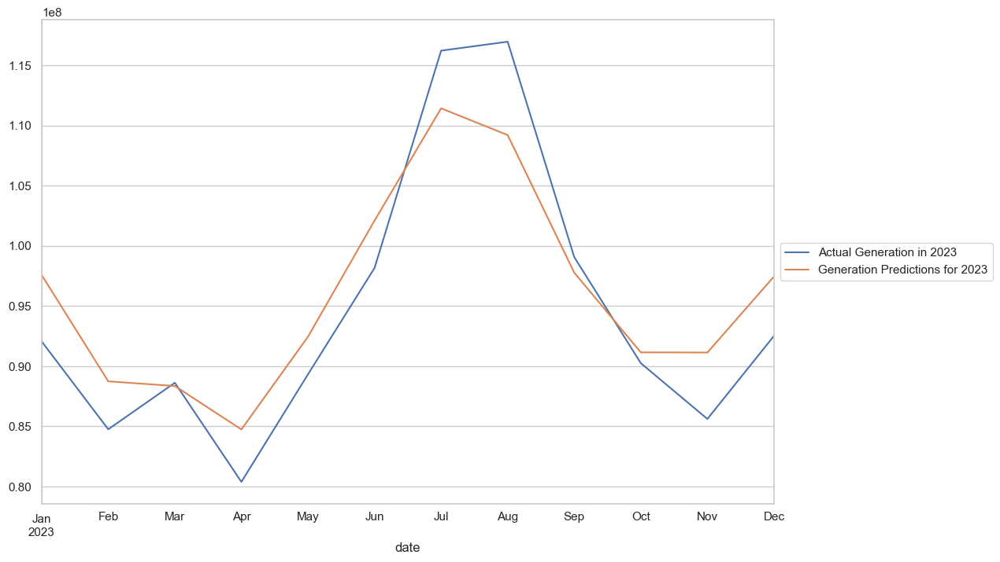

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in 2023')
predictions_2023.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_2023, mse_2023, rmse_2023, mape_2023, r2_2023 = calculo_metricas(df_test_2023, predictions_2023)
print("Mean Absolute Error (MAE):", mae_2023)
print("Mean Squared Error (MSE):", mse_2023)
print("Root Mean Squared Error (RMSE):", rmse_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_2023)
print("R2 Score:", r2_2023) 

Mean Absolute Error (MAE): 3866730.7783245244
Mean Squared Error (MSE): 19267031246377.26
Root Mean Squared Error (RMSE): 4389422.655244908
Mean Absolute Percentage Error (MAPE): 4.0649896287048675
R2 Score: 0.8430754944542198


### Evaluación de Predicciones - Generales

In [ ]:
# Calculamos métricas
# Calculate Mean Absolute Error (MAE)
mae_2023 = mean_absolute_error(df_test_2023['generation_mwh'], predictions_2023)

# Calculate Mean Squared Error (MSE)
mse_2023 = mean_squared_error(df_test_2023['generation_mwh'], predictions_2023)

# Calculate Root Mean Squared Error (RMSE)
rmse_2023 = np.sqrt(mse_2023)

# Calculate Mean Absolute Percentage Error (MAPE)
mape_2023 = np.mean(np.abs((df_test_2023['generation_mwh'] - predictions_2023) / df_test_2023['generation_mwh'])) * 100

# R2
r2_2023 = r2_score(df_test_2023['generation_mwh'], predictions_2023)

print("Mean Absolute Error (MAE):", mae_2023)
print("Mean Squared Error (MSE):", mse_2023)
print("Root Mean Squared Error (RMSE):", rmse_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_2023)
print("R2 Score:", r2_2023) 

Mean Absolute Error (MAE): 3866730.7783245244
Mean Squared Error (MSE): 19267031246377.26
Root Mean Squared Error (RMSE): 4389422.655244908
Mean Absolute Percentage Error (MAPE): 4.0649896287048675
R2 Score: 0.8430754944542198


### Predicciones - Coal

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_coal_2023 = df_coal_2023[df_coal_2023.index < '2023-01-01']
df_test_coal_2023 = df_coal_2023[df_coal_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_coal_2023 = sarimax_train(df_train_coal_2023)
predictions_coal_2023 = sarimax_predictions(start, end, df_test_coal_2023, results_coal_2023)
predictions_coal_2023 = predictions_coal_2023*0.9

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.59443D+01    |proj g|=  2.36572D-01

At iterate    5    f=  1.58743D+01    |proj g|=  3.56190D-02


 This problem is unconstrained.



At iterate   10    f=  1.58691D+01    |proj g|=  9.80385D-03

At iterate   15    f=  1.58642D+01    |proj g|=  5.06145D-02

At iterate   20    f=  1.58557D+01    |proj g|=  3.17928D-01

At iterate   25    f=  1.58518D+01    |proj g|=  3.18485D-02

At iterate   30    f=  1.58517D+01    |proj g|=  1.01007D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     33     54      1     0     0   8.061D-03   1.585D+01
  F =   15.851694221016464     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


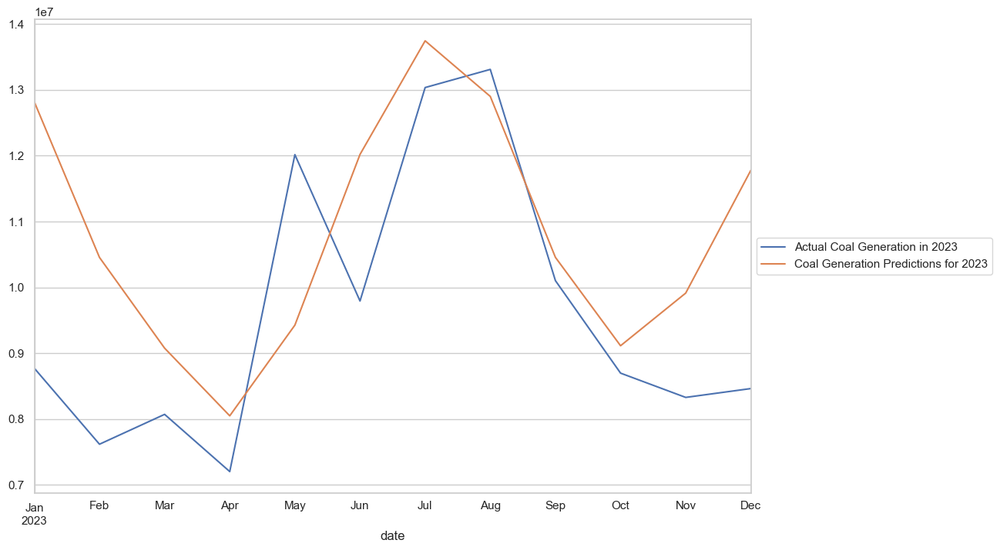

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_coal_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Coal Generation in 2023')
predictions_coal_2023.plot(figsize=(12,8), legend=True, label = 'Coal Generation Predictions for 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_coal_2023, mse_coal_2023, rmse_coal_2023, mape_coal_2023, r2_coal_2023 = calculo_metricas(df_test_coal_2023, predictions_coal_2023)
print("Mean Absolute Error (MAE):", mae_coal_2023)
print("Mean Squared Error (MSE):", mse_coal_2023)
print("Root Mean Squared Error (RMSE):", rmse_coal_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_coal_2023)
print("R2 Score:", r2_coal_2023) 

Mean Absolute Error (MAE): 1694930.7809326071
Mean Squared Error (MSE): 4355851811392.6206
Root Mean Squared Error (RMSE): 2087067.7543847542
Mean Absolute Percentage Error (MAPE): 18.906201694606626
R2 Score: -0.08625440205422708


### Predicciones - Natural Gas

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_gas_2023 = df_gas_2023[df_gas_2023.index < '2023-01-01']
df_test_gas_2023 = df_gas_2023[df_gas_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_gas_2023 = sarimax_train(df_train_gas_2023)
predictions_gas_2023 = sarimax_predictions(start, end, df_test_gas_2023, results_gas_2023)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.63454D+01    |proj g|=  1.28312D-01

At iterate    5    f=  1.63008D+01    |proj g|=  2.85458D-03



At iterate   10    f=  1.62980D+01    |proj g|=  4.68757D-03

At iterate   15    f=  1.62914D+01    |proj g|=  1.50134D-02


 This problem is unconstrained.



At iterate   20    f=  1.62910D+01    |proj g|=  2.51928D-03

At iterate   25    f=  1.62908D+01    |proj g|=  1.14798D-02

At iterate   30    f=  1.62898D+01    |proj g|=  3.79278D-02

At iterate   35    f=  1.62896D+01    |proj g|=  1.20404D-03

At iterate   40    f=  1.62895D+01    |proj g|=  5.20020D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     41     47      1     0     0   7.150D-06   1.629D+01
  F =   16.289538749150669     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


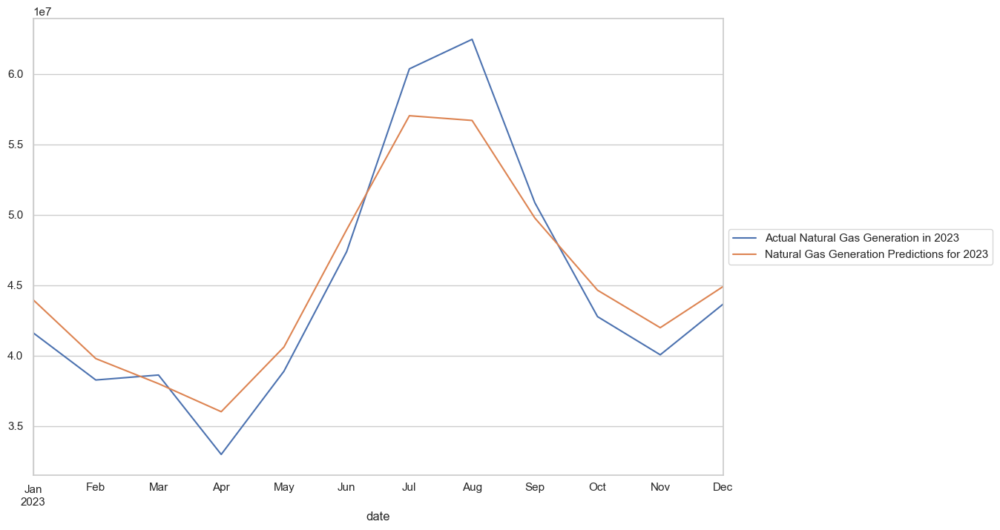

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_gas_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Natural Gas Generation in 2023')
predictions_gas_2023.plot(figsize=(12,8), legend=True, label = 'Natural Gas Generation Predictions for 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_gas_2023, mse_gas_2023, rmse_gas_2023, mape_gas_2023, r2_gas_2023 = calculo_metricas(df_test_gas_2023, predictions_gas_2023)
print("Mean Absolute Error (MAE):", mae_gas_2023)
print("Mean Squared Error (MSE):", mse_gas_2023)
print("Root Mean Squared Error (RMSE):", rmse_gas_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_gas_2023)
print("R2 Score:", r2_gas_2023) 

Mean Absolute Error (MAE): 2168403.6987462207
Mean Squared Error (MSE): 6418782113431.957
Root Mean Squared Error (RMSE): 2533531.5497210524
Mean Absolute Percentage Error (MAPE): 4.7533752506808
R2 Score: 0.9135697223828942


### Predicciones - Renewables

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_renewables_2023 = df_renewables_2023[df_renewables_2023.index < '2023-01-01']
df_test_renewables_2023 = df_renewables_2023[df_renewables_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_renewables_2023 = sarimax_train(df_train_renewables_2023)
predictions_renewables_2023 = sarimax_predictions(start, end, df_test_renewables_2023, results_renewables_2023)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.52244D+01    |proj g|=  1.04095D-01

At iterate    5    f=  1.51461D+01    |proj g|=  3.21386D-02

At iterate   10    f=  1.51247D+01    |proj g|=  6.24071D-03


 This problem is unconstrained.



At iterate   15    f=  1.51202D+01    |proj g|=  5.24333D-03

At iterate   20    f=  1.51196D+01    |proj g|=  1.61629D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     24     27      1     0     0   1.147D-06   1.512D+01
  F =   15.119556194654770     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


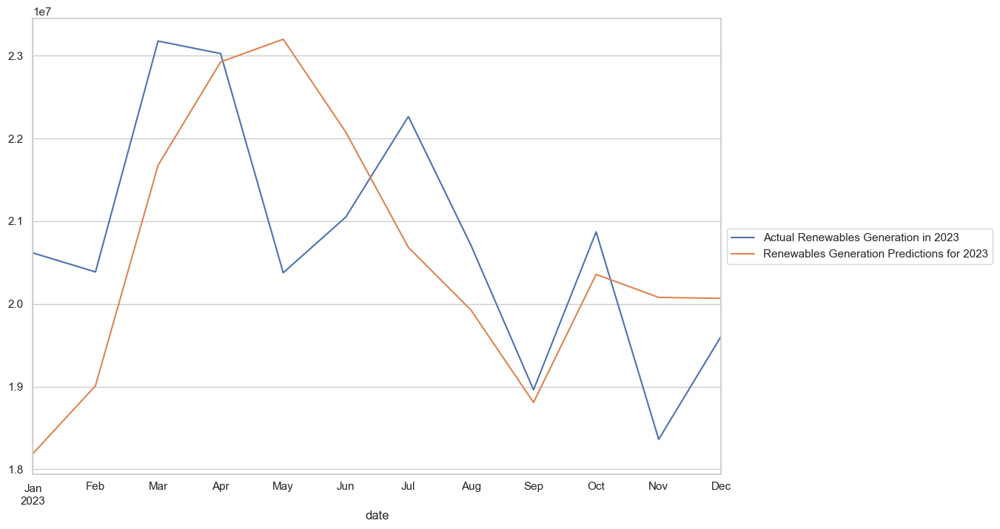

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_renewables_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Renewables Generation in 2023')
predictions_renewables_2023.plot(figsize=(12,8), legend=True, label = 'Renewables Generation Predictions for 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_renewables_2023, mse_renewables_2023, rmse_renewables_2023, mape_renewables_2023, r2_renewables_2023 = calculo_metricas(df_test_renewables_2023, predictions_renewables_2023)
print("Mean Absolute Error (MAE):", mae_renewables_2023)
print("Mean Squared Error (MSE):", mse_renewables_2023)
print("Root Mean Squared Error (RMSE):", rmse_renewables_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_renewables_2023)
print("R2 Score:", r2_renewables_2023) 

Mean Absolute Error (MAE): 1203746.8551520035
Mean Squared Error (MSE): 2131505549341.2979
Root Mean Squared Error (RMSE): 1459967.6535256861
Mean Absolute Percentage Error (MAPE): 5.827490858501522
R2 Score: -0.07002375874156241


### Predicciones - Nuclear

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_nuclear_2023 = df_nuclear_2023[df_nuclear_2023.index < '2023-01-01']
df_test_nuclear_2023 = df_nuclear_2023[df_nuclear_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_nuclear_2023 = sarimax_train(df_train_nuclear_2023)
predictions_nuclear_2023 = sarimax_predictions(start, end, df_test_nuclear_2023, results_nuclear_2023)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.56287D+01    |proj g|=  5.41948D-01



At iterate    5    f=  1.53188D+01    |proj g|=  7.08166D-03


 This problem is unconstrained.



At iterate   10    f=  1.53131D+01    |proj g|=  8.81901D-03

At iterate   15    f=  1.53127D+01    |proj g|=  5.23699D-03

At iterate   20    f=  1.53125D+01    |proj g|=  8.92534D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     22     24      1     0     0   2.979D-05   1.531D+01
  F =   15.312484417779437     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


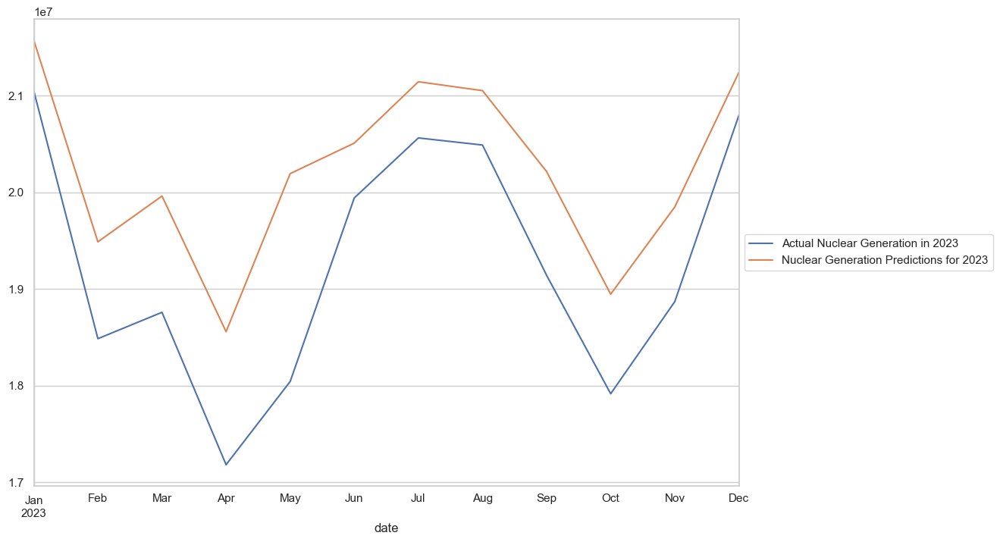

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_nuclear_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Nuclear Generation in 2023')
predictions_nuclear_2023.plot(figsize=(12,8), legend=True, label = 'Nuclear Generation Predictions for 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_nuclear_2023, mse_nuclear_2023, rmse_nuclear_2023, mape_nuclear_2023, r2_nuclear_2023 = calculo_metricas(df_test_nuclear_2023, predictions_nuclear_2023)
print("Mean Absolute Error (MAE):", mae_nuclear_2023)
print("Mean Squared Error (MSE):", mse_nuclear_2023)
print("Root Mean Squared Error (RMSE):", rmse_nuclear_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_nuclear_2023)
print("R2 Score:", r2_nuclear_2023) 

Mean Absolute Error (MAE): 957357.8487730207
Mean Squared Error (MSE): 1131395154185.0308
Root Mean Squared Error (RMSE): 1063670.60417454
Mean Absolute Percentage Error (MAPE): 5.110215370628346
R2 Score: 0.23900403968364292


# Predicciones 2023 - California

## Creación de datasets

In [ ]:
# Comenzamos creando el dataset agrupado a nivel de mes para tener la serie temporal
df_exp_california = df_exp_2023[df_exp_2023['state'] == 'California'].copy()
df_california_2023 = df_exp_california.groupby(['date']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum', 'price':'mean'}).reset_index()
df_california_2023.set_index('date', inplace=True)
df_california_2023.index.freq = 'MS'

# Creamos uno a nivel de fuente de energía
df_source_cali_2023 = df_exp_california.groupby(['date', 'source']).agg({'generation_mwh':'sum', 'consumption_mwh':'sum', 'price':'mean'}).reset_index()

# Ahora creamos un dataset para cada fuente de energía
df_gas_cali_2023 = df_source_cali_2023[df_source_cali_2023['source'] == 'natural gas'].copy()
df_gas_cali_2023.set_index('date', inplace=True)
df_gas_cali_2023.index.freq = 'MS'

df_renewables_cali_2023 = df_source_cali_2023[df_source_cali_2023['source'] == 'all renewables'].copy()
df_renewables_cali_2023.set_index('date', inplace=True)
df_renewables_cali_2023.index.freq = 'MS'

df_nuclear_cali_2023 = df_source_cali_2023[df_source_cali_2023['source'] == 'nuclear'].copy()
df_nuclear_cali_2023.set_index('date', inplace=True)
df_nuclear_cali_2023.index.freq = 'MS'

### Predicciones - Generales

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_cali_2023 = df_california_2023[df_california_2023.index < '2023-01-01']
df_test_cali_2023 = df_california_2023[df_california_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_cali_2023 = sarimax_train(df_train_cali_2023)
predictions_cali_2023 = sarimax_predictions(start, end, df_test_cali_2023, results_cali_2023)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.55342D+01    |proj g|=  2.31091D-01


 This problem is unconstrained.



At iterate    5    f=  1.54755D+01    |proj g|=  6.45046D-03

At iterate   10    f=  1.54744D+01    |proj g|=  6.12402D-04

At iterate   15    f=  1.54744D+01    |proj g|=  1.49195D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     17     19      1     0     0   2.490D-05   1.547D+01
  F =   15.474353346738312     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


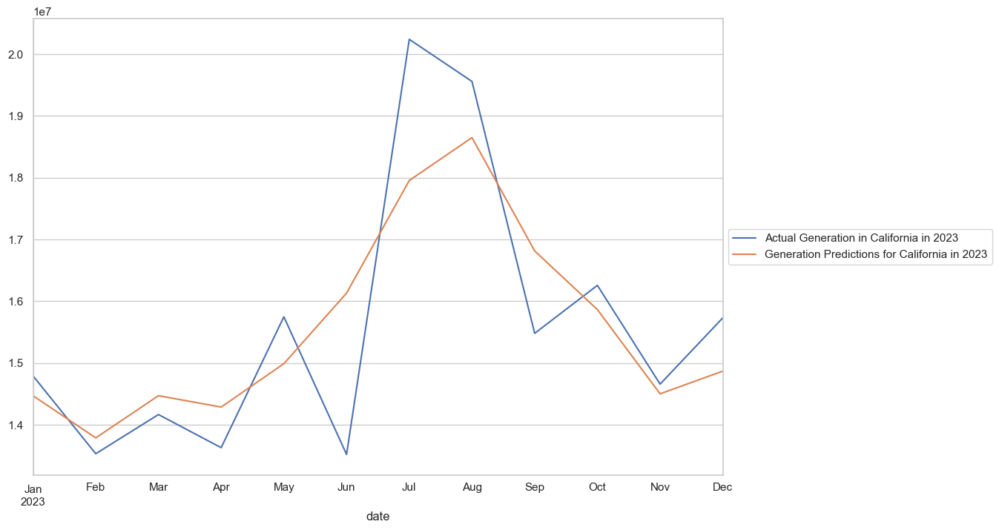

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_cali_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Generation in California in 2023')
predictions_cali_2023.plot(figsize=(12,8), legend=True, label = 'Generation Predictions for California in 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_2023, mse_2023, rmse_2023, mape_2023, r2_2023 = calculo_metricas(df_test_cali_2023, predictions_cali_2023)
print("Mean Absolute Error (MAE):", mae_2023)
print("Mean Squared Error (MSE):", mse_2023)
print("Root Mean Squared Error (RMSE):", rmse_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_2023)
print("R2 Score:", r2_2023) 

Mean Absolute Error (MAE): 904484.4742757174
Mean Squared Error (MSE): 1404284971875.7017
Root Mean Squared Error (RMSE): 1185025.3043187312
Mean Absolute Percentage Error (MAPE): 5.727354896699395
R2 Score: 0.6867686860150597


### Predicciones - Natural Gas

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_gas_cali_2023 = df_gas_cali_2023[df_gas_cali_2023.index < '2023-01-01']
df_test_gas_cali_2023 = df_gas_cali_2023[df_gas_cali_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_gas_cali_2023 = sarimax_train(df_train_gas_cali_2023)
predictions_gas_cali_2023 = sarimax_predictions(start, end, df_test_gas_cali_2023, results_gas_cali_2023)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.53753D+01    |proj g|=  1.93824D-01

At iterate    5    f=  1.53432D+01    |proj g|=  9.21412D-03

At iterate   10    f=  1.53410D+01    |proj g|=  3.97800D-03


 This problem is unconstrained.



At iterate   15    f=  1.53408D+01    |proj g|=  1.52012D-03

At iterate   20    f=  1.53402D+01    |proj g|=  2.59268D-02

At iterate   25    f=  1.53369D+01    |proj g|=  1.49006D-03

At iterate   30    f=  1.53365D+01    |proj g|=  1.91023D-03

At iterate   35    f=  1.53364D+01    |proj g|=  9.39671D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     37     46      1     0     0   8.659D-06   1.534D+01
  F =   15.336403846279934     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


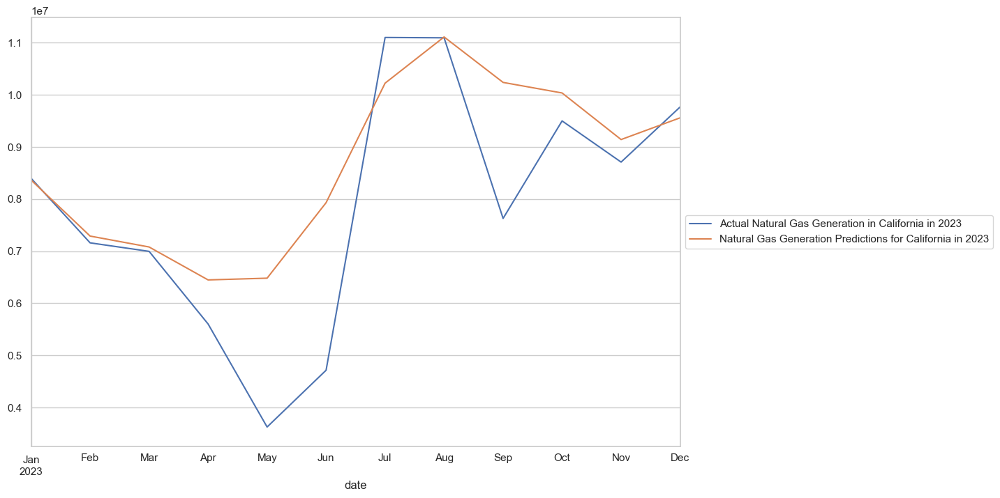

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_gas_cali_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Natural Gas Generation in California in 2023')
predictions_gas_cali_2023.plot(figsize=(12,8), legend=True, label = 'Natural Gas Generation Predictions for California in 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_gas_2023, mse_gas_2023, rmse_gas_2023, mape_gas_2023, r2_gas_2023 = calculo_metricas(df_test_gas_cali_2023, predictions_gas_cali_2023)
print("Mean Absolute Error (MAE):", mae_gas_2023)
print("Mean Squared Error (MSE):", mse_gas_2023)
print("Root Mean Squared Error (RMSE):", rmse_gas_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_gas_2023)
print("R2 Score:", r2_gas_2023) 

Mean Absolute Error (MAE): 987199.5753601271
Mean Squared Error (MSE): 2278678259227.638
Root Mean Squared Error (RMSE): 1509529.1514997776
Mean Absolute Percentage Error (MAPE): 18.379174802304235
R2 Score: 0.5626864205170603


### Predicciones - Renewables

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_renewables_cali_2023 = df_renewables_cali_2023[df_renewables_cali_2023.index < '2023-01-01']
df_test_renewables_cali_2023 = df_renewables_cali_2023[df_renewables_cali_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_renewables_cali_2023 = sarimax_train(df_train_renewables_cali_2023)
predictions_renewables_cali_2023 = sarimax_predictions(start, end, df_test_renewables_cali_2023, results_renewables_cali_2023)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.85965D+01    |proj g|=  8.48750D+00

At iterate    5    f=  1.40152D+01    |proj g|=  4.96211D-02



At iterate   10    f=  1.39827D+01    |proj g|=  1.03119D-02

At iterate   15    f=  1.39757D+01    |proj g|=  1.08122D-02


 This problem is unconstrained.



At iterate   20    f=  1.39726D+01    |proj g|=  1.81290D-03

At iterate   25    f=  1.39640D+01    |proj g|=  2.91033D-02

At iterate   30    f=  1.39372D+01    |proj g|=  8.68097D-03

At iterate   35    f=  1.39360D+01    |proj g|=  2.05691D-03

At iterate   40    f=  1.39360D+01    |proj g|=  5.18080D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     43     57      1     0     0   5.564D-06   1.394D+01
  F =   13.935975457519374     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


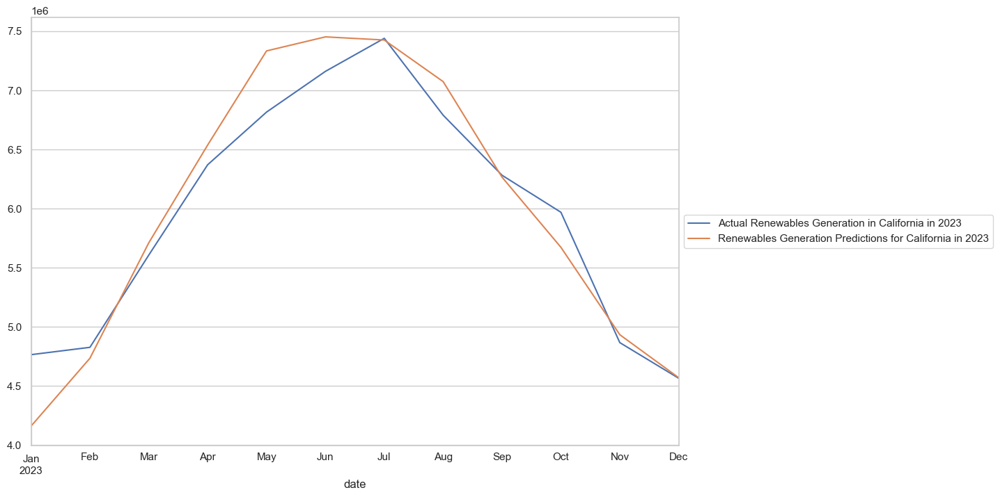

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_renewables_cali_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Renewables Generation in California in 2023')
predictions_renewables_cali_2023.plot(figsize=(12,8), legend=True, label = 'Renewables Generation Predictions for California in 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_renewables_2023, mse_renewables_2023, rmse_renewables_2023, mape_renewables_2023, r2_renewables_2023 = calculo_metricas(df_test_renewables_cali_2023, predictions_renewables_cali_2023)
print("Mean Absolute Error (MAE):", mae_renewables_2023)
print("Mean Squared Error (MSE):", mse_renewables_2023)
print("Root Mean Squared Error (RMSE):", rmse_renewables_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_renewables_2023)
print("R2 Score:", r2_renewables_2023) 

Mean Absolute Error (MAE): 204983.7714046638
Mean Squared Error (MSE): 78270124955.37471
Root Mean Squared Error (RMSE): 279767.98415003583
Mean Absolute Percentage Error (MAPE): 3.4857335742436177
R2 Score: 0.9169564086426019


### Predicciones - Nuclear

In [ ]:
# Obtenemos nuestro dataset de train y test
df_train_nuclear_cali_2023 = df_nuclear_cali_2023[df_nuclear_cali_2023.index < '2023-01-01']
df_test_nuclear_cali_2023 = df_nuclear_cali_2023[df_nuclear_cali_2023.index >= '2023-01-01']

# Entrenamos el modelo
start = '2023-01-01'
end = '2023-11-30'
results_nuclear_cali_2023 = sarimax_train(df_train_nuclear_cali_2023)
predictions_nuclear_cali_2023 = sarimax_predictions(start, end, df_test_nuclear_cali_2023, results_nuclear_cali_2023)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.48416D+01    |proj g|=  7.47507D-01



At iterate    5    f=  1.41714D+01    |proj g|=  4.59911D-02

At iterate   10    f=  1.41606D+01    |proj g|=  4.11059D-03


 This problem is unconstrained.



At iterate   15    f=  1.41513D+01    |proj g|=  1.92926D-02

At iterate   20    f=  1.41487D+01    |proj g|=  3.24104D-03

At iterate   25    f=  1.41472D+01    |proj g|=  1.89459D-03

At iterate   30    f=  1.41468D+01    |proj g|=  4.65908D-04

At iterate   35    f=  1.41468D+01    |proj g|=  1.26810D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     36     44      1     0     0   1.111D-04   1.415D+01
  F =   14.146765628419594     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


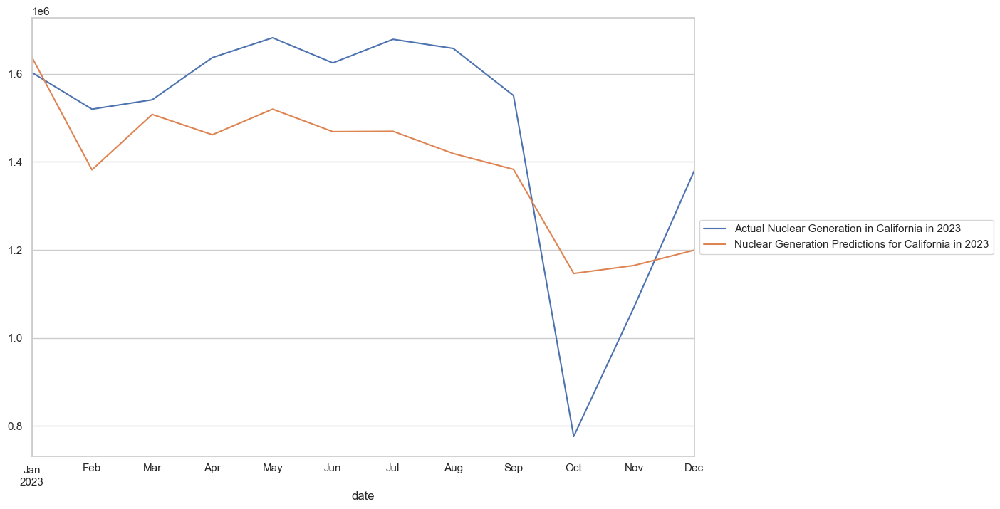

In [ ]:
# Graficamos los resultados para ver el ajuste del modelo 
fig, ax = plt.subplots(figsize=(12, 8))

df_test_nuclear_cali_2023['generation_mwh'].plot(figsize=(12,8), legend=True, label = 'Actual Nuclear Generation in California in 2023')
predictions_nuclear_cali_2023.plot(figsize=(12,8), legend=True, label = 'Nuclear Generation Predictions for California in 2023')

# Agregamos la leyenda a la derecha del gráfico
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Calculamos las métricas relevantes para evaluar las predicciones
mae_nuclear_2023, mse_nuclear_2023, rmse_nuclear_2023, mape_nuclear_2023, r2_nuclear_2023 = calculo_metricas(df_test_nuclear_cali_2023, predictions_nuclear_cali_2023)
print("Mean Absolute Error (MAE):", mae_nuclear_2023)
print("Mean Squared Error (MSE):", mse_nuclear_2023)
print("Root Mean Squared Error (RMSE):", rmse_nuclear_2023)
print("Mean Absolute Percentage Error (MAPE):", mape_nuclear_2023)
print("R2 Score:", r2_nuclear_2023) 

Mean Absolute Error (MAE): 163475.6774875156
Mean Squared Error (MSE): 34203832066.796295
Root Mean Squared Error (RMSE): 184942.78052088514
Mean Absolute Percentage Error (MAPE): 12.565971873739493
R2 Score: 0.5211818588671864
